# About 

This code example demonstrates training a model from scratch on **TPU-VM** using the ImageNet dataset, followed by fine-tuning the model on a downstream dataset using transfer learning techniques. It can be used as a reference code for developing and evaluating machine learning models on the ImageNet dataset.

**Part 1**

**ImageNet 2012** of `1000` classes was converted into **TFRecord** format and shared in two part, shown below. This notebook is a simple demonstration of how to load these dataset and start a training in `Keras`. We will use a pretrained weight free ImageNet model to train it first (or a custom model can be used).

- [ImageNet 1K TFrecords ILSVRC2012 - part 0](https://www.kaggle.com/datasets/hmendonca/imagenet-1k-tfrecords-ilsvrc2012-part-0)
- [ImageNet 1K TFrecords ILSVRC2012 - part 1](https://www.kaggle.com/datasets/hmendonca/imagenet-1k-tfrecords-ilsvrc2012-part-1)

**Part 2**

Next, we will use [130K dataset](https://www.kaggle.com/competitions/google-universal-image-embedding/discussion/340489) to fine tune the trained model (from **part 1**).


In [1]:
import os
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from PIL import Image
import matplotlib.pyplot as plt
from mpl_toolkits import axes_grid1
from IPython.display import clear_output

import warnings
warnings.simplefilter('ignore')
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import tensorflow as tf
from tensorflow import keras
clear_output()

# Device Config

ImageNet is big. It's better to use TPU.

In [2]:
try:  # detect TPUs
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver.connect()  
    strategy = tf.distribute.TPUStrategy(tpu)
    DEVICE = 'TPU'
except ValueError:  # detect GPUs
    strategy = tf.distribute.MirroredStrategy()
    DEVICE = 'GPU'
    
if DEVICE == "GPU":
    physical_devices = tf.config.list_physical_devices('GPU')
    print("Num GPUs Available: ", len(physical_devices))
    try: 
        tf.config.experimental.set_memory_growth(physical_devices[0], True)
        assert tf.config.experimental.get_memory_growth(physical_devices[0])
    except: # Invalid device or cannot modify virtual devices once initialized.
        pass 
    
    
AUTO  = tf.data.AUTOTUNE
REPLICAS = strategy.num_replicas_in_sync

print('REPLICAS           : ', REPLICAS)
print('TensorFlow Version : ', tf.__version__)
print('Eager Mode Status  : ', tf.executing_eagerly())
print('TF Cuda Built Test : ', tf.test.is_built_with_cuda)
print(
    'TF Device Detected : ', 
    'Running on TPU' if DEVICE == "TPU" else tf.test.gpu_device_name()
)

try:
    print('TF System Cuda V.  : ', tf.sysconfig.get_build_info()["cuda_version"])
    print('TF System CudNN V. : ', tf.sysconfig.get_build_info()["cudnn_version"])
except:
    pass

INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.


INFO:tensorflow:Initializing the TPU system: local


INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Found TPU system:


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


REPLICAS           :  8
TensorFlow Version :  2.12.0
Eager Mode Status  :  True
TF Cuda Built Test :  <function is_built_with_cuda at 0x7f70b3f13940>
TF Device Detected :  Running on TPU


# ImageNet (Part 1)

Read the image-net dataset in `tfrecord` format. To make it quick, we take only first part (out of two).

In [3]:
ROOT_DIR_PART_0 = "/kaggle/input/imagenet-1k-tfrecords-ilsvrc2012-part-0"
ROOT_DIR_PART_1 = "/kaggle/input/imagenet-1k-tfrecords-ilsvrc2012-part-1"
train_shard_suffix = 'train-*-of-01024'
val_shard_suffix   = 'validation-*-of-00128'

train_set_path = sorted(
    tf.io.gfile.glob(ROOT_DIR_PART_0 + f'/train/{train_shard_suffix}') +
    tf.io.gfile.glob(ROOT_DIR_PART_1 + f'/train/{train_shard_suffix}')
)
val_set_path = sorted(
    tf.io.gfile.glob(ROOT_DIR_PART_0 + f'/validation/{val_shard_suffix}')
)

len(train_set_path), len(val_set_path)

(500, 128)

In [4]:
batch_size = 128 * REPLICAS
image_shape = (224, 224)

train_set_len = 626000 + 655167  # 626000 for part 655167 or part 1: 655167
valid_set_len = 50000
train_step = train_set_len // batch_size
val_step = valid_set_len // batch_size

# ImageNet Dataloader

In [5]:
# # quick inspect
# raw_dataset = tf.data.TFRecordDataset(train_set_path[0])
# for raw_record in raw_dataset.take(1):
#     example = tf.train.Example()
#     example.ParseFromString(raw_record.numpy())
#     print(example)
#     break

In [6]:
def deserialization_fn(serialized_example):
    parsed_example = tf.io.parse_single_example(
        serialized_example,
        features={
            'image/encoded': tf.io.FixedLenFeature([], tf.string),
            'image/class/label': tf.io.FixedLenFeature([], tf.int64),
        }
    )
    image = tf.image.decode_jpeg(parsed_example['image/encoded'], channels=3)
    image = tf.image.resize(image, image_shape)
    label = tf.cast(parsed_example['image/class/label'], tf.int64) - 1  # [0-999]
    return image, label

In [7]:
def tfrecords_loader(files_path, shuffle=False):
    datasets = tf.data.Dataset.from_tensor_slices(files_path)
    datasets = datasets.shuffle(len(files_path)) if shuffle else datasets
    datasets = datasets.flat_map(tf.data.TFRecordDataset)
    datasets = datasets.map(deserialization_fn, num_parallel_calls=AUTO)
    return datasets

train_datasets = tfrecords_loader(train_set_path, shuffle=True)
valid_datasets = tfrecords_loader(val_set_path)
train_datasets, valid_datasets

(<_ParallelMapDataset element_spec=(TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>,
 <_ParallelMapDataset element_spec=(TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>)

**Augmentation**

In [8]:
keras_aug = keras.Sequential(
    [
        keras.layers.RandomFlip("horizontal"),
    ],
    name="tf2keras_augment",
)

In [9]:
train_dataset_encode = train_datasets.repeat()
train_dataset_encode = train_dataset_encode.batch(batch_size)
train_dataset_encode = train_dataset_encode.map(
    lambda x, y: (keras_aug(x), y), num_parallel_calls=AUTO
)
train_dataset_encode = train_dataset_encode.prefetch(AUTO)

valid_dataset_encode = valid_datasets.repeat()
valid_dataset_encode = valid_dataset_encode.batch(batch_size)
valid_dataset_encode = valid_dataset_encode.prefetch(AUTO)

In [10]:
x, y = next(iter(train_dataset_encode))
v, w = next(iter(valid_dataset_encode))
x.shape, y.shape, v.shape, w.shape

(TensorShape([1024, 224, 224, 3]),
 TensorShape([1024]),
 TensorShape([1024, 224, 224, 3]),
 TensorShape([1024]))

# Viz: ImageNet Training Samples

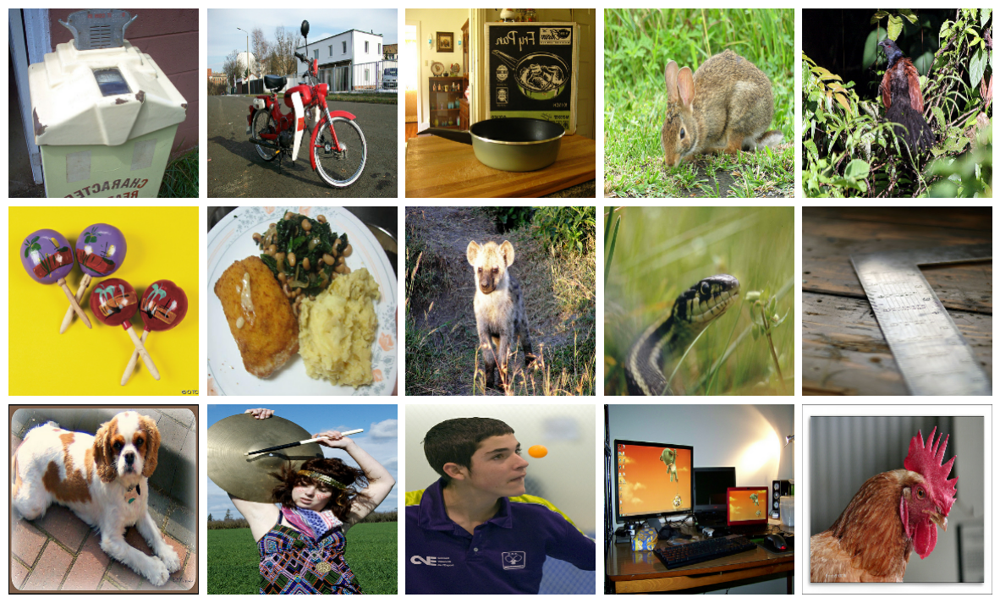

In [11]:
num_cols = 3
num_rows = 5
fig = plt.figure(figsize=(15, 15))
grid = axes_grid1.ImageGrid(fig, 111, nrows_ncols=(num_cols, num_rows), axes_pad=0.1)

for ax, im, label in zip(grid, x, y):
    ax.imshow(tf.cast(im, dtype=tf.uint8))
    ax.axis("off")

# Viz: ImageNet Validation Sample

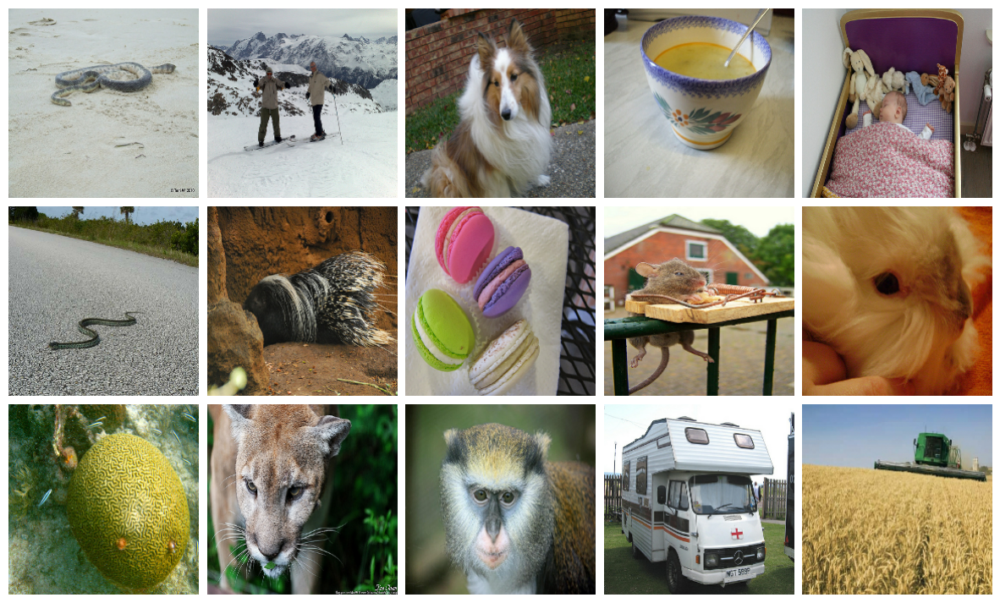

In [12]:
num_cols = 3
num_rows = 5
fig = plt.figure(figsize=(15, 15))
grid = axes_grid1.ImageGrid(fig, 111, nrows_ncols=(num_cols, num_rows), axes_pad=0.1)

for ax, im, label in zip(grid, v, w):
    ax.imshow(tf.cast(im, dtype=tf.uint8))
    ax.axis("off")

# Model

We intentionally use pre-built ImageNet mdoel without pre-trained weight for ImageNet dataset.

In [13]:
with strategy.scope():
    eff_model = keras.applications.EfficientNetB0(
        include_top=True,
        weights=None,
        input_tensor=None,
        input_shape=None,
        pooling=None,
        classes=1000,
        classifier_activation=None,
    )
    
    model = keras.Sequential([
        keras.layers.InputLayer(input_shape=(None, None, 3)),
        eff_model
    ])

model.compile(
    optimizer='adam', 
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

In [14]:
from tensorflow.keras import backend as K

trainable_count = np.sum(
    [K.count_params(w) for w in model.trainable_weights]
)
non_trainable_count = np.sum(
    [K.count_params(w) for w in model.non_trainable_weights]
)
print('Total params: {:,}'.format(trainable_count + non_trainable_count))
print('Trainable params: {:,}'.format(trainable_count))
print('Non-trainable params: {:,}'.format(non_trainable_count))

Total params: 5,330,571.0
Trainable params: 5,288,548
Non-trainable params: 42,023.0


In [15]:
history = model.fit(
    train_dataset_encode, 
    steps_per_epoch=train_step,
    epochs=5, 
    validation_data=valid_dataset_encode, 
    validation_steps=val_step
)

Epoch 1/5


   1/1251 [..............................] - ETA: 36:11:36 - loss: 6.9716 - accuracy: 0.0000e+00

   2/1251 [..............................] - ETA: 9:57 - loss: 6.9627 - accuracy: 9.7656e-04    

   3/1251 [..............................] - ETA: 10:12 - loss: 6.9665 - accuracy: 0.0013   

   4/1251 [..............................] - ETA: 9:54 - loss: 6.9718 - accuracy: 0.0012 

   5/1251 [..............................] - ETA: 10:29 - loss: 6.9692 - accuracy: 0.0014

   6/1251 [..............................] - ETA: 10:20 - loss: 6.9681 - accuracy: 0.0016

   7/1251 [..............................] - ETA: 10:13 - loss: 6.9657 - accuracy: 0.0015

   8/1251 [..............................] - ETA: 10:11 - loss: 6.9645 - accuracy: 0.0016

   9/1251 [..............................] - ETA: 10:23 - loss: 6.9635 - accuracy: 0.0017

  10/1251 [..............................] - ETA: 10:29 - loss: 6.9597 - accuracy: 0.0018

  11/1251 [..............................] - ETA: 10:38 - loss: 6.9544 - accuracy: 0.0017

  12/1251 [..............................] - ETA: 10:36 - loss: 6.9530 - accuracy: 0.0017

  13/1251 [..............................] - ETA: 10:42 - loss: 6.9513 - accuracy: 0.0018

  14/1251 [..............................] - ETA: 10:39 - loss: 6.9486 - accuracy: 0.0018

  15/1251 [..............................] - ETA: 10:48 - loss: 6.9462 - accuracy: 0.0018

  16/1251 [..............................] - ETA: 10:42 - loss: 6.9444 - accuracy: 0.0018

  17/1251 [..............................] - ETA: 10:50 - loss: 6.9412 - accuracy: 0.0018

  18/1251 [..............................] - ETA: 10:49 - loss: 6.9371 - accuracy: 0.0018

  19/1251 [..............................] - ETA: 10:52 - loss: 6.9342 - accuracy: 0.0017

  20/1251 [..............................] - ETA: 10:52 - loss: 6.9320 - accuracy: 0.0017

  21/1251 [..............................] - ETA: 10:57 - loss: 6.9291 - accuracy: 0.0016

  22/1251 [..............................] - ETA: 10:52 - loss: 6.9263 - accuracy: 0.0016

  23/1251 [..............................] - ETA: 10:46 - loss: 6.9219 - accuracy: 0.0016

  24/1251 [..............................] - ETA: 11:02 - loss: 6.9189 - accuracy: 0.0017

  25/1251 [..............................] - ETA: 11:20 - loss: 6.9168 - accuracy: 0.0018

  26/1251 [..............................] - ETA: 11:41 - loss: 6.9136 - accuracy: 0.0019

  27/1251 [..............................] - ETA: 12:10 - loss: 6.9120 - accuracy: 0.0018

  28/1251 [..............................] - ETA: 12:26 - loss: 6.9088 - accuracy: 0.0018

  29/1251 [..............................] - ETA: 12:48 - loss: 6.9065 - accuracy: 0.0019

  30/1251 [..............................] - ETA: 13:03 - loss: 6.9042 - accuracy: 0.0020

  31/1251 [..............................] - ETA: 13:20 - loss: 6.9022 - accuracy: 0.0020

  32/1251 [..............................] - ETA: 13:37 - loss: 6.8997 - accuracy: 0.0020

  33/1251 [..............................] - ETA: 13:50 - loss: 6.8981 - accuracy: 0.0021

  34/1251 [..............................] - ETA: 14:08 - loss: 6.8960 - accuracy: 0.0022

  35/1251 [..............................] - ETA: 14:12 - loss: 6.8934 - accuracy: 0.0023

  36/1251 [..............................] - ETA: 14:23 - loss: 6.8910 - accuracy: 0.0023

  37/1251 [..............................] - ETA: 14:38 - loss: 6.8893 - accuracy: 0.0023

  38/1251 [..............................] - ETA: 14:54 - loss: 6.8869 - accuracy: 0.0023

  39/1251 [..............................] - ETA: 15:00 - loss: 6.8846 - accuracy: 0.0023

  40/1251 [..............................] - ETA: 15:13 - loss: 6.8826 - accuracy: 0.0024

  41/1251 [..............................] - ETA: 15:15 - loss: 6.8801 - accuracy: 0.0024

  42/1251 [>.............................] - ETA: 15:24 - loss: 6.8774 - accuracy: 0.0024

  43/1251 [>.............................] - ETA: 15:28 - loss: 6.8748 - accuracy: 0.0024

  44/1251 [>.............................] - ETA: 15:32 - loss: 6.8722 - accuracy: 0.0025

  45/1251 [>.............................] - ETA: 15:39 - loss: 6.8699 - accuracy: 0.0025

  46/1251 [>.............................] - ETA: 15:47 - loss: 6.8678 - accuracy: 0.0025

  47/1251 [>.............................] - ETA: 15:58 - loss: 6.8653 - accuracy: 0.0025

  48/1251 [>.............................] - ETA: 16:02 - loss: 6.8630 - accuracy: 0.0025

  49/1251 [>.............................] - ETA: 16:09 - loss: 6.8605 - accuracy: 0.0026

  50/1251 [>.............................] - ETA: 16:12 - loss: 6.8590 - accuracy: 0.0026

  51/1251 [>.............................] - ETA: 16:16 - loss: 6.8567 - accuracy: 0.0026

  52/1251 [>.............................] - ETA: 16:25 - loss: 6.8541 - accuracy: 0.0027

  53/1251 [>.............................] - ETA: 16:28 - loss: 6.8515 - accuracy: 0.0028

  54/1251 [>.............................] - ETA: 16:35 - loss: 6.8490 - accuracy: 0.0028

  55/1251 [>.............................] - ETA: 16:39 - loss: 6.8464 - accuracy: 0.0028

  56/1251 [>.............................] - ETA: 16:42 - loss: 6.8442 - accuracy: 0.0028

  57/1251 [>.............................] - ETA: 16:50 - loss: 6.8416 - accuracy: 0.0028

  58/1251 [>.............................] - ETA: 16:53 - loss: 6.8392 - accuracy: 0.0028

  59/1251 [>.............................] - ETA: 16:54 - loss: 6.8375 - accuracy: 0.0028

  60/1251 [>.............................] - ETA: 16:56 - loss: 6.8350 - accuracy: 0.0028

  61/1251 [>.............................] - ETA: 16:58 - loss: 6.8334 - accuracy: 0.0028

  62/1251 [>.............................] - ETA: 17:05 - loss: 6.8311 - accuracy: 0.0028

  63/1251 [>.............................] - ETA: 17:09 - loss: 6.8287 - accuracy: 0.0029

  64/1251 [>.............................] - ETA: 17:13 - loss: 6.8263 - accuracy: 0.0029

  65/1251 [>.............................] - ETA: 17:18 - loss: 6.8241 - accuracy: 0.0029

  66/1251 [>.............................] - ETA: 17:25 - loss: 6.8217 - accuracy: 0.0030

  67/1251 [>.............................] - ETA: 17:27 - loss: 6.8190 - accuracy: 0.0030

  68/1251 [>.............................] - ETA: 17:31 - loss: 6.8166 - accuracy: 0.0031

  69/1251 [>.............................] - ETA: 17:32 - loss: 6.8140 - accuracy: 0.0031

  70/1251 [>.............................] - ETA: 17:34 - loss: 6.8121 - accuracy: 0.0031

  71/1251 [>.............................] - ETA: 17:38 - loss: 6.8095 - accuracy: 0.0031

  72/1251 [>.............................] - ETA: 17:40 - loss: 6.8063 - accuracy: 0.0032

  73/1251 [>.............................] - ETA: 17:42 - loss: 6.8038 - accuracy: 0.0032

  74/1251 [>.............................] - ETA: 17:41 - loss: 6.8005 - accuracy: 0.0032

  75/1251 [>.............................] - ETA: 17:43 - loss: 6.7975 - accuracy: 0.0033

  76/1251 [>.............................] - ETA: 17:49 - loss: 6.7946 - accuracy: 0.0033

  77/1251 [>.............................] - ETA: 17:49 - loss: 6.7918 - accuracy: 0.0033

  78/1251 [>.............................] - ETA: 17:50 - loss: 6.7888 - accuracy: 0.0034

  79/1251 [>.............................] - ETA: 17:53 - loss: 6.7859 - accuracy: 0.0034

  80/1251 [>.............................] - ETA: 17:55 - loss: 6.7832 - accuracy: 0.0035

  81/1251 [>.............................] - ETA: 17:58 - loss: 6.7798 - accuracy: 0.0037

  82/1251 [>.............................] - ETA: 18:00 - loss: 6.7774 - accuracy: 0.0038

  83/1251 [>.............................] - ETA: 18:04 - loss: 6.7742 - accuracy: 0.0038

  84/1251 [=>............................] - ETA: 18:04 - loss: 6.7708 - accuracy: 0.0039

  85/1251 [=>............................] - ETA: 18:05 - loss: 6.7674 - accuracy: 0.0040

  86/1251 [=>............................] - ETA: 18:07 - loss: 6.7642 - accuracy: 0.0041

  87/1251 [=>............................] - ETA: 18:07 - loss: 6.7613 - accuracy: 0.0041

  88/1251 [=>............................] - ETA: 18:07 - loss: 6.7582 - accuracy: 0.0041

  89/1251 [=>............................] - ETA: 18:07 - loss: 6.7546 - accuracy: 0.0042

  90/1251 [=>............................] - ETA: 18:09 - loss: 6.7513 - accuracy: 0.0043

  91/1251 [=>............................] - ETA: 18:07 - loss: 6.7484 - accuracy: 0.0044

  92/1251 [=>............................] - ETA: 18:07 - loss: 6.7449 - accuracy: 0.0044

  93/1251 [=>............................] - ETA: 18:09 - loss: 6.7408 - accuracy: 0.0045

  94/1251 [=>............................] - ETA: 18:10 - loss: 6.7377 - accuracy: 0.0046

  95/1251 [=>............................] - ETA: 18:11 - loss: 6.7341 - accuracy: 0.0046

  96/1251 [=>............................] - ETA: 18:11 - loss: 6.7309 - accuracy: 0.0047

  97/1251 [=>............................] - ETA: 18:11 - loss: 6.7273 - accuracy: 0.0048

  98/1251 [=>............................] - ETA: 18:13 - loss: 6.7244 - accuracy: 0.0048

  99/1251 [=>............................] - ETA: 18:12 - loss: 6.7211 - accuracy: 0.0048

 100/1251 [=>............................] - ETA: 18:12 - loss: 6.7179 - accuracy: 0.0049

 101/1251 [=>............................] - ETA: 18:15 - loss: 6.7147 - accuracy: 0.0049

 102/1251 [=>............................] - ETA: 18:14 - loss: 6.7110 - accuracy: 0.0049

 103/1251 [=>............................] - ETA: 18:16 - loss: 6.7075 - accuracy: 0.0049

 104/1251 [=>............................] - ETA: 18:13 - loss: 6.7038 - accuracy: 0.0051

 105/1251 [=>............................] - ETA: 18:13 - loss: 6.7006 - accuracy: 0.0051

 106/1251 [=>............................] - ETA: 18:13 - loss: 6.6973 - accuracy: 0.0051

 107/1251 [=>............................] - ETA: 18:16 - loss: 6.6940 - accuracy: 0.0052

 108/1251 [=>............................] - ETA: 18:17 - loss: 6.6905 - accuracy: 0.0052

 109/1251 [=>............................] - ETA: 18:18 - loss: 6.6871 - accuracy: 0.0052

 110/1251 [=>............................] - ETA: 18:15 - loss: 6.6840 - accuracy: 0.0052

 111/1251 [=>............................] - ETA: 18:18 - loss: 6.6806 - accuracy: 0.0053

 112/1251 [=>............................] - ETA: 18:16 - loss: 6.6765 - accuracy: 0.0053

 113/1251 [=>............................] - ETA: 18:16 - loss: 6.6730 - accuracy: 0.0054

 114/1251 [=>............................] - ETA: 18:16 - loss: 6.6692 - accuracy: 0.0055

 115/1251 [=>............................] - ETA: 18:14 - loss: 6.6660 - accuracy: 0.0055

 116/1251 [=>............................] - ETA: 18:15 - loss: 6.6629 - accuracy: 0.0056

 117/1251 [=>............................] - ETA: 18:15 - loss: 6.6596 - accuracy: 0.0056

 118/1251 [=>............................] - ETA: 18:17 - loss: 6.6560 - accuracy: 0.0057

 119/1251 [=>............................] - ETA: 18:17 - loss: 6.6523 - accuracy: 0.0057

 120/1251 [=>............................] - ETA: 18:19 - loss: 6.6489 - accuracy: 0.0058

 121/1251 [=>............................] - ETA: 18:21 - loss: 6.6455 - accuracy: 0.0058

 122/1251 [=>............................] - ETA: 18:21 - loss: 6.6426 - accuracy: 0.0059

 123/1251 [=>............................] - ETA: 18:21 - loss: 6.6391 - accuracy: 0.0059

 124/1251 [=>............................] - ETA: 18:21 - loss: 6.6356 - accuracy: 0.0060

 125/1251 [=>............................] - ETA: 18:23 - loss: 6.6320 - accuracy: 0.0061

 126/1251 [==>...........................] - ETA: 18:22 - loss: 6.6288 - accuracy: 0.0061

 127/1251 [==>...........................] - ETA: 18:23 - loss: 6.6259 - accuracy: 0.0062

 128/1251 [==>...........................] - ETA: 18:21 - loss: 6.6229 - accuracy: 0.0062

 129/1251 [==>...........................] - ETA: 18:22 - loss: 6.6197 - accuracy: 0.0063

 130/1251 [==>...........................] - ETA: 18:23 - loss: 6.6162 - accuracy: 0.0064

 131/1251 [==>...........................] - ETA: 18:24 - loss: 6.6129 - accuracy: 0.0064

 132/1251 [==>...........................] - ETA: 18:22 - loss: 6.6090 - accuracy: 0.0066

 133/1251 [==>...........................] - ETA: 18:23 - loss: 6.6060 - accuracy: 0.0066

 134/1251 [==>...........................] - ETA: 18:24 - loss: 6.6028 - accuracy: 0.0066

 135/1251 [==>...........................] - ETA: 18:23 - loss: 6.5996 - accuracy: 0.0067

 136/1251 [==>...........................] - ETA: 18:25 - loss: 6.5962 - accuracy: 0.0067

 137/1251 [==>...........................] - ETA: 18:24 - loss: 6.5934 - accuracy: 0.0068

 138/1251 [==>...........................] - ETA: 18:24 - loss: 6.5908 - accuracy: 0.0068

 139/1251 [==>...........................] - ETA: 18:26 - loss: 6.5876 - accuracy: 0.0069

 140/1251 [==>...........................] - ETA: 18:26 - loss: 6.5844 - accuracy: 0.0069

 141/1251 [==>...........................] - ETA: 18:24 - loss: 6.5816 - accuracy: 0.0070

 142/1251 [==>...........................] - ETA: 18:24 - loss: 6.5787 - accuracy: 0.0070

 143/1251 [==>...........................] - ETA: 18:23 - loss: 6.5757 - accuracy: 0.0071

 144/1251 [==>...........................] - ETA: 18:24 - loss: 6.5729 - accuracy: 0.0072

 145/1251 [==>...........................] - ETA: 18:24 - loss: 6.5694 - accuracy: 0.0073

 146/1251 [==>...........................] - ETA: 18:21 - loss: 6.5671 - accuracy: 0.0073

 147/1251 [==>...........................] - ETA: 18:23 - loss: 6.5643 - accuracy: 0.0074

 148/1251 [==>...........................] - ETA: 18:25 - loss: 6.5611 - accuracy: 0.0074

 149/1251 [==>...........................] - ETA: 18:24 - loss: 6.5578 - accuracy: 0.0075

 150/1251 [==>...........................] - ETA: 18:23 - loss: 6.5548 - accuracy: 0.0076

 151/1251 [==>...........................] - ETA: 18:22 - loss: 6.5517 - accuracy: 0.0077

 152/1251 [==>...........................] - ETA: 18:25 - loss: 6.5486 - accuracy: 0.0078

 153/1251 [==>...........................] - ETA: 18:23 - loss: 6.5453 - accuracy: 0.0078

 154/1251 [==>...........................] - ETA: 18:24 - loss: 6.5424 - accuracy: 0.0079

 155/1251 [==>...........................] - ETA: 18:21 - loss: 6.5390 - accuracy: 0.0079

 156/1251 [==>...........................] - ETA: 18:21 - loss: 6.5359 - accuracy: 0.0080

 157/1251 [==>...........................] - ETA: 18:20 - loss: 6.5330 - accuracy: 0.0080

 158/1251 [==>...........................] - ETA: 18:19 - loss: 6.5298 - accuracy: 0.0081

 159/1251 [==>...........................] - ETA: 18:18 - loss: 6.5271 - accuracy: 0.0081

 160/1251 [==>...........................] - ETA: 18:16 - loss: 6.5242 - accuracy: 0.0082

 161/1251 [==>...........................] - ETA: 18:16 - loss: 6.5214 - accuracy: 0.0082

 162/1251 [==>...........................] - ETA: 18:16 - loss: 6.5183 - accuracy: 0.0083

 163/1251 [==>...........................] - ETA: 18:15 - loss: 6.5151 - accuracy: 0.0083

 164/1251 [==>...........................] - ETA: 18:15 - loss: 6.5120 - accuracy: 0.0084

 165/1251 [==>...........................] - ETA: 18:14 - loss: 6.5096 - accuracy: 0.0084

 166/1251 [==>...........................] - ETA: 18:14 - loss: 6.5072 - accuracy: 0.0085

 167/1251 [===>..........................] - ETA: 18:14 - loss: 6.5045 - accuracy: 0.0086

 168/1251 [===>..........................] - ETA: 18:13 - loss: 6.5016 - accuracy: 0.0087

 169/1251 [===>..........................] - ETA: 18:11 - loss: 6.4985 - accuracy: 0.0088

 170/1251 [===>..........................] - ETA: 18:11 - loss: 6.4957 - accuracy: 0.0089

 171/1251 [===>..........................] - ETA: 18:10 - loss: 6.4932 - accuracy: 0.0089

 172/1251 [===>..........................] - ETA: 18:10 - loss: 6.4903 - accuracy: 0.0090

 173/1251 [===>..........................] - ETA: 18:09 - loss: 6.4872 - accuracy: 0.0091

 174/1251 [===>..........................] - ETA: 18:09 - loss: 6.4844 - accuracy: 0.0092

 175/1251 [===>..........................] - ETA: 18:09 - loss: 6.4815 - accuracy: 0.0093

 176/1251 [===>..........................] - ETA: 18:10 - loss: 6.4786 - accuracy: 0.0093

 177/1251 [===>..........................] - ETA: 18:08 - loss: 6.4757 - accuracy: 0.0094

 178/1251 [===>..........................] - ETA: 18:08 - loss: 6.4732 - accuracy: 0.0094

 179/1251 [===>..........................] - ETA: 18:07 - loss: 6.4703 - accuracy: 0.0094

 180/1251 [===>..........................] - ETA: 18:06 - loss: 6.4677 - accuracy: 0.0095

 181/1251 [===>..........................] - ETA: 18:05 - loss: 6.4648 - accuracy: 0.0095

 182/1251 [===>..........................] - ETA: 18:05 - loss: 6.4617 - accuracy: 0.0096

 183/1251 [===>..........................] - ETA: 18:04 - loss: 6.4590 - accuracy: 0.0097

 184/1251 [===>..........................] - ETA: 18:02 - loss: 6.4561 - accuracy: 0.0097

 185/1251 [===>..........................] - ETA: 18:02 - loss: 6.4530 - accuracy: 0.0098

 186/1251 [===>..........................] - ETA: 18:01 - loss: 6.4501 - accuracy: 0.0099

 187/1251 [===>..........................] - ETA: 18:01 - loss: 6.4471 - accuracy: 0.0100

 188/1251 [===>..........................] - ETA: 17:59 - loss: 6.4444 - accuracy: 0.0100

 189/1251 [===>..........................] - ETA: 18:00 - loss: 6.4416 - accuracy: 0.0101

 190/1251 [===>..........................] - ETA: 17:59 - loss: 6.4387 - accuracy: 0.0102

 191/1251 [===>..........................] - ETA: 17:58 - loss: 6.4363 - accuracy: 0.0103

 192/1251 [===>..........................] - ETA: 17:59 - loss: 6.4337 - accuracy: 0.0103

 193/1251 [===>..........................] - ETA: 17:58 - loss: 6.4310 - accuracy: 0.0104

 194/1251 [===>..........................] - ETA: 17:57 - loss: 6.4282 - accuracy: 0.0104

 195/1251 [===>..........................] - ETA: 17:56 - loss: 6.4254 - accuracy: 0.0105

 196/1251 [===>..........................] - ETA: 17:55 - loss: 6.4225 - accuracy: 0.0105

 197/1251 [===>..........................] - ETA: 17:54 - loss: 6.4198 - accuracy: 0.0107

 198/1251 [===>..........................] - ETA: 17:54 - loss: 6.4168 - accuracy: 0.0108

 199/1251 [===>..........................] - ETA: 17:55 - loss: 6.4141 - accuracy: 0.0108

 200/1251 [===>..........................] - ETA: 17:54 - loss: 6.4115 - accuracy: 0.0109

 201/1251 [===>..........................] - ETA: 17:52 - loss: 6.4087 - accuracy: 0.0110

 202/1251 [===>..........................] - ETA: 17:52 - loss: 6.4059 - accuracy: 0.0111

 203/1251 [===>..........................] - ETA: 17:50 - loss: 6.4026 - accuracy: 0.0112

 204/1251 [===>..........................] - ETA: 17:51 - loss: 6.3999 - accuracy: 0.0112

 205/1251 [===>..........................] - ETA: 17:49 - loss: 6.3972 - accuracy: 0.0113

 206/1251 [===>..........................] - ETA: 17:48 - loss: 6.3941 - accuracy: 0.0113

 207/1251 [===>..........................] - ETA: 17:47 - loss: 6.3913 - accuracy: 0.0114

 208/1251 [===>..........................] - ETA: 17:46 - loss: 6.3885 - accuracy: 0.0115

 209/1251 [====>.........................] - ETA: 17:46 - loss: 6.3856 - accuracy: 0.0115

 210/1251 [====>.........................] - ETA: 17:45 - loss: 6.3829 - accuracy: 0.0117

 211/1251 [====>.........................] - ETA: 17:44 - loss: 6.3801 - accuracy: 0.0118

 212/1251 [====>.........................] - ETA: 17:44 - loss: 6.3778 - accuracy: 0.0118

 213/1251 [====>.........................] - ETA: 17:44 - loss: 6.3752 - accuracy: 0.0119

 214/1251 [====>.........................] - ETA: 17:42 - loss: 6.3724 - accuracy: 0.0120

 215/1251 [====>.........................] - ETA: 17:41 - loss: 6.3697 - accuracy: 0.0120

 216/1251 [====>.........................] - ETA: 17:41 - loss: 6.3669 - accuracy: 0.0120

 217/1251 [====>.........................] - ETA: 17:40 - loss: 6.3642 - accuracy: 0.0121

 218/1251 [====>.........................] - ETA: 17:40 - loss: 6.3617 - accuracy: 0.0122

 219/1251 [====>.........................] - ETA: 17:38 - loss: 6.3589 - accuracy: 0.0123

 220/1251 [====>.........................] - ETA: 17:39 - loss: 6.3560 - accuracy: 0.0123

 221/1251 [====>.........................] - ETA: 17:39 - loss: 6.3530 - accuracy: 0.0124

 222/1251 [====>.........................] - ETA: 17:37 - loss: 6.3500 - accuracy: 0.0126

 223/1251 [====>.........................] - ETA: 17:37 - loss: 6.3474 - accuracy: 0.0126

 224/1251 [====>.........................] - ETA: 17:35 - loss: 6.3447 - accuracy: 0.0127

 225/1251 [====>.........................] - ETA: 17:34 - loss: 6.3419 - accuracy: 0.0128

 226/1251 [====>.........................] - ETA: 17:33 - loss: 6.3390 - accuracy: 0.0129

 227/1251 [====>.........................] - ETA: 17:32 - loss: 6.3365 - accuracy: 0.0130

 228/1251 [====>.........................] - ETA: 17:32 - loss: 6.3340 - accuracy: 0.0131

 229/1251 [====>.........................] - ETA: 17:32 - loss: 6.3313 - accuracy: 0.0131

 230/1251 [====>.........................] - ETA: 17:31 - loss: 6.3283 - accuracy: 0.0133

 231/1251 [====>.........................] - ETA: 17:31 - loss: 6.3261 - accuracy: 0.0133

 232/1251 [====>.........................] - ETA: 17:29 - loss: 6.3235 - accuracy: 0.0134

 233/1251 [====>.........................] - ETA: 17:29 - loss: 6.3205 - accuracy: 0.0136

 234/1251 [====>.........................] - ETA: 17:28 - loss: 6.3178 - accuracy: 0.0137

 235/1251 [====>.........................] - ETA: 17:27 - loss: 6.3152 - accuracy: 0.0138

 236/1251 [====>.........................] - ETA: 17:27 - loss: 6.3125 - accuracy: 0.0138

 237/1251 [====>.........................] - ETA: 17:26 - loss: 6.3099 - accuracy: 0.0140

 238/1251 [====>.........................] - ETA: 17:24 - loss: 6.3072 - accuracy: 0.0141

 239/1251 [====>.........................] - ETA: 17:23 - loss: 6.3045 - accuracy: 0.0142

 240/1251 [====>.........................] - ETA: 17:23 - loss: 6.3020 - accuracy: 0.0142

 241/1251 [====>.........................] - ETA: 17:21 - loss: 6.2991 - accuracy: 0.0144

 242/1251 [====>.........................] - ETA: 17:20 - loss: 6.2964 - accuracy: 0.0145

 243/1251 [====>.........................] - ETA: 17:19 - loss: 6.2938 - accuracy: 0.0146

 244/1251 [====>.........................] - ETA: 17:18 - loss: 6.2914 - accuracy: 0.0146

 245/1251 [====>.........................] - ETA: 17:17 - loss: 6.2888 - accuracy: 0.0147

 246/1251 [====>.........................] - ETA: 17:17 - loss: 6.2861 - accuracy: 0.0148

 247/1251 [====>.........................] - ETA: 17:16 - loss: 6.2833 - accuracy: 0.0149

 248/1251 [====>.........................] - ETA: 17:16 - loss: 6.2807 - accuracy: 0.0150

 249/1251 [====>.........................] - ETA: 17:14 - loss: 6.2781 - accuracy: 0.0151

 250/1251 [====>.........................] - ETA: 17:14 - loss: 6.2754 - accuracy: 0.0153

 251/1251 [=====>........................] - ETA: 17:12 - loss: 6.2730 - accuracy: 0.0154

 252/1251 [=====>........................] - ETA: 17:11 - loss: 6.2703 - accuracy: 0.0155

 253/1251 [=====>........................] - ETA: 17:10 - loss: 6.2677 - accuracy: 0.0155

 254/1251 [=====>........................] - ETA: 17:09 - loss: 6.2653 - accuracy: 0.0156

 255/1251 [=====>........................] - ETA: 17:09 - loss: 6.2627 - accuracy: 0.0157

 256/1251 [=====>........................] - ETA: 17:07 - loss: 6.2601 - accuracy: 0.0158

 257/1251 [=====>........................] - ETA: 17:06 - loss: 6.2573 - accuracy: 0.0159

 258/1251 [=====>........................] - ETA: 17:05 - loss: 6.2545 - accuracy: 0.0160

 259/1251 [=====>........................] - ETA: 17:05 - loss: 6.2517 - accuracy: 0.0160

 260/1251 [=====>........................] - ETA: 17:04 - loss: 6.2492 - accuracy: 0.0161

 261/1251 [=====>........................] - ETA: 17:03 - loss: 6.2465 - accuracy: 0.0162

 262/1251 [=====>........................] - ETA: 17:02 - loss: 6.2438 - accuracy: 0.0163

 263/1251 [=====>........................] - ETA: 17:01 - loss: 6.2411 - accuracy: 0.0165

 264/1251 [=====>........................] - ETA: 17:00 - loss: 6.2386 - accuracy: 0.0166

 265/1251 [=====>........................] - ETA: 16:59 - loss: 6.2359 - accuracy: 0.0167

 266/1251 [=====>........................] - ETA: 16:58 - loss: 6.2336 - accuracy: 0.0168

 267/1251 [=====>........................] - ETA: 16:56 - loss: 6.2310 - accuracy: 0.0169

 268/1251 [=====>........................] - ETA: 16:56 - loss: 6.2283 - accuracy: 0.0169

 269/1251 [=====>........................] - ETA: 16:55 - loss: 6.2254 - accuracy: 0.0170

 270/1251 [=====>........................] - ETA: 16:54 - loss: 6.2225 - accuracy: 0.0171

 271/1251 [=====>........................] - ETA: 16:53 - loss: 6.2198 - accuracy: 0.0172

 272/1251 [=====>........................] - ETA: 16:51 - loss: 6.2172 - accuracy: 0.0173

 273/1251 [=====>........................] - ETA: 16:52 - loss: 6.2150 - accuracy: 0.0174

 274/1251 [=====>........................] - ETA: 16:51 - loss: 6.2127 - accuracy: 0.0175

 275/1251 [=====>........................] - ETA: 16:50 - loss: 6.2104 - accuracy: 0.0176

 276/1251 [=====>........................] - ETA: 16:49 - loss: 6.2078 - accuracy: 0.0177

 277/1251 [=====>........................] - ETA: 16:48 - loss: 6.2053 - accuracy: 0.0178

 278/1251 [=====>........................] - ETA: 16:47 - loss: 6.2030 - accuracy: 0.0178

 279/1251 [=====>........................] - ETA: 16:46 - loss: 6.2004 - accuracy: 0.0180

 280/1251 [=====>........................] - ETA: 16:45 - loss: 6.1978 - accuracy: 0.0181

 281/1251 [=====>........................] - ETA: 16:45 - loss: 6.1956 - accuracy: 0.0182

 282/1251 [=====>........................] - ETA: 16:43 - loss: 6.1928 - accuracy: 0.0183

 283/1251 [=====>........................] - ETA: 16:43 - loss: 6.1904 - accuracy: 0.0184

 284/1251 [=====>........................] - ETA: 16:42 - loss: 6.1879 - accuracy: 0.0185

 285/1251 [=====>........................] - ETA: 16:40 - loss: 6.1855 - accuracy: 0.0186

 286/1251 [=====>........................] - ETA: 16:40 - loss: 6.1830 - accuracy: 0.0187

 287/1251 [=====>........................] - ETA: 16:39 - loss: 6.1805 - accuracy: 0.0188

 288/1251 [=====>........................] - ETA: 16:38 - loss: 6.1783 - accuracy: 0.0189

 289/1251 [=====>........................] - ETA: 16:37 - loss: 6.1759 - accuracy: 0.0190

 290/1251 [=====>........................] - ETA: 16:36 - loss: 6.1733 - accuracy: 0.0190

 291/1251 [=====>........................] - ETA: 16:35 - loss: 6.1709 - accuracy: 0.0191

 292/1251 [======>.......................] - ETA: 16:34 - loss: 6.1681 - accuracy: 0.0193

 293/1251 [======>.......................] - ETA: 16:33 - loss: 6.1654 - accuracy: 0.0194

 294/1251 [======>.......................] - ETA: 16:32 - loss: 6.1628 - accuracy: 0.0195

 295/1251 [======>.......................] - ETA: 16:31 - loss: 6.1601 - accuracy: 0.0197

 296/1251 [======>.......................] - ETA: 16:30 - loss: 6.1579 - accuracy: 0.0197

 297/1251 [======>.......................] - ETA: 16:29 - loss: 6.1552 - accuracy: 0.0198

 298/1251 [======>.......................] - ETA: 16:28 - loss: 6.1527 - accuracy: 0.0200

 299/1251 [======>.......................] - ETA: 16:27 - loss: 6.1502 - accuracy: 0.0201

 300/1251 [======>.......................] - ETA: 16:25 - loss: 6.1478 - accuracy: 0.0202

 301/1251 [======>.......................] - ETA: 16:24 - loss: 6.1456 - accuracy: 0.0203

 302/1251 [======>.......................] - ETA: 16:24 - loss: 6.1431 - accuracy: 0.0204

 303/1251 [======>.......................] - ETA: 16:23 - loss: 6.1403 - accuracy: 0.0205

 304/1251 [======>.......................] - ETA: 16:23 - loss: 6.1381 - accuracy: 0.0206

 305/1251 [======>.......................] - ETA: 16:22 - loss: 6.1358 - accuracy: 0.0207

 306/1251 [======>.......................] - ETA: 16:20 - loss: 6.1335 - accuracy: 0.0208

 307/1251 [======>.......................] - ETA: 16:19 - loss: 6.1313 - accuracy: 0.0208

 308/1251 [======>.......................] - ETA: 16:19 - loss: 6.1289 - accuracy: 0.0210

 309/1251 [======>.......................] - ETA: 16:18 - loss: 6.1265 - accuracy: 0.0211

 310/1251 [======>.......................] - ETA: 16:17 - loss: 6.1241 - accuracy: 0.0212

 311/1251 [======>.......................] - ETA: 16:16 - loss: 6.1220 - accuracy: 0.0213

 312/1251 [======>.......................] - ETA: 16:15 - loss: 6.1196 - accuracy: 0.0214

 313/1251 [======>.......................] - ETA: 16:14 - loss: 6.1171 - accuracy: 0.0215

 314/1251 [======>.......................] - ETA: 16:14 - loss: 6.1149 - accuracy: 0.0216

 315/1251 [======>.......................] - ETA: 16:14 - loss: 6.1127 - accuracy: 0.0217

 316/1251 [======>.......................] - ETA: 16:12 - loss: 6.1102 - accuracy: 0.0218

 317/1251 [======>.......................] - ETA: 16:11 - loss: 6.1077 - accuracy: 0.0220

 318/1251 [======>.......................] - ETA: 16:10 - loss: 6.1052 - accuracy: 0.0221

 319/1251 [======>.......................] - ETA: 16:09 - loss: 6.1023 - accuracy: 0.0222

 320/1251 [======>.......................] - ETA: 16:08 - loss: 6.1000 - accuracy: 0.0223

 321/1251 [======>.......................] - ETA: 16:07 - loss: 6.0976 - accuracy: 0.0225

 322/1251 [======>.......................] - ETA: 16:06 - loss: 6.0953 - accuracy: 0.0226

 323/1251 [======>.......................] - ETA: 16:05 - loss: 6.0929 - accuracy: 0.0226

 324/1251 [======>.......................] - ETA: 16:04 - loss: 6.0908 - accuracy: 0.0227

 325/1251 [======>.......................] - ETA: 16:04 - loss: 6.0883 - accuracy: 0.0229

 326/1251 [======>.......................] - ETA: 16:02 - loss: 6.0859 - accuracy: 0.0230

 327/1251 [======>.......................] - ETA: 16:01 - loss: 6.0837 - accuracy: 0.0231

 328/1251 [======>.......................] - ETA: 16:00 - loss: 6.0815 - accuracy: 0.0232

 329/1251 [======>.......................] - ETA: 15:59 - loss: 6.0792 - accuracy: 0.0232

 330/1251 [======>.......................] - ETA: 15:58 - loss: 6.0765 - accuracy: 0.0234

 331/1251 [======>.......................] - ETA: 15:57 - loss: 6.0741 - accuracy: 0.0235

 332/1251 [======>.......................] - ETA: 15:56 - loss: 6.0716 - accuracy: 0.0236

 333/1251 [======>.......................] - ETA: 15:55 - loss: 6.0691 - accuracy: 0.0237

 334/1251 [=======>......................] - ETA: 15:54 - loss: 6.0666 - accuracy: 0.0239

 335/1251 [=======>......................] - ETA: 15:53 - loss: 6.0644 - accuracy: 0.0239

 336/1251 [=======>......................] - ETA: 15:52 - loss: 6.0619 - accuracy: 0.0240

 337/1251 [=======>......................] - ETA: 15:51 - loss: 6.0594 - accuracy: 0.0242

 338/1251 [=======>......................] - ETA: 15:50 - loss: 6.0570 - accuracy: 0.0243

 339/1251 [=======>......................] - ETA: 15:49 - loss: 6.0548 - accuracy: 0.0244

 340/1251 [=======>......................] - ETA: 15:48 - loss: 6.0526 - accuracy: 0.0245

 341/1251 [=======>......................] - ETA: 15:47 - loss: 6.0502 - accuracy: 0.0246

 342/1251 [=======>......................] - ETA: 15:47 - loss: 6.0477 - accuracy: 0.0247

 343/1251 [=======>......................] - ETA: 15:47 - loss: 6.0453 - accuracy: 0.0248

 344/1251 [=======>......................] - ETA: 15:46 - loss: 6.0429 - accuracy: 0.0249

 345/1251 [=======>......................] - ETA: 15:45 - loss: 6.0407 - accuracy: 0.0251

 346/1251 [=======>......................] - ETA: 15:44 - loss: 6.0382 - accuracy: 0.0252

 347/1251 [=======>......................] - ETA: 15:42 - loss: 6.0361 - accuracy: 0.0253

 348/1251 [=======>......................] - ETA: 15:41 - loss: 6.0339 - accuracy: 0.0254

 349/1251 [=======>......................] - ETA: 15:41 - loss: 6.0315 - accuracy: 0.0255

 350/1251 [=======>......................] - ETA: 15:40 - loss: 6.0291 - accuracy: 0.0256

 351/1251 [=======>......................] - ETA: 15:39 - loss: 6.0269 - accuracy: 0.0257

 352/1251 [=======>......................] - ETA: 15:38 - loss: 6.0247 - accuracy: 0.0258

 353/1251 [=======>......................] - ETA: 15:37 - loss: 6.0223 - accuracy: 0.0259

 354/1251 [=======>......................] - ETA: 15:36 - loss: 6.0198 - accuracy: 0.0261

 355/1251 [=======>......................] - ETA: 15:35 - loss: 6.0176 - accuracy: 0.0262

 356/1251 [=======>......................] - ETA: 15:34 - loss: 6.0153 - accuracy: 0.0264

 357/1251 [=======>......................] - ETA: 15:33 - loss: 6.0131 - accuracy: 0.0264

 358/1251 [=======>......................] - ETA: 15:32 - loss: 6.0109 - accuracy: 0.0266

 359/1251 [=======>......................] - ETA: 15:32 - loss: 6.0089 - accuracy: 0.0267

 360/1251 [=======>......................] - ETA: 15:31 - loss: 6.0064 - accuracy: 0.0268

 361/1251 [=======>......................] - ETA: 15:30 - loss: 6.0041 - accuracy: 0.0269

 362/1251 [=======>......................] - ETA: 15:29 - loss: 6.0020 - accuracy: 0.0270

 363/1251 [=======>......................] - ETA: 15:27 - loss: 5.9998 - accuracy: 0.0271

 364/1251 [=======>......................] - ETA: 15:26 - loss: 5.9976 - accuracy: 0.0273

 365/1251 [=======>......................] - ETA: 15:25 - loss: 5.9955 - accuracy: 0.0274

 366/1251 [=======>......................] - ETA: 15:24 - loss: 5.9933 - accuracy: 0.0275

 367/1251 [=======>......................] - ETA: 15:23 - loss: 5.9909 - accuracy: 0.0277

 368/1251 [=======>......................] - ETA: 15:22 - loss: 5.9887 - accuracy: 0.0278

 369/1251 [=======>......................] - ETA: 15:21 - loss: 5.9866 - accuracy: 0.0279

 370/1251 [=======>......................] - ETA: 15:20 - loss: 5.9844 - accuracy: 0.0280

 371/1251 [=======>......................] - ETA: 15:19 - loss: 5.9823 - accuracy: 0.0281

 372/1251 [=======>......................] - ETA: 15:19 - loss: 5.9799 - accuracy: 0.0282

 373/1251 [=======>......................] - ETA: 15:17 - loss: 5.9776 - accuracy: 0.0283

 374/1251 [=======>......................] - ETA: 15:17 - loss: 5.9755 - accuracy: 0.0285

 375/1251 [=======>......................] - ETA: 15:16 - loss: 5.9733 - accuracy: 0.0286

 376/1251 [========>.....................] - ETA: 15:15 - loss: 5.9709 - accuracy: 0.0288

 377/1251 [========>.....................] - ETA: 15:14 - loss: 5.9687 - accuracy: 0.0289

 378/1251 [========>.....................] - ETA: 15:13 - loss: 5.9663 - accuracy: 0.0290

 379/1251 [========>.....................] - ETA: 15:11 - loss: 5.9642 - accuracy: 0.0291

 380/1251 [========>.....................] - ETA: 15:11 - loss: 5.9622 - accuracy: 0.0292

 381/1251 [========>.....................] - ETA: 15:09 - loss: 5.9600 - accuracy: 0.0293

 382/1251 [========>.....................] - ETA: 15:08 - loss: 5.9581 - accuracy: 0.0295

 383/1251 [========>.....................] - ETA: 15:07 - loss: 5.9558 - accuracy: 0.0296

 384/1251 [========>.....................] - ETA: 15:06 - loss: 5.9539 - accuracy: 0.0297

 385/1251 [========>.....................] - ETA: 15:06 - loss: 5.9519 - accuracy: 0.0298

 386/1251 [========>.....................] - ETA: 15:05 - loss: 5.9496 - accuracy: 0.0299

 387/1251 [========>.....................] - ETA: 15:04 - loss: 5.9475 - accuracy: 0.0300

 388/1251 [========>.....................] - ETA: 15:03 - loss: 5.9452 - accuracy: 0.0302

 389/1251 [========>.....................] - ETA: 15:02 - loss: 5.9431 - accuracy: 0.0303

 390/1251 [========>.....................] - ETA: 15:01 - loss: 5.9409 - accuracy: 0.0304

 391/1251 [========>.....................] - ETA: 15:00 - loss: 5.9388 - accuracy: 0.0306

 392/1251 [========>.....................] - ETA: 14:58 - loss: 5.9367 - accuracy: 0.0307

 393/1251 [========>.....................] - ETA: 14:57 - loss: 5.9344 - accuracy: 0.0308

 394/1251 [========>.....................] - ETA: 14:56 - loss: 5.9324 - accuracy: 0.0309

 395/1251 [========>.....................] - ETA: 14:55 - loss: 5.9304 - accuracy: 0.0310

 396/1251 [========>.....................] - ETA: 14:54 - loss: 5.9283 - accuracy: 0.0311

 397/1251 [========>.....................] - ETA: 14:54 - loss: 5.9261 - accuracy: 0.0312

 398/1251 [========>.....................] - ETA: 14:53 - loss: 5.9239 - accuracy: 0.0314

 399/1251 [========>.....................] - ETA: 14:52 - loss: 5.9216 - accuracy: 0.0315

 400/1251 [========>.....................] - ETA: 14:51 - loss: 5.9194 - accuracy: 0.0316

 401/1251 [========>.....................] - ETA: 14:50 - loss: 5.9172 - accuracy: 0.0318

 402/1251 [========>.....................] - ETA: 14:49 - loss: 5.9151 - accuracy: 0.0319

 403/1251 [========>.....................] - ETA: 14:48 - loss: 5.9129 - accuracy: 0.0320

 404/1251 [========>.....................] - ETA: 14:47 - loss: 5.9106 - accuracy: 0.0322

 405/1251 [========>.....................] - ETA: 14:46 - loss: 5.9085 - accuracy: 0.0323

 406/1251 [========>.....................] - ETA: 14:45 - loss: 5.9064 - accuracy: 0.0324

 407/1251 [========>.....................] - ETA: 14:44 - loss: 5.9043 - accuracy: 0.0325

 408/1251 [========>.....................] - ETA: 14:43 - loss: 5.9019 - accuracy: 0.0326

 409/1251 [========>.....................] - ETA: 14:42 - loss: 5.8996 - accuracy: 0.0327

 410/1251 [========>.....................] - ETA: 14:41 - loss: 5.8974 - accuracy: 0.0328

 411/1251 [========>.....................] - ETA: 14:40 - loss: 5.8952 - accuracy: 0.0330

 412/1251 [========>.....................] - ETA: 14:39 - loss: 5.8932 - accuracy: 0.0331

 413/1251 [========>.....................] - ETA: 14:39 - loss: 5.8911 - accuracy: 0.0332

 414/1251 [========>.....................] - ETA: 14:37 - loss: 5.8888 - accuracy: 0.0334

 415/1251 [========>.....................] - ETA: 14:37 - loss: 5.8867 - accuracy: 0.0335

 416/1251 [========>.....................] - ETA: 14:36 - loss: 5.8847 - accuracy: 0.0336

 417/1251 [=========>....................] - ETA: 14:35 - loss: 5.8827 - accuracy: 0.0338

 418/1251 [=========>....................] - ETA: 14:34 - loss: 5.8808 - accuracy: 0.0339

 419/1251 [=========>....................] - ETA: 14:34 - loss: 5.8788 - accuracy: 0.0340

 420/1251 [=========>....................] - ETA: 14:33 - loss: 5.8767 - accuracy: 0.0341

 421/1251 [=========>....................] - ETA: 14:32 - loss: 5.8747 - accuracy: 0.0342

 422/1251 [=========>....................] - ETA: 14:31 - loss: 5.8724 - accuracy: 0.0344

 423/1251 [=========>....................] - ETA: 14:31 - loss: 5.8701 - accuracy: 0.0345

 424/1251 [=========>....................] - ETA: 14:30 - loss: 5.8681 - accuracy: 0.0346

 425/1251 [=========>....................] - ETA: 14:29 - loss: 5.8659 - accuracy: 0.0347

 426/1251 [=========>....................] - ETA: 14:28 - loss: 5.8638 - accuracy: 0.0349

 427/1251 [=========>....................] - ETA: 14:27 - loss: 5.8617 - accuracy: 0.0350

 428/1251 [=========>....................] - ETA: 14:26 - loss: 5.8593 - accuracy: 0.0351

 429/1251 [=========>....................] - ETA: 14:25 - loss: 5.8573 - accuracy: 0.0353

 430/1251 [=========>....................] - ETA: 14:24 - loss: 5.8554 - accuracy: 0.0354

 431/1251 [=========>....................] - ETA: 14:23 - loss: 5.8532 - accuracy: 0.0355

 432/1251 [=========>....................] - ETA: 14:22 - loss: 5.8511 - accuracy: 0.0356

 433/1251 [=========>....................] - ETA: 14:21 - loss: 5.8492 - accuracy: 0.0357

 434/1251 [=========>....................] - ETA: 14:19 - loss: 5.8468 - accuracy: 0.0358

 435/1251 [=========>....................] - ETA: 14:18 - loss: 5.8448 - accuracy: 0.0360

 436/1251 [=========>....................] - ETA: 14:17 - loss: 5.8429 - accuracy: 0.0361

 437/1251 [=========>....................] - ETA: 14:15 - loss: 5.8410 - accuracy: 0.0362

 438/1251 [=========>....................] - ETA: 14:14 - loss: 5.8391 - accuracy: 0.0363

 439/1251 [=========>....................] - ETA: 14:13 - loss: 5.8371 - accuracy: 0.0364

 440/1251 [=========>....................] - ETA: 14:13 - loss: 5.8351 - accuracy: 0.0365

 441/1251 [=========>....................] - ETA: 14:12 - loss: 5.8332 - accuracy: 0.0366

 442/1251 [=========>....................] - ETA: 14:11 - loss: 5.8311 - accuracy: 0.0367

 443/1251 [=========>....................] - ETA: 14:10 - loss: 5.8292 - accuracy: 0.0368

 444/1251 [=========>....................] - ETA: 14:08 - loss: 5.8273 - accuracy: 0.0369

 445/1251 [=========>....................] - ETA: 14:08 - loss: 5.8254 - accuracy: 0.0370

 446/1251 [=========>....................] - ETA: 14:07 - loss: 5.8233 - accuracy: 0.0372

 447/1251 [=========>....................] - ETA: 14:06 - loss: 5.8214 - accuracy: 0.0373

 448/1251 [=========>....................] - ETA: 14:05 - loss: 5.8194 - accuracy: 0.0374

 449/1251 [=========>....................] - ETA: 14:04 - loss: 5.8176 - accuracy: 0.0375

 450/1251 [=========>....................] - ETA: 14:03 - loss: 5.8158 - accuracy: 0.0376

 451/1251 [=========>....................] - ETA: 14:02 - loss: 5.8137 - accuracy: 0.0377

 452/1251 [=========>....................] - ETA: 14:01 - loss: 5.8117 - accuracy: 0.0378

 453/1251 [=========>....................] - ETA: 14:00 - loss: 5.8096 - accuracy: 0.0380

 454/1251 [=========>....................] - ETA: 14:00 - loss: 5.8077 - accuracy: 0.0381

 455/1251 [=========>....................] - ETA: 13:59 - loss: 5.8056 - accuracy: 0.0382

 456/1251 [=========>....................] - ETA: 13:58 - loss: 5.8037 - accuracy: 0.0383

 457/1251 [=========>....................] - ETA: 13:57 - loss: 5.8016 - accuracy: 0.0384

 458/1251 [=========>....................] - ETA: 13:56 - loss: 5.7998 - accuracy: 0.0386

 459/1251 [==========>...................] - ETA: 13:55 - loss: 5.7977 - accuracy: 0.0387

 460/1251 [==========>...................] - ETA: 13:54 - loss: 5.7958 - accuracy: 0.0388

 461/1251 [==========>...................] - ETA: 13:54 - loss: 5.7939 - accuracy: 0.0389

 462/1251 [==========>...................] - ETA: 13:52 - loss: 5.7919 - accuracy: 0.0391

 463/1251 [==========>...................] - ETA: 13:51 - loss: 5.7900 - accuracy: 0.0392

 464/1251 [==========>...................] - ETA: 13:51 - loss: 5.7880 - accuracy: 0.0393

 465/1251 [==========>...................] - ETA: 13:50 - loss: 5.7862 - accuracy: 0.0394

 466/1251 [==========>...................] - ETA: 13:49 - loss: 5.7843 - accuracy: 0.0396

 467/1251 [==========>...................] - ETA: 13:48 - loss: 5.7823 - accuracy: 0.0397

 468/1251 [==========>...................] - ETA: 13:47 - loss: 5.7805 - accuracy: 0.0398

 469/1251 [==========>...................] - ETA: 13:46 - loss: 5.7784 - accuracy: 0.0399

 470/1251 [==========>...................] - ETA: 13:45 - loss: 5.7765 - accuracy: 0.0400

 471/1251 [==========>...................] - ETA: 13:44 - loss: 5.7745 - accuracy: 0.0402

 472/1251 [==========>...................] - ETA: 13:43 - loss: 5.7728 - accuracy: 0.0403

 473/1251 [==========>...................] - ETA: 13:42 - loss: 5.7709 - accuracy: 0.0404

 474/1251 [==========>...................] - ETA: 13:41 - loss: 5.7689 - accuracy: 0.0405

 475/1251 [==========>...................] - ETA: 13:40 - loss: 5.7672 - accuracy: 0.0406

 476/1251 [==========>...................] - ETA: 13:39 - loss: 5.7655 - accuracy: 0.0408

 477/1251 [==========>...................] - ETA: 13:38 - loss: 5.7637 - accuracy: 0.0409

 478/1251 [==========>...................] - ETA: 13:37 - loss: 5.7617 - accuracy: 0.0410

 479/1251 [==========>...................] - ETA: 13:36 - loss: 5.7599 - accuracy: 0.0412

 480/1251 [==========>...................] - ETA: 13:35 - loss: 5.7580 - accuracy: 0.0413

 481/1251 [==========>...................] - ETA: 13:34 - loss: 5.7560 - accuracy: 0.0414

 482/1251 [==========>...................] - ETA: 13:33 - loss: 5.7540 - accuracy: 0.0416

 483/1251 [==========>...................] - ETA: 13:32 - loss: 5.7521 - accuracy: 0.0417

 484/1251 [==========>...................] - ETA: 13:31 - loss: 5.7503 - accuracy: 0.0418

 485/1251 [==========>...................] - ETA: 13:30 - loss: 5.7484 - accuracy: 0.0419

 486/1251 [==========>...................] - ETA: 13:29 - loss: 5.7467 - accuracy: 0.0420

 487/1251 [==========>...................] - ETA: 13:28 - loss: 5.7450 - accuracy: 0.0421

 488/1251 [==========>...................] - ETA: 13:28 - loss: 5.7432 - accuracy: 0.0422

 489/1251 [==========>...................] - ETA: 13:27 - loss: 5.7414 - accuracy: 0.0423

 490/1251 [==========>...................] - ETA: 13:25 - loss: 5.7395 - accuracy: 0.0424

 491/1251 [==========>...................] - ETA: 13:25 - loss: 5.7377 - accuracy: 0.0425

 492/1251 [==========>...................] - ETA: 13:24 - loss: 5.7358 - accuracy: 0.0427

 493/1251 [==========>...................] - ETA: 13:23 - loss: 5.7339 - accuracy: 0.0428

 494/1251 [==========>...................] - ETA: 13:22 - loss: 5.7322 - accuracy: 0.0429

 495/1251 [==========>...................] - ETA: 13:21 - loss: 5.7304 - accuracy: 0.0430

 496/1251 [==========>...................] - ETA: 13:20 - loss: 5.7286 - accuracy: 0.0431

 497/1251 [==========>...................] - ETA: 13:19 - loss: 5.7269 - accuracy: 0.0432

 498/1251 [==========>...................] - ETA: 13:18 - loss: 5.7249 - accuracy: 0.0433

 499/1251 [==========>...................] - ETA: 13:17 - loss: 5.7229 - accuracy: 0.0435

 500/1251 [==========>...................] - ETA: 13:16 - loss: 5.7211 - accuracy: 0.0436

 501/1251 [===========>..................] - ETA: 13:14 - loss: 5.7192 - accuracy: 0.0437

 502/1251 [===========>..................] - ETA: 13:14 - loss: 5.7176 - accuracy: 0.0438

 503/1251 [===========>..................] - ETA: 13:13 - loss: 5.7157 - accuracy: 0.0439

 504/1251 [===========>..................] - ETA: 13:12 - loss: 5.7139 - accuracy: 0.0440

 505/1251 [===========>..................] - ETA: 13:11 - loss: 5.7121 - accuracy: 0.0441

 506/1251 [===========>..................] - ETA: 13:10 - loss: 5.7104 - accuracy: 0.0442

 507/1251 [===========>..................] - ETA: 13:09 - loss: 5.7086 - accuracy: 0.0443

 508/1251 [===========>..................] - ETA: 13:08 - loss: 5.7065 - accuracy: 0.0445

 509/1251 [===========>..................] - ETA: 13:08 - loss: 5.7046 - accuracy: 0.0446

 510/1251 [===========>..................] - ETA: 13:07 - loss: 5.7029 - accuracy: 0.0447

 511/1251 [===========>..................] - ETA: 13:06 - loss: 5.7009 - accuracy: 0.0448

 512/1251 [===========>..................] - ETA: 13:05 - loss: 5.6991 - accuracy: 0.0449

 513/1251 [===========>..................] - ETA: 13:04 - loss: 5.6973 - accuracy: 0.0450

 514/1251 [===========>..................] - ETA: 13:03 - loss: 5.6955 - accuracy: 0.0451

 515/1251 [===========>..................] - ETA: 13:02 - loss: 5.6937 - accuracy: 0.0453

 516/1251 [===========>..................] - ETA: 13:01 - loss: 5.6919 - accuracy: 0.0454

 517/1251 [===========>..................] - ETA: 13:00 - loss: 5.6898 - accuracy: 0.0456

 518/1251 [===========>..................] - ETA: 12:59 - loss: 5.6881 - accuracy: 0.0457

 519/1251 [===========>..................] - ETA: 12:58 - loss: 5.6864 - accuracy: 0.0457

 520/1251 [===========>..................] - ETA: 12:56 - loss: 5.6848 - accuracy: 0.0458

 521/1251 [===========>..................] - ETA: 12:56 - loss: 5.6831 - accuracy: 0.0459

 522/1251 [===========>..................] - ETA: 12:55 - loss: 5.6814 - accuracy: 0.0460

 523/1251 [===========>..................] - ETA: 12:54 - loss: 5.6797 - accuracy: 0.0461

 524/1251 [===========>..................] - ETA: 12:53 - loss: 5.6781 - accuracy: 0.0462

 525/1251 [===========>..................] - ETA: 12:52 - loss: 5.6764 - accuracy: 0.0464

 526/1251 [===========>..................] - ETA: 12:51 - loss: 5.6746 - accuracy: 0.0465

 527/1251 [===========>..................] - ETA: 12:50 - loss: 5.6729 - accuracy: 0.0466

 528/1251 [===========>..................] - ETA: 12:49 - loss: 5.6713 - accuracy: 0.0467

 529/1251 [===========>..................] - ETA: 12:48 - loss: 5.6697 - accuracy: 0.0468

 530/1251 [===========>..................] - ETA: 12:47 - loss: 5.6680 - accuracy: 0.0469

 531/1251 [===========>..................] - ETA: 12:46 - loss: 5.6660 - accuracy: 0.0470

 532/1251 [===========>..................] - ETA: 12:45 - loss: 5.6643 - accuracy: 0.0472

 533/1251 [===========>..................] - ETA: 12:45 - loss: 5.6627 - accuracy: 0.0473

 534/1251 [===========>..................] - ETA: 12:44 - loss: 5.6609 - accuracy: 0.0474

 535/1251 [===========>..................] - ETA: 12:43 - loss: 5.6593 - accuracy: 0.0475

 536/1251 [===========>..................] - ETA: 12:41 - loss: 5.6575 - accuracy: 0.0476

 537/1251 [===========>..................] - ETA: 12:40 - loss: 5.6557 - accuracy: 0.0477

 538/1251 [===========>..................] - ETA: 12:39 - loss: 5.6540 - accuracy: 0.0479

 539/1251 [===========>..................] - ETA: 12:38 - loss: 5.6524 - accuracy: 0.0480

 540/1251 [===========>..................] - ETA: 12:37 - loss: 5.6504 - accuracy: 0.0481

 541/1251 [===========>..................] - ETA: 12:37 - loss: 5.6487 - accuracy: 0.0482

 542/1251 [===========>..................] - ETA: 12:36 - loss: 5.6471 - accuracy: 0.0483

 543/1251 [============>.................] - ETA: 12:35 - loss: 5.6455 - accuracy: 0.0484

 544/1251 [============>.................] - ETA: 12:33 - loss: 5.6439 - accuracy: 0.0485

 545/1251 [============>.................] - ETA: 12:32 - loss: 5.6421 - accuracy: 0.0487

 546/1251 [============>.................] - ETA: 12:31 - loss: 5.6402 - accuracy: 0.0488

 547/1251 [============>.................] - ETA: 12:30 - loss: 5.6385 - accuracy: 0.0489

 548/1251 [============>.................] - ETA: 12:30 - loss: 5.6369 - accuracy: 0.0491

 549/1251 [============>.................] - ETA: 12:29 - loss: 5.6353 - accuracy: 0.0492

 550/1251 [============>.................] - ETA: 12:27 - loss: 5.6335 - accuracy: 0.0493

 551/1251 [============>.................] - ETA: 12:26 - loss: 5.6318 - accuracy: 0.0494

 552/1251 [============>.................] - ETA: 12:25 - loss: 5.6299 - accuracy: 0.0496

 553/1251 [============>.................] - ETA: 12:24 - loss: 5.6281 - accuracy: 0.0497

 554/1251 [============>.................] - ETA: 12:23 - loss: 5.6265 - accuracy: 0.0498

 555/1251 [============>.................] - ETA: 12:22 - loss: 5.6250 - accuracy: 0.0499

 556/1251 [============>.................] - ETA: 12:21 - loss: 5.6234 - accuracy: 0.0500

 557/1251 [============>.................] - ETA: 12:21 - loss: 5.6216 - accuracy: 0.0501

 558/1251 [============>.................] - ETA: 12:20 - loss: 5.6200 - accuracy: 0.0502

 559/1251 [============>.................] - ETA: 12:19 - loss: 5.6182 - accuracy: 0.0504

 560/1251 [============>.................] - ETA: 12:18 - loss: 5.6166 - accuracy: 0.0505

 561/1251 [============>.................] - ETA: 12:17 - loss: 5.6151 - accuracy: 0.0506

 562/1251 [============>.................] - ETA: 12:16 - loss: 5.6135 - accuracy: 0.0507

 563/1251 [============>.................] - ETA: 12:15 - loss: 5.6120 - accuracy: 0.0508

 564/1251 [============>.................] - ETA: 12:14 - loss: 5.6103 - accuracy: 0.0509

 565/1251 [============>.................] - ETA: 12:13 - loss: 5.6086 - accuracy: 0.0511

 566/1251 [============>.................] - ETA: 12:12 - loss: 5.6067 - accuracy: 0.0512

 567/1251 [============>.................] - ETA: 12:11 - loss: 5.6051 - accuracy: 0.0513

 568/1251 [============>.................] - ETA: 12:10 - loss: 5.6035 - accuracy: 0.0514

 569/1251 [============>.................] - ETA: 12:09 - loss: 5.6018 - accuracy: 0.0515

 570/1251 [============>.................] - ETA: 12:08 - loss: 5.6002 - accuracy: 0.0516

 571/1251 [============>.................] - ETA: 12:07 - loss: 5.5986 - accuracy: 0.0517

 572/1251 [============>.................] - ETA: 12:06 - loss: 5.5970 - accuracy: 0.0519

 573/1251 [============>.................] - ETA: 12:05 - loss: 5.5953 - accuracy: 0.0520

 574/1251 [============>.................] - ETA: 12:04 - loss: 5.5936 - accuracy: 0.0521

 575/1251 [============>.................] - ETA: 12:03 - loss: 5.5918 - accuracy: 0.0522

 576/1251 [============>.................] - ETA: 12:02 - loss: 5.5901 - accuracy: 0.0524

 577/1251 [============>.................] - ETA: 12:02 - loss: 5.5886 - accuracy: 0.0525

 578/1251 [============>.................] - ETA: 12:01 - loss: 5.5870 - accuracy: 0.0526

 579/1251 [============>.................] - ETA: 11:59 - loss: 5.5852 - accuracy: 0.0527

 580/1251 [============>.................] - ETA: 11:58 - loss: 5.5836 - accuracy: 0.0529

 581/1251 [============>.................] - ETA: 11:57 - loss: 5.5821 - accuracy: 0.0530

 582/1251 [============>.................] - ETA: 11:56 - loss: 5.5805 - accuracy: 0.0531

 583/1251 [============>.................] - ETA: 11:55 - loss: 5.5789 - accuracy: 0.0532

 584/1251 [=============>................] - ETA: 11:54 - loss: 5.5775 - accuracy: 0.0533

 585/1251 [=============>................] - ETA: 11:53 - loss: 5.5760 - accuracy: 0.0534

 586/1251 [=============>................] - ETA: 11:52 - loss: 5.5745 - accuracy: 0.0535

 587/1251 [=============>................] - ETA: 11:51 - loss: 5.5727 - accuracy: 0.0536

 588/1251 [=============>................] - ETA: 11:50 - loss: 5.5711 - accuracy: 0.0538

 589/1251 [=============>................] - ETA: 11:49 - loss: 5.5693 - accuracy: 0.0539

 590/1251 [=============>................] - ETA: 11:48 - loss: 5.5675 - accuracy: 0.0540

 591/1251 [=============>................] - ETA: 11:47 - loss: 5.5659 - accuracy: 0.0542

 592/1251 [=============>................] - ETA: 11:46 - loss: 5.5642 - accuracy: 0.0543

 593/1251 [=============>................] - ETA: 11:45 - loss: 5.5624 - accuracy: 0.0544

 594/1251 [=============>................] - ETA: 11:44 - loss: 5.5608 - accuracy: 0.0545

 595/1251 [=============>................] - ETA: 11:43 - loss: 5.5591 - accuracy: 0.0546

 596/1251 [=============>................] - ETA: 11:42 - loss: 5.5576 - accuracy: 0.0547

 597/1251 [=============>................] - ETA: 11:41 - loss: 5.5559 - accuracy: 0.0549

 598/1251 [=============>................] - ETA: 11:40 - loss: 5.5544 - accuracy: 0.0550

 599/1251 [=============>................] - ETA: 11:39 - loss: 5.5527 - accuracy: 0.0551

 600/1251 [=============>................] - ETA: 11:38 - loss: 5.5511 - accuracy: 0.0552

 601/1251 [=============>................] - ETA: 11:37 - loss: 5.5494 - accuracy: 0.0554

 602/1251 [=============>................] - ETA: 11:35 - loss: 5.5478 - accuracy: 0.0555

 603/1251 [=============>................] - ETA: 11:34 - loss: 5.5462 - accuracy: 0.0556

 604/1251 [=============>................] - ETA: 11:33 - loss: 5.5446 - accuracy: 0.0557

 605/1251 [=============>................] - ETA: 11:32 - loss: 5.5428 - accuracy: 0.0558

 606/1251 [=============>................] - ETA: 11:31 - loss: 5.5411 - accuracy: 0.0560

 607/1251 [=============>................] - ETA: 11:29 - loss: 5.5394 - accuracy: 0.0561

 608/1251 [=============>................] - ETA: 11:28 - loss: 5.5378 - accuracy: 0.0562

 609/1251 [=============>................] - ETA: 11:27 - loss: 5.5362 - accuracy: 0.0564

 610/1251 [=============>................] - ETA: 11:26 - loss: 5.5347 - accuracy: 0.0565

 611/1251 [=============>................] - ETA: 11:25 - loss: 5.5330 - accuracy: 0.0566

 612/1251 [=============>................] - ETA: 11:24 - loss: 5.5315 - accuracy: 0.0567

 613/1251 [=============>................] - ETA: 11:23 - loss: 5.5298 - accuracy: 0.0568

 614/1251 [=============>................] - ETA: 11:21 - loss: 5.5280 - accuracy: 0.0569

 615/1251 [=============>................] - ETA: 11:20 - loss: 5.5258 - accuracy: 0.0572

 616/1251 [=============>................] - ETA: 11:18 - loss: 5.5241 - accuracy: 0.0573

 617/1251 [=============>................] - ETA: 11:16 - loss: 5.5225 - accuracy: 0.0574

 618/1251 [=============>................] - ETA: 11:16 - loss: 5.5211 - accuracy: 0.0575

 619/1251 [=============>................] - ETA: 11:14 - loss: 5.5195 - accuracy: 0.0576

 620/1251 [=============>................] - ETA: 11:12 - loss: 5.5179 - accuracy: 0.0577

 621/1251 [=============>................] - ETA: 11:11 - loss: 5.5164 - accuracy: 0.0578

 622/1251 [=============>................] - ETA: 11:10 - loss: 5.5148 - accuracy: 0.0579

 623/1251 [=============>................] - ETA: 11:09 - loss: 5.5132 - accuracy: 0.0581

 624/1251 [=============>................] - ETA: 11:07 - loss: 5.5116 - accuracy: 0.0582

 625/1251 [=============>................] - ETA: 11:05 - loss: 5.5098 - accuracy: 0.0583

 626/1251 [==============>...............] - ETA: 11:04 - loss: 5.5083 - accuracy: 0.0584

 627/1251 [==============>...............] - ETA: 11:03 - loss: 5.5069 - accuracy: 0.0585

 628/1251 [==============>...............] - ETA: 11:01 - loss: 5.5050 - accuracy: 0.0587

 629/1251 [==============>...............] - ETA: 10:59 - loss: 5.5034 - accuracy: 0.0588

 630/1251 [==============>...............] - ETA: 10:58 - loss: 5.5018 - accuracy: 0.0589

 631/1251 [==============>...............] - ETA: 10:57 - loss: 5.5003 - accuracy: 0.0590

 632/1251 [==============>...............] - ETA: 10:55 - loss: 5.4986 - accuracy: 0.0592

 633/1251 [==============>...............] - ETA: 10:54 - loss: 5.4968 - accuracy: 0.0593

 634/1251 [==============>...............] - ETA: 10:53 - loss: 5.4952 - accuracy: 0.0594

 635/1251 [==============>...............] - ETA: 10:51 - loss: 5.4936 - accuracy: 0.0595

 636/1251 [==============>...............] - ETA: 10:50 - loss: 5.4921 - accuracy: 0.0596

 637/1251 [==============>...............] - ETA: 10:48 - loss: 5.4905 - accuracy: 0.0597

 638/1251 [==============>...............] - ETA: 10:48 - loss: 5.4891 - accuracy: 0.0599

 639/1251 [==============>...............] - ETA: 10:47 - loss: 5.4876 - accuracy: 0.0599

 640/1251 [==============>...............] - ETA: 10:45 - loss: 5.4858 - accuracy: 0.0601

 641/1251 [==============>...............] - ETA: 10:44 - loss: 5.4841 - accuracy: 0.0603

 642/1251 [==============>...............] - ETA: 10:43 - loss: 5.4824 - accuracy: 0.0604

 643/1251 [==============>...............] - ETA: 10:41 - loss: 5.4806 - accuracy: 0.0606

 644/1251 [==============>...............] - ETA: 10:40 - loss: 5.4788 - accuracy: 0.0607

 645/1251 [==============>...............] - ETA: 10:39 - loss: 5.4773 - accuracy: 0.0608

 646/1251 [==============>...............] - ETA: 10:37 - loss: 5.4755 - accuracy: 0.0610

 647/1251 [==============>...............] - ETA: 10:36 - loss: 5.4740 - accuracy: 0.0611

 648/1251 [==============>...............] - ETA: 10:35 - loss: 5.4725 - accuracy: 0.0612

 649/1251 [==============>...............] - ETA: 10:34 - loss: 5.4710 - accuracy: 0.0614

 650/1251 [==============>...............] - ETA: 10:32 - loss: 5.4694 - accuracy: 0.0615

 651/1251 [==============>...............] - ETA: 10:31 - loss: 5.4680 - accuracy: 0.0616

 652/1251 [==============>...............] - ETA: 10:30 - loss: 5.4663 - accuracy: 0.0617

 653/1251 [==============>...............] - ETA: 10:29 - loss: 5.4647 - accuracy: 0.0618

 654/1251 [==============>...............] - ETA: 10:28 - loss: 5.4632 - accuracy: 0.0619

 655/1251 [==============>...............] - ETA: 10:26 - loss: 5.4616 - accuracy: 0.0621

 656/1251 [==============>...............] - ETA: 10:25 - loss: 5.4603 - accuracy: 0.0622

 657/1251 [==============>...............] - ETA: 10:24 - loss: 5.4589 - accuracy: 0.0623

 658/1251 [==============>...............] - ETA: 10:23 - loss: 5.4572 - accuracy: 0.0624

 659/1251 [==============>...............] - ETA: 10:21 - loss: 5.4558 - accuracy: 0.0626

 660/1251 [==============>...............] - ETA: 10:20 - loss: 5.4542 - accuracy: 0.0627

 661/1251 [==============>...............] - ETA: 10:19 - loss: 5.4526 - accuracy: 0.0628

 662/1251 [==============>...............] - ETA: 10:18 - loss: 5.4509 - accuracy: 0.0630

 663/1251 [==============>...............] - ETA: 10:17 - loss: 5.4494 - accuracy: 0.0631

 664/1251 [==============>...............] - ETA: 10:15 - loss: 5.4478 - accuracy: 0.0632

 665/1251 [==============>...............] - ETA: 10:14 - loss: 5.4463 - accuracy: 0.0633

 666/1251 [==============>...............] - ETA: 10:13 - loss: 5.4447 - accuracy: 0.0634

 667/1251 [==============>...............] - ETA: 10:12 - loss: 5.4433 - accuracy: 0.0635

 668/1251 [===============>..............] - ETA: 10:11 - loss: 5.4419 - accuracy: 0.0636

 669/1251 [===============>..............] - ETA: 10:09 - loss: 5.4405 - accuracy: 0.0637

 670/1251 [===============>..............] - ETA: 10:08 - loss: 5.4390 - accuracy: 0.0639

 671/1251 [===============>..............] - ETA: 10:07 - loss: 5.4375 - accuracy: 0.0640

 672/1251 [===============>..............] - ETA: 10:06 - loss: 5.4361 - accuracy: 0.0641

 673/1251 [===============>..............] - ETA: 10:05 - loss: 5.4347 - accuracy: 0.0642

 674/1251 [===============>..............] - ETA: 10:04 - loss: 5.4332 - accuracy: 0.0643

 675/1251 [===============>..............] - ETA: 10:02 - loss: 5.4319 - accuracy: 0.0644

 676/1251 [===============>..............] - ETA: 10:01 - loss: 5.4304 - accuracy: 0.0646

 677/1251 [===============>..............] - ETA: 10:00 - loss: 5.4288 - accuracy: 0.0647

 678/1251 [===============>..............] - ETA: 9:59 - loss: 5.4272 - accuracy: 0.0648 

 679/1251 [===============>..............] - ETA: 9:57 - loss: 5.4257 - accuracy: 0.0650

 680/1251 [===============>..............] - ETA: 9:56 - loss: 5.4242 - accuracy: 0.0651

 681/1251 [===============>..............] - ETA: 9:55 - loss: 5.4227 - accuracy: 0.0652

 682/1251 [===============>..............] - ETA: 9:54 - loss: 5.4213 - accuracy: 0.0653

 683/1251 [===============>..............] - ETA: 9:53 - loss: 5.4199 - accuracy: 0.0654

 684/1251 [===============>..............] - ETA: 9:52 - loss: 5.4184 - accuracy: 0.0655

 685/1251 [===============>..............] - ETA: 9:51 - loss: 5.4168 - accuracy: 0.0656

 686/1251 [===============>..............] - ETA: 9:49 - loss: 5.4153 - accuracy: 0.0657

 687/1251 [===============>..............] - ETA: 9:48 - loss: 5.4137 - accuracy: 0.0658

 688/1251 [===============>..............] - ETA: 9:47 - loss: 5.4123 - accuracy: 0.0660

 689/1251 [===============>..............] - ETA: 9:46 - loss: 5.4108 - accuracy: 0.0661

 690/1251 [===============>..............] - ETA: 9:45 - loss: 5.4095 - accuracy: 0.0662

 691/1251 [===============>..............] - ETA: 9:43 - loss: 5.4081 - accuracy: 0.0663

 692/1251 [===============>..............] - ETA: 9:42 - loss: 5.4067 - accuracy: 0.0664

 693/1251 [===============>..............] - ETA: 9:41 - loss: 5.4051 - accuracy: 0.0665

 694/1251 [===============>..............] - ETA: 9:40 - loss: 5.4036 - accuracy: 0.0667

 695/1251 [===============>..............] - ETA: 9:38 - loss: 5.4023 - accuracy: 0.0668

 696/1251 [===============>..............] - ETA: 9:37 - loss: 5.4008 - accuracy: 0.0669

 697/1251 [===============>..............] - ETA: 9:36 - loss: 5.3992 - accuracy: 0.0670

 698/1251 [===============>..............] - ETA: 9:35 - loss: 5.3976 - accuracy: 0.0671

 699/1251 [===============>..............] - ETA: 9:34 - loss: 5.3962 - accuracy: 0.0672

 700/1251 [===============>..............] - ETA: 9:32 - loss: 5.3947 - accuracy: 0.0673

 701/1251 [===============>..............] - ETA: 9:31 - loss: 5.3932 - accuracy: 0.0675

 702/1251 [===============>..............] - ETA: 9:30 - loss: 5.3917 - accuracy: 0.0676

 703/1251 [===============>..............] - ETA: 9:29 - loss: 5.3903 - accuracy: 0.0677

 704/1251 [===============>..............] - ETA: 9:27 - loss: 5.3887 - accuracy: 0.0678

 705/1251 [===============>..............] - ETA: 9:26 - loss: 5.3872 - accuracy: 0.0679

 706/1251 [===============>..............] - ETA: 9:25 - loss: 5.3857 - accuracy: 0.0681

 707/1251 [===============>..............] - ETA: 9:23 - loss: 5.3843 - accuracy: 0.0682

 708/1251 [===============>..............] - ETA: 9:22 - loss: 5.3829 - accuracy: 0.0683

 709/1251 [================>.............] - ETA: 9:21 - loss: 5.3816 - accuracy: 0.0684

 710/1251 [================>.............] - ETA: 9:19 - loss: 5.3801 - accuracy: 0.0685

 711/1251 [================>.............] - ETA: 9:18 - loss: 5.3787 - accuracy: 0.0686

 712/1251 [================>.............] - ETA: 9:17 - loss: 5.3772 - accuracy: 0.0687

 713/1251 [================>.............] - ETA: 9:15 - loss: 5.3760 - accuracy: 0.0688

 714/1251 [================>.............] - ETA: 9:14 - loss: 5.3745 - accuracy: 0.0689

 715/1251 [================>.............] - ETA: 9:13 - loss: 5.3730 - accuracy: 0.0690

 716/1251 [================>.............] - ETA: 9:11 - loss: 5.3715 - accuracy: 0.0692

 717/1251 [================>.............] - ETA: 9:10 - loss: 5.3698 - accuracy: 0.0693

 718/1251 [================>.............] - ETA: 9:09 - loss: 5.3684 - accuracy: 0.0694

 719/1251 [================>.............] - ETA: 9:07 - loss: 5.3671 - accuracy: 0.0696

 720/1251 [================>.............] - ETA: 9:06 - loss: 5.3656 - accuracy: 0.0697

 721/1251 [================>.............] - ETA: 9:05 - loss: 5.3643 - accuracy: 0.0698

 722/1251 [================>.............] - ETA: 9:03 - loss: 5.3627 - accuracy: 0.0699

 723/1251 [================>.............] - ETA: 9:02 - loss: 5.3612 - accuracy: 0.0700

 724/1251 [================>.............] - ETA: 9:01 - loss: 5.3598 - accuracy: 0.0702

 725/1251 [================>.............] - ETA: 9:00 - loss: 5.3586 - accuracy: 0.0703

 726/1251 [================>.............] - ETA: 8:58 - loss: 5.3571 - accuracy: 0.0704

 727/1251 [================>.............] - ETA: 8:57 - loss: 5.3556 - accuracy: 0.0705

 728/1251 [================>.............] - ETA: 8:56 - loss: 5.3540 - accuracy: 0.0707

 729/1251 [================>.............] - ETA: 8:54 - loss: 5.3525 - accuracy: 0.0708

 730/1251 [================>.............] - ETA: 8:53 - loss: 5.3511 - accuracy: 0.0709

 731/1251 [================>.............] - ETA: 8:52 - loss: 5.3499 - accuracy: 0.0710

 732/1251 [================>.............] - ETA: 8:50 - loss: 5.3484 - accuracy: 0.0711

 733/1251 [================>.............] - ETA: 8:49 - loss: 5.3471 - accuracy: 0.0712

 734/1251 [================>.............] - ETA: 8:48 - loss: 5.3458 - accuracy: 0.0713

 735/1251 [================>.............] - ETA: 8:47 - loss: 5.3445 - accuracy: 0.0714

 736/1251 [================>.............] - ETA: 8:45 - loss: 5.3431 - accuracy: 0.0715

 737/1251 [================>.............] - ETA: 8:44 - loss: 5.3416 - accuracy: 0.0717

 738/1251 [================>.............] - ETA: 8:43 - loss: 5.3403 - accuracy: 0.0718

 739/1251 [================>.............] - ETA: 8:41 - loss: 5.3389 - accuracy: 0.0719

 740/1251 [================>.............] - ETA: 8:40 - loss: 5.3375 - accuracy: 0.0720

 741/1251 [================>.............] - ETA: 8:39 - loss: 5.3360 - accuracy: 0.0722

 742/1251 [================>.............] - ETA: 8:37 - loss: 5.3346 - accuracy: 0.0723

 743/1251 [================>.............] - ETA: 8:36 - loss: 5.3331 - accuracy: 0.0724

 744/1251 [================>.............] - ETA: 8:35 - loss: 5.3316 - accuracy: 0.0725

 745/1251 [================>.............] - ETA: 8:34 - loss: 5.3302 - accuracy: 0.0726

 746/1251 [================>.............] - ETA: 8:32 - loss: 5.3289 - accuracy: 0.0727

 747/1251 [================>.............] - ETA: 8:31 - loss: 5.3276 - accuracy: 0.0728

 748/1251 [================>.............] - ETA: 8:30 - loss: 5.3263 - accuracy: 0.0729

 749/1251 [================>.............] - ETA: 8:29 - loss: 5.3250 - accuracy: 0.0731

 750/1251 [================>.............] - ETA: 8:27 - loss: 5.3236 - accuracy: 0.0732

 751/1251 [=================>............] - ETA: 8:26 - loss: 5.3223 - accuracy: 0.0733

 752/1251 [=================>............] - ETA: 8:25 - loss: 5.3209 - accuracy: 0.0734

 753/1251 [=================>............] - ETA: 8:24 - loss: 5.3196 - accuracy: 0.0735

 754/1251 [=================>............] - ETA: 8:22 - loss: 5.3184 - accuracy: 0.0736

 755/1251 [=================>............] - ETA: 8:21 - loss: 5.3172 - accuracy: 0.0737

 756/1251 [=================>............] - ETA: 8:20 - loss: 5.3160 - accuracy: 0.0738

 757/1251 [=================>............] - ETA: 8:19 - loss: 5.3146 - accuracy: 0.0739

 758/1251 [=================>............] - ETA: 8:17 - loss: 5.3132 - accuracy: 0.0740

 759/1251 [=================>............] - ETA: 8:16 - loss: 5.3117 - accuracy: 0.0741

 760/1251 [=================>............] - ETA: 8:15 - loss: 5.3105 - accuracy: 0.0742

 761/1251 [=================>............] - ETA: 8:13 - loss: 5.3091 - accuracy: 0.0743

 762/1251 [=================>............] - ETA: 8:12 - loss: 5.3078 - accuracy: 0.0744

 763/1251 [=================>............] - ETA: 8:11 - loss: 5.3064 - accuracy: 0.0746

 764/1251 [=================>............] - ETA: 8:10 - loss: 5.3051 - accuracy: 0.0747

 765/1251 [=================>............] - ETA: 8:08 - loss: 5.3036 - accuracy: 0.0748

 766/1251 [=================>............] - ETA: 8:07 - loss: 5.3021 - accuracy: 0.0749

 767/1251 [=================>............] - ETA: 8:06 - loss: 5.3007 - accuracy: 0.0750

 768/1251 [=================>............] - ETA: 8:05 - loss: 5.2992 - accuracy: 0.0752

 769/1251 [=================>............] - ETA: 8:03 - loss: 5.2978 - accuracy: 0.0753

 770/1251 [=================>............] - ETA: 8:02 - loss: 5.2964 - accuracy: 0.0754

 771/1251 [=================>............] - ETA: 8:01 - loss: 5.2950 - accuracy: 0.0755

 772/1251 [=================>............] - ETA: 8:00 - loss: 5.2938 - accuracy: 0.0756

 773/1251 [=================>............] - ETA: 7:59 - loss: 5.2924 - accuracy: 0.0757

 774/1251 [=================>............] - ETA: 7:57 - loss: 5.2910 - accuracy: 0.0759

 775/1251 [=================>............] - ETA: 7:56 - loss: 5.2898 - accuracy: 0.0759

 776/1251 [=================>............] - ETA: 7:55 - loss: 5.2885 - accuracy: 0.0760

 777/1251 [=================>............] - ETA: 7:54 - loss: 5.2871 - accuracy: 0.0762

 778/1251 [=================>............] - ETA: 7:52 - loss: 5.2857 - accuracy: 0.0763

 779/1251 [=================>............] - ETA: 7:51 - loss: 5.2843 - accuracy: 0.0764

 780/1251 [=================>............] - ETA: 7:50 - loss: 5.2828 - accuracy: 0.0765

 781/1251 [=================>............] - ETA: 7:49 - loss: 5.2816 - accuracy: 0.0766

 782/1251 [=================>............] - ETA: 7:48 - loss: 5.2802 - accuracy: 0.0767

 783/1251 [=================>............] - ETA: 7:46 - loss: 5.2788 - accuracy: 0.0768

 784/1251 [=================>............] - ETA: 7:45 - loss: 5.2774 - accuracy: 0.0770

 785/1251 [=================>............] - ETA: 7:44 - loss: 5.2760 - accuracy: 0.0771

 786/1251 [=================>............] - ETA: 7:43 - loss: 5.2747 - accuracy: 0.0772

 787/1251 [=================>............] - ETA: 7:42 - loss: 5.2733 - accuracy: 0.0773

 788/1251 [=================>............] - ETA: 7:40 - loss: 5.2720 - accuracy: 0.0774

 789/1251 [=================>............] - ETA: 7:39 - loss: 5.2705 - accuracy: 0.0776

 790/1251 [=================>............] - ETA: 7:38 - loss: 5.2692 - accuracy: 0.0777

 791/1251 [=================>............] - ETA: 7:37 - loss: 5.2678 - accuracy: 0.0778

 792/1251 [=================>............] - ETA: 7:36 - loss: 5.2664 - accuracy: 0.0780

 793/1251 [==================>...........] - ETA: 7:34 - loss: 5.2652 - accuracy: 0.0781

 794/1251 [==================>...........] - ETA: 7:33 - loss: 5.2639 - accuracy: 0.0782

 795/1251 [==================>...........] - ETA: 7:32 - loss: 5.2624 - accuracy: 0.0783

 796/1251 [==================>...........] - ETA: 7:31 - loss: 5.2611 - accuracy: 0.0784

 797/1251 [==================>...........] - ETA: 7:30 - loss: 5.2599 - accuracy: 0.0786

 798/1251 [==================>...........] - ETA: 7:29 - loss: 5.2586 - accuracy: 0.0787

 799/1251 [==================>...........] - ETA: 7:27 - loss: 5.2573 - accuracy: 0.0788

 800/1251 [==================>...........] - ETA: 7:26 - loss: 5.2560 - accuracy: 0.0789

 801/1251 [==================>...........] - ETA: 7:25 - loss: 5.2547 - accuracy: 0.0790

 802/1251 [==================>...........] - ETA: 7:24 - loss: 5.2535 - accuracy: 0.0791

 803/1251 [==================>...........] - ETA: 7:23 - loss: 5.2521 - accuracy: 0.0792

 804/1251 [==================>...........] - ETA: 7:21 - loss: 5.2509 - accuracy: 0.0794

 805/1251 [==================>...........] - ETA: 7:20 - loss: 5.2495 - accuracy: 0.0795

 806/1251 [==================>...........] - ETA: 7:19 - loss: 5.2483 - accuracy: 0.0796

 807/1251 [==================>...........] - ETA: 7:18 - loss: 5.2470 - accuracy: 0.0797

 808/1251 [==================>...........] - ETA: 7:17 - loss: 5.2456 - accuracy: 0.0798

 809/1251 [==================>...........] - ETA: 7:15 - loss: 5.2443 - accuracy: 0.0799

 810/1251 [==================>...........] - ETA: 7:14 - loss: 5.2430 - accuracy: 0.0800

 811/1251 [==================>...........] - ETA: 7:13 - loss: 5.2418 - accuracy: 0.0801

 812/1251 [==================>...........] - ETA: 7:12 - loss: 5.2405 - accuracy: 0.0802

 813/1251 [==================>...........] - ETA: 7:11 - loss: 5.2392 - accuracy: 0.0803

 814/1251 [==================>...........] - ETA: 7:10 - loss: 5.2379 - accuracy: 0.0805

 815/1251 [==================>...........] - ETA: 7:08 - loss: 5.2367 - accuracy: 0.0806

 816/1251 [==================>...........] - ETA: 7:07 - loss: 5.2356 - accuracy: 0.0807

 817/1251 [==================>...........] - ETA: 7:06 - loss: 5.2343 - accuracy: 0.0808

 818/1251 [==================>...........] - ETA: 7:05 - loss: 5.2331 - accuracy: 0.0809

 819/1251 [==================>...........] - ETA: 7:04 - loss: 5.2319 - accuracy: 0.0810

 820/1251 [==================>...........] - ETA: 7:03 - loss: 5.2305 - accuracy: 0.0811

 821/1251 [==================>...........] - ETA: 7:01 - loss: 5.2293 - accuracy: 0.0813

 822/1251 [==================>...........] - ETA: 7:00 - loss: 5.2280 - accuracy: 0.0814

 823/1251 [==================>...........] - ETA: 6:59 - loss: 5.2267 - accuracy: 0.0815

 824/1251 [==================>...........] - ETA: 6:58 - loss: 5.2254 - accuracy: 0.0816

 825/1251 [==================>...........] - ETA: 6:57 - loss: 5.2241 - accuracy: 0.0817

 826/1251 [==================>...........] - ETA: 6:56 - loss: 5.2228 - accuracy: 0.0818

 827/1251 [==================>...........] - ETA: 6:55 - loss: 5.2214 - accuracy: 0.0820

 828/1251 [==================>...........] - ETA: 6:53 - loss: 5.2201 - accuracy: 0.0821

 829/1251 [==================>...........] - ETA: 6:52 - loss: 5.2188 - accuracy: 0.0822

 830/1251 [==================>...........] - ETA: 6:51 - loss: 5.2176 - accuracy: 0.0823

 831/1251 [==================>...........] - ETA: 6:50 - loss: 5.2163 - accuracy: 0.0824

 832/1251 [==================>...........] - ETA: 6:49 - loss: 5.2150 - accuracy: 0.0826

 833/1251 [==================>...........] - ETA: 6:48 - loss: 5.2138 - accuracy: 0.0827

 834/1251 [===================>..........] - ETA: 6:47 - loss: 5.2125 - accuracy: 0.0828

 835/1251 [===================>..........] - ETA: 6:46 - loss: 5.2113 - accuracy: 0.0829

 836/1251 [===================>..........] - ETA: 6:44 - loss: 5.2101 - accuracy: 0.0830

 837/1251 [===================>..........] - ETA: 6:43 - loss: 5.2088 - accuracy: 0.0831

 838/1251 [===================>..........] - ETA: 6:42 - loss: 5.2076 - accuracy: 0.0832

 839/1251 [===================>..........] - ETA: 6:41 - loss: 5.2063 - accuracy: 0.0833

 840/1251 [===================>..........] - ETA: 6:40 - loss: 5.2050 - accuracy: 0.0834

 841/1251 [===================>..........] - ETA: 6:39 - loss: 5.2038 - accuracy: 0.0835

 842/1251 [===================>..........] - ETA: 6:38 - loss: 5.2025 - accuracy: 0.0837

 843/1251 [===================>..........] - ETA: 6:37 - loss: 5.2013 - accuracy: 0.0838

 844/1251 [===================>..........] - ETA: 6:36 - loss: 5.2000 - accuracy: 0.0839

 845/1251 [===================>..........] - ETA: 6:34 - loss: 5.1987 - accuracy: 0.0841

 846/1251 [===================>..........] - ETA: 6:33 - loss: 5.1975 - accuracy: 0.0841

 847/1251 [===================>..........] - ETA: 6:32 - loss: 5.1963 - accuracy: 0.0843

 848/1251 [===================>..........] - ETA: 6:31 - loss: 5.1949 - accuracy: 0.0844

 849/1251 [===================>..........] - ETA: 6:30 - loss: 5.1934 - accuracy: 0.0845

 850/1251 [===================>..........] - ETA: 6:29 - loss: 5.1923 - accuracy: 0.0846

 851/1251 [===================>..........] - ETA: 6:28 - loss: 5.1910 - accuracy: 0.0847

 852/1251 [===================>..........] - ETA: 6:26 - loss: 5.1896 - accuracy: 0.0849

 853/1251 [===================>..........] - ETA: 6:25 - loss: 5.1883 - accuracy: 0.0850

 854/1251 [===================>..........] - ETA: 6:24 - loss: 5.1871 - accuracy: 0.0851

 855/1251 [===================>..........] - ETA: 6:23 - loss: 5.1859 - accuracy: 0.0852

 856/1251 [===================>..........] - ETA: 6:22 - loss: 5.1846 - accuracy: 0.0853

 857/1251 [===================>..........] - ETA: 6:21 - loss: 5.1833 - accuracy: 0.0854

 858/1251 [===================>..........] - ETA: 6:20 - loss: 5.1822 - accuracy: 0.0855

 859/1251 [===================>..........] - ETA: 6:19 - loss: 5.1811 - accuracy: 0.0856

 860/1251 [===================>..........] - ETA: 6:18 - loss: 5.1800 - accuracy: 0.0857

 861/1251 [===================>..........] - ETA: 6:16 - loss: 5.1788 - accuracy: 0.0859

 862/1251 [===================>..........] - ETA: 6:15 - loss: 5.1776 - accuracy: 0.0859

 863/1251 [===================>..........] - ETA: 6:14 - loss: 5.1764 - accuracy: 0.0860

 864/1251 [===================>..........] - ETA: 6:13 - loss: 5.1753 - accuracy: 0.0861

 865/1251 [===================>..........] - ETA: 6:12 - loss: 5.1741 - accuracy: 0.0862

 866/1251 [===================>..........] - ETA: 6:11 - loss: 5.1730 - accuracy: 0.0863

 867/1251 [===================>..........] - ETA: 6:10 - loss: 5.1717 - accuracy: 0.0865

 868/1251 [===================>..........] - ETA: 6:09 - loss: 5.1705 - accuracy: 0.0866

 869/1251 [===================>..........] - ETA: 6:08 - loss: 5.1693 - accuracy: 0.0867

 870/1251 [===================>..........] - ETA: 6:06 - loss: 5.1681 - accuracy: 0.0868

 871/1251 [===================>..........] - ETA: 6:05 - loss: 5.1670 - accuracy: 0.0869

 872/1251 [===================>..........] - ETA: 6:04 - loss: 5.1658 - accuracy: 0.0870

 873/1251 [===================>..........] - ETA: 6:03 - loss: 5.1646 - accuracy: 0.0871

 874/1251 [===================>..........] - ETA: 6:02 - loss: 5.1634 - accuracy: 0.0872

 875/1251 [===================>..........] - ETA: 6:01 - loss: 5.1622 - accuracy: 0.0873

 876/1251 [====================>.........] - ETA: 6:00 - loss: 5.1610 - accuracy: 0.0874

 877/1251 [====================>.........] - ETA: 5:59 - loss: 5.1598 - accuracy: 0.0875

 878/1251 [====================>.........] - ETA: 5:58 - loss: 5.1586 - accuracy: 0.0876

 879/1251 [====================>.........] - ETA: 5:57 - loss: 5.1574 - accuracy: 0.0877

 880/1251 [====================>.........] - ETA: 5:56 - loss: 5.1562 - accuracy: 0.0879

 881/1251 [====================>.........] - ETA: 5:55 - loss: 5.1550 - accuracy: 0.0880

 882/1251 [====================>.........] - ETA: 5:53 - loss: 5.1539 - accuracy: 0.0881

 883/1251 [====================>.........] - ETA: 5:52 - loss: 5.1528 - accuracy: 0.0881

 884/1251 [====================>.........] - ETA: 5:51 - loss: 5.1517 - accuracy: 0.0882

 885/1251 [====================>.........] - ETA: 5:50 - loss: 5.1504 - accuracy: 0.0884

 886/1251 [====================>.........] - ETA: 5:49 - loss: 5.1494 - accuracy: 0.0884

 887/1251 [====================>.........] - ETA: 5:48 - loss: 5.1483 - accuracy: 0.0886

 888/1251 [====================>.........] - ETA: 5:47 - loss: 5.1472 - accuracy: 0.0887

 889/1251 [====================>.........] - ETA: 5:46 - loss: 5.1460 - accuracy: 0.0888

 890/1251 [====================>.........] - ETA: 5:45 - loss: 5.1448 - accuracy: 0.0889

 891/1251 [====================>.........] - ETA: 5:44 - loss: 5.1436 - accuracy: 0.0890

 892/1251 [====================>.........] - ETA: 5:43 - loss: 5.1425 - accuracy: 0.0891

 893/1251 [====================>.........] - ETA: 5:42 - loss: 5.1413 - accuracy: 0.0892

 894/1251 [====================>.........] - ETA: 5:40 - loss: 5.1401 - accuracy: 0.0893

 895/1251 [====================>.........] - ETA: 5:39 - loss: 5.1389 - accuracy: 0.0894

 896/1251 [====================>.........] - ETA: 5:38 - loss: 5.1378 - accuracy: 0.0895

 897/1251 [====================>.........] - ETA: 5:37 - loss: 5.1366 - accuracy: 0.0896

 898/1251 [====================>.........] - ETA: 5:36 - loss: 5.1355 - accuracy: 0.0897

 899/1251 [====================>.........] - ETA: 5:35 - loss: 5.1344 - accuracy: 0.0898

 900/1251 [====================>.........] - ETA: 5:34 - loss: 5.1332 - accuracy: 0.0899

 901/1251 [====================>.........] - ETA: 5:33 - loss: 5.1320 - accuracy: 0.0900

 902/1251 [====================>.........] - ETA: 5:32 - loss: 5.1307 - accuracy: 0.0902

 903/1251 [====================>.........] - ETA: 5:31 - loss: 5.1296 - accuracy: 0.0903

 904/1251 [====================>.........] - ETA: 5:30 - loss: 5.1284 - accuracy: 0.0904

 905/1251 [====================>.........] - ETA: 5:29 - loss: 5.1273 - accuracy: 0.0905

 906/1251 [====================>.........] - ETA: 5:28 - loss: 5.1262 - accuracy: 0.0906

 907/1251 [====================>.........] - ETA: 5:27 - loss: 5.1251 - accuracy: 0.0907

 908/1251 [====================>.........] - ETA: 5:26 - loss: 5.1240 - accuracy: 0.0908

 909/1251 [====================>.........] - ETA: 5:25 - loss: 5.1227 - accuracy: 0.0909

 910/1251 [====================>.........] - ETA: 5:23 - loss: 5.1215 - accuracy: 0.0911

 911/1251 [====================>.........] - ETA: 5:22 - loss: 5.1204 - accuracy: 0.0912

 912/1251 [====================>.........] - ETA: 5:21 - loss: 5.1193 - accuracy: 0.0913

 913/1251 [====================>.........] - ETA: 5:20 - loss: 5.1182 - accuracy: 0.0914

 914/1251 [====================>.........] - ETA: 5:19 - loss: 5.1170 - accuracy: 0.0915

 915/1251 [====================>.........] - ETA: 5:18 - loss: 5.1157 - accuracy: 0.0917

 916/1251 [====================>.........] - ETA: 5:17 - loss: 5.1145 - accuracy: 0.0918

 917/1251 [====================>.........] - ETA: 5:16 - loss: 5.1133 - accuracy: 0.0919

 918/1251 [=====================>........] - ETA: 5:15 - loss: 5.1123 - accuracy: 0.0920

 919/1251 [=====================>........] - ETA: 5:14 - loss: 5.1111 - accuracy: 0.0921

 920/1251 [=====================>........] - ETA: 5:13 - loss: 5.1098 - accuracy: 0.0922

 921/1251 [=====================>........] - ETA: 5:12 - loss: 5.1087 - accuracy: 0.0923

 922/1251 [=====================>........] - ETA: 5:11 - loss: 5.1075 - accuracy: 0.0924

 923/1251 [=====================>........] - ETA: 5:10 - loss: 5.1064 - accuracy: 0.0925

 924/1251 [=====================>........] - ETA: 5:09 - loss: 5.1052 - accuracy: 0.0926

 925/1251 [=====================>........] - ETA: 5:08 - loss: 5.1040 - accuracy: 0.0928

 926/1251 [=====================>........] - ETA: 5:07 - loss: 5.1028 - accuracy: 0.0929

 927/1251 [=====================>........] - ETA: 5:06 - loss: 5.1016 - accuracy: 0.0930

 928/1251 [=====================>........] - ETA: 5:05 - loss: 5.1004 - accuracy: 0.0931

 929/1251 [=====================>........] - ETA: 5:03 - loss: 5.0993 - accuracy: 0.0932

 930/1251 [=====================>........] - ETA: 5:02 - loss: 5.0981 - accuracy: 0.0933

 931/1251 [=====================>........] - ETA: 5:01 - loss: 5.0970 - accuracy: 0.0934

 932/1251 [=====================>........] - ETA: 5:00 - loss: 5.0958 - accuracy: 0.0936

 933/1251 [=====================>........] - ETA: 4:59 - loss: 5.0947 - accuracy: 0.0936

 934/1251 [=====================>........] - ETA: 4:58 - loss: 5.0935 - accuracy: 0.0938

 935/1251 [=====================>........] - ETA: 4:57 - loss: 5.0924 - accuracy: 0.0939

 936/1251 [=====================>........] - ETA: 4:56 - loss: 5.0912 - accuracy: 0.0940

 937/1251 [=====================>........] - ETA: 4:55 - loss: 5.0901 - accuracy: 0.0941

 938/1251 [=====================>........] - ETA: 4:54 - loss: 5.0891 - accuracy: 0.0942

 939/1251 [=====================>........] - ETA: 4:53 - loss: 5.0880 - accuracy: 0.0943

 940/1251 [=====================>........] - ETA: 4:52 - loss: 5.0868 - accuracy: 0.0944

 941/1251 [=====================>........] - ETA: 4:51 - loss: 5.0856 - accuracy: 0.0945

 942/1251 [=====================>........] - ETA: 4:50 - loss: 5.0845 - accuracy: 0.0946

 943/1251 [=====================>........] - ETA: 4:49 - loss: 5.0834 - accuracy: 0.0947

 944/1251 [=====================>........] - ETA: 4:48 - loss: 5.0822 - accuracy: 0.0949

 945/1251 [=====================>........] - ETA: 4:47 - loss: 5.0812 - accuracy: 0.0950

 946/1251 [=====================>........] - ETA: 4:46 - loss: 5.0800 - accuracy: 0.0951

 947/1251 [=====================>........] - ETA: 4:45 - loss: 5.0789 - accuracy: 0.0952

 948/1251 [=====================>........] - ETA: 4:44 - loss: 5.0778 - accuracy: 0.0953

 949/1251 [=====================>........] - ETA: 4:43 - loss: 5.0766 - accuracy: 0.0954

 950/1251 [=====================>........] - ETA: 4:42 - loss: 5.0753 - accuracy: 0.0955

 951/1251 [=====================>........] - ETA: 4:41 - loss: 5.0741 - accuracy: 0.0957

 952/1251 [=====================>........] - ETA: 4:40 - loss: 5.0729 - accuracy: 0.0957

 953/1251 [=====================>........] - ETA: 4:39 - loss: 5.0718 - accuracy: 0.0959

 954/1251 [=====================>........] - ETA: 4:38 - loss: 5.0706 - accuracy: 0.0960

 955/1251 [=====================>........] - ETA: 4:37 - loss: 5.0696 - accuracy: 0.0961

 956/1251 [=====================>........] - ETA: 4:36 - loss: 5.0685 - accuracy: 0.0962

 957/1251 [=====================>........] - ETA: 4:35 - loss: 5.0673 - accuracy: 0.0963

 958/1251 [=====================>........] - ETA: 4:34 - loss: 5.0662 - accuracy: 0.0964

 959/1251 [=====================>........] - ETA: 4:33 - loss: 5.0651 - accuracy: 0.0965

 960/1251 [======================>.......] - ETA: 4:32 - loss: 5.0640 - accuracy: 0.0966

 961/1251 [======================>.......] - ETA: 4:31 - loss: 5.0629 - accuracy: 0.0967

 962/1251 [======================>.......] - ETA: 4:29 - loss: 5.0618 - accuracy: 0.0968

 963/1251 [======================>.......] - ETA: 4:29 - loss: 5.0607 - accuracy: 0.0969

 964/1251 [======================>.......] - ETA: 4:27 - loss: 5.0596 - accuracy: 0.0970

 965/1251 [======================>.......] - ETA: 4:26 - loss: 5.0585 - accuracy: 0.0972

 966/1251 [======================>.......] - ETA: 4:25 - loss: 5.0573 - accuracy: 0.0973

 967/1251 [======================>.......] - ETA: 4:24 - loss: 5.0562 - accuracy: 0.0974

 968/1251 [======================>.......] - ETA: 4:23 - loss: 5.0552 - accuracy: 0.0975

 969/1251 [======================>.......] - ETA: 4:22 - loss: 5.0542 - accuracy: 0.0975

 970/1251 [======================>.......] - ETA: 4:21 - loss: 5.0532 - accuracy: 0.0976

 971/1251 [======================>.......] - ETA: 4:20 - loss: 5.0521 - accuracy: 0.0977

 972/1251 [======================>.......] - ETA: 4:19 - loss: 5.0510 - accuracy: 0.0978

 973/1251 [======================>.......] - ETA: 4:18 - loss: 5.0500 - accuracy: 0.0979

 974/1251 [======================>.......] - ETA: 4:17 - loss: 5.0488 - accuracy: 0.0980

 975/1251 [======================>.......] - ETA: 4:16 - loss: 5.0477 - accuracy: 0.0981

 976/1251 [======================>.......] - ETA: 4:15 - loss: 5.0466 - accuracy: 0.0982

 977/1251 [======================>.......] - ETA: 4:14 - loss: 5.0455 - accuracy: 0.0983

 978/1251 [======================>.......] - ETA: 4:13 - loss: 5.0444 - accuracy: 0.0984

 979/1251 [======================>.......] - ETA: 4:12 - loss: 5.0434 - accuracy: 0.0985

 980/1251 [======================>.......] - ETA: 4:11 - loss: 5.0423 - accuracy: 0.0986

 981/1251 [======================>.......] - ETA: 4:10 - loss: 5.0410 - accuracy: 0.0988

 982/1251 [======================>.......] - ETA: 4:09 - loss: 5.0399 - accuracy: 0.0989

 983/1251 [======================>.......] - ETA: 4:08 - loss: 5.0388 - accuracy: 0.0990

 984/1251 [======================>.......] - ETA: 4:07 - loss: 5.0378 - accuracy: 0.0991

 985/1251 [======================>.......] - ETA: 4:06 - loss: 5.0366 - accuracy: 0.0992

 986/1251 [======================>.......] - ETA: 4:05 - loss: 5.0356 - accuracy: 0.0993

 987/1251 [======================>.......] - ETA: 4:04 - loss: 5.0345 - accuracy: 0.0994

 988/1251 [======================>.......] - ETA: 4:03 - loss: 5.0335 - accuracy: 0.0995

 989/1251 [======================>.......] - ETA: 4:02 - loss: 5.0324 - accuracy: 0.0996

 990/1251 [======================>.......] - ETA: 4:01 - loss: 5.0313 - accuracy: 0.0997

 991/1251 [======================>.......] - ETA: 4:00 - loss: 5.0302 - accuracy: 0.0998

 992/1251 [======================>.......] - ETA: 3:59 - loss: 5.0291 - accuracy: 0.0999

 993/1251 [======================>.......] - ETA: 3:58 - loss: 5.0279 - accuracy: 0.1000

 994/1251 [======================>.......] - ETA: 3:57 - loss: 5.0267 - accuracy: 0.1001

 995/1251 [======================>.......] - ETA: 3:56 - loss: 5.0256 - accuracy: 0.1003

 996/1251 [======================>.......] - ETA: 3:55 - loss: 5.0245 - accuracy: 0.1004

 997/1251 [======================>.......] - ETA: 3:54 - loss: 5.0235 - accuracy: 0.1005

 998/1251 [======================>.......] - ETA: 3:53 - loss: 5.0224 - accuracy: 0.1006

 999/1251 [======================>.......] - ETA: 3:52 - loss: 5.0213 - accuracy: 0.1007

1000/1251 [======================>.......] - ETA: 3:51 - loss: 5.0201 - accuracy: 0.1008

1001/1251 [=======================>......] - ETA: 3:50 - loss: 5.0191 - accuracy: 0.1009

1002/1251 [=======================>......] - ETA: 3:49 - loss: 5.0180 - accuracy: 0.1010

1003/1251 [=======================>......] - ETA: 3:48 - loss: 5.0169 - accuracy: 0.1011

1004/1251 [=======================>......] - ETA: 3:47 - loss: 5.0157 - accuracy: 0.1012

1005/1251 [=======================>......] - ETA: 3:46 - loss: 5.0146 - accuracy: 0.1013

1006/1251 [=======================>......] - ETA: 3:45 - loss: 5.0136 - accuracy: 0.1014

1007/1251 [=======================>......] - ETA: 3:44 - loss: 5.0125 - accuracy: 0.1015

1008/1251 [=======================>......] - ETA: 3:43 - loss: 5.0115 - accuracy: 0.1017

1009/1251 [=======================>......] - ETA: 3:42 - loss: 5.0103 - accuracy: 0.1018

1010/1251 [=======================>......] - ETA: 3:42 - loss: 5.0093 - accuracy: 0.1019

1011/1251 [=======================>......] - ETA: 3:41 - loss: 5.0082 - accuracy: 0.1020

1012/1251 [=======================>......] - ETA: 3:40 - loss: 5.0071 - accuracy: 0.1021

1013/1251 [=======================>......] - ETA: 3:39 - loss: 5.0059 - accuracy: 0.1022

1014/1251 [=======================>......] - ETA: 3:38 - loss: 5.0048 - accuracy: 0.1023

1015/1251 [=======================>......] - ETA: 3:37 - loss: 5.0037 - accuracy: 0.1024

1016/1251 [=======================>......] - ETA: 3:36 - loss: 5.0027 - accuracy: 0.1025

1017/1251 [=======================>......] - ETA: 3:35 - loss: 5.0015 - accuracy: 0.1027

1018/1251 [=======================>......] - ETA: 3:34 - loss: 5.0004 - accuracy: 0.1027

1019/1251 [=======================>......] - ETA: 3:33 - loss: 4.9994 - accuracy: 0.1028

1020/1251 [=======================>......] - ETA: 3:32 - loss: 4.9983 - accuracy: 0.1029

1021/1251 [=======================>......] - ETA: 3:31 - loss: 4.9973 - accuracy: 0.1031

1022/1251 [=======================>......] - ETA: 3:30 - loss: 4.9962 - accuracy: 0.1032

1023/1251 [=======================>......] - ETA: 3:29 - loss: 4.9952 - accuracy: 0.1032

1024/1251 [=======================>......] - ETA: 3:28 - loss: 4.9943 - accuracy: 0.1033

1025/1251 [=======================>......] - ETA: 3:27 - loss: 4.9932 - accuracy: 0.1034

1026/1251 [=======================>......] - ETA: 3:26 - loss: 4.9923 - accuracy: 0.1035

1027/1251 [=======================>......] - ETA: 3:25 - loss: 4.9911 - accuracy: 0.1037

1028/1251 [=======================>......] - ETA: 3:24 - loss: 4.9901 - accuracy: 0.1038

1029/1251 [=======================>......] - ETA: 3:23 - loss: 4.9890 - accuracy: 0.1039

1030/1251 [=======================>......] - ETA: 3:22 - loss: 4.9880 - accuracy: 0.1040

1031/1251 [=======================>......] - ETA: 3:21 - loss: 4.9869 - accuracy: 0.1041

1032/1251 [=======================>......] - ETA: 3:20 - loss: 4.9859 - accuracy: 0.1042

1033/1251 [=======================>......] - ETA: 3:19 - loss: 4.9849 - accuracy: 0.1043

1034/1251 [=======================>......] - ETA: 3:18 - loss: 4.9837 - accuracy: 0.1044

1035/1251 [=======================>......] - ETA: 3:17 - loss: 4.9826 - accuracy: 0.1045

1036/1251 [=======================>......] - ETA: 3:16 - loss: 4.9816 - accuracy: 0.1046

1037/1251 [=======================>......] - ETA: 3:15 - loss: 4.9804 - accuracy: 0.1048

1038/1251 [=======================>......] - ETA: 3:14 - loss: 4.9793 - accuracy: 0.1049

1039/1251 [=======================>......] - ETA: 3:13 - loss: 4.9783 - accuracy: 0.1050

1040/1251 [=======================>......] - ETA: 3:12 - loss: 4.9773 - accuracy: 0.1051

1041/1251 [=======================>......] - ETA: 3:11 - loss: 4.9761 - accuracy: 0.1052

1042/1251 [=======================>......] - ETA: 3:10 - loss: 4.9751 - accuracy: 0.1053

1043/1251 [========================>.....] - ETA: 3:10 - loss: 4.9740 - accuracy: 0.1054

1044/1251 [========================>.....] - ETA: 3:09 - loss: 4.9728 - accuracy: 0.1056

1045/1251 [========================>.....] - ETA: 3:08 - loss: 4.9718 - accuracy: 0.1057

1046/1251 [========================>.....] - ETA: 3:07 - loss: 4.9708 - accuracy: 0.1058

1047/1251 [========================>.....] - ETA: 3:06 - loss: 4.9697 - accuracy: 0.1059

1048/1251 [========================>.....] - ETA: 3:05 - loss: 4.9686 - accuracy: 0.1060

1049/1251 [========================>.....] - ETA: 3:04 - loss: 4.9675 - accuracy: 0.1061

1050/1251 [========================>.....] - ETA: 3:03 - loss: 4.9665 - accuracy: 0.1062

1051/1251 [========================>.....] - ETA: 3:02 - loss: 4.9654 - accuracy: 0.1063

1052/1251 [========================>.....] - ETA: 3:01 - loss: 4.9642 - accuracy: 0.1064

1053/1251 [========================>.....] - ETA: 3:00 - loss: 4.9632 - accuracy: 0.1065

1054/1251 [========================>.....] - ETA: 2:59 - loss: 4.9623 - accuracy: 0.1066

1055/1251 [========================>.....] - ETA: 2:58 - loss: 4.9612 - accuracy: 0.1067

1056/1251 [========================>.....] - ETA: 2:57 - loss: 4.9602 - accuracy: 0.1068

1057/1251 [========================>.....] - ETA: 2:56 - loss: 4.9591 - accuracy: 0.1069

1058/1251 [========================>.....] - ETA: 2:55 - loss: 4.9581 - accuracy: 0.1070

1059/1251 [========================>.....] - ETA: 2:54 - loss: 4.9570 - accuracy: 0.1072

1060/1251 [========================>.....] - ETA: 2:53 - loss: 4.9560 - accuracy: 0.1073

1061/1251 [========================>.....] - ETA: 2:52 - loss: 4.9550 - accuracy: 0.1074

1062/1251 [========================>.....] - ETA: 2:51 - loss: 4.9540 - accuracy: 0.1075

1063/1251 [========================>.....] - ETA: 2:50 - loss: 4.9530 - accuracy: 0.1076

1064/1251 [========================>.....] - ETA: 2:49 - loss: 4.9520 - accuracy: 0.1077

1065/1251 [========================>.....] - ETA: 2:48 - loss: 4.9508 - accuracy: 0.1078

1066/1251 [========================>.....] - ETA: 2:48 - loss: 4.9497 - accuracy: 0.1079

1067/1251 [========================>.....] - ETA: 2:47 - loss: 4.9487 - accuracy: 0.1080

1068/1251 [========================>.....] - ETA: 2:46 - loss: 4.9477 - accuracy: 0.1081

1069/1251 [========================>.....] - ETA: 2:45 - loss: 4.9466 - accuracy: 0.1083

1070/1251 [========================>.....] - ETA: 2:44 - loss: 4.9456 - accuracy: 0.1084

1071/1251 [========================>.....] - ETA: 2:43 - loss: 4.9445 - accuracy: 0.1085

1072/1251 [========================>.....] - ETA: 2:42 - loss: 4.9436 - accuracy: 0.1085

1073/1251 [========================>.....] - ETA: 2:41 - loss: 4.9425 - accuracy: 0.1086

1074/1251 [========================>.....] - ETA: 2:40 - loss: 4.9416 - accuracy: 0.1087

1075/1251 [========================>.....] - ETA: 2:39 - loss: 4.9405 - accuracy: 0.1088

1076/1251 [========================>.....] - ETA: 2:38 - loss: 4.9394 - accuracy: 0.1090

1077/1251 [========================>.....] - ETA: 2:37 - loss: 4.9385 - accuracy: 0.1091

1078/1251 [========================>.....] - ETA: 2:36 - loss: 4.9373 - accuracy: 0.1092

1079/1251 [========================>.....] - ETA: 2:35 - loss: 4.9364 - accuracy: 0.1093

1080/1251 [========================>.....] - ETA: 2:34 - loss: 4.9354 - accuracy: 0.1094

1081/1251 [========================>.....] - ETA: 2:33 - loss: 4.9344 - accuracy: 0.1095

1082/1251 [========================>.....] - ETA: 2:32 - loss: 4.9335 - accuracy: 0.1096

1083/1251 [========================>.....] - ETA: 2:31 - loss: 4.9324 - accuracy: 0.1097

1084/1251 [========================>.....] - ETA: 2:31 - loss: 4.9313 - accuracy: 0.1098

1085/1251 [=========================>....] - ETA: 2:30 - loss: 4.9304 - accuracy: 0.1099

1086/1251 [=========================>....] - ETA: 2:29 - loss: 4.9294 - accuracy: 0.1100

1087/1251 [=========================>....] - ETA: 2:28 - loss: 4.9284 - accuracy: 0.1101

1088/1251 [=========================>....] - ETA: 2:27 - loss: 4.9274 - accuracy: 0.1102

1089/1251 [=========================>....] - ETA: 2:26 - loss: 4.9265 - accuracy: 0.1103

1090/1251 [=========================>....] - ETA: 2:25 - loss: 4.9255 - accuracy: 0.1104

1091/1251 [=========================>....] - ETA: 2:24 - loss: 4.9244 - accuracy: 0.1105

1092/1251 [=========================>....] - ETA: 2:23 - loss: 4.9234 - accuracy: 0.1106

1093/1251 [=========================>....] - ETA: 2:22 - loss: 4.9224 - accuracy: 0.1107

1094/1251 [=========================>....] - ETA: 2:21 - loss: 4.9213 - accuracy: 0.1108

1095/1251 [=========================>....] - ETA: 2:20 - loss: 4.9204 - accuracy: 0.1109

1096/1251 [=========================>....] - ETA: 2:19 - loss: 4.9195 - accuracy: 0.1110

1097/1251 [=========================>....] - ETA: 2:18 - loss: 4.9185 - accuracy: 0.1111

1098/1251 [=========================>....] - ETA: 2:17 - loss: 4.9175 - accuracy: 0.1112

1099/1251 [=========================>....] - ETA: 2:16 - loss: 4.9165 - accuracy: 0.1113

1100/1251 [=========================>....] - ETA: 2:16 - loss: 4.9156 - accuracy: 0.1114

1101/1251 [=========================>....] - ETA: 2:15 - loss: 4.9145 - accuracy: 0.1115

1102/1251 [=========================>....] - ETA: 2:14 - loss: 4.9135 - accuracy: 0.1116

1103/1251 [=========================>....] - ETA: 2:13 - loss: 4.9124 - accuracy: 0.1117

1104/1251 [=========================>....] - ETA: 2:12 - loss: 4.9114 - accuracy: 0.1118

1105/1251 [=========================>....] - ETA: 2:11 - loss: 4.9103 - accuracy: 0.1120

1106/1251 [=========================>....] - ETA: 2:10 - loss: 4.9093 - accuracy: 0.1121

1107/1251 [=========================>....] - ETA: 2:09 - loss: 4.9084 - accuracy: 0.1121

1108/1251 [=========================>....] - ETA: 2:08 - loss: 4.9074 - accuracy: 0.1122

1109/1251 [=========================>....] - ETA: 2:07 - loss: 4.9065 - accuracy: 0.1123

1110/1251 [=========================>....] - ETA: 2:06 - loss: 4.9054 - accuracy: 0.1125

1111/1251 [=========================>....] - ETA: 2:05 - loss: 4.9044 - accuracy: 0.1125

1112/1251 [=========================>....] - ETA: 2:04 - loss: 4.9035 - accuracy: 0.1126

1113/1251 [=========================>....] - ETA: 2:03 - loss: 4.9025 - accuracy: 0.1127

1114/1251 [=========================>....] - ETA: 2:03 - loss: 4.9016 - accuracy: 0.1128

1115/1251 [=========================>....] - ETA: 2:02 - loss: 4.9006 - accuracy: 0.1129

1116/1251 [=========================>....] - ETA: 2:01 - loss: 4.8995 - accuracy: 0.1130

1117/1251 [=========================>....] - ETA: 2:00 - loss: 4.8985 - accuracy: 0.1131

1118/1251 [=========================>....] - ETA: 1:59 - loss: 4.8974 - accuracy: 0.1132

1119/1251 [=========================>....] - ETA: 1:58 - loss: 4.8964 - accuracy: 0.1133

1120/1251 [=========================>....] - ETA: 1:57 - loss: 4.8954 - accuracy: 0.1134

1121/1251 [=========================>....] - ETA: 1:56 - loss: 4.8945 - accuracy: 0.1135

1122/1251 [=========================>....] - ETA: 1:55 - loss: 4.8936 - accuracy: 0.1136

1123/1251 [=========================>....] - ETA: 1:54 - loss: 4.8925 - accuracy: 0.1138

1124/1251 [=========================>....] - ETA: 1:53 - loss: 4.8915 - accuracy: 0.1139

1125/1251 [=========================>....] - ETA: 1:52 - loss: 4.8905 - accuracy: 0.1140

1126/1251 [==========================>...] - ETA: 1:51 - loss: 4.8895 - accuracy: 0.1141

1127/1251 [==========================>...] - ETA: 1:50 - loss: 4.8885 - accuracy: 0.1142

1128/1251 [==========================>...] - ETA: 1:50 - loss: 4.8876 - accuracy: 0.1143

1129/1251 [==========================>...] - ETA: 1:49 - loss: 4.8866 - accuracy: 0.1144

1130/1251 [==========================>...] - ETA: 1:48 - loss: 4.8856 - accuracy: 0.1145

1131/1251 [==========================>...] - ETA: 1:47 - loss: 4.8847 - accuracy: 0.1146

1132/1251 [==========================>...] - ETA: 1:46 - loss: 4.8837 - accuracy: 0.1147

1133/1251 [==========================>...] - ETA: 1:45 - loss: 4.8827 - accuracy: 0.1148

1134/1251 [==========================>...] - ETA: 1:44 - loss: 4.8818 - accuracy: 0.1149

1135/1251 [==========================>...] - ETA: 1:43 - loss: 4.8807 - accuracy: 0.1150

1136/1251 [==========================>...] - ETA: 1:42 - loss: 4.8797 - accuracy: 0.1151

1137/1251 [==========================>...] - ETA: 1:41 - loss: 4.8787 - accuracy: 0.1152

1138/1251 [==========================>...] - ETA: 1:40 - loss: 4.8776 - accuracy: 0.1154

1139/1251 [==========================>...] - ETA: 1:39 - loss: 4.8765 - accuracy: 0.1155

1140/1251 [==========================>...] - ETA: 1:39 - loss: 4.8755 - accuracy: 0.1156

1141/1251 [==========================>...] - ETA: 1:38 - loss: 4.8745 - accuracy: 0.1157

1142/1251 [==========================>...] - ETA: 1:37 - loss: 4.8736 - accuracy: 0.1158

1143/1251 [==========================>...] - ETA: 1:36 - loss: 4.8726 - accuracy: 0.1159

1144/1251 [==========================>...] - ETA: 1:35 - loss: 4.8717 - accuracy: 0.1160

1145/1251 [==========================>...] - ETA: 1:34 - loss: 4.8707 - accuracy: 0.1161

1146/1251 [==========================>...] - ETA: 1:33 - loss: 4.8697 - accuracy: 0.1162

1147/1251 [==========================>...] - ETA: 1:32 - loss: 4.8688 - accuracy: 0.1163

1148/1251 [==========================>...] - ETA: 1:31 - loss: 4.8679 - accuracy: 0.1163

1149/1251 [==========================>...] - ETA: 1:30 - loss: 4.8670 - accuracy: 0.1164

1150/1251 [==========================>...] - ETA: 1:29 - loss: 4.8660 - accuracy: 0.1165

1151/1251 [==========================>...] - ETA: 1:28 - loss: 4.8649 - accuracy: 0.1167

1152/1251 [==========================>...] - ETA: 1:28 - loss: 4.8639 - accuracy: 0.1168

1153/1251 [==========================>...] - ETA: 1:27 - loss: 4.8630 - accuracy: 0.1169

1154/1251 [==========================>...] - ETA: 1:26 - loss: 4.8621 - accuracy: 0.1170

1155/1251 [==========================>...] - ETA: 1:25 - loss: 4.8610 - accuracy: 0.1171

1156/1251 [==========================>...] - ETA: 1:24 - loss: 4.8601 - accuracy: 0.1172

1157/1251 [==========================>...] - ETA: 1:23 - loss: 4.8592 - accuracy: 0.1173

1158/1251 [==========================>...] - ETA: 1:22 - loss: 4.8581 - accuracy: 0.1174

1159/1251 [==========================>...] - ETA: 1:21 - loss: 4.8571 - accuracy: 0.1175

1160/1251 [==========================>...] - ETA: 1:20 - loss: 4.8561 - accuracy: 0.1176

1161/1251 [==========================>...] - ETA: 1:19 - loss: 4.8551 - accuracy: 0.1177

1162/1251 [==========================>...] - ETA: 1:18 - loss: 4.8542 - accuracy: 0.1178

1163/1251 [==========================>...] - ETA: 1:18 - loss: 4.8532 - accuracy: 0.1179

1164/1251 [==========================>...] - ETA: 1:17 - loss: 4.8523 - accuracy: 0.1180

1165/1251 [==========================>...] - ETA: 1:16 - loss: 4.8514 - accuracy: 0.1181

1166/1251 [==========================>...] - ETA: 1:15 - loss: 4.8503 - accuracy: 0.1182

1167/1251 [==========================>...] - ETA: 1:14 - loss: 4.8493 - accuracy: 0.1183

1168/1251 [===========================>..] - ETA: 1:13 - loss: 4.8483 - accuracy: 0.1184

1169/1251 [===========================>..] - ETA: 1:12 - loss: 4.8474 - accuracy: 0.1185

1170/1251 [===========================>..] - ETA: 1:11 - loss: 4.8465 - accuracy: 0.1186

1171/1251 [===========================>..] - ETA: 1:10 - loss: 4.8455 - accuracy: 0.1187

1172/1251 [===========================>..] - ETA: 1:09 - loss: 4.8446 - accuracy: 0.1188

1173/1251 [===========================>..] - ETA: 1:09 - loss: 4.8438 - accuracy: 0.1189

1174/1251 [===========================>..] - ETA: 1:08 - loss: 4.8429 - accuracy: 0.1190

1175/1251 [===========================>..] - ETA: 1:07 - loss: 4.8420 - accuracy: 0.1191

1176/1251 [===========================>..] - ETA: 1:06 - loss: 4.8410 - accuracy: 0.1192

1177/1251 [===========================>..] - ETA: 1:05 - loss: 4.8401 - accuracy: 0.1193

1178/1251 [===========================>..] - ETA: 1:04 - loss: 4.8391 - accuracy: 0.1194

1179/1251 [===========================>..] - ETA: 1:03 - loss: 4.8381 - accuracy: 0.1195

1180/1251 [===========================>..] - ETA: 1:02 - loss: 4.8371 - accuracy: 0.1196

1181/1251 [===========================>..] - ETA: 1:01 - loss: 4.8362 - accuracy: 0.1197

1182/1251 [===========================>..] - ETA: 1:01 - loss: 4.8353 - accuracy: 0.1198

1183/1251 [===========================>..] - ETA: 1:00 - loss: 4.8343 - accuracy: 0.1199

1184/1251 [===========================>..] - ETA: 59s - loss: 4.8334 - accuracy: 0.1200 

1185/1251 [===========================>..] - ETA: 58s - loss: 4.8325 - accuracy: 0.1201

1186/1251 [===========================>..] - ETA: 57s - loss: 4.8316 - accuracy: 0.1202

1187/1251 [===========================>..] - ETA: 56s - loss: 4.8306 - accuracy: 0.1203

1188/1251 [===========================>..] - ETA: 55s - loss: 4.8297 - accuracy: 0.1204

1189/1251 [===========================>..] - ETA: 54s - loss: 4.8288 - accuracy: 0.1205

1190/1251 [===========================>..] - ETA: 53s - loss: 4.8280 - accuracy: 0.1206

1191/1251 [===========================>..] - ETA: 52s - loss: 4.8271 - accuracy: 0.1207

1192/1251 [===========================>..] - ETA: 52s - loss: 4.8260 - accuracy: 0.1208

1193/1251 [===========================>..] - ETA: 51s - loss: 4.8252 - accuracy: 0.1209

1194/1251 [===========================>..] - ETA: 50s - loss: 4.8243 - accuracy: 0.1210

1195/1251 [===========================>..] - ETA: 49s - loss: 4.8234 - accuracy: 0.1211

1196/1251 [===========================>..] - ETA: 48s - loss: 4.8225 - accuracy: 0.1212

1197/1251 [===========================>..] - ETA: 47s - loss: 4.8215 - accuracy: 0.1213

1198/1251 [===========================>..] - ETA: 46s - loss: 4.8206 - accuracy: 0.1214

1199/1251 [===========================>..] - ETA: 45s - loss: 4.8197 - accuracy: 0.1215

1200/1251 [===========================>..] - ETA: 44s - loss: 4.8187 - accuracy: 0.1216

1201/1251 [===========================>..] - ETA: 44s - loss: 4.8177 - accuracy: 0.1217

1202/1251 [===========================>..] - ETA: 43s - loss: 4.8167 - accuracy: 0.1218

1203/1251 [===========================>..] - ETA: 42s - loss: 4.8157 - accuracy: 0.1219

1204/1251 [===========================>..] - ETA: 41s - loss: 4.8149 - accuracy: 0.1220

1205/1251 [===========================>..] - ETA: 40s - loss: 4.8140 - accuracy: 0.1221

1206/1251 [===========================>..] - ETA: 39s - loss: 4.8131 - accuracy: 0.1222

1207/1251 [===========================>..] - ETA: 38s - loss: 4.8122 - accuracy: 0.1222

1208/1251 [===========================>..] - ETA: 37s - loss: 4.8113 - accuracy: 0.1223

1209/1251 [===========================>..] - ETA: 36s - loss: 4.8103 - accuracy: 0.1224

1210/1251 [============================>.] - ETA: 36s - loss: 4.8093 - accuracy: 0.1225

1211/1251 [============================>.] - ETA: 35s - loss: 4.8084 - accuracy: 0.1226

1212/1251 [============================>.] - ETA: 34s - loss: 4.8075 - accuracy: 0.1227

1213/1251 [============================>.] - ETA: 33s - loss: 4.8066 - accuracy: 0.1228

1214/1251 [============================>.] - ETA: 32s - loss: 4.8056 - accuracy: 0.1229

1215/1251 [============================>.] - ETA: 31s - loss: 4.8048 - accuracy: 0.1230

1216/1251 [============================>.] - ETA: 30s - loss: 4.8039 - accuracy: 0.1231

1217/1251 [============================>.] - ETA: 29s - loss: 4.8031 - accuracy: 0.1232

1218/1251 [============================>.] - ETA: 28s - loss: 4.8022 - accuracy: 0.1233

1219/1251 [============================>.] - ETA: 28s - loss: 4.8013 - accuracy: 0.1234

1220/1251 [============================>.] - ETA: 27s - loss: 4.8004 - accuracy: 0.1235

1221/1251 [============================>.] - ETA: 26s - loss: 4.7995 - accuracy: 0.1236

1222/1251 [============================>.] - ETA: 25s - loss: 4.7986 - accuracy: 0.1237

1223/1251 [============================>.] - ETA: 24s - loss: 4.7976 - accuracy: 0.1238

1224/1251 [============================>.] - ETA: 23s - loss: 4.7965 - accuracy: 0.1239

1225/1251 [============================>.] - ETA: 22s - loss: 4.7954 - accuracy: 0.1240

1226/1251 [============================>.] - ETA: 21s - loss: 4.7944 - accuracy: 0.1242

1227/1251 [============================>.] - ETA: 21s - loss: 4.7935 - accuracy: 0.1242

1228/1251 [============================>.] - ETA: 20s - loss: 4.7925 - accuracy: 0.1243

1229/1251 [============================>.] - ETA: 19s - loss: 4.7913 - accuracy: 0.1245

1230/1251 [============================>.] - ETA: 18s - loss: 4.7902 - accuracy: 0.1246

1231/1251 [============================>.] - ETA: 17s - loss: 4.7892 - accuracy: 0.1247

1232/1251 [============================>.] - ETA: 16s - loss: 4.7880 - accuracy: 0.1249

1233/1251 [============================>.] - ETA: 15s - loss: 4.7870 - accuracy: 0.1250

1234/1251 [============================>.] - ETA: 14s - loss: 4.7860 - accuracy: 0.1251

1235/1251 [============================>.] - ETA: 14s - loss: 4.7851 - accuracy: 0.1252

1236/1251 [============================>.] - ETA: 13s - loss: 4.7840 - accuracy: 0.1253

1237/1251 [============================>.] - ETA: 12s - loss: 4.7831 - accuracy: 0.1254

1238/1251 [============================>.] - ETA: 11s - loss: 4.7821 - accuracy: 0.1255

1239/1251 [============================>.] - ETA: 10s - loss: 4.7811 - accuracy: 0.1256

1240/1251 [============================>.] - ETA: 9s - loss: 4.7802 - accuracy: 0.1257 

1241/1251 [============================>.] - ETA: 8s - loss: 4.7793 - accuracy: 0.1258

1242/1251 [============================>.] - ETA: 7s - loss: 4.7783 - accuracy: 0.1259

1243/1251 [============================>.] - ETA: 6s - loss: 4.7773 - accuracy: 0.1260

1244/1251 [============================>.] - ETA: 6s - loss: 4.7764 - accuracy: 0.1261

1245/1251 [============================>.] - ETA: 5s - loss: 4.7755 - accuracy: 0.1262

1246/1251 [============================>.] - ETA: 4s - loss: 4.7745 - accuracy: 0.1263

1247/1251 [============================>.] - ETA: 3s - loss: 4.7735 - accuracy: 0.1264

1248/1251 [============================>.] - ETA: 2s - loss: 4.7725 - accuracy: 0.1266

1249/1251 [============================>.] - ETA: 1s - loss: 4.7715 - accuracy: 0.1267

1250/1251 [============================>.] - ETA: 0s - loss: 4.7705 - accuracy: 0.1268

1251/1251 [==============================] - ETA: 0s - loss: 4.7695 - accuracy: 0.1269

1251/1251 [==============================] - 1263s 927ms/step - loss: 4.7695 - accuracy: 0.1269 - val_loss: 3.7693 - val_accuracy: 0.2298


Epoch 2/5


   1/1251 [..............................] - ETA: 12:57 - loss: 3.5426 - accuracy: 0.2471

   2/1251 [..............................] - ETA: 10:20 - loss: 3.5989 - accuracy: 0.2441

   3/1251 [..............................] - ETA: 10:40 - loss: 3.5738 - accuracy: 0.2480

   4/1251 [..............................] - ETA: 11:06 - loss: 3.6119 - accuracy: 0.2471

   5/1251 [..............................] - ETA: 11:38 - loss: 3.5975 - accuracy: 0.2490

   6/1251 [..............................] - ETA: 11:59 - loss: 3.5917 - accuracy: 0.2476

   7/1251 [..............................] - ETA: 12:00 - loss: 3.6001 - accuracy: 0.2500

   8/1251 [..............................] - ETA: 12:03 - loss: 3.6076 - accuracy: 0.2496

   9/1251 [..............................] - ETA: 12:06 - loss: 3.6082 - accuracy: 0.2499

  10/1251 [..............................] - ETA: 12:37 - loss: 3.6012 - accuracy: 0.2515

  11/1251 [..............................] - ETA: 12:41 - loss: 3.6051 - accuracy: 0.2495

  12/1251 [..............................] - ETA: 12:53 - loss: 3.5931 - accuracy: 0.2525

  13/1251 [..............................] - ETA: 13:08 - loss: 3.5921 - accuracy: 0.2517

  14/1251 [..............................] - ETA: 13:16 - loss: 3.5916 - accuracy: 0.2506

  15/1251 [..............................] - ETA: 13:09 - loss: 3.5902 - accuracy: 0.2503

  16/1251 [..............................] - ETA: 13:11 - loss: 3.5856 - accuracy: 0.2516

  17/1251 [..............................] - ETA: 13:11 - loss: 3.5832 - accuracy: 0.2515

  18/1251 [..............................] - ETA: 13:12 - loss: 3.5848 - accuracy: 0.2521

  19/1251 [..............................] - ETA: 13:18 - loss: 3.5908 - accuracy: 0.2516

  20/1251 [..............................] - ETA: 13:18 - loss: 3.5878 - accuracy: 0.2526

  21/1251 [..............................] - ETA: 13:16 - loss: 3.5853 - accuracy: 0.2533

  22/1251 [..............................] - ETA: 13:17 - loss: 3.5822 - accuracy: 0.2540

  23/1251 [..............................] - ETA: 13:22 - loss: 3.5737 - accuracy: 0.2559

  24/1251 [..............................] - ETA: 13:22 - loss: 3.5726 - accuracy: 0.2561

  25/1251 [..............................] - ETA: 13:23 - loss: 3.5726 - accuracy: 0.2569

  26/1251 [..............................] - ETA: 13:23 - loss: 3.5732 - accuracy: 0.2575

  27/1251 [..............................] - ETA: 13:25 - loss: 3.5752 - accuracy: 0.2572

  28/1251 [..............................] - ETA: 13:27 - loss: 3.5772 - accuracy: 0.2570

  29/1251 [..............................] - ETA: 13:25 - loss: 3.5761 - accuracy: 0.2569

  30/1251 [..............................] - ETA: 13:22 - loss: 3.5748 - accuracy: 0.2568

  31/1251 [..............................] - ETA: 13:23 - loss: 3.5734 - accuracy: 0.2572

  32/1251 [..............................] - ETA: 13:25 - loss: 3.5754 - accuracy: 0.2570

  33/1251 [..............................] - ETA: 13:26 - loss: 3.5703 - accuracy: 0.2578

  34/1251 [..............................] - ETA: 13:29 - loss: 3.5688 - accuracy: 0.2588

  35/1251 [..............................] - ETA: 13:28 - loss: 3.5681 - accuracy: 0.2591

  36/1251 [..............................] - ETA: 13:29 - loss: 3.5681 - accuracy: 0.2593

  37/1251 [..............................] - ETA: 13:27 - loss: 3.5670 - accuracy: 0.2594

  38/1251 [..............................] - ETA: 13:27 - loss: 3.5674 - accuracy: 0.2597

  39/1251 [..............................] - ETA: 13:29 - loss: 3.5655 - accuracy: 0.2600

  40/1251 [..............................] - ETA: 13:29 - loss: 3.5649 - accuracy: 0.2602

  41/1251 [..............................] - ETA: 13:27 - loss: 3.5666 - accuracy: 0.2599

  42/1251 [>.............................] - ETA: 13:27 - loss: 3.5676 - accuracy: 0.2599

  43/1251 [>.............................] - ETA: 13:28 - loss: 3.5680 - accuracy: 0.2600

  44/1251 [>.............................] - ETA: 13:31 - loss: 3.5666 - accuracy: 0.2602

  45/1251 [>.............................] - ETA: 13:29 - loss: 3.5671 - accuracy: 0.2600

  46/1251 [>.............................] - ETA: 13:29 - loss: 3.5691 - accuracy: 0.2600

  47/1251 [>.............................] - ETA: 13:29 - loss: 3.5647 - accuracy: 0.2608

  48/1251 [>.............................] - ETA: 13:28 - loss: 3.5625 - accuracy: 0.2610

  49/1251 [>.............................] - ETA: 13:29 - loss: 3.5592 - accuracy: 0.2617

  50/1251 [>.............................] - ETA: 13:30 - loss: 3.5565 - accuracy: 0.2622

  51/1251 [>.............................] - ETA: 13:30 - loss: 3.5576 - accuracy: 0.2619

  52/1251 [>.............................] - ETA: 13:29 - loss: 3.5543 - accuracy: 0.2624

  53/1251 [>.............................] - ETA: 13:29 - loss: 3.5545 - accuracy: 0.2625

  54/1251 [>.............................] - ETA: 13:29 - loss: 3.5538 - accuracy: 0.2627

  55/1251 [>.............................] - ETA: 13:29 - loss: 3.5538 - accuracy: 0.2627

  56/1251 [>.............................] - ETA: 13:28 - loss: 3.5529 - accuracy: 0.2628

  57/1251 [>.............................] - ETA: 13:25 - loss: 3.5510 - accuracy: 0.2628

  58/1251 [>.............................] - ETA: 13:24 - loss: 3.5502 - accuracy: 0.2626

  59/1251 [>.............................] - ETA: 13:22 - loss: 3.5492 - accuracy: 0.2625

  60/1251 [>.............................] - ETA: 13:22 - loss: 3.5479 - accuracy: 0.2626

  61/1251 [>.............................] - ETA: 13:23 - loss: 3.5482 - accuracy: 0.2627

  62/1251 [>.............................] - ETA: 13:21 - loss: 3.5510 - accuracy: 0.2625

  63/1251 [>.............................] - ETA: 13:20 - loss: 3.5499 - accuracy: 0.2626

  64/1251 [>.............................] - ETA: 13:20 - loss: 3.5509 - accuracy: 0.2625

  65/1251 [>.............................] - ETA: 13:21 - loss: 3.5515 - accuracy: 0.2626

  66/1251 [>.............................] - ETA: 13:21 - loss: 3.5484 - accuracy: 0.2629

  67/1251 [>.............................] - ETA: 13:21 - loss: 3.5459 - accuracy: 0.2632

  68/1251 [>.............................] - ETA: 13:19 - loss: 3.5461 - accuracy: 0.2633

  69/1251 [>.............................] - ETA: 13:17 - loss: 3.5450 - accuracy: 0.2633

  70/1251 [>.............................] - ETA: 13:17 - loss: 3.5445 - accuracy: 0.2634

  71/1251 [>.............................] - ETA: 13:16 - loss: 3.5436 - accuracy: 0.2636

  72/1251 [>.............................] - ETA: 13:15 - loss: 3.5431 - accuracy: 0.2637

  73/1251 [>.............................] - ETA: 13:14 - loss: 3.5430 - accuracy: 0.2635

  74/1251 [>.............................] - ETA: 13:14 - loss: 3.5430 - accuracy: 0.2632

  75/1251 [>.............................] - ETA: 13:14 - loss: 3.5417 - accuracy: 0.2634

  76/1251 [>.............................] - ETA: 13:15 - loss: 3.5413 - accuracy: 0.2632

  77/1251 [>.............................] - ETA: 13:13 - loss: 3.5423 - accuracy: 0.2629

  78/1251 [>.............................] - ETA: 13:15 - loss: 3.5433 - accuracy: 0.2628

  79/1251 [>.............................] - ETA: 13:15 - loss: 3.5429 - accuracy: 0.2626

  80/1251 [>.............................] - ETA: 13:14 - loss: 3.5420 - accuracy: 0.2625

  81/1251 [>.............................] - ETA: 13:13 - loss: 3.5417 - accuracy: 0.2626

  82/1251 [>.............................] - ETA: 13:12 - loss: 3.5419 - accuracy: 0.2625

  83/1251 [>.............................] - ETA: 13:12 - loss: 3.5421 - accuracy: 0.2625

  84/1251 [=>............................] - ETA: 13:12 - loss: 3.5428 - accuracy: 0.2625

  85/1251 [=>............................] - ETA: 13:11 - loss: 3.5406 - accuracy: 0.2630

  86/1251 [=>............................] - ETA: 13:10 - loss: 3.5396 - accuracy: 0.2632

  87/1251 [=>............................] - ETA: 13:08 - loss: 3.5389 - accuracy: 0.2634

  88/1251 [=>............................] - ETA: 13:07 - loss: 3.5387 - accuracy: 0.2636

  89/1251 [=>............................] - ETA: 13:07 - loss: 3.5386 - accuracy: 0.2636

  90/1251 [=>............................] - ETA: 13:07 - loss: 3.5368 - accuracy: 0.2638

  91/1251 [=>............................] - ETA: 13:06 - loss: 3.5360 - accuracy: 0.2640

  92/1251 [=>............................] - ETA: 13:06 - loss: 3.5365 - accuracy: 0.2638

  93/1251 [=>............................] - ETA: 13:05 - loss: 3.5363 - accuracy: 0.2638

  94/1251 [=>............................] - ETA: 13:04 - loss: 3.5358 - accuracy: 0.2641

  95/1251 [=>............................] - ETA: 13:04 - loss: 3.5345 - accuracy: 0.2642

  96/1251 [=>............................] - ETA: 13:04 - loss: 3.5341 - accuracy: 0.2642

  97/1251 [=>............................] - ETA: 13:03 - loss: 3.5342 - accuracy: 0.2642

  98/1251 [=>............................] - ETA: 13:02 - loss: 3.5332 - accuracy: 0.2643

  99/1251 [=>............................] - ETA: 13:01 - loss: 3.5320 - accuracy: 0.2646

 100/1251 [=>............................] - ETA: 13:00 - loss: 3.5316 - accuracy: 0.2648

 101/1251 [=>............................] - ETA: 12:59 - loss: 3.5327 - accuracy: 0.2648

 102/1251 [=>............................] - ETA: 12:58 - loss: 3.5312 - accuracy: 0.2651

 103/1251 [=>............................] - ETA: 12:57 - loss: 3.5309 - accuracy: 0.2652

 104/1251 [=>............................] - ETA: 12:57 - loss: 3.5309 - accuracy: 0.2653

 105/1251 [=>............................] - ETA: 12:56 - loss: 3.5306 - accuracy: 0.2651

 106/1251 [=>............................] - ETA: 12:55 - loss: 3.5326 - accuracy: 0.2648

 107/1251 [=>............................] - ETA: 12:54 - loss: 3.5321 - accuracy: 0.2649

 108/1251 [=>............................] - ETA: 12:53 - loss: 3.5319 - accuracy: 0.2649

 109/1251 [=>............................] - ETA: 12:52 - loss: 3.5318 - accuracy: 0.2649

 110/1251 [=>............................] - ETA: 12:51 - loss: 3.5311 - accuracy: 0.2650

 111/1251 [=>............................] - ETA: 12:50 - loss: 3.5319 - accuracy: 0.2649

 112/1251 [=>............................] - ETA: 12:49 - loss: 3.5314 - accuracy: 0.2650

 113/1251 [=>............................] - ETA: 12:48 - loss: 3.5310 - accuracy: 0.2653

 114/1251 [=>............................] - ETA: 12:47 - loss: 3.5306 - accuracy: 0.2653

 115/1251 [=>............................] - ETA: 12:47 - loss: 3.5300 - accuracy: 0.2654

 116/1251 [=>............................] - ETA: 12:46 - loss: 3.5301 - accuracy: 0.2654

 117/1251 [=>............................] - ETA: 12:45 - loss: 3.5294 - accuracy: 0.2655

 118/1251 [=>............................] - ETA: 12:44 - loss: 3.5296 - accuracy: 0.2654

 119/1251 [=>............................] - ETA: 12:44 - loss: 3.5290 - accuracy: 0.2654

 120/1251 [=>............................] - ETA: 12:43 - loss: 3.5286 - accuracy: 0.2654

 121/1251 [=>............................] - ETA: 12:42 - loss: 3.5285 - accuracy: 0.2654

 122/1251 [=>............................] - ETA: 12:43 - loss: 3.5291 - accuracy: 0.2653

 123/1251 [=>............................] - ETA: 12:42 - loss: 3.5288 - accuracy: 0.2654

 124/1251 [=>............................] - ETA: 12:41 - loss: 3.5287 - accuracy: 0.2653

 125/1251 [=>............................] - ETA: 12:41 - loss: 3.5287 - accuracy: 0.2653

 126/1251 [==>...........................] - ETA: 12:40 - loss: 3.5282 - accuracy: 0.2654

 127/1251 [==>...........................] - ETA: 12:39 - loss: 3.5274 - accuracy: 0.2654

 128/1251 [==>...........................] - ETA: 12:39 - loss: 3.5274 - accuracy: 0.2655

 129/1251 [==>...........................] - ETA: 12:38 - loss: 3.5269 - accuracy: 0.2655

 130/1251 [==>...........................] - ETA: 12:37 - loss: 3.5266 - accuracy: 0.2655

 131/1251 [==>...........................] - ETA: 12:36 - loss: 3.5263 - accuracy: 0.2655

 132/1251 [==>...........................] - ETA: 12:35 - loss: 3.5262 - accuracy: 0.2656

 133/1251 [==>...........................] - ETA: 12:34 - loss: 3.5254 - accuracy: 0.2657

 134/1251 [==>...........................] - ETA: 12:34 - loss: 3.5263 - accuracy: 0.2656

 135/1251 [==>...........................] - ETA: 12:32 - loss: 3.5251 - accuracy: 0.2657

 136/1251 [==>...........................] - ETA: 12:32 - loss: 3.5253 - accuracy: 0.2657

 137/1251 [==>...........................] - ETA: 12:31 - loss: 3.5249 - accuracy: 0.2657

 138/1251 [==>...........................] - ETA: 12:31 - loss: 3.5244 - accuracy: 0.2656

 139/1251 [==>...........................] - ETA: 12:31 - loss: 3.5243 - accuracy: 0.2655

 140/1251 [==>...........................] - ETA: 12:30 - loss: 3.5242 - accuracy: 0.2657

 141/1251 [==>...........................] - ETA: 12:28 - loss: 3.5234 - accuracy: 0.2657

 142/1251 [==>...........................] - ETA: 12:27 - loss: 3.5239 - accuracy: 0.2657

 143/1251 [==>...........................] - ETA: 12:27 - loss: 3.5235 - accuracy: 0.2657

 144/1251 [==>...........................] - ETA: 12:26 - loss: 3.5230 - accuracy: 0.2658

 145/1251 [==>...........................] - ETA: 12:25 - loss: 3.5211 - accuracy: 0.2660

 146/1251 [==>...........................] - ETA: 12:25 - loss: 3.5207 - accuracy: 0.2661

 147/1251 [==>...........................] - ETA: 12:25 - loss: 3.5210 - accuracy: 0.2660

 148/1251 [==>...........................] - ETA: 12:25 - loss: 3.5208 - accuracy: 0.2660

 149/1251 [==>...........................] - ETA: 12:24 - loss: 3.5206 - accuracy: 0.2659

 150/1251 [==>...........................] - ETA: 12:24 - loss: 3.5208 - accuracy: 0.2660

 151/1251 [==>...........................] - ETA: 12:24 - loss: 3.5204 - accuracy: 0.2659

 152/1251 [==>...........................] - ETA: 12:23 - loss: 3.5201 - accuracy: 0.2659

 153/1251 [==>...........................] - ETA: 12:22 - loss: 3.5194 - accuracy: 0.2660

 154/1251 [==>...........................] - ETA: 12:21 - loss: 3.5196 - accuracy: 0.2661

 155/1251 [==>...........................] - ETA: 12:20 - loss: 3.5192 - accuracy: 0.2661

 156/1251 [==>...........................] - ETA: 12:19 - loss: 3.5193 - accuracy: 0.2661

 157/1251 [==>...........................] - ETA: 12:19 - loss: 3.5193 - accuracy: 0.2662

 158/1251 [==>...........................] - ETA: 12:19 - loss: 3.5190 - accuracy: 0.2663

 159/1251 [==>...........................] - ETA: 12:18 - loss: 3.5188 - accuracy: 0.2663

 160/1251 [==>...........................] - ETA: 12:18 - loss: 3.5182 - accuracy: 0.2663

 161/1251 [==>...........................] - ETA: 12:18 - loss: 3.5175 - accuracy: 0.2664

 162/1251 [==>...........................] - ETA: 12:17 - loss: 3.5163 - accuracy: 0.2666

 163/1251 [==>...........................] - ETA: 12:16 - loss: 3.5154 - accuracy: 0.2666

 164/1251 [==>...........................] - ETA: 12:15 - loss: 3.5146 - accuracy: 0.2667

 165/1251 [==>...........................] - ETA: 12:15 - loss: 3.5135 - accuracy: 0.2668

 166/1251 [==>...........................] - ETA: 12:14 - loss: 3.5130 - accuracy: 0.2670

 167/1251 [===>..........................] - ETA: 12:14 - loss: 3.5126 - accuracy: 0.2671

 168/1251 [===>..........................] - ETA: 12:13 - loss: 3.5116 - accuracy: 0.2673

 169/1251 [===>..........................] - ETA: 12:12 - loss: 3.5112 - accuracy: 0.2675

 170/1251 [===>..........................] - ETA: 12:12 - loss: 3.5115 - accuracy: 0.2675

 171/1251 [===>..........................] - ETA: 12:11 - loss: 3.5107 - accuracy: 0.2676

 172/1251 [===>..........................] - ETA: 12:10 - loss: 3.5108 - accuracy: 0.2676

 173/1251 [===>..........................] - ETA: 12:09 - loss: 3.5108 - accuracy: 0.2676

 174/1251 [===>..........................] - ETA: 12:09 - loss: 3.5101 - accuracy: 0.2677

 175/1251 [===>..........................] - ETA: 12:08 - loss: 3.5100 - accuracy: 0.2677

 176/1251 [===>..........................] - ETA: 12:08 - loss: 3.5094 - accuracy: 0.2678

 177/1251 [===>..........................] - ETA: 12:08 - loss: 3.5091 - accuracy: 0.2679

 178/1251 [===>..........................] - ETA: 12:07 - loss: 3.5088 - accuracy: 0.2679

 179/1251 [===>..........................] - ETA: 12:07 - loss: 3.5083 - accuracy: 0.2680

 180/1251 [===>..........................] - ETA: 12:06 - loss: 3.5081 - accuracy: 0.2679

 181/1251 [===>..........................] - ETA: 12:06 - loss: 3.5075 - accuracy: 0.2680

 182/1251 [===>..........................] - ETA: 12:04 - loss: 3.5076 - accuracy: 0.2680

 183/1251 [===>..........................] - ETA: 12:03 - loss: 3.5078 - accuracy: 0.2680

 184/1251 [===>..........................] - ETA: 12:03 - loss: 3.5079 - accuracy: 0.2680

 185/1251 [===>..........................] - ETA: 12:02 - loss: 3.5077 - accuracy: 0.2681

 186/1251 [===>..........................] - ETA: 12:01 - loss: 3.5067 - accuracy: 0.2683

 187/1251 [===>..........................] - ETA: 12:00 - loss: 3.5062 - accuracy: 0.2683

 188/1251 [===>..........................] - ETA: 11:59 - loss: 3.5051 - accuracy: 0.2684

 189/1251 [===>..........................] - ETA: 11:58 - loss: 3.5050 - accuracy: 0.2684

 190/1251 [===>..........................] - ETA: 11:57 - loss: 3.5040 - accuracy: 0.2685

 191/1251 [===>..........................] - ETA: 11:57 - loss: 3.5030 - accuracy: 0.2686

 192/1251 [===>..........................] - ETA: 11:56 - loss: 3.5026 - accuracy: 0.2687

 193/1251 [===>..........................] - ETA: 11:56 - loss: 3.5020 - accuracy: 0.2688

 194/1251 [===>..........................] - ETA: 11:55 - loss: 3.5017 - accuracy: 0.2689

 195/1251 [===>..........................] - ETA: 11:54 - loss: 3.5010 - accuracy: 0.2690

 196/1251 [===>..........................] - ETA: 11:54 - loss: 3.4999 - accuracy: 0.2691

 197/1251 [===>..........................] - ETA: 11:53 - loss: 3.4995 - accuracy: 0.2692

 198/1251 [===>..........................] - ETA: 11:52 - loss: 3.4995 - accuracy: 0.2693

 199/1251 [===>..........................] - ETA: 11:52 - loss: 3.4989 - accuracy: 0.2694

 200/1251 [===>..........................] - ETA: 11:51 - loss: 3.4985 - accuracy: 0.2695

 201/1251 [===>..........................] - ETA: 11:50 - loss: 3.4984 - accuracy: 0.2695

 202/1251 [===>..........................] - ETA: 11:50 - loss: 3.4981 - accuracy: 0.2696

 203/1251 [===>..........................] - ETA: 11:49 - loss: 3.4977 - accuracy: 0.2697

 204/1251 [===>..........................] - ETA: 11:49 - loss: 3.4970 - accuracy: 0.2697

 205/1251 [===>..........................] - ETA: 11:48 - loss: 3.4967 - accuracy: 0.2697

 206/1251 [===>..........................] - ETA: 11:47 - loss: 3.4963 - accuracy: 0.2698

 207/1251 [===>..........................] - ETA: 11:47 - loss: 3.4962 - accuracy: 0.2699

 208/1251 [===>..........................] - ETA: 11:46 - loss: 3.4959 - accuracy: 0.2699

 209/1251 [====>.........................] - ETA: 11:46 - loss: 3.4959 - accuracy: 0.2700

 210/1251 [====>.........................] - ETA: 11:45 - loss: 3.4954 - accuracy: 0.2702

 211/1251 [====>.........................] - ETA: 11:44 - loss: 3.4949 - accuracy: 0.2703

 212/1251 [====>.........................] - ETA: 11:44 - loss: 3.4944 - accuracy: 0.2704

 213/1251 [====>.........................] - ETA: 11:43 - loss: 3.4939 - accuracy: 0.2705

 214/1251 [====>.........................] - ETA: 11:42 - loss: 3.4934 - accuracy: 0.2706

 215/1251 [====>.........................] - ETA: 11:42 - loss: 3.4929 - accuracy: 0.2707

 216/1251 [====>.........................] - ETA: 11:41 - loss: 3.4925 - accuracy: 0.2708

 217/1251 [====>.........................] - ETA: 11:41 - loss: 3.4922 - accuracy: 0.2707

 218/1251 [====>.........................] - ETA: 11:40 - loss: 3.4917 - accuracy: 0.2708

 219/1251 [====>.........................] - ETA: 11:40 - loss: 3.4914 - accuracy: 0.2709

 220/1251 [====>.........................] - ETA: 11:39 - loss: 3.4901 - accuracy: 0.2711

 221/1251 [====>.........................] - ETA: 11:38 - loss: 3.4903 - accuracy: 0.2711

 222/1251 [====>.........................] - ETA: 11:38 - loss: 3.4897 - accuracy: 0.2712

 223/1251 [====>.........................] - ETA: 11:37 - loss: 3.4896 - accuracy: 0.2713

 224/1251 [====>.........................] - ETA: 11:36 - loss: 3.4887 - accuracy: 0.2713

 225/1251 [====>.........................] - ETA: 11:36 - loss: 3.4883 - accuracy: 0.2713

 226/1251 [====>.........................] - ETA: 11:35 - loss: 3.4879 - accuracy: 0.2714

 227/1251 [====>.........................] - ETA: 11:35 - loss: 3.4882 - accuracy: 0.2714

 228/1251 [====>.........................] - ETA: 11:34 - loss: 3.4881 - accuracy: 0.2714

 229/1251 [====>.........................] - ETA: 11:33 - loss: 3.4883 - accuracy: 0.2714

 230/1251 [====>.........................] - ETA: 11:33 - loss: 3.4884 - accuracy: 0.2714

 231/1251 [====>.........................] - ETA: 11:32 - loss: 3.4879 - accuracy: 0.2715

 232/1251 [====>.........................] - ETA: 11:32 - loss: 3.4878 - accuracy: 0.2715

 233/1251 [====>.........................] - ETA: 11:32 - loss: 3.4873 - accuracy: 0.2716

 234/1251 [====>.........................] - ETA: 11:31 - loss: 3.4869 - accuracy: 0.2716

 235/1251 [====>.........................] - ETA: 11:29 - loss: 3.4865 - accuracy: 0.2716

 236/1251 [====>.........................] - ETA: 11:29 - loss: 3.4862 - accuracy: 0.2717

 237/1251 [====>.........................] - ETA: 11:28 - loss: 3.4863 - accuracy: 0.2718

 238/1251 [====>.........................] - ETA: 11:27 - loss: 3.4855 - accuracy: 0.2720

 239/1251 [====>.........................] - ETA: 11:27 - loss: 3.4847 - accuracy: 0.2721

 240/1251 [====>.........................] - ETA: 11:26 - loss: 3.4847 - accuracy: 0.2722

 241/1251 [====>.........................] - ETA: 11:26 - loss: 3.4845 - accuracy: 0.2722

 242/1251 [====>.........................] - ETA: 11:25 - loss: 3.4839 - accuracy: 0.2722

 243/1251 [====>.........................] - ETA: 11:25 - loss: 3.4836 - accuracy: 0.2723

 244/1251 [====>.........................] - ETA: 11:24 - loss: 3.4831 - accuracy: 0.2723

 245/1251 [====>.........................] - ETA: 11:23 - loss: 3.4829 - accuracy: 0.2723

 246/1251 [====>.........................] - ETA: 11:23 - loss: 3.4825 - accuracy: 0.2723

 247/1251 [====>.........................] - ETA: 11:22 - loss: 3.4825 - accuracy: 0.2723

 248/1251 [====>.........................] - ETA: 11:22 - loss: 3.4820 - accuracy: 0.2724

 249/1251 [====>.........................] - ETA: 11:21 - loss: 3.4823 - accuracy: 0.2723

 250/1251 [====>.........................] - ETA: 11:21 - loss: 3.4821 - accuracy: 0.2722

 251/1251 [=====>........................] - ETA: 11:20 - loss: 3.4812 - accuracy: 0.2723

 252/1251 [=====>........................] - ETA: 11:19 - loss: 3.4810 - accuracy: 0.2723

 253/1251 [=====>........................] - ETA: 11:18 - loss: 3.4802 - accuracy: 0.2725

 254/1251 [=====>........................] - ETA: 11:18 - loss: 3.4795 - accuracy: 0.2726

 255/1251 [=====>........................] - ETA: 11:17 - loss: 3.4794 - accuracy: 0.2727

 256/1251 [=====>........................] - ETA: 11:17 - loss: 3.4793 - accuracy: 0.2727

 257/1251 [=====>........................] - ETA: 11:16 - loss: 3.4787 - accuracy: 0.2729

 258/1251 [=====>........................] - ETA: 11:16 - loss: 3.4783 - accuracy: 0.2729

 259/1251 [=====>........................] - ETA: 11:15 - loss: 3.4778 - accuracy: 0.2730

 260/1251 [=====>........................] - ETA: 11:14 - loss: 3.4774 - accuracy: 0.2730

 261/1251 [=====>........................] - ETA: 11:13 - loss: 3.4778 - accuracy: 0.2729

 262/1251 [=====>........................] - ETA: 11:13 - loss: 3.4773 - accuracy: 0.2730

 263/1251 [=====>........................] - ETA: 11:12 - loss: 3.4765 - accuracy: 0.2731

 264/1251 [=====>........................] - ETA: 11:12 - loss: 3.4761 - accuracy: 0.2731

 265/1251 [=====>........................] - ETA: 11:12 - loss: 3.4754 - accuracy: 0.2733

 266/1251 [=====>........................] - ETA: 11:11 - loss: 3.4748 - accuracy: 0.2733

 267/1251 [=====>........................] - ETA: 11:09 - loss: 3.4746 - accuracy: 0.2734

 268/1251 [=====>........................] - ETA: 11:09 - loss: 3.4740 - accuracy: 0.2734

 269/1251 [=====>........................] - ETA: 11:08 - loss: 3.4738 - accuracy: 0.2735

 270/1251 [=====>........................] - ETA: 11:08 - loss: 3.4731 - accuracy: 0.2737

 271/1251 [=====>........................] - ETA: 11:07 - loss: 3.4728 - accuracy: 0.2737

 272/1251 [=====>........................] - ETA: 11:07 - loss: 3.4724 - accuracy: 0.2738

 273/1251 [=====>........................] - ETA: 11:06 - loss: 3.4720 - accuracy: 0.2738

 274/1251 [=====>........................] - ETA: 11:06 - loss: 3.4720 - accuracy: 0.2738

 275/1251 [=====>........................] - ETA: 11:05 - loss: 3.4711 - accuracy: 0.2740

 276/1251 [=====>........................] - ETA: 11:04 - loss: 3.4705 - accuracy: 0.2741

 277/1251 [=====>........................] - ETA: 11:04 - loss: 3.4701 - accuracy: 0.2741

 278/1251 [=====>........................] - ETA: 11:03 - loss: 3.4692 - accuracy: 0.2743

 279/1251 [=====>........................] - ETA: 11:02 - loss: 3.4687 - accuracy: 0.2744

 280/1251 [=====>........................] - ETA: 11:01 - loss: 3.4683 - accuracy: 0.2744

 281/1251 [=====>........................] - ETA: 11:01 - loss: 3.4675 - accuracy: 0.2746

 282/1251 [=====>........................] - ETA: 11:00 - loss: 3.4671 - accuracy: 0.2747

 283/1251 [=====>........................] - ETA: 11:00 - loss: 3.4669 - accuracy: 0.2748

 284/1251 [=====>........................] - ETA: 10:59 - loss: 3.4665 - accuracy: 0.2749

 285/1251 [=====>........................] - ETA: 10:59 - loss: 3.4661 - accuracy: 0.2750

 286/1251 [=====>........................] - ETA: 10:58 - loss: 3.4654 - accuracy: 0.2751

 287/1251 [=====>........................] - ETA: 10:57 - loss: 3.4653 - accuracy: 0.2751

 288/1251 [=====>........................] - ETA: 10:56 - loss: 3.4652 - accuracy: 0.2751

 289/1251 [=====>........................] - ETA: 10:56 - loss: 3.4645 - accuracy: 0.2752

 290/1251 [=====>........................] - ETA: 10:55 - loss: 3.4641 - accuracy: 0.2753

 291/1251 [=====>........................] - ETA: 10:54 - loss: 3.4640 - accuracy: 0.2753

 292/1251 [======>.......................] - ETA: 10:53 - loss: 3.4638 - accuracy: 0.2753

 293/1251 [======>.......................] - ETA: 10:53 - loss: 3.4635 - accuracy: 0.2754

 294/1251 [======>.......................] - ETA: 10:52 - loss: 3.4632 - accuracy: 0.2755

 295/1251 [======>.......................] - ETA: 10:51 - loss: 3.4631 - accuracy: 0.2754

 296/1251 [======>.......................] - ETA: 10:50 - loss: 3.4625 - accuracy: 0.2755

 297/1251 [======>.......................] - ETA: 10:49 - loss: 3.4619 - accuracy: 0.2756

 298/1251 [======>.......................] - ETA: 10:48 - loss: 3.4615 - accuracy: 0.2756

 299/1251 [======>.......................] - ETA: 10:48 - loss: 3.4607 - accuracy: 0.2757

 300/1251 [======>.......................] - ETA: 10:47 - loss: 3.4602 - accuracy: 0.2758

 301/1251 [======>.......................] - ETA: 10:46 - loss: 3.4598 - accuracy: 0.2759

 302/1251 [======>.......................] - ETA: 10:46 - loss: 3.4595 - accuracy: 0.2759

 303/1251 [======>.......................] - ETA: 10:45 - loss: 3.4594 - accuracy: 0.2759

 304/1251 [======>.......................] - ETA: 10:45 - loss: 3.4586 - accuracy: 0.2760

 305/1251 [======>.......................] - ETA: 10:44 - loss: 3.4578 - accuracy: 0.2761

 306/1251 [======>.......................] - ETA: 10:43 - loss: 3.4572 - accuracy: 0.2762

 307/1251 [======>.......................] - ETA: 10:42 - loss: 3.4571 - accuracy: 0.2763

 308/1251 [======>.......................] - ETA: 10:41 - loss: 3.4572 - accuracy: 0.2763

 309/1251 [======>.......................] - ETA: 10:41 - loss: 3.4569 - accuracy: 0.2764

 310/1251 [======>.......................] - ETA: 10:40 - loss: 3.4567 - accuracy: 0.2765

 311/1251 [======>.......................] - ETA: 10:40 - loss: 3.4563 - accuracy: 0.2765

 312/1251 [======>.......................] - ETA: 10:39 - loss: 3.4562 - accuracy: 0.2766

 313/1251 [======>.......................] - ETA: 10:38 - loss: 3.4557 - accuracy: 0.2767

 314/1251 [======>.......................] - ETA: 10:37 - loss: 3.4556 - accuracy: 0.2767

 315/1251 [======>.......................] - ETA: 10:37 - loss: 3.4555 - accuracy: 0.2767

 316/1251 [======>.......................] - ETA: 10:36 - loss: 3.4556 - accuracy: 0.2767

 317/1251 [======>.......................] - ETA: 10:35 - loss: 3.4553 - accuracy: 0.2767

 318/1251 [======>.......................] - ETA: 10:35 - loss: 3.4549 - accuracy: 0.2768

 319/1251 [======>.......................] - ETA: 10:34 - loss: 3.4545 - accuracy: 0.2768

 320/1251 [======>.......................] - ETA: 10:33 - loss: 3.4540 - accuracy: 0.2769

 321/1251 [======>.......................] - ETA: 10:33 - loss: 3.4538 - accuracy: 0.2769

 322/1251 [======>.......................] - ETA: 10:32 - loss: 3.4536 - accuracy: 0.2770

 323/1251 [======>.......................] - ETA: 10:31 - loss: 3.4535 - accuracy: 0.2770

 324/1251 [======>.......................] - ETA: 10:31 - loss: 3.4535 - accuracy: 0.2771

 325/1251 [======>.......................] - ETA: 10:30 - loss: 3.4533 - accuracy: 0.2772

 326/1251 [======>.......................] - ETA: 10:29 - loss: 3.4528 - accuracy: 0.2772

 327/1251 [======>.......................] - ETA: 10:29 - loss: 3.4521 - accuracy: 0.2772

 328/1251 [======>.......................] - ETA: 10:28 - loss: 3.4519 - accuracy: 0.2773

 329/1251 [======>.......................] - ETA: 10:28 - loss: 3.4513 - accuracy: 0.2775

 330/1251 [======>.......................] - ETA: 10:27 - loss: 3.4508 - accuracy: 0.2775

 331/1251 [======>.......................] - ETA: 10:26 - loss: 3.4504 - accuracy: 0.2775

 332/1251 [======>.......................] - ETA: 10:26 - loss: 3.4504 - accuracy: 0.2775

 333/1251 [======>.......................] - ETA: 10:25 - loss: 3.4500 - accuracy: 0.2777

 334/1251 [=======>......................] - ETA: 10:24 - loss: 3.4494 - accuracy: 0.2777

 335/1251 [=======>......................] - ETA: 10:23 - loss: 3.4494 - accuracy: 0.2777

 336/1251 [=======>......................] - ETA: 10:23 - loss: 3.4490 - accuracy: 0.2778

 337/1251 [=======>......................] - ETA: 10:22 - loss: 3.4488 - accuracy: 0.2779

 338/1251 [=======>......................] - ETA: 10:21 - loss: 3.4484 - accuracy: 0.2779

 339/1251 [=======>......................] - ETA: 10:21 - loss: 3.4478 - accuracy: 0.2780

 340/1251 [=======>......................] - ETA: 10:20 - loss: 3.4474 - accuracy: 0.2781

 341/1251 [=======>......................] - ETA: 10:19 - loss: 3.4467 - accuracy: 0.2782

 342/1251 [=======>......................] - ETA: 10:19 - loss: 3.4461 - accuracy: 0.2783

 343/1251 [=======>......................] - ETA: 10:18 - loss: 3.4457 - accuracy: 0.2784

 344/1251 [=======>......................] - ETA: 10:17 - loss: 3.4453 - accuracy: 0.2784

 345/1251 [=======>......................] - ETA: 10:17 - loss: 3.4450 - accuracy: 0.2785

 346/1251 [=======>......................] - ETA: 10:16 - loss: 3.4448 - accuracy: 0.2786

 347/1251 [=======>......................] - ETA: 10:15 - loss: 3.4446 - accuracy: 0.2786

 348/1251 [=======>......................] - ETA: 10:15 - loss: 3.4441 - accuracy: 0.2787

 349/1251 [=======>......................] - ETA: 10:14 - loss: 3.4438 - accuracy: 0.2788

 350/1251 [=======>......................] - ETA: 10:13 - loss: 3.4434 - accuracy: 0.2789

 351/1251 [=======>......................] - ETA: 10:13 - loss: 3.4426 - accuracy: 0.2790

 352/1251 [=======>......................] - ETA: 10:12 - loss: 3.4420 - accuracy: 0.2792

 353/1251 [=======>......................] - ETA: 10:11 - loss: 3.4416 - accuracy: 0.2792

 354/1251 [=======>......................] - ETA: 10:11 - loss: 3.4416 - accuracy: 0.2793

 355/1251 [=======>......................] - ETA: 10:10 - loss: 3.4409 - accuracy: 0.2794

 356/1251 [=======>......................] - ETA: 10:09 - loss: 3.4408 - accuracy: 0.2794

 357/1251 [=======>......................] - ETA: 10:09 - loss: 3.4411 - accuracy: 0.2794

 358/1251 [=======>......................] - ETA: 10:08 - loss: 3.4409 - accuracy: 0.2794

 359/1251 [=======>......................] - ETA: 10:07 - loss: 3.4404 - accuracy: 0.2796

 360/1251 [=======>......................] - ETA: 10:07 - loss: 3.4396 - accuracy: 0.2797

 361/1251 [=======>......................] - ETA: 10:06 - loss: 3.4393 - accuracy: 0.2797

 362/1251 [=======>......................] - ETA: 10:05 - loss: 3.4390 - accuracy: 0.2798

 363/1251 [=======>......................] - ETA: 10:04 - loss: 3.4390 - accuracy: 0.2798

 364/1251 [=======>......................] - ETA: 10:04 - loss: 3.4388 - accuracy: 0.2799

 365/1251 [=======>......................] - ETA: 10:03 - loss: 3.4384 - accuracy: 0.2799

 366/1251 [=======>......................] - ETA: 10:03 - loss: 3.4383 - accuracy: 0.2798

 367/1251 [=======>......................] - ETA: 10:02 - loss: 3.4373 - accuracy: 0.2800

 368/1251 [=======>......................] - ETA: 10:01 - loss: 3.4368 - accuracy: 0.2801

 369/1251 [=======>......................] - ETA: 10:01 - loss: 3.4366 - accuracy: 0.2801

 370/1251 [=======>......................] - ETA: 10:00 - loss: 3.4361 - accuracy: 0.2802

 371/1251 [=======>......................] - ETA: 9:59 - loss: 3.4355 - accuracy: 0.2803 

 372/1251 [=======>......................] - ETA: 9:58 - loss: 3.4351 - accuracy: 0.2804

 373/1251 [=======>......................] - ETA: 9:58 - loss: 3.4347 - accuracy: 0.2804

 374/1251 [=======>......................] - ETA: 9:57 - loss: 3.4340 - accuracy: 0.2806

 375/1251 [=======>......................] - ETA: 9:56 - loss: 3.4334 - accuracy: 0.2806

 376/1251 [========>.....................] - ETA: 9:55 - loss: 3.4332 - accuracy: 0.2807

 377/1251 [========>.....................] - ETA: 9:55 - loss: 3.4330 - accuracy: 0.2807

 378/1251 [========>.....................] - ETA: 9:54 - loss: 3.4328 - accuracy: 0.2807

 379/1251 [========>.....................] - ETA: 9:53 - loss: 3.4325 - accuracy: 0.2808

 380/1251 [========>.....................] - ETA: 9:53 - loss: 3.4318 - accuracy: 0.2809

 381/1251 [========>.....................] - ETA: 9:52 - loss: 3.4316 - accuracy: 0.2809

 382/1251 [========>.....................] - ETA: 9:52 - loss: 3.4313 - accuracy: 0.2809

 383/1251 [========>.....................] - ETA: 9:51 - loss: 3.4309 - accuracy: 0.2810

 384/1251 [========>.....................] - ETA: 9:50 - loss: 3.4308 - accuracy: 0.2810

 385/1251 [========>.....................] - ETA: 9:50 - loss: 3.4303 - accuracy: 0.2811

 386/1251 [========>.....................] - ETA: 9:49 - loss: 3.4302 - accuracy: 0.2811

 387/1251 [========>.....................] - ETA: 9:48 - loss: 3.4298 - accuracy: 0.2812

 388/1251 [========>.....................] - ETA: 9:48 - loss: 3.4295 - accuracy: 0.2812

 389/1251 [========>.....................] - ETA: 9:47 - loss: 3.4290 - accuracy: 0.2814

 390/1251 [========>.....................] - ETA: 9:46 - loss: 3.4286 - accuracy: 0.2814

 391/1251 [========>.....................] - ETA: 9:46 - loss: 3.4284 - accuracy: 0.2815

 392/1251 [========>.....................] - ETA: 9:45 - loss: 3.4279 - accuracy: 0.2816

 393/1251 [========>.....................] - ETA: 9:44 - loss: 3.4275 - accuracy: 0.2816

 394/1251 [========>.....................] - ETA: 9:43 - loss: 3.4267 - accuracy: 0.2818

 395/1251 [========>.....................] - ETA: 9:43 - loss: 3.4266 - accuracy: 0.2818

 396/1251 [========>.....................] - ETA: 9:42 - loss: 3.4260 - accuracy: 0.2819

 397/1251 [========>.....................] - ETA: 9:42 - loss: 3.4255 - accuracy: 0.2820

 398/1251 [========>.....................] - ETA: 9:41 - loss: 3.4249 - accuracy: 0.2821

 399/1251 [========>.....................] - ETA: 9:40 - loss: 3.4245 - accuracy: 0.2821

 400/1251 [========>.....................] - ETA: 9:39 - loss: 3.4241 - accuracy: 0.2822

 401/1251 [========>.....................] - ETA: 9:39 - loss: 3.4236 - accuracy: 0.2822

 402/1251 [========>.....................] - ETA: 9:38 - loss: 3.4231 - accuracy: 0.2823

 403/1251 [========>.....................] - ETA: 9:37 - loss: 3.4227 - accuracy: 0.2824

 404/1251 [========>.....................] - ETA: 9:36 - loss: 3.4227 - accuracy: 0.2824

 405/1251 [========>.....................] - ETA: 9:36 - loss: 3.4225 - accuracy: 0.2824

 406/1251 [========>.....................] - ETA: 9:35 - loss: 3.4223 - accuracy: 0.2825

 407/1251 [========>.....................] - ETA: 9:35 - loss: 3.4221 - accuracy: 0.2825

 408/1251 [========>.....................] - ETA: 9:34 - loss: 3.4218 - accuracy: 0.2825

 409/1251 [========>.....................] - ETA: 9:33 - loss: 3.4215 - accuracy: 0.2825

 410/1251 [========>.....................] - ETA: 9:33 - loss: 3.4213 - accuracy: 0.2826

 411/1251 [========>.....................] - ETA: 9:32 - loss: 3.4211 - accuracy: 0.2826

 412/1251 [========>.....................] - ETA: 9:31 - loss: 3.4210 - accuracy: 0.2827

 413/1251 [========>.....................] - ETA: 9:30 - loss: 3.4205 - accuracy: 0.2828

 414/1251 [========>.....................] - ETA: 9:30 - loss: 3.4198 - accuracy: 0.2829

 415/1251 [========>.....................] - ETA: 9:29 - loss: 3.4195 - accuracy: 0.2830

 416/1251 [========>.....................] - ETA: 9:28 - loss: 3.4193 - accuracy: 0.2830

 417/1251 [=========>....................] - ETA: 9:28 - loss: 3.4187 - accuracy: 0.2831

 418/1251 [=========>....................] - ETA: 9:27 - loss: 3.4185 - accuracy: 0.2832

 419/1251 [=========>....................] - ETA: 9:26 - loss: 3.4181 - accuracy: 0.2832

 420/1251 [=========>....................] - ETA: 9:26 - loss: 3.4176 - accuracy: 0.2833

 421/1251 [=========>....................] - ETA: 9:25 - loss: 3.4172 - accuracy: 0.2834

 422/1251 [=========>....................] - ETA: 9:24 - loss: 3.4169 - accuracy: 0.2834

 423/1251 [=========>....................] - ETA: 9:23 - loss: 3.4166 - accuracy: 0.2835

 424/1251 [=========>....................] - ETA: 9:23 - loss: 3.4161 - accuracy: 0.2835

 425/1251 [=========>....................] - ETA: 9:22 - loss: 3.4157 - accuracy: 0.2836

 426/1251 [=========>....................] - ETA: 9:22 - loss: 3.4155 - accuracy: 0.2836

 427/1251 [=========>....................] - ETA: 9:21 - loss: 3.4152 - accuracy: 0.2836

 428/1251 [=========>....................] - ETA: 9:20 - loss: 3.4148 - accuracy: 0.2837

 429/1251 [=========>....................] - ETA: 9:20 - loss: 3.4145 - accuracy: 0.2837

 430/1251 [=========>....................] - ETA: 9:19 - loss: 3.4142 - accuracy: 0.2837

 431/1251 [=========>....................] - ETA: 9:18 - loss: 3.4140 - accuracy: 0.2838

 432/1251 [=========>....................] - ETA: 9:18 - loss: 3.4137 - accuracy: 0.2839

 433/1251 [=========>....................] - ETA: 9:17 - loss: 3.4136 - accuracy: 0.2839

 434/1251 [=========>....................] - ETA: 9:16 - loss: 3.4135 - accuracy: 0.2840

 435/1251 [=========>....................] - ETA: 9:16 - loss: 3.4130 - accuracy: 0.2840

 436/1251 [=========>....................] - ETA: 9:15 - loss: 3.4126 - accuracy: 0.2840

 437/1251 [=========>....................] - ETA: 9:14 - loss: 3.4120 - accuracy: 0.2841

 438/1251 [=========>....................] - ETA: 9:14 - loss: 3.4115 - accuracy: 0.2842

 439/1251 [=========>....................] - ETA: 9:13 - loss: 3.4111 - accuracy: 0.2843

 440/1251 [=========>....................] - ETA: 9:12 - loss: 3.4110 - accuracy: 0.2844

 441/1251 [=========>....................] - ETA: 9:11 - loss: 3.4105 - accuracy: 0.2844

 442/1251 [=========>....................] - ETA: 9:11 - loss: 3.4102 - accuracy: 0.2845

 443/1251 [=========>....................] - ETA: 9:10 - loss: 3.4101 - accuracy: 0.2845

 444/1251 [=========>....................] - ETA: 9:09 - loss: 3.4097 - accuracy: 0.2845

 445/1251 [=========>....................] - ETA: 9:09 - loss: 3.4093 - accuracy: 0.2846

 446/1251 [=========>....................] - ETA: 9:08 - loss: 3.4089 - accuracy: 0.2847

 447/1251 [=========>....................] - ETA: 9:08 - loss: 3.4082 - accuracy: 0.2848

 448/1251 [=========>....................] - ETA: 9:07 - loss: 3.4079 - accuracy: 0.2848

 449/1251 [=========>....................] - ETA: 9:06 - loss: 3.4077 - accuracy: 0.2848

 450/1251 [=========>....................] - ETA: 9:06 - loss: 3.4071 - accuracy: 0.2849

 451/1251 [=========>....................] - ETA: 9:05 - loss: 3.4068 - accuracy: 0.2850

 452/1251 [=========>....................] - ETA: 9:04 - loss: 3.4064 - accuracy: 0.2850

 453/1251 [=========>....................] - ETA: 9:03 - loss: 3.4057 - accuracy: 0.2851

 454/1251 [=========>....................] - ETA: 9:03 - loss: 3.4054 - accuracy: 0.2852

 455/1251 [=========>....................] - ETA: 9:02 - loss: 3.4051 - accuracy: 0.2853

 456/1251 [=========>....................] - ETA: 9:01 - loss: 3.4049 - accuracy: 0.2853

 457/1251 [=========>....................] - ETA: 9:01 - loss: 3.4046 - accuracy: 0.2854

 458/1251 [=========>....................] - ETA: 9:00 - loss: 3.4044 - accuracy: 0.2854

 459/1251 [==========>...................] - ETA: 8:59 - loss: 3.4037 - accuracy: 0.2855

 460/1251 [==========>...................] - ETA: 8:59 - loss: 3.4031 - accuracy: 0.2856

 461/1251 [==========>...................] - ETA: 8:58 - loss: 3.4029 - accuracy: 0.2857

 462/1251 [==========>...................] - ETA: 8:57 - loss: 3.4023 - accuracy: 0.2857

 463/1251 [==========>...................] - ETA: 8:56 - loss: 3.4021 - accuracy: 0.2858

 464/1251 [==========>...................] - ETA: 8:56 - loss: 3.4019 - accuracy: 0.2858

 465/1251 [==========>...................] - ETA: 8:55 - loss: 3.4017 - accuracy: 0.2858

 466/1251 [==========>...................] - ETA: 8:54 - loss: 3.4015 - accuracy: 0.2858

 467/1251 [==========>...................] - ETA: 8:54 - loss: 3.4010 - accuracy: 0.2859

 468/1251 [==========>...................] - ETA: 8:53 - loss: 3.4004 - accuracy: 0.2860

 469/1251 [==========>...................] - ETA: 8:52 - loss: 3.4000 - accuracy: 0.2861

 470/1251 [==========>...................] - ETA: 8:52 - loss: 3.3995 - accuracy: 0.2861

 471/1251 [==========>...................] - ETA: 8:51 - loss: 3.3992 - accuracy: 0.2862

 472/1251 [==========>...................] - ETA: 8:50 - loss: 3.3989 - accuracy: 0.2863

 473/1251 [==========>...................] - ETA: 8:50 - loss: 3.3985 - accuracy: 0.2863

 474/1251 [==========>...................] - ETA: 8:49 - loss: 3.3980 - accuracy: 0.2864

 475/1251 [==========>...................] - ETA: 8:48 - loss: 3.3977 - accuracy: 0.2865

 476/1251 [==========>...................] - ETA: 8:47 - loss: 3.3974 - accuracy: 0.2865

 477/1251 [==========>...................] - ETA: 8:47 - loss: 3.3969 - accuracy: 0.2866

 478/1251 [==========>...................] - ETA: 8:46 - loss: 3.3964 - accuracy: 0.2867

 479/1251 [==========>...................] - ETA: 8:45 - loss: 3.3960 - accuracy: 0.2867

 480/1251 [==========>...................] - ETA: 8:45 - loss: 3.3957 - accuracy: 0.2868

 481/1251 [==========>...................] - ETA: 8:44 - loss: 3.3953 - accuracy: 0.2868

 482/1251 [==========>...................] - ETA: 8:43 - loss: 3.3950 - accuracy: 0.2869

 483/1251 [==========>...................] - ETA: 8:42 - loss: 3.3947 - accuracy: 0.2869

 484/1251 [==========>...................] - ETA: 8:42 - loss: 3.3942 - accuracy: 0.2870

 485/1251 [==========>...................] - ETA: 8:41 - loss: 3.3939 - accuracy: 0.2871

 486/1251 [==========>...................] - ETA: 8:40 - loss: 3.3934 - accuracy: 0.2871

 487/1251 [==========>...................] - ETA: 8:40 - loss: 3.3930 - accuracy: 0.2872

 488/1251 [==========>...................] - ETA: 8:39 - loss: 3.3925 - accuracy: 0.2872

 489/1251 [==========>...................] - ETA: 8:38 - loss: 3.3923 - accuracy: 0.2873

 490/1251 [==========>...................] - ETA: 8:38 - loss: 3.3923 - accuracy: 0.2873

 491/1251 [==========>...................] - ETA: 8:37 - loss: 3.3919 - accuracy: 0.2873

 492/1251 [==========>...................] - ETA: 8:36 - loss: 3.3914 - accuracy: 0.2874

 493/1251 [==========>...................] - ETA: 8:36 - loss: 3.3909 - accuracy: 0.2874

 494/1251 [==========>...................] - ETA: 8:35 - loss: 3.3906 - accuracy: 0.2875

 495/1251 [==========>...................] - ETA: 8:34 - loss: 3.3902 - accuracy: 0.2875

 496/1251 [==========>...................] - ETA: 8:33 - loss: 3.3898 - accuracy: 0.2876

 497/1251 [==========>...................] - ETA: 8:33 - loss: 3.3894 - accuracy: 0.2877

 498/1251 [==========>...................] - ETA: 8:32 - loss: 3.3890 - accuracy: 0.2877

 499/1251 [==========>...................] - ETA: 8:32 - loss: 3.3887 - accuracy: 0.2878

 500/1251 [==========>...................] - ETA: 8:31 - loss: 3.3884 - accuracy: 0.2878

 501/1251 [===========>..................] - ETA: 8:30 - loss: 3.3882 - accuracy: 0.2878

 502/1251 [===========>..................] - ETA: 8:29 - loss: 3.3879 - accuracy: 0.2879

 503/1251 [===========>..................] - ETA: 8:28 - loss: 3.3879 - accuracy: 0.2879

 504/1251 [===========>..................] - ETA: 8:28 - loss: 3.3875 - accuracy: 0.2879

 505/1251 [===========>..................] - ETA: 8:27 - loss: 3.3871 - accuracy: 0.2880

 506/1251 [===========>..................] - ETA: 8:26 - loss: 3.3869 - accuracy: 0.2880

 507/1251 [===========>..................] - ETA: 8:26 - loss: 3.3865 - accuracy: 0.2881

 508/1251 [===========>..................] - ETA: 8:25 - loss: 3.3864 - accuracy: 0.2881

 509/1251 [===========>..................] - ETA: 8:24 - loss: 3.3857 - accuracy: 0.2882

 510/1251 [===========>..................] - ETA: 8:24 - loss: 3.3854 - accuracy: 0.2882

 511/1251 [===========>..................] - ETA: 8:23 - loss: 3.3851 - accuracy: 0.2883

 512/1251 [===========>..................] - ETA: 8:22 - loss: 3.3847 - accuracy: 0.2884

 513/1251 [===========>..................] - ETA: 8:22 - loss: 3.3843 - accuracy: 0.2884

 514/1251 [===========>..................] - ETA: 8:21 - loss: 3.3839 - accuracy: 0.2885

 515/1251 [===========>..................] - ETA: 8:20 - loss: 3.3833 - accuracy: 0.2886

 516/1251 [===========>..................] - ETA: 8:19 - loss: 3.3829 - accuracy: 0.2886

 517/1251 [===========>..................] - ETA: 8:19 - loss: 3.3828 - accuracy: 0.2887

 518/1251 [===========>..................] - ETA: 8:18 - loss: 3.3825 - accuracy: 0.2887

 519/1251 [===========>..................] - ETA: 8:18 - loss: 3.3823 - accuracy: 0.2887

 520/1251 [===========>..................] - ETA: 8:17 - loss: 3.3820 - accuracy: 0.2887

 521/1251 [===========>..................] - ETA: 8:16 - loss: 3.3816 - accuracy: 0.2888

 522/1251 [===========>..................] - ETA: 8:16 - loss: 3.3811 - accuracy: 0.2888

 523/1251 [===========>..................] - ETA: 8:15 - loss: 3.3809 - accuracy: 0.2888

 524/1251 [===========>..................] - ETA: 8:14 - loss: 3.3807 - accuracy: 0.2888

 525/1251 [===========>..................] - ETA: 8:14 - loss: 3.3805 - accuracy: 0.2889

 526/1251 [===========>..................] - ETA: 8:13 - loss: 3.3803 - accuracy: 0.2889

 527/1251 [===========>..................] - ETA: 8:13 - loss: 3.3801 - accuracy: 0.2890

 528/1251 [===========>..................] - ETA: 8:12 - loss: 3.3798 - accuracy: 0.2890

 529/1251 [===========>..................] - ETA: 8:11 - loss: 3.3792 - accuracy: 0.2891

 530/1251 [===========>..................] - ETA: 8:11 - loss: 3.3790 - accuracy: 0.2891

 531/1251 [===========>..................] - ETA: 8:10 - loss: 3.3786 - accuracy: 0.2892

 532/1251 [===========>..................] - ETA: 8:09 - loss: 3.3783 - accuracy: 0.2892

 533/1251 [===========>..................] - ETA: 8:09 - loss: 3.3782 - accuracy: 0.2893

 534/1251 [===========>..................] - ETA: 8:08 - loss: 3.3778 - accuracy: 0.2893

 535/1251 [===========>..................] - ETA: 8:07 - loss: 3.3775 - accuracy: 0.2893

 536/1251 [===========>..................] - ETA: 8:07 - loss: 3.3771 - accuracy: 0.2894

 537/1251 [===========>..................] - ETA: 8:06 - loss: 3.3767 - accuracy: 0.2895

 538/1251 [===========>..................] - ETA: 8:05 - loss: 3.3761 - accuracy: 0.2896

 539/1251 [===========>..................] - ETA: 8:04 - loss: 3.3758 - accuracy: 0.2896

 540/1251 [===========>..................] - ETA: 8:04 - loss: 3.3756 - accuracy: 0.2897

 541/1251 [===========>..................] - ETA: 8:03 - loss: 3.3754 - accuracy: 0.2897

 542/1251 [===========>..................] - ETA: 8:03 - loss: 3.3749 - accuracy: 0.2898

 543/1251 [============>.................] - ETA: 8:02 - loss: 3.3747 - accuracy: 0.2898

 544/1251 [============>.................] - ETA: 8:01 - loss: 3.3745 - accuracy: 0.2898

 545/1251 [============>.................] - ETA: 8:00 - loss: 3.3742 - accuracy: 0.2899

 546/1251 [============>.................] - ETA: 8:00 - loss: 3.3740 - accuracy: 0.2899

 547/1251 [============>.................] - ETA: 7:59 - loss: 3.3737 - accuracy: 0.2900

 548/1251 [============>.................] - ETA: 7:58 - loss: 3.3733 - accuracy: 0.2900

 549/1251 [============>.................] - ETA: 7:58 - loss: 3.3728 - accuracy: 0.2901

 550/1251 [============>.................] - ETA: 7:57 - loss: 3.3724 - accuracy: 0.2902

 551/1251 [============>.................] - ETA: 7:56 - loss: 3.3719 - accuracy: 0.2902

 552/1251 [============>.................] - ETA: 7:56 - loss: 3.3716 - accuracy: 0.2903

 553/1251 [============>.................] - ETA: 7:55 - loss: 3.3711 - accuracy: 0.2903

 554/1251 [============>.................] - ETA: 7:54 - loss: 3.3708 - accuracy: 0.2904

 555/1251 [============>.................] - ETA: 7:54 - loss: 3.3704 - accuracy: 0.2904

 556/1251 [============>.................] - ETA: 7:53 - loss: 3.3699 - accuracy: 0.2905

 557/1251 [============>.................] - ETA: 7:52 - loss: 3.3696 - accuracy: 0.2906

 558/1251 [============>.................] - ETA: 7:51 - loss: 3.3690 - accuracy: 0.2906

 559/1251 [============>.................] - ETA: 7:51 - loss: 3.3687 - accuracy: 0.2907

 560/1251 [============>.................] - ETA: 7:50 - loss: 3.3684 - accuracy: 0.2907

 561/1251 [============>.................] - ETA: 7:50 - loss: 3.3683 - accuracy: 0.2908

 562/1251 [============>.................] - ETA: 7:49 - loss: 3.3680 - accuracy: 0.2908

 563/1251 [============>.................] - ETA: 7:48 - loss: 3.3676 - accuracy: 0.2909

 564/1251 [============>.................] - ETA: 7:48 - loss: 3.3674 - accuracy: 0.2909

 565/1251 [============>.................] - ETA: 7:47 - loss: 3.3670 - accuracy: 0.2910

 566/1251 [============>.................] - ETA: 7:46 - loss: 3.3668 - accuracy: 0.2911

 567/1251 [============>.................] - ETA: 7:46 - loss: 3.3665 - accuracy: 0.2911

 568/1251 [============>.................] - ETA: 7:45 - loss: 3.3662 - accuracy: 0.2912

 569/1251 [============>.................] - ETA: 7:44 - loss: 3.3657 - accuracy: 0.2912

 570/1251 [============>.................] - ETA: 7:43 - loss: 3.3651 - accuracy: 0.2913

 571/1251 [============>.................] - ETA: 7:43 - loss: 3.3646 - accuracy: 0.2914

 572/1251 [============>.................] - ETA: 7:42 - loss: 3.3643 - accuracy: 0.2915

 573/1251 [============>.................] - ETA: 7:42 - loss: 3.3640 - accuracy: 0.2915

 574/1251 [============>.................] - ETA: 7:41 - loss: 3.3635 - accuracy: 0.2916

 575/1251 [============>.................] - ETA: 7:40 - loss: 3.3629 - accuracy: 0.2917

 576/1251 [============>.................] - ETA: 7:40 - loss: 3.3627 - accuracy: 0.2917

 577/1251 [============>.................] - ETA: 7:39 - loss: 3.3625 - accuracy: 0.2917

 578/1251 [============>.................] - ETA: 7:38 - loss: 3.3621 - accuracy: 0.2917

 579/1251 [============>.................] - ETA: 7:38 - loss: 3.3618 - accuracy: 0.2918

 580/1251 [============>.................] - ETA: 7:37 - loss: 3.3615 - accuracy: 0.2918

 581/1251 [============>.................] - ETA: 7:36 - loss: 3.3615 - accuracy: 0.2918

 582/1251 [============>.................] - ETA: 7:36 - loss: 3.3612 - accuracy: 0.2918

 583/1251 [============>.................] - ETA: 7:35 - loss: 3.3608 - accuracy: 0.2919

 584/1251 [=============>................] - ETA: 7:34 - loss: 3.3601 - accuracy: 0.2920

 585/1251 [=============>................] - ETA: 7:34 - loss: 3.3596 - accuracy: 0.2920

 586/1251 [=============>................] - ETA: 7:33 - loss: 3.3590 - accuracy: 0.2921

 587/1251 [=============>................] - ETA: 7:32 - loss: 3.3587 - accuracy: 0.2922

 588/1251 [=============>................] - ETA: 7:31 - loss: 3.3583 - accuracy: 0.2923

 589/1251 [=============>................] - ETA: 7:31 - loss: 3.3578 - accuracy: 0.2923

 590/1251 [=============>................] - ETA: 7:30 - loss: 3.3573 - accuracy: 0.2925

 591/1251 [=============>................] - ETA: 7:29 - loss: 3.3567 - accuracy: 0.2925

 592/1251 [=============>................] - ETA: 7:29 - loss: 3.3560 - accuracy: 0.2926

 593/1251 [=============>................] - ETA: 7:28 - loss: 3.3554 - accuracy: 0.2927

 594/1251 [=============>................] - ETA: 7:27 - loss: 3.3549 - accuracy: 0.2928

 595/1251 [=============>................] - ETA: 7:27 - loss: 3.3546 - accuracy: 0.2929

 596/1251 [=============>................] - ETA: 7:26 - loss: 3.3542 - accuracy: 0.2929

 597/1251 [=============>................] - ETA: 7:25 - loss: 3.3537 - accuracy: 0.2930

 598/1251 [=============>................] - ETA: 7:25 - loss: 3.3532 - accuracy: 0.2931

 599/1251 [=============>................] - ETA: 7:24 - loss: 3.3527 - accuracy: 0.2931

 600/1251 [=============>................] - ETA: 7:23 - loss: 3.3521 - accuracy: 0.2933

 601/1251 [=============>................] - ETA: 7:23 - loss: 3.3518 - accuracy: 0.2933

 602/1251 [=============>................] - ETA: 7:22 - loss: 3.3515 - accuracy: 0.2933

 603/1251 [=============>................] - ETA: 7:21 - loss: 3.3511 - accuracy: 0.2934

 604/1251 [=============>................] - ETA: 7:21 - loss: 3.3505 - accuracy: 0.2935

 605/1251 [=============>................] - ETA: 7:20 - loss: 3.3499 - accuracy: 0.2936

 606/1251 [=============>................] - ETA: 7:19 - loss: 3.3489 - accuracy: 0.2938

 607/1251 [=============>................] - ETA: 7:18 - loss: 3.3485 - accuracy: 0.2939

 608/1251 [=============>................] - ETA: 7:18 - loss: 3.3480 - accuracy: 0.2939

 609/1251 [=============>................] - ETA: 7:17 - loss: 3.3474 - accuracy: 0.2940

 610/1251 [=============>................] - ETA: 7:16 - loss: 3.3469 - accuracy: 0.2941

 611/1251 [=============>................] - ETA: 7:16 - loss: 3.3462 - accuracy: 0.2942

 612/1251 [=============>................] - ETA: 7:15 - loss: 3.3456 - accuracy: 0.2943

 613/1251 [=============>................] - ETA: 7:14 - loss: 3.3452 - accuracy: 0.2943

 614/1251 [=============>................] - ETA: 7:14 - loss: 3.3447 - accuracy: 0.2944

 615/1251 [=============>................] - ETA: 7:13 - loss: 3.3441 - accuracy: 0.2945

 616/1251 [=============>................] - ETA: 7:13 - loss: 3.3435 - accuracy: 0.2946

 617/1251 [=============>................] - ETA: 7:12 - loss: 3.3429 - accuracy: 0.2947

 618/1251 [=============>................] - ETA: 7:11 - loss: 3.3422 - accuracy: 0.2948

 619/1251 [=============>................] - ETA: 7:10 - loss: 3.3415 - accuracy: 0.2949

 620/1251 [=============>................] - ETA: 7:10 - loss: 3.3408 - accuracy: 0.2950

 621/1251 [=============>................] - ETA: 7:09 - loss: 3.3403 - accuracy: 0.2951

 622/1251 [=============>................] - ETA: 7:08 - loss: 3.3399 - accuracy: 0.2951

 623/1251 [=============>................] - ETA: 7:08 - loss: 3.3396 - accuracy: 0.2951

 624/1251 [=============>................] - ETA: 7:07 - loss: 3.3388 - accuracy: 0.2953

 625/1251 [=============>................] - ETA: 7:06 - loss: 3.3383 - accuracy: 0.2953

 626/1251 [==============>...............] - ETA: 7:06 - loss: 3.3378 - accuracy: 0.2954

 627/1251 [==============>...............] - ETA: 7:05 - loss: 3.3373 - accuracy: 0.2955

 628/1251 [==============>...............] - ETA: 7:04 - loss: 3.3363 - accuracy: 0.2957

 629/1251 [==============>...............] - ETA: 7:04 - loss: 3.3360 - accuracy: 0.2957

 630/1251 [==============>...............] - ETA: 7:03 - loss: 3.3355 - accuracy: 0.2958

 631/1251 [==============>...............] - ETA: 7:02 - loss: 3.3352 - accuracy: 0.2958

 632/1251 [==============>...............] - ETA: 7:01 - loss: 3.3348 - accuracy: 0.2959

 633/1251 [==============>...............] - ETA: 7:01 - loss: 3.3343 - accuracy: 0.2960

 634/1251 [==============>...............] - ETA: 7:00 - loss: 3.3334 - accuracy: 0.2962

 635/1251 [==============>...............] - ETA: 6:59 - loss: 3.3328 - accuracy: 0.2962

 636/1251 [==============>...............] - ETA: 6:59 - loss: 3.3323 - accuracy: 0.2964

 637/1251 [==============>...............] - ETA: 6:58 - loss: 3.3320 - accuracy: 0.2964

 638/1251 [==============>...............] - ETA: 6:57 - loss: 3.3314 - accuracy: 0.2965

 639/1251 [==============>...............] - ETA: 6:57 - loss: 3.3308 - accuracy: 0.2966

 640/1251 [==============>...............] - ETA: 6:56 - loss: 3.3303 - accuracy: 0.2967

 641/1251 [==============>...............] - ETA: 6:55 - loss: 3.3299 - accuracy: 0.2967

 642/1251 [==============>...............] - ETA: 6:55 - loss: 3.3294 - accuracy: 0.2968

 643/1251 [==============>...............] - ETA: 6:54 - loss: 3.3289 - accuracy: 0.2969

 644/1251 [==============>...............] - ETA: 6:53 - loss: 3.3282 - accuracy: 0.2970

 645/1251 [==============>...............] - ETA: 6:53 - loss: 3.3277 - accuracy: 0.2971

 646/1251 [==============>...............] - ETA: 6:52 - loss: 3.3272 - accuracy: 0.2972

 647/1251 [==============>...............] - ETA: 6:51 - loss: 3.3267 - accuracy: 0.2972

 648/1251 [==============>...............] - ETA: 6:51 - loss: 3.3263 - accuracy: 0.2973

 649/1251 [==============>...............] - ETA: 6:50 - loss: 3.3256 - accuracy: 0.2974

 650/1251 [==============>...............] - ETA: 6:49 - loss: 3.3253 - accuracy: 0.2975

 651/1251 [==============>...............] - ETA: 6:48 - loss: 3.3249 - accuracy: 0.2975

 652/1251 [==============>...............] - ETA: 6:48 - loss: 3.3246 - accuracy: 0.2976

 653/1251 [==============>...............] - ETA: 6:47 - loss: 3.3241 - accuracy: 0.2977

 654/1251 [==============>...............] - ETA: 6:46 - loss: 3.3236 - accuracy: 0.2978

 655/1251 [==============>...............] - ETA: 6:46 - loss: 3.3232 - accuracy: 0.2978

 656/1251 [==============>...............] - ETA: 6:45 - loss: 3.3226 - accuracy: 0.2979

 657/1251 [==============>...............] - ETA: 6:45 - loss: 3.3220 - accuracy: 0.2980

 658/1251 [==============>...............] - ETA: 6:44 - loss: 3.3215 - accuracy: 0.2980

 659/1251 [==============>...............] - ETA: 6:43 - loss: 3.3212 - accuracy: 0.2981

 660/1251 [==============>...............] - ETA: 6:42 - loss: 3.3207 - accuracy: 0.2982

 661/1251 [==============>...............] - ETA: 6:42 - loss: 3.3203 - accuracy: 0.2982

 662/1251 [==============>...............] - ETA: 6:41 - loss: 3.3196 - accuracy: 0.2983

 663/1251 [==============>...............] - ETA: 6:40 - loss: 3.3191 - accuracy: 0.2984

 664/1251 [==============>...............] - ETA: 6:40 - loss: 3.3186 - accuracy: 0.2985

 665/1251 [==============>...............] - ETA: 6:39 - loss: 3.3181 - accuracy: 0.2986

 666/1251 [==============>...............] - ETA: 6:38 - loss: 3.3177 - accuracy: 0.2986

 667/1251 [==============>...............] - ETA: 6:38 - loss: 3.3173 - accuracy: 0.2987

 668/1251 [===============>..............] - ETA: 6:37 - loss: 3.3170 - accuracy: 0.2988

 669/1251 [===============>..............] - ETA: 6:36 - loss: 3.3167 - accuracy: 0.2988

 670/1251 [===============>..............] - ETA: 6:36 - loss: 3.3164 - accuracy: 0.2989

 671/1251 [===============>..............] - ETA: 6:35 - loss: 3.3159 - accuracy: 0.2990

 672/1251 [===============>..............] - ETA: 6:34 - loss: 3.3153 - accuracy: 0.2990

 673/1251 [===============>..............] - ETA: 6:33 - loss: 3.3148 - accuracy: 0.2991

 674/1251 [===============>..............] - ETA: 6:33 - loss: 3.3142 - accuracy: 0.2993

 675/1251 [===============>..............] - ETA: 6:32 - loss: 3.3137 - accuracy: 0.2993

 676/1251 [===============>..............] - ETA: 6:31 - loss: 3.3135 - accuracy: 0.2993

 677/1251 [===============>..............] - ETA: 6:31 - loss: 3.3130 - accuracy: 0.2994

 678/1251 [===============>..............] - ETA: 6:30 - loss: 3.3125 - accuracy: 0.2995

 679/1251 [===============>..............] - ETA: 6:29 - loss: 3.3116 - accuracy: 0.2997

 680/1251 [===============>..............] - ETA: 6:29 - loss: 3.3110 - accuracy: 0.2998

 681/1251 [===============>..............] - ETA: 6:28 - loss: 3.3105 - accuracy: 0.2998

 682/1251 [===============>..............] - ETA: 6:27 - loss: 3.3102 - accuracy: 0.2999

 683/1251 [===============>..............] - ETA: 6:27 - loss: 3.3097 - accuracy: 0.3000

 684/1251 [===============>..............] - ETA: 6:26 - loss: 3.3093 - accuracy: 0.3000

 685/1251 [===============>..............] - ETA: 6:25 - loss: 3.3090 - accuracy: 0.3001

 686/1251 [===============>..............] - ETA: 6:25 - loss: 3.3087 - accuracy: 0.3001

 687/1251 [===============>..............] - ETA: 6:24 - loss: 3.3081 - accuracy: 0.3002

 688/1251 [===============>..............] - ETA: 6:23 - loss: 3.3075 - accuracy: 0.3003

 689/1251 [===============>..............] - ETA: 6:23 - loss: 3.3071 - accuracy: 0.3003

 690/1251 [===============>..............] - ETA: 6:22 - loss: 3.3067 - accuracy: 0.3004

 691/1251 [===============>..............] - ETA: 6:21 - loss: 3.3063 - accuracy: 0.3005

 692/1251 [===============>..............] - ETA: 6:20 - loss: 3.3060 - accuracy: 0.3006

 693/1251 [===============>..............] - ETA: 6:20 - loss: 3.3056 - accuracy: 0.3006

 694/1251 [===============>..............] - ETA: 6:19 - loss: 3.3052 - accuracy: 0.3007

 695/1251 [===============>..............] - ETA: 6:19 - loss: 3.3046 - accuracy: 0.3008

 696/1251 [===============>..............] - ETA: 6:18 - loss: 3.3042 - accuracy: 0.3009

 697/1251 [===============>..............] - ETA: 6:17 - loss: 3.3038 - accuracy: 0.3009

 698/1251 [===============>..............] - ETA: 6:17 - loss: 3.3033 - accuracy: 0.3010

 699/1251 [===============>..............] - ETA: 6:16 - loss: 3.3028 - accuracy: 0.3010

 700/1251 [===============>..............] - ETA: 6:15 - loss: 3.3024 - accuracy: 0.3011

 701/1251 [===============>..............] - ETA: 6:14 - loss: 3.3020 - accuracy: 0.3012

 702/1251 [===============>..............] - ETA: 6:14 - loss: 3.3017 - accuracy: 0.3012

 703/1251 [===============>..............] - ETA: 6:13 - loss: 3.3014 - accuracy: 0.3013

 704/1251 [===============>..............] - ETA: 6:13 - loss: 3.3010 - accuracy: 0.3014

 705/1251 [===============>..............] - ETA: 6:12 - loss: 3.3007 - accuracy: 0.3014

 706/1251 [===============>..............] - ETA: 6:11 - loss: 3.3003 - accuracy: 0.3015

 707/1251 [===============>..............] - ETA: 6:11 - loss: 3.2999 - accuracy: 0.3016

 708/1251 [===============>..............] - ETA: 6:10 - loss: 3.2996 - accuracy: 0.3016

 709/1251 [================>.............] - ETA: 6:09 - loss: 3.2992 - accuracy: 0.3017

 710/1251 [================>.............] - ETA: 6:08 - loss: 3.2987 - accuracy: 0.3017

 711/1251 [================>.............] - ETA: 6:08 - loss: 3.2986 - accuracy: 0.3017

 712/1251 [================>.............] - ETA: 6:07 - loss: 3.2983 - accuracy: 0.3018

 713/1251 [================>.............] - ETA: 6:06 - loss: 3.2980 - accuracy: 0.3018

 714/1251 [================>.............] - ETA: 6:06 - loss: 3.2976 - accuracy: 0.3019

 715/1251 [================>.............] - ETA: 6:05 - loss: 3.2970 - accuracy: 0.3020

 716/1251 [================>.............] - ETA: 6:04 - loss: 3.2966 - accuracy: 0.3020

 717/1251 [================>.............] - ETA: 6:04 - loss: 3.2964 - accuracy: 0.3021

 718/1251 [================>.............] - ETA: 6:03 - loss: 3.2959 - accuracy: 0.3021

 719/1251 [================>.............] - ETA: 6:02 - loss: 3.2956 - accuracy: 0.3022

 720/1251 [================>.............] - ETA: 6:02 - loss: 3.2952 - accuracy: 0.3023

 721/1251 [================>.............] - ETA: 6:01 - loss: 3.2948 - accuracy: 0.3023

 722/1251 [================>.............] - ETA: 6:00 - loss: 3.2943 - accuracy: 0.3024

 723/1251 [================>.............] - ETA: 6:00 - loss: 3.2938 - accuracy: 0.3024

 724/1251 [================>.............] - ETA: 5:59 - loss: 3.2932 - accuracy: 0.3025

 725/1251 [================>.............] - ETA: 5:58 - loss: 3.2928 - accuracy: 0.3026

 726/1251 [================>.............] - ETA: 5:58 - loss: 3.2924 - accuracy: 0.3026

 727/1251 [================>.............] - ETA: 5:57 - loss: 3.2919 - accuracy: 0.3027

 728/1251 [================>.............] - ETA: 5:56 - loss: 3.2914 - accuracy: 0.3028

 729/1251 [================>.............] - ETA: 5:56 - loss: 3.2911 - accuracy: 0.3028

 730/1251 [================>.............] - ETA: 5:55 - loss: 3.2908 - accuracy: 0.3029

 731/1251 [================>.............] - ETA: 5:54 - loss: 3.2905 - accuracy: 0.3029

 732/1251 [================>.............] - ETA: 5:54 - loss: 3.2902 - accuracy: 0.3030

 733/1251 [================>.............] - ETA: 5:53 - loss: 3.2897 - accuracy: 0.3030

 734/1251 [================>.............] - ETA: 5:52 - loss: 3.2892 - accuracy: 0.3031

 735/1251 [================>.............] - ETA: 5:51 - loss: 3.2888 - accuracy: 0.3032

 736/1251 [================>.............] - ETA: 5:51 - loss: 3.2883 - accuracy: 0.3033

 737/1251 [================>.............] - ETA: 5:50 - loss: 3.2878 - accuracy: 0.3033

 738/1251 [================>.............] - ETA: 5:49 - loss: 3.2874 - accuracy: 0.3034

 739/1251 [================>.............] - ETA: 5:49 - loss: 3.2871 - accuracy: 0.3034

 740/1251 [================>.............] - ETA: 5:48 - loss: 3.2868 - accuracy: 0.3035

 741/1251 [================>.............] - ETA: 5:47 - loss: 3.2863 - accuracy: 0.3035

 742/1251 [================>.............] - ETA: 5:47 - loss: 3.2859 - accuracy: 0.3036

 743/1251 [================>.............] - ETA: 5:46 - loss: 3.2853 - accuracy: 0.3037

 744/1251 [================>.............] - ETA: 5:45 - loss: 3.2850 - accuracy: 0.3037

 745/1251 [================>.............] - ETA: 5:45 - loss: 3.2845 - accuracy: 0.3038

 746/1251 [================>.............] - ETA: 5:44 - loss: 3.2839 - accuracy: 0.3039

 747/1251 [================>.............] - ETA: 5:43 - loss: 3.2835 - accuracy: 0.3040

 748/1251 [================>.............] - ETA: 5:43 - loss: 3.2830 - accuracy: 0.3041

 749/1251 [================>.............] - ETA: 5:42 - loss: 3.2827 - accuracy: 0.3041

 750/1251 [================>.............] - ETA: 5:41 - loss: 3.2823 - accuracy: 0.3042

 751/1251 [=================>............] - ETA: 5:41 - loss: 3.2819 - accuracy: 0.3042

 752/1251 [=================>............] - ETA: 5:40 - loss: 3.2815 - accuracy: 0.3043

 753/1251 [=================>............] - ETA: 5:39 - loss: 3.2812 - accuracy: 0.3043

 754/1251 [=================>............] - ETA: 5:39 - loss: 3.2810 - accuracy: 0.3044

 755/1251 [=================>............] - ETA: 5:38 - loss: 3.2805 - accuracy: 0.3044

 756/1251 [=================>............] - ETA: 5:37 - loss: 3.2800 - accuracy: 0.3045

 757/1251 [=================>............] - ETA: 5:37 - loss: 3.2796 - accuracy: 0.3046

 758/1251 [=================>............] - ETA: 5:36 - loss: 3.2792 - accuracy: 0.3046

 759/1251 [=================>............] - ETA: 5:35 - loss: 3.2788 - accuracy: 0.3047

 760/1251 [=================>............] - ETA: 5:34 - loss: 3.2785 - accuracy: 0.3048

 761/1251 [=================>............] - ETA: 5:34 - loss: 3.2780 - accuracy: 0.3049

 762/1251 [=================>............] - ETA: 5:33 - loss: 3.2773 - accuracy: 0.3049

 763/1251 [=================>............] - ETA: 5:33 - loss: 3.2768 - accuracy: 0.3050

 764/1251 [=================>............] - ETA: 5:32 - loss: 3.2766 - accuracy: 0.3051

 765/1251 [=================>............] - ETA: 5:31 - loss: 3.2760 - accuracy: 0.3052

 766/1251 [=================>............] - ETA: 5:30 - loss: 3.2757 - accuracy: 0.3052

 767/1251 [=================>............] - ETA: 5:30 - loss: 3.2752 - accuracy: 0.3053

 768/1251 [=================>............] - ETA: 5:29 - loss: 3.2748 - accuracy: 0.3053

 769/1251 [=================>............] - ETA: 5:28 - loss: 3.2743 - accuracy: 0.3054

 770/1251 [=================>............] - ETA: 5:28 - loss: 3.2740 - accuracy: 0.3055

 771/1251 [=================>............] - ETA: 5:27 - loss: 3.2735 - accuracy: 0.3056

 772/1251 [=================>............] - ETA: 5:26 - loss: 3.2731 - accuracy: 0.3056

 773/1251 [=================>............] - ETA: 5:26 - loss: 3.2727 - accuracy: 0.3057

 774/1251 [=================>............] - ETA: 5:25 - loss: 3.2722 - accuracy: 0.3058

 775/1251 [=================>............] - ETA: 5:24 - loss: 3.2718 - accuracy: 0.3058

 776/1251 [=================>............] - ETA: 5:24 - loss: 3.2714 - accuracy: 0.3059

 777/1251 [=================>............] - ETA: 5:23 - loss: 3.2710 - accuracy: 0.3060

 778/1251 [=================>............] - ETA: 5:22 - loss: 3.2706 - accuracy: 0.3060

 779/1251 [=================>............] - ETA: 5:22 - loss: 3.2702 - accuracy: 0.3061

 780/1251 [=================>............] - ETA: 5:21 - loss: 3.2700 - accuracy: 0.3061

 781/1251 [=================>............] - ETA: 5:20 - loss: 3.2696 - accuracy: 0.3062

 782/1251 [=================>............] - ETA: 5:20 - loss: 3.2693 - accuracy: 0.3062

 783/1251 [=================>............] - ETA: 5:19 - loss: 3.2689 - accuracy: 0.3063

 784/1251 [=================>............] - ETA: 5:18 - loss: 3.2685 - accuracy: 0.3064

 785/1251 [=================>............] - ETA: 5:18 - loss: 3.2680 - accuracy: 0.3065

 786/1251 [=================>............] - ETA: 5:17 - loss: 3.2676 - accuracy: 0.3065

 787/1251 [=================>............] - ETA: 5:16 - loss: 3.2673 - accuracy: 0.3066

 788/1251 [=================>............] - ETA: 5:16 - loss: 3.2670 - accuracy: 0.3066

 789/1251 [=================>............] - ETA: 5:15 - loss: 3.2667 - accuracy: 0.3067

 790/1251 [=================>............] - ETA: 5:14 - loss: 3.2663 - accuracy: 0.3068

 791/1251 [=================>............] - ETA: 5:14 - loss: 3.2658 - accuracy: 0.3069

 792/1251 [=================>............] - ETA: 5:13 - loss: 3.2654 - accuracy: 0.3069

 793/1251 [==================>...........] - ETA: 5:12 - loss: 3.2649 - accuracy: 0.3070

 794/1251 [==================>...........] - ETA: 5:11 - loss: 3.2646 - accuracy: 0.3071

 795/1251 [==================>...........] - ETA: 5:11 - loss: 3.2644 - accuracy: 0.3071

 796/1251 [==================>...........] - ETA: 5:10 - loss: 3.2640 - accuracy: 0.3072

 797/1251 [==================>...........] - ETA: 5:09 - loss: 3.2637 - accuracy: 0.3072

 798/1251 [==================>...........] - ETA: 5:09 - loss: 3.2632 - accuracy: 0.3073

 799/1251 [==================>...........] - ETA: 5:08 - loss: 3.2628 - accuracy: 0.3073

 800/1251 [==================>...........] - ETA: 5:07 - loss: 3.2624 - accuracy: 0.3074

 801/1251 [==================>...........] - ETA: 5:07 - loss: 3.2619 - accuracy: 0.3075

 802/1251 [==================>...........] - ETA: 5:06 - loss: 3.2615 - accuracy: 0.3075

 803/1251 [==================>...........] - ETA: 5:05 - loss: 3.2611 - accuracy: 0.3076

 804/1251 [==================>...........] - ETA: 5:05 - loss: 3.2608 - accuracy: 0.3076

 805/1251 [==================>...........] - ETA: 5:04 - loss: 3.2605 - accuracy: 0.3077

 806/1251 [==================>...........] - ETA: 5:03 - loss: 3.2602 - accuracy: 0.3077

 807/1251 [==================>...........] - ETA: 5:03 - loss: 3.2598 - accuracy: 0.3078

 808/1251 [==================>...........] - ETA: 5:02 - loss: 3.2593 - accuracy: 0.3079

 809/1251 [==================>...........] - ETA: 5:01 - loss: 3.2588 - accuracy: 0.3079

 810/1251 [==================>...........] - ETA: 5:01 - loss: 3.2585 - accuracy: 0.3080

 811/1251 [==================>...........] - ETA: 5:00 - loss: 3.2580 - accuracy: 0.3081

 812/1251 [==================>...........] - ETA: 4:59 - loss: 3.2578 - accuracy: 0.3081

 813/1251 [==================>...........] - ETA: 4:59 - loss: 3.2576 - accuracy: 0.3081

 814/1251 [==================>...........] - ETA: 4:58 - loss: 3.2572 - accuracy: 0.3082

 815/1251 [==================>...........] - ETA: 4:57 - loss: 3.2567 - accuracy: 0.3083

 816/1251 [==================>...........] - ETA: 4:57 - loss: 3.2563 - accuracy: 0.3084

 817/1251 [==================>...........] - ETA: 4:56 - loss: 3.2559 - accuracy: 0.3084

 818/1251 [==================>...........] - ETA: 4:55 - loss: 3.2555 - accuracy: 0.3085

 819/1251 [==================>...........] - ETA: 4:54 - loss: 3.2550 - accuracy: 0.3086

 820/1251 [==================>...........] - ETA: 4:54 - loss: 3.2547 - accuracy: 0.3087

 821/1251 [==================>...........] - ETA: 4:53 - loss: 3.2543 - accuracy: 0.3087

 822/1251 [==================>...........] - ETA: 4:52 - loss: 3.2540 - accuracy: 0.3088

 823/1251 [==================>...........] - ETA: 4:52 - loss: 3.2536 - accuracy: 0.3089

 824/1251 [==================>...........] - ETA: 4:51 - loss: 3.2534 - accuracy: 0.3089

 825/1251 [==================>...........] - ETA: 4:50 - loss: 3.2531 - accuracy: 0.3089

 826/1251 [==================>...........] - ETA: 4:50 - loss: 3.2527 - accuracy: 0.3090

 827/1251 [==================>...........] - ETA: 4:49 - loss: 3.2523 - accuracy: 0.3091

 828/1251 [==================>...........] - ETA: 4:48 - loss: 3.2520 - accuracy: 0.3091

 829/1251 [==================>...........] - ETA: 4:48 - loss: 3.2515 - accuracy: 0.3092

 830/1251 [==================>...........] - ETA: 4:47 - loss: 3.2512 - accuracy: 0.3093

 831/1251 [==================>...........] - ETA: 4:46 - loss: 3.2509 - accuracy: 0.3093

 832/1251 [==================>...........] - ETA: 4:46 - loss: 3.2505 - accuracy: 0.3094

 833/1251 [==================>...........] - ETA: 4:45 - loss: 3.2503 - accuracy: 0.3094

 834/1251 [===================>..........] - ETA: 4:44 - loss: 3.2499 - accuracy: 0.3095

 835/1251 [===================>..........] - ETA: 4:44 - loss: 3.2496 - accuracy: 0.3095

 836/1251 [===================>..........] - ETA: 4:43 - loss: 3.2491 - accuracy: 0.3096

 837/1251 [===================>..........] - ETA: 4:42 - loss: 3.2486 - accuracy: 0.3097

 838/1251 [===================>..........] - ETA: 4:42 - loss: 3.2482 - accuracy: 0.3097

 839/1251 [===================>..........] - ETA: 4:41 - loss: 3.2479 - accuracy: 0.3098

 840/1251 [===================>..........] - ETA: 4:40 - loss: 3.2475 - accuracy: 0.3098

 841/1251 [===================>..........] - ETA: 4:40 - loss: 3.2472 - accuracy: 0.3099

 842/1251 [===================>..........] - ETA: 4:39 - loss: 3.2469 - accuracy: 0.3099

 843/1251 [===================>..........] - ETA: 4:38 - loss: 3.2466 - accuracy: 0.3100

 844/1251 [===================>..........] - ETA: 4:37 - loss: 3.2463 - accuracy: 0.3100

 845/1251 [===================>..........] - ETA: 4:37 - loss: 3.2459 - accuracy: 0.3101

 846/1251 [===================>..........] - ETA: 4:36 - loss: 3.2456 - accuracy: 0.3101

 847/1251 [===================>..........] - ETA: 4:35 - loss: 3.2452 - accuracy: 0.3102

 848/1251 [===================>..........] - ETA: 4:35 - loss: 3.2448 - accuracy: 0.3102

 849/1251 [===================>..........] - ETA: 4:34 - loss: 3.2445 - accuracy: 0.3103

 850/1251 [===================>..........] - ETA: 4:33 - loss: 3.2442 - accuracy: 0.3104

 851/1251 [===================>..........] - ETA: 4:33 - loss: 3.2438 - accuracy: 0.3104

 852/1251 [===================>..........] - ETA: 4:32 - loss: 3.2434 - accuracy: 0.3105

 853/1251 [===================>..........] - ETA: 4:31 - loss: 3.2431 - accuracy: 0.3105

 854/1251 [===================>..........] - ETA: 4:31 - loss: 3.2427 - accuracy: 0.3106

 855/1251 [===================>..........] - ETA: 4:30 - loss: 3.2423 - accuracy: 0.3106

 856/1251 [===================>..........] - ETA: 4:29 - loss: 3.2420 - accuracy: 0.3107

 857/1251 [===================>..........] - ETA: 4:29 - loss: 3.2415 - accuracy: 0.3108

 858/1251 [===================>..........] - ETA: 4:28 - loss: 3.2411 - accuracy: 0.3108

 859/1251 [===================>..........] - ETA: 4:27 - loss: 3.2407 - accuracy: 0.3109

 860/1251 [===================>..........] - ETA: 4:27 - loss: 3.2402 - accuracy: 0.3109

 861/1251 [===================>..........] - ETA: 4:26 - loss: 3.2398 - accuracy: 0.3110

 862/1251 [===================>..........] - ETA: 4:25 - loss: 3.2395 - accuracy: 0.3110

 863/1251 [===================>..........] - ETA: 4:25 - loss: 3.2392 - accuracy: 0.3111

 864/1251 [===================>..........] - ETA: 4:24 - loss: 3.2389 - accuracy: 0.3111

 865/1251 [===================>..........] - ETA: 4:23 - loss: 3.2385 - accuracy: 0.3112

 866/1251 [===================>..........] - ETA: 4:23 - loss: 3.2383 - accuracy: 0.3112

 867/1251 [===================>..........] - ETA: 4:22 - loss: 3.2379 - accuracy: 0.3113

 868/1251 [===================>..........] - ETA: 4:21 - loss: 3.2376 - accuracy: 0.3113

 869/1251 [===================>..........] - ETA: 4:21 - loss: 3.2373 - accuracy: 0.3114

 870/1251 [===================>..........] - ETA: 4:20 - loss: 3.2371 - accuracy: 0.3114

 871/1251 [===================>..........] - ETA: 4:19 - loss: 3.2368 - accuracy: 0.3115

 872/1251 [===================>..........] - ETA: 4:18 - loss: 3.2365 - accuracy: 0.3115

 873/1251 [===================>..........] - ETA: 4:18 - loss: 3.2362 - accuracy: 0.3116

 874/1251 [===================>..........] - ETA: 4:17 - loss: 3.2358 - accuracy: 0.3116

 875/1251 [===================>..........] - ETA: 4:16 - loss: 3.2354 - accuracy: 0.3117

 876/1251 [====================>.........] - ETA: 4:16 - loss: 3.2350 - accuracy: 0.3118

 877/1251 [====================>.........] - ETA: 4:15 - loss: 3.2346 - accuracy: 0.3119

 878/1251 [====================>.........] - ETA: 4:14 - loss: 3.2343 - accuracy: 0.3119

 879/1251 [====================>.........] - ETA: 4:14 - loss: 3.2341 - accuracy: 0.3120

 880/1251 [====================>.........] - ETA: 4:13 - loss: 3.2336 - accuracy: 0.3120

 881/1251 [====================>.........] - ETA: 4:12 - loss: 3.2332 - accuracy: 0.3121

 882/1251 [====================>.........] - ETA: 4:12 - loss: 3.2330 - accuracy: 0.3121

 883/1251 [====================>.........] - ETA: 4:11 - loss: 3.2328 - accuracy: 0.3122

 884/1251 [====================>.........] - ETA: 4:10 - loss: 3.2325 - accuracy: 0.3122

 885/1251 [====================>.........] - ETA: 4:10 - loss: 3.2323 - accuracy: 0.3123

 886/1251 [====================>.........] - ETA: 4:09 - loss: 3.2321 - accuracy: 0.3123

 887/1251 [====================>.........] - ETA: 4:08 - loss: 3.2317 - accuracy: 0.3124

 888/1251 [====================>.........] - ETA: 4:07 - loss: 3.2312 - accuracy: 0.3124

 889/1251 [====================>.........] - ETA: 4:07 - loss: 3.2310 - accuracy: 0.3125

 890/1251 [====================>.........] - ETA: 4:06 - loss: 3.2308 - accuracy: 0.3125

 891/1251 [====================>.........] - ETA: 4:05 - loss: 3.2304 - accuracy: 0.3126

 892/1251 [====================>.........] - ETA: 4:05 - loss: 3.2300 - accuracy: 0.3126

 893/1251 [====================>.........] - ETA: 4:04 - loss: 3.2296 - accuracy: 0.3127

 894/1251 [====================>.........] - ETA: 4:03 - loss: 3.2292 - accuracy: 0.3127

 895/1251 [====================>.........] - ETA: 4:03 - loss: 3.2288 - accuracy: 0.3128

 896/1251 [====================>.........] - ETA: 4:02 - loss: 3.2284 - accuracy: 0.3128

 897/1251 [====================>.........] - ETA: 4:01 - loss: 3.2281 - accuracy: 0.3129

 898/1251 [====================>.........] - ETA: 4:01 - loss: 3.2277 - accuracy: 0.3130

 899/1251 [====================>.........] - ETA: 4:00 - loss: 3.2275 - accuracy: 0.3130

 900/1251 [====================>.........] - ETA: 3:59 - loss: 3.2271 - accuracy: 0.3131

 901/1251 [====================>.........] - ETA: 3:59 - loss: 3.2268 - accuracy: 0.3131

 902/1251 [====================>.........] - ETA: 3:58 - loss: 3.2264 - accuracy: 0.3132

 903/1251 [====================>.........] - ETA: 3:57 - loss: 3.2261 - accuracy: 0.3132

 904/1251 [====================>.........] - ETA: 3:57 - loss: 3.2257 - accuracy: 0.3133

 905/1251 [====================>.........] - ETA: 3:56 - loss: 3.2255 - accuracy: 0.3133

 906/1251 [====================>.........] - ETA: 3:55 - loss: 3.2252 - accuracy: 0.3134

 907/1251 [====================>.........] - ETA: 3:55 - loss: 3.2249 - accuracy: 0.3134

 908/1251 [====================>.........] - ETA: 3:54 - loss: 3.2245 - accuracy: 0.3135

 909/1251 [====================>.........] - ETA: 3:53 - loss: 3.2242 - accuracy: 0.3135

 910/1251 [====================>.........] - ETA: 3:52 - loss: 3.2238 - accuracy: 0.3136

 911/1251 [====================>.........] - ETA: 3:52 - loss: 3.2234 - accuracy: 0.3136

 912/1251 [====================>.........] - ETA: 3:51 - loss: 3.2232 - accuracy: 0.3137

 913/1251 [====================>.........] - ETA: 3:50 - loss: 3.2230 - accuracy: 0.3137

 914/1251 [====================>.........] - ETA: 3:50 - loss: 3.2227 - accuracy: 0.3138

 915/1251 [====================>.........] - ETA: 3:49 - loss: 3.2223 - accuracy: 0.3138

 916/1251 [====================>.........] - ETA: 3:48 - loss: 3.2218 - accuracy: 0.3139

 917/1251 [====================>.........] - ETA: 3:48 - loss: 3.2216 - accuracy: 0.3139

 918/1251 [=====================>........] - ETA: 3:47 - loss: 3.2213 - accuracy: 0.3140

 919/1251 [=====================>........] - ETA: 3:46 - loss: 3.2210 - accuracy: 0.3140

 920/1251 [=====================>........] - ETA: 3:46 - loss: 3.2207 - accuracy: 0.3140

 921/1251 [=====================>........] - ETA: 3:45 - loss: 3.2204 - accuracy: 0.3141

 922/1251 [=====================>........] - ETA: 3:44 - loss: 3.2202 - accuracy: 0.3141

 923/1251 [=====================>........] - ETA: 3:44 - loss: 3.2200 - accuracy: 0.3141

 924/1251 [=====================>........] - ETA: 3:43 - loss: 3.2198 - accuracy: 0.3141

 925/1251 [=====================>........] - ETA: 3:42 - loss: 3.2196 - accuracy: 0.3142

 926/1251 [=====================>........] - ETA: 3:41 - loss: 3.2192 - accuracy: 0.3142

 927/1251 [=====================>........] - ETA: 3:41 - loss: 3.2189 - accuracy: 0.3143

 928/1251 [=====================>........] - ETA: 3:40 - loss: 3.2184 - accuracy: 0.3143

 929/1251 [=====================>........] - ETA: 3:39 - loss: 3.2180 - accuracy: 0.3144

 930/1251 [=====================>........] - ETA: 3:39 - loss: 3.2177 - accuracy: 0.3145

 931/1251 [=====================>........] - ETA: 3:38 - loss: 3.2174 - accuracy: 0.3145

 932/1251 [=====================>........] - ETA: 3:37 - loss: 3.2170 - accuracy: 0.3146

 933/1251 [=====================>........] - ETA: 3:37 - loss: 3.2166 - accuracy: 0.3147

 934/1251 [=====================>........] - ETA: 3:36 - loss: 3.2163 - accuracy: 0.3147

 935/1251 [=====================>........] - ETA: 3:35 - loss: 3.2161 - accuracy: 0.3147

 936/1251 [=====================>........] - ETA: 3:35 - loss: 3.2156 - accuracy: 0.3148

 937/1251 [=====================>........] - ETA: 3:34 - loss: 3.2153 - accuracy: 0.3149

 938/1251 [=====================>........] - ETA: 3:33 - loss: 3.2150 - accuracy: 0.3149

 939/1251 [=====================>........] - ETA: 3:33 - loss: 3.2146 - accuracy: 0.3150

 940/1251 [=====================>........] - ETA: 3:32 - loss: 3.2142 - accuracy: 0.3150

 941/1251 [=====================>........] - ETA: 3:31 - loss: 3.2139 - accuracy: 0.3151

 942/1251 [=====================>........] - ETA: 3:31 - loss: 3.2134 - accuracy: 0.3152

 943/1251 [=====================>........] - ETA: 3:30 - loss: 3.2130 - accuracy: 0.3152

 944/1251 [=====================>........] - ETA: 3:29 - loss: 3.2127 - accuracy: 0.3153

 945/1251 [=====================>........] - ETA: 3:28 - loss: 3.2123 - accuracy: 0.3154

 946/1251 [=====================>........] - ETA: 3:28 - loss: 3.2120 - accuracy: 0.3154

 947/1251 [=====================>........] - ETA: 3:27 - loss: 3.2116 - accuracy: 0.3155

 948/1251 [=====================>........] - ETA: 3:26 - loss: 3.2113 - accuracy: 0.3155

 949/1251 [=====================>........] - ETA: 3:26 - loss: 3.2110 - accuracy: 0.3156

 950/1251 [=====================>........] - ETA: 3:25 - loss: 3.2107 - accuracy: 0.3157

 951/1251 [=====================>........] - ETA: 3:24 - loss: 3.2103 - accuracy: 0.3157

 952/1251 [=====================>........] - ETA: 3:24 - loss: 3.2100 - accuracy: 0.3158

 953/1251 [=====================>........] - ETA: 3:23 - loss: 3.2096 - accuracy: 0.3159

 954/1251 [=====================>........] - ETA: 3:22 - loss: 3.2093 - accuracy: 0.3159

 955/1251 [=====================>........] - ETA: 3:22 - loss: 3.2089 - accuracy: 0.3160

 956/1251 [=====================>........] - ETA: 3:21 - loss: 3.2087 - accuracy: 0.3160

 957/1251 [=====================>........] - ETA: 3:20 - loss: 3.2084 - accuracy: 0.3161

 958/1251 [=====================>........] - ETA: 3:20 - loss: 3.2081 - accuracy: 0.3161

 959/1251 [=====================>........] - ETA: 3:19 - loss: 3.2078 - accuracy: 0.3162

 960/1251 [======================>.......] - ETA: 3:18 - loss: 3.2076 - accuracy: 0.3162

 961/1251 [======================>.......] - ETA: 3:18 - loss: 3.2074 - accuracy: 0.3162

 962/1251 [======================>.......] - ETA: 3:17 - loss: 3.2072 - accuracy: 0.3163

 963/1251 [======================>.......] - ETA: 3:16 - loss: 3.2069 - accuracy: 0.3163

 964/1251 [======================>.......] - ETA: 3:16 - loss: 3.2065 - accuracy: 0.3164

 965/1251 [======================>.......] - ETA: 3:15 - loss: 3.2061 - accuracy: 0.3165

 966/1251 [======================>.......] - ETA: 3:14 - loss: 3.2059 - accuracy: 0.3165

 967/1251 [======================>.......] - ETA: 3:14 - loss: 3.2055 - accuracy: 0.3165

 968/1251 [======================>.......] - ETA: 3:13 - loss: 3.2052 - accuracy: 0.3166

 969/1251 [======================>.......] - ETA: 3:12 - loss: 3.2049 - accuracy: 0.3166

 970/1251 [======================>.......] - ETA: 3:11 - loss: 3.2047 - accuracy: 0.3167

 971/1251 [======================>.......] - ETA: 3:11 - loss: 3.2043 - accuracy: 0.3168

 972/1251 [======================>.......] - ETA: 3:10 - loss: 3.2040 - accuracy: 0.3168

 973/1251 [======================>.......] - ETA: 3:09 - loss: 3.2036 - accuracy: 0.3168

 974/1251 [======================>.......] - ETA: 3:09 - loss: 3.2032 - accuracy: 0.3169

 975/1251 [======================>.......] - ETA: 3:08 - loss: 3.2029 - accuracy: 0.3170

 976/1251 [======================>.......] - ETA: 3:07 - loss: 3.2026 - accuracy: 0.3170

 977/1251 [======================>.......] - ETA: 3:07 - loss: 3.2024 - accuracy: 0.3170

 978/1251 [======================>.......] - ETA: 3:06 - loss: 3.2022 - accuracy: 0.3171

 979/1251 [======================>.......] - ETA: 3:05 - loss: 3.2018 - accuracy: 0.3171

 980/1251 [======================>.......] - ETA: 3:05 - loss: 3.2014 - accuracy: 0.3172

 981/1251 [======================>.......] - ETA: 3:04 - loss: 3.2012 - accuracy: 0.3172

 982/1251 [======================>.......] - ETA: 3:03 - loss: 3.2008 - accuracy: 0.3173

 983/1251 [======================>.......] - ETA: 3:03 - loss: 3.2006 - accuracy: 0.3173

 984/1251 [======================>.......] - ETA: 3:02 - loss: 3.2003 - accuracy: 0.3174

 985/1251 [======================>.......] - ETA: 3:01 - loss: 3.2000 - accuracy: 0.3174

 986/1251 [======================>.......] - ETA: 3:01 - loss: 3.1998 - accuracy: 0.3174

 987/1251 [======================>.......] - ETA: 3:00 - loss: 3.1995 - accuracy: 0.3175

 988/1251 [======================>.......] - ETA: 2:59 - loss: 3.1992 - accuracy: 0.3176

 989/1251 [======================>.......] - ETA: 2:59 - loss: 3.1990 - accuracy: 0.3176

 990/1251 [======================>.......] - ETA: 2:58 - loss: 3.1988 - accuracy: 0.3177

 991/1251 [======================>.......] - ETA: 2:57 - loss: 3.1985 - accuracy: 0.3177

 992/1251 [======================>.......] - ETA: 2:57 - loss: 3.1982 - accuracy: 0.3177

 993/1251 [======================>.......] - ETA: 2:56 - loss: 3.1978 - accuracy: 0.3178

 994/1251 [======================>.......] - ETA: 2:55 - loss: 3.1976 - accuracy: 0.3178

 995/1251 [======================>.......] - ETA: 2:54 - loss: 3.1973 - accuracy: 0.3179

 996/1251 [======================>.......] - ETA: 2:54 - loss: 3.1970 - accuracy: 0.3179

 997/1251 [======================>.......] - ETA: 2:53 - loss: 3.1967 - accuracy: 0.3180

 998/1251 [======================>.......] - ETA: 2:52 - loss: 3.1964 - accuracy: 0.3180

 999/1251 [======================>.......] - ETA: 2:52 - loss: 3.1960 - accuracy: 0.3181

1000/1251 [======================>.......] - ETA: 2:51 - loss: 3.1958 - accuracy: 0.3181

1001/1251 [=======================>......] - ETA: 2:50 - loss: 3.1954 - accuracy: 0.3182

1002/1251 [=======================>......] - ETA: 2:50 - loss: 3.1951 - accuracy: 0.3182

1003/1251 [=======================>......] - ETA: 2:49 - loss: 3.1948 - accuracy: 0.3183

1004/1251 [=======================>......] - ETA: 2:48 - loss: 3.1944 - accuracy: 0.3183

1005/1251 [=======================>......] - ETA: 2:48 - loss: 3.1940 - accuracy: 0.3184

1006/1251 [=======================>......] - ETA: 2:47 - loss: 3.1937 - accuracy: 0.3185

1007/1251 [=======================>......] - ETA: 2:46 - loss: 3.1933 - accuracy: 0.3185

1008/1251 [=======================>......] - ETA: 2:46 - loss: 3.1929 - accuracy: 0.3186

1009/1251 [=======================>......] - ETA: 2:45 - loss: 3.1928 - accuracy: 0.3186

1010/1251 [=======================>......] - ETA: 2:44 - loss: 3.1923 - accuracy: 0.3187

1011/1251 [=======================>......] - ETA: 2:44 - loss: 3.1920 - accuracy: 0.3187

1012/1251 [=======================>......] - ETA: 2:43 - loss: 3.1918 - accuracy: 0.3187

1013/1251 [=======================>......] - ETA: 2:42 - loss: 3.1915 - accuracy: 0.3188

1014/1251 [=======================>......] - ETA: 2:42 - loss: 3.1913 - accuracy: 0.3188

1015/1251 [=======================>......] - ETA: 2:41 - loss: 3.1909 - accuracy: 0.3189

1016/1251 [=======================>......] - ETA: 2:40 - loss: 3.1907 - accuracy: 0.3189

1017/1251 [=======================>......] - ETA: 2:39 - loss: 3.1905 - accuracy: 0.3189

1018/1251 [=======================>......] - ETA: 2:39 - loss: 3.1902 - accuracy: 0.3190

1019/1251 [=======================>......] - ETA: 2:38 - loss: 3.1899 - accuracy: 0.3190

1020/1251 [=======================>......] - ETA: 2:37 - loss: 3.1895 - accuracy: 0.3191

1021/1251 [=======================>......] - ETA: 2:37 - loss: 3.1892 - accuracy: 0.3191

1022/1251 [=======================>......] - ETA: 2:36 - loss: 3.1889 - accuracy: 0.3192

1023/1251 [=======================>......] - ETA: 2:35 - loss: 3.1886 - accuracy: 0.3192

1024/1251 [=======================>......] - ETA: 2:35 - loss: 3.1883 - accuracy: 0.3193

1025/1251 [=======================>......] - ETA: 2:34 - loss: 3.1878 - accuracy: 0.3194

1026/1251 [=======================>......] - ETA: 2:33 - loss: 3.1874 - accuracy: 0.3194

1027/1251 [=======================>......] - ETA: 2:33 - loss: 3.1871 - accuracy: 0.3195

1028/1251 [=======================>......] - ETA: 2:32 - loss: 3.1868 - accuracy: 0.3195

1029/1251 [=======================>......] - ETA: 2:31 - loss: 3.1865 - accuracy: 0.3196

1030/1251 [=======================>......] - ETA: 2:31 - loss: 3.1862 - accuracy: 0.3196

1031/1251 [=======================>......] - ETA: 2:30 - loss: 3.1860 - accuracy: 0.3197

1032/1251 [=======================>......] - ETA: 2:29 - loss: 3.1857 - accuracy: 0.3197

1033/1251 [=======================>......] - ETA: 2:29 - loss: 3.1854 - accuracy: 0.3198

1034/1251 [=======================>......] - ETA: 2:28 - loss: 3.1851 - accuracy: 0.3198

1035/1251 [=======================>......] - ETA: 2:27 - loss: 3.1848 - accuracy: 0.3199

1036/1251 [=======================>......] - ETA: 2:27 - loss: 3.1846 - accuracy: 0.3199

1037/1251 [=======================>......] - ETA: 2:26 - loss: 3.1843 - accuracy: 0.3200

1038/1251 [=======================>......] - ETA: 2:25 - loss: 3.1840 - accuracy: 0.3200

1039/1251 [=======================>......] - ETA: 2:24 - loss: 3.1837 - accuracy: 0.3201

1040/1251 [=======================>......] - ETA: 2:24 - loss: 3.1836 - accuracy: 0.3201

1041/1251 [=======================>......] - ETA: 2:23 - loss: 3.1832 - accuracy: 0.3202

1042/1251 [=======================>......] - ETA: 2:22 - loss: 3.1830 - accuracy: 0.3202

1043/1251 [========================>.....] - ETA: 2:22 - loss: 3.1826 - accuracy: 0.3203

1044/1251 [========================>.....] - ETA: 2:21 - loss: 3.1824 - accuracy: 0.3203

1045/1251 [========================>.....] - ETA: 2:20 - loss: 3.1821 - accuracy: 0.3204

1046/1251 [========================>.....] - ETA: 2:20 - loss: 3.1818 - accuracy: 0.3204

1047/1251 [========================>.....] - ETA: 2:19 - loss: 3.1814 - accuracy: 0.3205

1048/1251 [========================>.....] - ETA: 2:18 - loss: 3.1810 - accuracy: 0.3205

1049/1251 [========================>.....] - ETA: 2:18 - loss: 3.1807 - accuracy: 0.3206

1050/1251 [========================>.....] - ETA: 2:17 - loss: 3.1804 - accuracy: 0.3206

1051/1251 [========================>.....] - ETA: 2:16 - loss: 3.1802 - accuracy: 0.3207

1052/1251 [========================>.....] - ETA: 2:16 - loss: 3.1798 - accuracy: 0.3207

1053/1251 [========================>.....] - ETA: 2:15 - loss: 3.1795 - accuracy: 0.3208

1054/1251 [========================>.....] - ETA: 2:14 - loss: 3.1792 - accuracy: 0.3208

1055/1251 [========================>.....] - ETA: 2:14 - loss: 3.1789 - accuracy: 0.3209

1056/1251 [========================>.....] - ETA: 2:13 - loss: 3.1787 - accuracy: 0.3209

1057/1251 [========================>.....] - ETA: 2:12 - loss: 3.1784 - accuracy: 0.3209

1058/1251 [========================>.....] - ETA: 2:11 - loss: 3.1780 - accuracy: 0.3210

1059/1251 [========================>.....] - ETA: 2:11 - loss: 3.1776 - accuracy: 0.3211

1060/1251 [========================>.....] - ETA: 2:10 - loss: 3.1773 - accuracy: 0.3211

1061/1251 [========================>.....] - ETA: 2:09 - loss: 3.1770 - accuracy: 0.3211

1062/1251 [========================>.....] - ETA: 2:09 - loss: 3.1767 - accuracy: 0.3212

1063/1251 [========================>.....] - ETA: 2:08 - loss: 3.1762 - accuracy: 0.3213

1064/1251 [========================>.....] - ETA: 2:07 - loss: 3.1761 - accuracy: 0.3213

1065/1251 [========================>.....] - ETA: 2:07 - loss: 3.1758 - accuracy: 0.3213

1066/1251 [========================>.....] - ETA: 2:06 - loss: 3.1755 - accuracy: 0.3214

1067/1251 [========================>.....] - ETA: 2:05 - loss: 3.1752 - accuracy: 0.3215

1068/1251 [========================>.....] - ETA: 2:05 - loss: 3.1749 - accuracy: 0.3215

1069/1251 [========================>.....] - ETA: 2:04 - loss: 3.1747 - accuracy: 0.3215

1070/1251 [========================>.....] - ETA: 2:03 - loss: 3.1744 - accuracy: 0.3215

1071/1251 [========================>.....] - ETA: 2:03 - loss: 3.1741 - accuracy: 0.3216

1072/1251 [========================>.....] - ETA: 2:02 - loss: 3.1739 - accuracy: 0.3216

1073/1251 [========================>.....] - ETA: 2:01 - loss: 3.1737 - accuracy: 0.3217

1074/1251 [========================>.....] - ETA: 2:01 - loss: 3.1735 - accuracy: 0.3217

1075/1251 [========================>.....] - ETA: 2:00 - loss: 3.1731 - accuracy: 0.3218

1076/1251 [========================>.....] - ETA: 1:59 - loss: 3.1728 - accuracy: 0.3218

1077/1251 [========================>.....] - ETA: 1:59 - loss: 3.1726 - accuracy: 0.3218

1078/1251 [========================>.....] - ETA: 1:58 - loss: 3.1724 - accuracy: 0.3219

1079/1251 [========================>.....] - ETA: 1:57 - loss: 3.1721 - accuracy: 0.3219

1080/1251 [========================>.....] - ETA: 1:56 - loss: 3.1718 - accuracy: 0.3220

1081/1251 [========================>.....] - ETA: 1:56 - loss: 3.1714 - accuracy: 0.3221

1082/1251 [========================>.....] - ETA: 1:55 - loss: 3.1712 - accuracy: 0.3221

1083/1251 [========================>.....] - ETA: 1:54 - loss: 3.1709 - accuracy: 0.3222

1084/1251 [========================>.....] - ETA: 1:54 - loss: 3.1706 - accuracy: 0.3222

1085/1251 [=========================>....] - ETA: 1:53 - loss: 3.1703 - accuracy: 0.3222

1086/1251 [=========================>....] - ETA: 1:52 - loss: 3.1701 - accuracy: 0.3223

1087/1251 [=========================>....] - ETA: 1:52 - loss: 3.1698 - accuracy: 0.3223

1088/1251 [=========================>....] - ETA: 1:51 - loss: 3.1696 - accuracy: 0.3223

1089/1251 [=========================>....] - ETA: 1:50 - loss: 3.1692 - accuracy: 0.3224

1090/1251 [=========================>....] - ETA: 1:50 - loss: 3.1690 - accuracy: 0.3224

1091/1251 [=========================>....] - ETA: 1:49 - loss: 3.1687 - accuracy: 0.3225

1092/1251 [=========================>....] - ETA: 1:48 - loss: 3.1684 - accuracy: 0.3225

1093/1251 [=========================>....] - ETA: 1:48 - loss: 3.1680 - accuracy: 0.3226

1094/1251 [=========================>....] - ETA: 1:47 - loss: 3.1677 - accuracy: 0.3226

1095/1251 [=========================>....] - ETA: 1:46 - loss: 3.1675 - accuracy: 0.3227

1096/1251 [=========================>....] - ETA: 1:46 - loss: 3.1673 - accuracy: 0.3227

1097/1251 [=========================>....] - ETA: 1:45 - loss: 3.1670 - accuracy: 0.3228

1098/1251 [=========================>....] - ETA: 1:44 - loss: 3.1667 - accuracy: 0.3228

1099/1251 [=========================>....] - ETA: 1:43 - loss: 3.1665 - accuracy: 0.3229

1100/1251 [=========================>....] - ETA: 1:43 - loss: 3.1662 - accuracy: 0.3229

1101/1251 [=========================>....] - ETA: 1:42 - loss: 3.1659 - accuracy: 0.3229

1102/1251 [=========================>....] - ETA: 1:41 - loss: 3.1655 - accuracy: 0.3230

1103/1251 [=========================>....] - ETA: 1:41 - loss: 3.1652 - accuracy: 0.3231

1104/1251 [=========================>....] - ETA: 1:40 - loss: 3.1649 - accuracy: 0.3231

1105/1251 [=========================>....] - ETA: 1:39 - loss: 3.1646 - accuracy: 0.3232

1106/1251 [=========================>....] - ETA: 1:39 - loss: 3.1643 - accuracy: 0.3232

1107/1251 [=========================>....] - ETA: 1:38 - loss: 3.1641 - accuracy: 0.3233

1108/1251 [=========================>....] - ETA: 1:37 - loss: 3.1637 - accuracy: 0.3233

1109/1251 [=========================>....] - ETA: 1:37 - loss: 3.1634 - accuracy: 0.3234

1110/1251 [=========================>....] - ETA: 1:36 - loss: 3.1630 - accuracy: 0.3234

1111/1251 [=========================>....] - ETA: 1:35 - loss: 3.1627 - accuracy: 0.3235

1112/1251 [=========================>....] - ETA: 1:35 - loss: 3.1626 - accuracy: 0.3235

1113/1251 [=========================>....] - ETA: 1:34 - loss: 3.1624 - accuracy: 0.3235

1114/1251 [=========================>....] - ETA: 1:33 - loss: 3.1621 - accuracy: 0.3236

1115/1251 [=========================>....] - ETA: 1:32 - loss: 3.1619 - accuracy: 0.3236

1116/1251 [=========================>....] - ETA: 1:32 - loss: 3.1616 - accuracy: 0.3236

1117/1251 [=========================>....] - ETA: 1:31 - loss: 3.1614 - accuracy: 0.3237

1118/1251 [=========================>....] - ETA: 1:30 - loss: 3.1612 - accuracy: 0.3237

1119/1251 [=========================>....] - ETA: 1:30 - loss: 3.1608 - accuracy: 0.3238

1120/1251 [=========================>....] - ETA: 1:29 - loss: 3.1605 - accuracy: 0.3238

1121/1251 [=========================>....] - ETA: 1:28 - loss: 3.1603 - accuracy: 0.3239

1122/1251 [=========================>....] - ETA: 1:28 - loss: 3.1599 - accuracy: 0.3239

1123/1251 [=========================>....] - ETA: 1:27 - loss: 3.1597 - accuracy: 0.3239

1124/1251 [=========================>....] - ETA: 1:26 - loss: 3.1595 - accuracy: 0.3240

1125/1251 [=========================>....] - ETA: 1:26 - loss: 3.1592 - accuracy: 0.3240

1126/1251 [==========================>...] - ETA: 1:25 - loss: 3.1590 - accuracy: 0.3241

1127/1251 [==========================>...] - ETA: 1:24 - loss: 3.1587 - accuracy: 0.3241

1128/1251 [==========================>...] - ETA: 1:24 - loss: 3.1586 - accuracy: 0.3242

1129/1251 [==========================>...] - ETA: 1:23 - loss: 3.1584 - accuracy: 0.3242

1130/1251 [==========================>...] - ETA: 1:22 - loss: 3.1580 - accuracy: 0.3242

1131/1251 [==========================>...] - ETA: 1:22 - loss: 3.1578 - accuracy: 0.3243

1132/1251 [==========================>...] - ETA: 1:21 - loss: 3.1574 - accuracy: 0.3243

1133/1251 [==========================>...] - ETA: 1:20 - loss: 3.1571 - accuracy: 0.3244

1134/1251 [==========================>...] - ETA: 1:20 - loss: 3.1569 - accuracy: 0.3244

1135/1251 [==========================>...] - ETA: 1:19 - loss: 3.1566 - accuracy: 0.3244

1136/1251 [==========================>...] - ETA: 1:18 - loss: 3.1563 - accuracy: 0.3245

1137/1251 [==========================>...] - ETA: 1:17 - loss: 3.1560 - accuracy: 0.3246

1138/1251 [==========================>...] - ETA: 1:17 - loss: 3.1558 - accuracy: 0.3246

1139/1251 [==========================>...] - ETA: 1:16 - loss: 3.1554 - accuracy: 0.3247

1140/1251 [==========================>...] - ETA: 1:15 - loss: 3.1552 - accuracy: 0.3247

1141/1251 [==========================>...] - ETA: 1:15 - loss: 3.1549 - accuracy: 0.3247

1142/1251 [==========================>...] - ETA: 1:14 - loss: 3.1547 - accuracy: 0.3248

1143/1251 [==========================>...] - ETA: 1:13 - loss: 3.1544 - accuracy: 0.3248

1144/1251 [==========================>...] - ETA: 1:13 - loss: 3.1542 - accuracy: 0.3249

1145/1251 [==========================>...] - ETA: 1:12 - loss: 3.1539 - accuracy: 0.3249

1146/1251 [==========================>...] - ETA: 1:11 - loss: 3.1537 - accuracy: 0.3249

1147/1251 [==========================>...] - ETA: 1:11 - loss: 3.1534 - accuracy: 0.3250

1148/1251 [==========================>...] - ETA: 1:10 - loss: 3.1532 - accuracy: 0.3250

1149/1251 [==========================>...] - ETA: 1:09 - loss: 3.1529 - accuracy: 0.3251

1150/1251 [==========================>...] - ETA: 1:09 - loss: 3.1527 - accuracy: 0.3251

1151/1251 [==========================>...] - ETA: 1:08 - loss: 3.1524 - accuracy: 0.3252

1152/1251 [==========================>...] - ETA: 1:07 - loss: 3.1521 - accuracy: 0.3252

1153/1251 [==========================>...] - ETA: 1:07 - loss: 3.1518 - accuracy: 0.3253

1154/1251 [==========================>...] - ETA: 1:06 - loss: 3.1515 - accuracy: 0.3253

1155/1251 [==========================>...] - ETA: 1:05 - loss: 3.1512 - accuracy: 0.3254

1156/1251 [==========================>...] - ETA: 1:04 - loss: 3.1508 - accuracy: 0.3254

1157/1251 [==========================>...] - ETA: 1:04 - loss: 3.1505 - accuracy: 0.3255

1158/1251 [==========================>...] - ETA: 1:03 - loss: 3.1502 - accuracy: 0.3255

1159/1251 [==========================>...] - ETA: 1:02 - loss: 3.1499 - accuracy: 0.3256

1160/1251 [==========================>...] - ETA: 1:02 - loss: 3.1496 - accuracy: 0.3256

1161/1251 [==========================>...] - ETA: 1:01 - loss: 3.1495 - accuracy: 0.3256

1162/1251 [==========================>...] - ETA: 1:00 - loss: 3.1492 - accuracy: 0.3257

1163/1251 [==========================>...] - ETA: 1:00 - loss: 3.1489 - accuracy: 0.3257

1164/1251 [==========================>...] - ETA: 59s - loss: 3.1486 - accuracy: 0.3258 

1165/1251 [==========================>...] - ETA: 58s - loss: 3.1484 - accuracy: 0.3258

1166/1251 [==========================>...] - ETA: 58s - loss: 3.1480 - accuracy: 0.3259

1167/1251 [==========================>...] - ETA: 57s - loss: 3.1477 - accuracy: 0.3259

1168/1251 [===========================>..] - ETA: 56s - loss: 3.1475 - accuracy: 0.3260

1169/1251 [===========================>..] - ETA: 56s - loss: 3.1472 - accuracy: 0.3260

1170/1251 [===========================>..] - ETA: 55s - loss: 3.1469 - accuracy: 0.3261

1171/1251 [===========================>..] - ETA: 54s - loss: 3.1466 - accuracy: 0.3261

1172/1251 [===========================>..] - ETA: 54s - loss: 3.1464 - accuracy: 0.3262

1173/1251 [===========================>..] - ETA: 53s - loss: 3.1462 - accuracy: 0.3262

1174/1251 [===========================>..] - ETA: 52s - loss: 3.1459 - accuracy: 0.3262

1175/1251 [===========================>..] - ETA: 51s - loss: 3.1457 - accuracy: 0.3263

1176/1251 [===========================>..] - ETA: 51s - loss: 3.1455 - accuracy: 0.3263

1177/1251 [===========================>..] - ETA: 50s - loss: 3.1452 - accuracy: 0.3264

1178/1251 [===========================>..] - ETA: 49s - loss: 3.1448 - accuracy: 0.3265

1179/1251 [===========================>..] - ETA: 49s - loss: 3.1446 - accuracy: 0.3265

1180/1251 [===========================>..] - ETA: 48s - loss: 3.1444 - accuracy: 0.3265

1181/1251 [===========================>..] - ETA: 47s - loss: 3.1441 - accuracy: 0.3266

1182/1251 [===========================>..] - ETA: 47s - loss: 3.1439 - accuracy: 0.3266

1183/1251 [===========================>..] - ETA: 46s - loss: 3.1436 - accuracy: 0.3267

1184/1251 [===========================>..] - ETA: 45s - loss: 3.1433 - accuracy: 0.3267

1185/1251 [===========================>..] - ETA: 45s - loss: 3.1431 - accuracy: 0.3267

1186/1251 [===========================>..] - ETA: 44s - loss: 3.1428 - accuracy: 0.3268

1187/1251 [===========================>..] - ETA: 43s - loss: 3.1427 - accuracy: 0.3268

1188/1251 [===========================>..] - ETA: 43s - loss: 3.1424 - accuracy: 0.3268

1189/1251 [===========================>..] - ETA: 42s - loss: 3.1421 - accuracy: 0.3269

1190/1251 [===========================>..] - ETA: 41s - loss: 3.1418 - accuracy: 0.3269

1191/1251 [===========================>..] - ETA: 41s - loss: 3.1414 - accuracy: 0.3270

1192/1251 [===========================>..] - ETA: 40s - loss: 3.1412 - accuracy: 0.3270

1193/1251 [===========================>..] - ETA: 39s - loss: 3.1408 - accuracy: 0.3271

1194/1251 [===========================>..] - ETA: 38s - loss: 3.1406 - accuracy: 0.3272

1195/1251 [===========================>..] - ETA: 38s - loss: 3.1402 - accuracy: 0.3272

1196/1251 [===========================>..] - ETA: 37s - loss: 3.1398 - accuracy: 0.3273

1197/1251 [===========================>..] - ETA: 36s - loss: 3.1394 - accuracy: 0.3273

1198/1251 [===========================>..] - ETA: 36s - loss: 3.1389 - accuracy: 0.3274

1199/1251 [===========================>..] - ETA: 35s - loss: 3.1385 - accuracy: 0.3275

1200/1251 [===========================>..] - ETA: 34s - loss: 3.1380 - accuracy: 0.3276

1201/1251 [===========================>..] - ETA: 34s - loss: 3.1376 - accuracy: 0.3277

1202/1251 [===========================>..] - ETA: 33s - loss: 3.1372 - accuracy: 0.3277

1203/1251 [===========================>..] - ETA: 32s - loss: 3.1368 - accuracy: 0.3278

1204/1251 [===========================>..] - ETA: 32s - loss: 3.1364 - accuracy: 0.3278

1205/1251 [===========================>..] - ETA: 31s - loss: 3.1360 - accuracy: 0.3279

1206/1251 [===========================>..] - ETA: 30s - loss: 3.1356 - accuracy: 0.3280

1207/1251 [===========================>..] - ETA: 30s - loss: 3.1352 - accuracy: 0.3280

1208/1251 [===========================>..] - ETA: 29s - loss: 3.1348 - accuracy: 0.3281

1209/1251 [===========================>..] - ETA: 28s - loss: 3.1345 - accuracy: 0.3281

1210/1251 [============================>.] - ETA: 28s - loss: 3.1341 - accuracy: 0.3282

1211/1251 [============================>.] - ETA: 27s - loss: 3.1336 - accuracy: 0.3283

1212/1251 [============================>.] - ETA: 26s - loss: 3.1331 - accuracy: 0.3283

1213/1251 [============================>.] - ETA: 25s - loss: 3.1327 - accuracy: 0.3284

1214/1251 [============================>.] - ETA: 25s - loss: 3.1324 - accuracy: 0.3284

1215/1251 [============================>.] - ETA: 24s - loss: 3.1321 - accuracy: 0.3285

1216/1251 [============================>.] - ETA: 23s - loss: 3.1318 - accuracy: 0.3286

1217/1251 [============================>.] - ETA: 23s - loss: 3.1314 - accuracy: 0.3286

1218/1251 [============================>.] - ETA: 22s - loss: 3.1310 - accuracy: 0.3287

1219/1251 [============================>.] - ETA: 21s - loss: 3.1307 - accuracy: 0.3288

1220/1251 [============================>.] - ETA: 21s - loss: 3.1303 - accuracy: 0.3288

1221/1251 [============================>.] - ETA: 20s - loss: 3.1298 - accuracy: 0.3289

1222/1251 [============================>.] - ETA: 19s - loss: 3.1295 - accuracy: 0.3290

1223/1251 [============================>.] - ETA: 19s - loss: 3.1291 - accuracy: 0.3290

1224/1251 [============================>.] - ETA: 18s - loss: 3.1288 - accuracy: 0.3291

1225/1251 [============================>.] - ETA: 17s - loss: 3.1283 - accuracy: 0.3291

1226/1251 [============================>.] - ETA: 17s - loss: 3.1279 - accuracy: 0.3292

1227/1251 [============================>.] - ETA: 16s - loss: 3.1275 - accuracy: 0.3293

1228/1251 [============================>.] - ETA: 15s - loss: 3.1270 - accuracy: 0.3294

1229/1251 [============================>.] - ETA: 15s - loss: 3.1265 - accuracy: 0.3295

1230/1251 [============================>.] - ETA: 14s - loss: 3.1262 - accuracy: 0.3295

1231/1251 [============================>.] - ETA: 13s - loss: 3.1257 - accuracy: 0.3296

1232/1251 [============================>.] - ETA: 12s - loss: 3.1252 - accuracy: 0.3297

1233/1251 [============================>.] - ETA: 12s - loss: 3.1247 - accuracy: 0.3298

1234/1251 [============================>.] - ETA: 11s - loss: 3.1243 - accuracy: 0.3299

1235/1251 [============================>.] - ETA: 10s - loss: 3.1240 - accuracy: 0.3299

1236/1251 [============================>.] - ETA: 10s - loss: 3.1236 - accuracy: 0.3300

1237/1251 [============================>.] - ETA: 9s - loss: 3.1233 - accuracy: 0.3300 

1238/1251 [============================>.] - ETA: 8s - loss: 3.1228 - accuracy: 0.3301

1239/1251 [============================>.] - ETA: 8s - loss: 3.1224 - accuracy: 0.3302

1240/1251 [============================>.] - ETA: 7s - loss: 3.1220 - accuracy: 0.3302

1241/1251 [============================>.] - ETA: 6s - loss: 3.1217 - accuracy: 0.3303

1242/1251 [============================>.] - ETA: 6s - loss: 3.1213 - accuracy: 0.3303

1243/1251 [============================>.] - ETA: 5s - loss: 3.1210 - accuracy: 0.3304

1244/1251 [============================>.] - ETA: 4s - loss: 3.1205 - accuracy: 0.3305

1245/1251 [============================>.] - ETA: 4s - loss: 3.1202 - accuracy: 0.3305

1246/1251 [============================>.] - ETA: 3s - loss: 3.1198 - accuracy: 0.3306

1247/1251 [============================>.] - ETA: 2s - loss: 3.1195 - accuracy: 0.3307

1248/1251 [============================>.] - ETA: 2s - loss: 3.1191 - accuracy: 0.3307

1249/1251 [============================>.] - ETA: 1s - loss: 3.1186 - accuracy: 0.3308

1250/1251 [============================>.] - ETA: 0s - loss: 3.1183 - accuracy: 0.3309

1251/1251 [==============================] - ETA: 0s - loss: 3.1179 - accuracy: 0.3309

1251/1251 [==============================] - 882s 705ms/step - loss: 3.1179 - accuracy: 0.3309 - val_loss: 2.9965 - val_accuracy: 0.3544


Epoch 3/5


   1/1251 [..............................] - ETA: 11:25 - loss: 2.6339 - accuracy: 0.4023

   2/1251 [..............................] - ETA: 13:34 - loss: 2.6821 - accuracy: 0.4009

   3/1251 [..............................] - ETA: 12:58 - loss: 2.5943 - accuracy: 0.4154

   4/1251 [..............................] - ETA: 13:30 - loss: 2.5820 - accuracy: 0.4202

   5/1251 [..............................] - ETA: 13:26 - loss: 2.5819 - accuracy: 0.4186

   6/1251 [..............................] - ETA: 13:37 - loss: 2.6031 - accuracy: 0.4137

   7/1251 [..............................] - ETA: 13:23 - loss: 2.6207 - accuracy: 0.4113

   8/1251 [..............................] - ETA: 13:32 - loss: 2.6233 - accuracy: 0.4102

   9/1251 [..............................] - ETA: 13:43 - loss: 2.6197 - accuracy: 0.4121

  10/1251 [..............................] - ETA: 13:34 - loss: 2.6228 - accuracy: 0.4117

  11/1251 [..............................] - ETA: 13:32 - loss: 2.6297 - accuracy: 0.4110

  12/1251 [..............................] - ETA: 13:27 - loss: 2.6365 - accuracy: 0.4100

  13/1251 [..............................] - ETA: 13:29 - loss: 2.6492 - accuracy: 0.4085

  14/1251 [..............................] - ETA: 13:29 - loss: 2.6450 - accuracy: 0.4092

  15/1251 [..............................] - ETA: 13:29 - loss: 2.6443 - accuracy: 0.4088

  16/1251 [..............................] - ETA: 13:31 - loss: 2.6427 - accuracy: 0.4089

  17/1251 [..............................] - ETA: 13:42 - loss: 2.6388 - accuracy: 0.4091

  18/1251 [..............................] - ETA: 13:35 - loss: 2.6341 - accuracy: 0.4106

  19/1251 [..............................] - ETA: 13:39 - loss: 2.6214 - accuracy: 0.4124

  20/1251 [..............................] - ETA: 13:28 - loss: 2.6210 - accuracy: 0.4130

  21/1251 [..............................] - ETA: 13:35 - loss: 2.6260 - accuracy: 0.4116

  22/1251 [..............................] - ETA: 13:30 - loss: 2.6250 - accuracy: 0.4128

  23/1251 [..............................] - ETA: 13:31 - loss: 2.6220 - accuracy: 0.4139

  24/1251 [..............................] - ETA: 13:38 - loss: 2.6222 - accuracy: 0.4133

  25/1251 [..............................] - ETA: 13:43 - loss: 2.6252 - accuracy: 0.4120

  26/1251 [..............................] - ETA: 13:42 - loss: 2.6260 - accuracy: 0.4121

  27/1251 [..............................] - ETA: 13:42 - loss: 2.6306 - accuracy: 0.4113

  28/1251 [..............................] - ETA: 13:43 - loss: 2.6361 - accuracy: 0.4105

  29/1251 [..............................] - ETA: 13:43 - loss: 2.6368 - accuracy: 0.4110

  30/1251 [..............................] - ETA: 13:39 - loss: 2.6377 - accuracy: 0.4111

  31/1251 [..............................] - ETA: 13:40 - loss: 2.6410 - accuracy: 0.4108

  32/1251 [..............................] - ETA: 13:41 - loss: 2.6408 - accuracy: 0.4108

  33/1251 [..............................] - ETA: 13:41 - loss: 2.6406 - accuracy: 0.4109

  34/1251 [..............................] - ETA: 13:40 - loss: 2.6418 - accuracy: 0.4108

  35/1251 [..............................] - ETA: 13:42 - loss: 2.6453 - accuracy: 0.4102

  36/1251 [..............................] - ETA: 13:40 - loss: 2.6481 - accuracy: 0.4096

  37/1251 [..............................] - ETA: 13:40 - loss: 2.6500 - accuracy: 0.4093

  38/1251 [..............................] - ETA: 13:41 - loss: 2.6522 - accuracy: 0.4091

  39/1251 [..............................] - ETA: 13:40 - loss: 2.6525 - accuracy: 0.4092

  40/1251 [..............................] - ETA: 13:38 - loss: 2.6575 - accuracy: 0.4083

  41/1251 [..............................] - ETA: 13:43 - loss: 2.6580 - accuracy: 0.4079

  42/1251 [>.............................] - ETA: 13:42 - loss: 2.6590 - accuracy: 0.4074

  43/1251 [>.............................] - ETA: 13:42 - loss: 2.6598 - accuracy: 0.4069

  44/1251 [>.............................] - ETA: 13:42 - loss: 2.6591 - accuracy: 0.4068

  45/1251 [>.............................] - ETA: 13:42 - loss: 2.6593 - accuracy: 0.4069

  46/1251 [>.............................] - ETA: 13:44 - loss: 2.6609 - accuracy: 0.4068

  47/1251 [>.............................] - ETA: 13:44 - loss: 2.6604 - accuracy: 0.4069

  48/1251 [>.............................] - ETA: 13:42 - loss: 2.6604 - accuracy: 0.4072

  49/1251 [>.............................] - ETA: 13:41 - loss: 2.6580 - accuracy: 0.4076

  50/1251 [>.............................] - ETA: 13:40 - loss: 2.6601 - accuracy: 0.4067

  51/1251 [>.............................] - ETA: 13:39 - loss: 2.6590 - accuracy: 0.4069

  52/1251 [>.............................] - ETA: 13:37 - loss: 2.6582 - accuracy: 0.4068

  53/1251 [>.............................] - ETA: 13:37 - loss: 2.6561 - accuracy: 0.4072

  54/1251 [>.............................] - ETA: 13:36 - loss: 2.6576 - accuracy: 0.4071

  55/1251 [>.............................] - ETA: 13:35 - loss: 2.6576 - accuracy: 0.4070

  56/1251 [>.............................] - ETA: 13:33 - loss: 2.6570 - accuracy: 0.4073

  57/1251 [>.............................] - ETA: 13:35 - loss: 2.6566 - accuracy: 0.4073

  58/1251 [>.............................] - ETA: 13:36 - loss: 2.6581 - accuracy: 0.4072

  59/1251 [>.............................] - ETA: 13:36 - loss: 2.6590 - accuracy: 0.4071

  60/1251 [>.............................] - ETA: 13:34 - loss: 2.6577 - accuracy: 0.4073

  61/1251 [>.............................] - ETA: 13:33 - loss: 2.6588 - accuracy: 0.4068

  62/1251 [>.............................] - ETA: 13:34 - loss: 2.6592 - accuracy: 0.4065

  63/1251 [>.............................] - ETA: 13:30 - loss: 2.6601 - accuracy: 0.4066

  64/1251 [>.............................] - ETA: 13:30 - loss: 2.6617 - accuracy: 0.4063

  65/1251 [>.............................] - ETA: 13:30 - loss: 2.6613 - accuracy: 0.4064

  66/1251 [>.............................] - ETA: 13:29 - loss: 2.6617 - accuracy: 0.4063

  67/1251 [>.............................] - ETA: 13:28 - loss: 2.6632 - accuracy: 0.4059

  68/1251 [>.............................] - ETA: 13:28 - loss: 2.6631 - accuracy: 0.4060

  69/1251 [>.............................] - ETA: 13:27 - loss: 2.6616 - accuracy: 0.4063

  70/1251 [>.............................] - ETA: 13:26 - loss: 2.6622 - accuracy: 0.4062

  71/1251 [>.............................] - ETA: 13:26 - loss: 2.6620 - accuracy: 0.4061

  72/1251 [>.............................] - ETA: 13:27 - loss: 2.6614 - accuracy: 0.4061

  73/1251 [>.............................] - ETA: 13:26 - loss: 2.6609 - accuracy: 0.4060

  74/1251 [>.............................] - ETA: 13:25 - loss: 2.6613 - accuracy: 0.4059

  75/1251 [>.............................] - ETA: 13:25 - loss: 2.6587 - accuracy: 0.4061

  76/1251 [>.............................] - ETA: 13:24 - loss: 2.6584 - accuracy: 0.4061

  77/1251 [>.............................] - ETA: 13:24 - loss: 2.6595 - accuracy: 0.4060

  78/1251 [>.............................] - ETA: 13:24 - loss: 2.6596 - accuracy: 0.4061

  79/1251 [>.............................] - ETA: 13:23 - loss: 2.6589 - accuracy: 0.4062

  80/1251 [>.............................] - ETA: 13:21 - loss: 2.6595 - accuracy: 0.4060

  81/1251 [>.............................] - ETA: 13:19 - loss: 2.6595 - accuracy: 0.4058

  82/1251 [>.............................] - ETA: 13:19 - loss: 2.6601 - accuracy: 0.4058

  83/1251 [>.............................] - ETA: 13:18 - loss: 2.6606 - accuracy: 0.4056

  84/1251 [=>............................] - ETA: 13:18 - loss: 2.6605 - accuracy: 0.4056

  85/1251 [=>............................] - ETA: 13:17 - loss: 2.6616 - accuracy: 0.4057

  86/1251 [=>............................] - ETA: 13:16 - loss: 2.6629 - accuracy: 0.4055

  87/1251 [=>............................] - ETA: 13:15 - loss: 2.6652 - accuracy: 0.4052

  88/1251 [=>............................] - ETA: 13:15 - loss: 2.6655 - accuracy: 0.4051

  89/1251 [=>............................] - ETA: 13:14 - loss: 2.6676 - accuracy: 0.4047

  90/1251 [=>............................] - ETA: 13:13 - loss: 2.6675 - accuracy: 0.4047

  91/1251 [=>............................] - ETA: 13:11 - loss: 2.6676 - accuracy: 0.4046

  92/1251 [=>............................] - ETA: 13:11 - loss: 2.6662 - accuracy: 0.4048

  93/1251 [=>............................] - ETA: 13:10 - loss: 2.6668 - accuracy: 0.4047

  94/1251 [=>............................] - ETA: 13:09 - loss: 2.6666 - accuracy: 0.4049

  95/1251 [=>............................] - ETA: 13:08 - loss: 2.6666 - accuracy: 0.4048

  96/1251 [=>............................] - ETA: 13:08 - loss: 2.6652 - accuracy: 0.4053

  97/1251 [=>............................] - ETA: 13:07 - loss: 2.6651 - accuracy: 0.4053

  98/1251 [=>............................] - ETA: 13:07 - loss: 2.6654 - accuracy: 0.4054

  99/1251 [=>............................] - ETA: 13:07 - loss: 2.6653 - accuracy: 0.4053

 100/1251 [=>............................] - ETA: 13:07 - loss: 2.6662 - accuracy: 0.4052

 101/1251 [=>............................] - ETA: 13:06 - loss: 2.6652 - accuracy: 0.4053

 102/1251 [=>............................] - ETA: 13:05 - loss: 2.6667 - accuracy: 0.4052

 103/1251 [=>............................] - ETA: 13:04 - loss: 2.6659 - accuracy: 0.4053

 104/1251 [=>............................] - ETA: 13:04 - loss: 2.6662 - accuracy: 0.4055

 105/1251 [=>............................] - ETA: 13:03 - loss: 2.6645 - accuracy: 0.4059

 106/1251 [=>............................] - ETA: 13:02 - loss: 2.6636 - accuracy: 0.4059

 107/1251 [=>............................] - ETA: 13:01 - loss: 2.6630 - accuracy: 0.4062

 108/1251 [=>............................] - ETA: 13:01 - loss: 2.6623 - accuracy: 0.4062

 109/1251 [=>............................] - ETA: 13:00 - loss: 2.6628 - accuracy: 0.4060

 110/1251 [=>............................] - ETA: 12:59 - loss: 2.6638 - accuracy: 0.4059

 111/1251 [=>............................] - ETA: 12:58 - loss: 2.6627 - accuracy: 0.4060

 112/1251 [=>............................] - ETA: 12:58 - loss: 2.6634 - accuracy: 0.4059

 113/1251 [=>............................] - ETA: 12:57 - loss: 2.6635 - accuracy: 0.4060

 114/1251 [=>............................] - ETA: 12:56 - loss: 2.6627 - accuracy: 0.4059

 115/1251 [=>............................] - ETA: 12:55 - loss: 2.6615 - accuracy: 0.4060

 116/1251 [=>............................] - ETA: 12:55 - loss: 2.6618 - accuracy: 0.4058

 117/1251 [=>............................] - ETA: 12:54 - loss: 2.6615 - accuracy: 0.4059

 118/1251 [=>............................] - ETA: 12:53 - loss: 2.6634 - accuracy: 0.4056

 119/1251 [=>............................] - ETA: 12:53 - loss: 2.6627 - accuracy: 0.4058

 120/1251 [=>............................] - ETA: 12:53 - loss: 2.6623 - accuracy: 0.4058

 121/1251 [=>............................] - ETA: 12:52 - loss: 2.6623 - accuracy: 0.4057

 122/1251 [=>............................] - ETA: 12:51 - loss: 2.6626 - accuracy: 0.4055

 123/1251 [=>............................] - ETA: 12:50 - loss: 2.6616 - accuracy: 0.4057

 124/1251 [=>............................] - ETA: 12:50 - loss: 2.6610 - accuracy: 0.4059

 125/1251 [=>............................] - ETA: 12:49 - loss: 2.6605 - accuracy: 0.4059

 126/1251 [==>...........................] - ETA: 12:48 - loss: 2.6597 - accuracy: 0.4059

 127/1251 [==>...........................] - ETA: 12:48 - loss: 2.6587 - accuracy: 0.4060

 128/1251 [==>...........................] - ETA: 12:47 - loss: 2.6589 - accuracy: 0.4060

 129/1251 [==>...........................] - ETA: 12:46 - loss: 2.6593 - accuracy: 0.4058

 130/1251 [==>...........................] - ETA: 12:46 - loss: 2.6602 - accuracy: 0.4056

 131/1251 [==>...........................] - ETA: 12:44 - loss: 2.6598 - accuracy: 0.4057

 132/1251 [==>...........................] - ETA: 12:43 - loss: 2.6600 - accuracy: 0.4056

 133/1251 [==>...........................] - ETA: 12:42 - loss: 2.6602 - accuracy: 0.4056

 134/1251 [==>...........................] - ETA: 12:41 - loss: 2.6598 - accuracy: 0.4057

 135/1251 [==>...........................] - ETA: 12:41 - loss: 2.6600 - accuracy: 0.4057

 136/1251 [==>...........................] - ETA: 12:40 - loss: 2.6591 - accuracy: 0.4058

 137/1251 [==>...........................] - ETA: 12:39 - loss: 2.6590 - accuracy: 0.4058

 138/1251 [==>...........................] - ETA: 12:38 - loss: 2.6584 - accuracy: 0.4059

 139/1251 [==>...........................] - ETA: 12:38 - loss: 2.6583 - accuracy: 0.4060

 140/1251 [==>...........................] - ETA: 12:36 - loss: 2.6584 - accuracy: 0.4062

 141/1251 [==>...........................] - ETA: 12:36 - loss: 2.6582 - accuracy: 0.4062

 142/1251 [==>...........................] - ETA: 12:36 - loss: 2.6583 - accuracy: 0.4062

 143/1251 [==>...........................] - ETA: 12:36 - loss: 2.6578 - accuracy: 0.4063

 144/1251 [==>...........................] - ETA: 12:35 - loss: 2.6570 - accuracy: 0.4064

 145/1251 [==>...........................] - ETA: 12:35 - loss: 2.6573 - accuracy: 0.4063

 146/1251 [==>...........................] - ETA: 12:34 - loss: 2.6577 - accuracy: 0.4064

 147/1251 [==>...........................] - ETA: 12:32 - loss: 2.6568 - accuracy: 0.4066

 148/1251 [==>...........................] - ETA: 12:32 - loss: 2.6566 - accuracy: 0.4066

 149/1251 [==>...........................] - ETA: 12:31 - loss: 2.6568 - accuracy: 0.4067

 150/1251 [==>...........................] - ETA: 12:30 - loss: 2.6565 - accuracy: 0.4067

 151/1251 [==>...........................] - ETA: 12:29 - loss: 2.6564 - accuracy: 0.4067

 152/1251 [==>...........................] - ETA: 12:28 - loss: 2.6555 - accuracy: 0.4068

 153/1251 [==>...........................] - ETA: 12:27 - loss: 2.6553 - accuracy: 0.4069

 154/1251 [==>...........................] - ETA: 12:26 - loss: 2.6561 - accuracy: 0.4067

 155/1251 [==>...........................] - ETA: 12:26 - loss: 2.6559 - accuracy: 0.4066

 156/1251 [==>...........................] - ETA: 12:25 - loss: 2.6557 - accuracy: 0.4066

 157/1251 [==>...........................] - ETA: 12:24 - loss: 2.6555 - accuracy: 0.4065

 158/1251 [==>...........................] - ETA: 12:25 - loss: 2.6552 - accuracy: 0.4066

 159/1251 [==>...........................] - ETA: 12:24 - loss: 2.6552 - accuracy: 0.4067

 160/1251 [==>...........................] - ETA: 12:24 - loss: 2.6549 - accuracy: 0.4067

 161/1251 [==>...........................] - ETA: 12:23 - loss: 2.6543 - accuracy: 0.4069

 162/1251 [==>...........................] - ETA: 12:22 - loss: 2.6541 - accuracy: 0.4069

 163/1251 [==>...........................] - ETA: 12:21 - loss: 2.6537 - accuracy: 0.4068

 164/1251 [==>...........................] - ETA: 12:20 - loss: 2.6536 - accuracy: 0.4068

 165/1251 [==>...........................] - ETA: 12:20 - loss: 2.6529 - accuracy: 0.4070

 166/1251 [==>...........................] - ETA: 12:21 - loss: 2.6521 - accuracy: 0.4071

 167/1251 [===>..........................] - ETA: 12:20 - loss: 2.6528 - accuracy: 0.4070

 168/1251 [===>..........................] - ETA: 12:20 - loss: 2.6527 - accuracy: 0.4070

 169/1251 [===>..........................] - ETA: 12:19 - loss: 2.6520 - accuracy: 0.4070

 170/1251 [===>..........................] - ETA: 12:18 - loss: 2.6520 - accuracy: 0.4069

 171/1251 [===>..........................] - ETA: 12:18 - loss: 2.6512 - accuracy: 0.4070

 172/1251 [===>..........................] - ETA: 12:17 - loss: 2.6511 - accuracy: 0.4071

 173/1251 [===>..........................] - ETA: 12:16 - loss: 2.6515 - accuracy: 0.4071

 174/1251 [===>..........................] - ETA: 12:15 - loss: 2.6509 - accuracy: 0.4072

 175/1251 [===>..........................] - ETA: 12:14 - loss: 2.6504 - accuracy: 0.4073

 176/1251 [===>..........................] - ETA: 12:14 - loss: 2.6503 - accuracy: 0.4073

 177/1251 [===>..........................] - ETA: 12:13 - loss: 2.6505 - accuracy: 0.4073

 178/1251 [===>..........................] - ETA: 12:12 - loss: 2.6503 - accuracy: 0.4073

 179/1251 [===>..........................] - ETA: 12:11 - loss: 2.6500 - accuracy: 0.4073

 180/1251 [===>..........................] - ETA: 12:10 - loss: 2.6504 - accuracy: 0.4071

 181/1251 [===>..........................] - ETA: 12:10 - loss: 2.6505 - accuracy: 0.4071

 182/1251 [===>..........................] - ETA: 12:09 - loss: 2.6504 - accuracy: 0.4071

 183/1251 [===>..........................] - ETA: 12:08 - loss: 2.6506 - accuracy: 0.4070

 184/1251 [===>..........................] - ETA: 12:08 - loss: 2.6509 - accuracy: 0.4071

 185/1251 [===>..........................] - ETA: 12:07 - loss: 2.6514 - accuracy: 0.4070

 186/1251 [===>..........................] - ETA: 12:06 - loss: 2.6513 - accuracy: 0.4070

 187/1251 [===>..........................] - ETA: 12:06 - loss: 2.6514 - accuracy: 0.4070

 188/1251 [===>..........................] - ETA: 12:05 - loss: 2.6512 - accuracy: 0.4069

 189/1251 [===>..........................] - ETA: 12:05 - loss: 2.6519 - accuracy: 0.4068

 190/1251 [===>..........................] - ETA: 12:04 - loss: 2.6523 - accuracy: 0.4068

 191/1251 [===>..........................] - ETA: 12:03 - loss: 2.6528 - accuracy: 0.4067

 192/1251 [===>..........................] - ETA: 12:03 - loss: 2.6529 - accuracy: 0.4068

 193/1251 [===>..........................] - ETA: 12:03 - loss: 2.6532 - accuracy: 0.4067

 194/1251 [===>..........................] - ETA: 12:02 - loss: 2.6534 - accuracy: 0.4066

 195/1251 [===>..........................] - ETA: 12:01 - loss: 2.6532 - accuracy: 0.4065

 196/1251 [===>..........................] - ETA: 12:01 - loss: 2.6537 - accuracy: 0.4064

 197/1251 [===>..........................] - ETA: 12:00 - loss: 2.6539 - accuracy: 0.4064

 198/1251 [===>..........................] - ETA: 11:59 - loss: 2.6538 - accuracy: 0.4063

 199/1251 [===>..........................] - ETA: 11:59 - loss: 2.6536 - accuracy: 0.4063

 200/1251 [===>..........................] - ETA: 11:59 - loss: 2.6533 - accuracy: 0.4064

 201/1251 [===>..........................] - ETA: 11:58 - loss: 2.6526 - accuracy: 0.4065

 202/1251 [===>..........................] - ETA: 11:57 - loss: 2.6524 - accuracy: 0.4066

 203/1251 [===>..........................] - ETA: 11:57 - loss: 2.6522 - accuracy: 0.4067

 204/1251 [===>..........................] - ETA: 11:56 - loss: 2.6520 - accuracy: 0.4067

 205/1251 [===>..........................] - ETA: 11:55 - loss: 2.6527 - accuracy: 0.4066

 206/1251 [===>..........................] - ETA: 11:54 - loss: 2.6527 - accuracy: 0.4066

 207/1251 [===>..........................] - ETA: 11:53 - loss: 2.6530 - accuracy: 0.4065

 208/1251 [===>..........................] - ETA: 11:53 - loss: 2.6531 - accuracy: 0.4065

 209/1251 [====>.........................] - ETA: 11:52 - loss: 2.6536 - accuracy: 0.4065

 210/1251 [====>.........................] - ETA: 11:52 - loss: 2.6533 - accuracy: 0.4066

 211/1251 [====>.........................] - ETA: 11:51 - loss: 2.6532 - accuracy: 0.4067

 212/1251 [====>.........................] - ETA: 11:50 - loss: 2.6530 - accuracy: 0.4067

 213/1251 [====>.........................] - ETA: 11:49 - loss: 2.6532 - accuracy: 0.4066

 214/1251 [====>.........................] - ETA: 11:49 - loss: 2.6532 - accuracy: 0.4066

 215/1251 [====>.........................] - ETA: 11:49 - loss: 2.6528 - accuracy: 0.4067

 216/1251 [====>.........................] - ETA: 11:48 - loss: 2.6522 - accuracy: 0.4067

 217/1251 [====>.........................] - ETA: 11:47 - loss: 2.6531 - accuracy: 0.4066

 218/1251 [====>.........................] - ETA: 11:46 - loss: 2.6532 - accuracy: 0.4065

 219/1251 [====>.........................] - ETA: 11:45 - loss: 2.6534 - accuracy: 0.4065

 220/1251 [====>.........................] - ETA: 11:44 - loss: 2.6534 - accuracy: 0.4065

 221/1251 [====>.........................] - ETA: 11:44 - loss: 2.6534 - accuracy: 0.4065

 222/1251 [====>.........................] - ETA: 11:44 - loss: 2.6533 - accuracy: 0.4065

 223/1251 [====>.........................] - ETA: 11:43 - loss: 2.6537 - accuracy: 0.4065

 224/1251 [====>.........................] - ETA: 11:43 - loss: 2.6536 - accuracy: 0.4064

 225/1251 [====>.........................] - ETA: 11:42 - loss: 2.6539 - accuracy: 0.4063

 226/1251 [====>.........................] - ETA: 11:41 - loss: 2.6537 - accuracy: 0.4064

 227/1251 [====>.........................] - ETA: 11:41 - loss: 2.6540 - accuracy: 0.4064

 228/1251 [====>.........................] - ETA: 11:39 - loss: 2.6539 - accuracy: 0.4064

 229/1251 [====>.........................] - ETA: 11:39 - loss: 2.6534 - accuracy: 0.4065

 230/1251 [====>.........................] - ETA: 11:39 - loss: 2.6535 - accuracy: 0.4064

 231/1251 [====>.........................] - ETA: 11:38 - loss: 2.6543 - accuracy: 0.4063

 232/1251 [====>.........................] - ETA: 11:37 - loss: 2.6540 - accuracy: 0.4064

 233/1251 [====>.........................] - ETA: 11:37 - loss: 2.6536 - accuracy: 0.4065

 234/1251 [====>.........................] - ETA: 11:36 - loss: 2.6539 - accuracy: 0.4065

 235/1251 [====>.........................] - ETA: 11:35 - loss: 2.6544 - accuracy: 0.4065

 236/1251 [====>.........................] - ETA: 11:35 - loss: 2.6544 - accuracy: 0.4065

 237/1251 [====>.........................] - ETA: 11:34 - loss: 2.6544 - accuracy: 0.4064

 238/1251 [====>.........................] - ETA: 11:34 - loss: 2.6545 - accuracy: 0.4064

 239/1251 [====>.........................] - ETA: 11:33 - loss: 2.6544 - accuracy: 0.4064

 240/1251 [====>.........................] - ETA: 11:32 - loss: 2.6542 - accuracy: 0.4064

 241/1251 [====>.........................] - ETA: 11:32 - loss: 2.6538 - accuracy: 0.4066

 242/1251 [====>.........................] - ETA: 11:31 - loss: 2.6536 - accuracy: 0.4067

 243/1251 [====>.........................] - ETA: 11:30 - loss: 2.6540 - accuracy: 0.4066

 244/1251 [====>.........................] - ETA: 11:29 - loss: 2.6540 - accuracy: 0.4065

 245/1251 [====>.........................] - ETA: 11:28 - loss: 2.6543 - accuracy: 0.4064

 246/1251 [====>.........................] - ETA: 11:28 - loss: 2.6540 - accuracy: 0.4064

 247/1251 [====>.........................] - ETA: 11:27 - loss: 2.6544 - accuracy: 0.4064

 248/1251 [====>.........................] - ETA: 11:26 - loss: 2.6544 - accuracy: 0.4064

 249/1251 [====>.........................] - ETA: 11:25 - loss: 2.6547 - accuracy: 0.4063

 250/1251 [====>.........................] - ETA: 11:25 - loss: 2.6543 - accuracy: 0.4064

 251/1251 [=====>........................] - ETA: 11:24 - loss: 2.6542 - accuracy: 0.4064

 252/1251 [=====>........................] - ETA: 11:23 - loss: 2.6544 - accuracy: 0.4064

 253/1251 [=====>........................] - ETA: 11:23 - loss: 2.6541 - accuracy: 0.4065

 254/1251 [=====>........................] - ETA: 11:22 - loss: 2.6538 - accuracy: 0.4065

 255/1251 [=====>........................] - ETA: 11:22 - loss: 2.6536 - accuracy: 0.4066

 256/1251 [=====>........................] - ETA: 11:21 - loss: 2.6534 - accuracy: 0.4066

 257/1251 [=====>........................] - ETA: 11:21 - loss: 2.6534 - accuracy: 0.4067

 258/1251 [=====>........................] - ETA: 11:20 - loss: 2.6541 - accuracy: 0.4065

 259/1251 [=====>........................] - ETA: 11:19 - loss: 2.6535 - accuracy: 0.4067

 260/1251 [=====>........................] - ETA: 11:18 - loss: 2.6534 - accuracy: 0.4067

 261/1251 [=====>........................] - ETA: 11:17 - loss: 2.6531 - accuracy: 0.4068

 262/1251 [=====>........................] - ETA: 11:16 - loss: 2.6528 - accuracy: 0.4068

 263/1251 [=====>........................] - ETA: 11:16 - loss: 2.6529 - accuracy: 0.4068

 264/1251 [=====>........................] - ETA: 11:16 - loss: 2.6530 - accuracy: 0.4068

 265/1251 [=====>........................] - ETA: 11:15 - loss: 2.6530 - accuracy: 0.4068

 266/1251 [=====>........................] - ETA: 11:14 - loss: 2.6525 - accuracy: 0.4069

 267/1251 [=====>........................] - ETA: 11:14 - loss: 2.6524 - accuracy: 0.4070

 268/1251 [=====>........................] - ETA: 11:13 - loss: 2.6522 - accuracy: 0.4070

 269/1251 [=====>........................] - ETA: 11:12 - loss: 2.6523 - accuracy: 0.4070

 270/1251 [=====>........................] - ETA: 11:11 - loss: 2.6521 - accuracy: 0.4071

 271/1251 [=====>........................] - ETA: 11:11 - loss: 2.6519 - accuracy: 0.4071

 272/1251 [=====>........................] - ETA: 11:10 - loss: 2.6517 - accuracy: 0.4072

 273/1251 [=====>........................] - ETA: 11:09 - loss: 2.6513 - accuracy: 0.4073

 274/1251 [=====>........................] - ETA: 11:09 - loss: 2.6511 - accuracy: 0.4074

 275/1251 [=====>........................] - ETA: 11:08 - loss: 2.6511 - accuracy: 0.4074

 276/1251 [=====>........................] - ETA: 11:07 - loss: 2.6509 - accuracy: 0.4075

 277/1251 [=====>........................] - ETA: 11:06 - loss: 2.6508 - accuracy: 0.4075

 278/1251 [=====>........................] - ETA: 11:05 - loss: 2.6508 - accuracy: 0.4075

 279/1251 [=====>........................] - ETA: 11:04 - loss: 2.6510 - accuracy: 0.4075

 280/1251 [=====>........................] - ETA: 11:04 - loss: 2.6508 - accuracy: 0.4075

 281/1251 [=====>........................] - ETA: 11:03 - loss: 2.6510 - accuracy: 0.4074

 282/1251 [=====>........................] - ETA: 11:03 - loss: 2.6510 - accuracy: 0.4074

 283/1251 [=====>........................] - ETA: 11:02 - loss: 2.6506 - accuracy: 0.4075

 284/1251 [=====>........................] - ETA: 11:01 - loss: 2.6500 - accuracy: 0.4076

 285/1251 [=====>........................] - ETA: 11:00 - loss: 2.6498 - accuracy: 0.4077

 286/1251 [=====>........................] - ETA: 11:00 - loss: 2.6496 - accuracy: 0.4077

 287/1251 [=====>........................] - ETA: 10:59 - loss: 2.6494 - accuracy: 0.4077

 288/1251 [=====>........................] - ETA: 10:59 - loss: 2.6497 - accuracy: 0.4076

 289/1251 [=====>........................] - ETA: 10:58 - loss: 2.6496 - accuracy: 0.4076

 290/1251 [=====>........................] - ETA: 10:57 - loss: 2.6497 - accuracy: 0.4076

 291/1251 [=====>........................] - ETA: 10:57 - loss: 2.6496 - accuracy: 0.4076

 292/1251 [======>.......................] - ETA: 10:56 - loss: 2.6500 - accuracy: 0.4075

 293/1251 [======>.......................] - ETA: 10:55 - loss: 2.6496 - accuracy: 0.4076

 294/1251 [======>.......................] - ETA: 10:55 - loss: 2.6495 - accuracy: 0.4076

 295/1251 [======>.......................] - ETA: 10:54 - loss: 2.6489 - accuracy: 0.4078

 296/1251 [======>.......................] - ETA: 10:53 - loss: 2.6487 - accuracy: 0.4078

 297/1251 [======>.......................] - ETA: 10:53 - loss: 2.6483 - accuracy: 0.4079

 298/1251 [======>.......................] - ETA: 10:52 - loss: 2.6485 - accuracy: 0.4078

 299/1251 [======>.......................] - ETA: 10:51 - loss: 2.6486 - accuracy: 0.4078

 300/1251 [======>.......................] - ETA: 10:51 - loss: 2.6485 - accuracy: 0.4078

 301/1251 [======>.......................] - ETA: 10:50 - loss: 2.6483 - accuracy: 0.4078

 302/1251 [======>.......................] - ETA: 10:50 - loss: 2.6481 - accuracy: 0.4078

 303/1251 [======>.......................] - ETA: 10:49 - loss: 2.6478 - accuracy: 0.4079

 304/1251 [======>.......................] - ETA: 10:48 - loss: 2.6474 - accuracy: 0.4080

 305/1251 [======>.......................] - ETA: 10:48 - loss: 2.6468 - accuracy: 0.4081

 306/1251 [======>.......................] - ETA: 10:47 - loss: 2.6471 - accuracy: 0.4081

 307/1251 [======>.......................] - ETA: 10:46 - loss: 2.6473 - accuracy: 0.4081

 308/1251 [======>.......................] - ETA: 10:45 - loss: 2.6473 - accuracy: 0.4082

 309/1251 [======>.......................] - ETA: 10:45 - loss: 2.6471 - accuracy: 0.4082

 310/1251 [======>.......................] - ETA: 10:44 - loss: 2.6469 - accuracy: 0.4083

 311/1251 [======>.......................] - ETA: 10:44 - loss: 2.6466 - accuracy: 0.4083

 312/1251 [======>.......................] - ETA: 10:43 - loss: 2.6466 - accuracy: 0.4083

 313/1251 [======>.......................] - ETA: 10:42 - loss: 2.6463 - accuracy: 0.4084

 314/1251 [======>.......................] - ETA: 10:42 - loss: 2.6458 - accuracy: 0.4084

 315/1251 [======>.......................] - ETA: 10:41 - loss: 2.6454 - accuracy: 0.4085

 316/1251 [======>.......................] - ETA: 10:40 - loss: 2.6456 - accuracy: 0.4084

 317/1251 [======>.......................] - ETA: 10:40 - loss: 2.6456 - accuracy: 0.4085

 318/1251 [======>.......................] - ETA: 10:39 - loss: 2.6456 - accuracy: 0.4085

 319/1251 [======>.......................] - ETA: 10:38 - loss: 2.6453 - accuracy: 0.4085

 320/1251 [======>.......................] - ETA: 10:38 - loss: 2.6451 - accuracy: 0.4086

 321/1251 [======>.......................] - ETA: 10:37 - loss: 2.6447 - accuracy: 0.4087

 322/1251 [======>.......................] - ETA: 10:37 - loss: 2.6447 - accuracy: 0.4087

 323/1251 [======>.......................] - ETA: 10:36 - loss: 2.6443 - accuracy: 0.4088

 324/1251 [======>.......................] - ETA: 10:35 - loss: 2.6441 - accuracy: 0.4088

 325/1251 [======>.......................] - ETA: 10:35 - loss: 2.6439 - accuracy: 0.4089

 326/1251 [======>.......................] - ETA: 10:34 - loss: 2.6439 - accuracy: 0.4089

 327/1251 [======>.......................] - ETA: 10:34 - loss: 2.6436 - accuracy: 0.4090

 328/1251 [======>.......................] - ETA: 10:33 - loss: 2.6434 - accuracy: 0.4090

 329/1251 [======>.......................] - ETA: 10:32 - loss: 2.6434 - accuracy: 0.4090

 330/1251 [======>.......................] - ETA: 10:32 - loss: 2.6435 - accuracy: 0.4090

 331/1251 [======>.......................] - ETA: 10:31 - loss: 2.6432 - accuracy: 0.4091

 332/1251 [======>.......................] - ETA: 10:30 - loss: 2.6432 - accuracy: 0.4091

 333/1251 [======>.......................] - ETA: 10:29 - loss: 2.6434 - accuracy: 0.4091

 334/1251 [=======>......................] - ETA: 10:29 - loss: 2.6430 - accuracy: 0.4092

 335/1251 [=======>......................] - ETA: 10:28 - loss: 2.6430 - accuracy: 0.4092

 336/1251 [=======>......................] - ETA: 10:27 - loss: 2.6427 - accuracy: 0.4092

 337/1251 [=======>......................] - ETA: 10:27 - loss: 2.6425 - accuracy: 0.4092

 338/1251 [=======>......................] - ETA: 10:26 - loss: 2.6424 - accuracy: 0.4093

 339/1251 [=======>......................] - ETA: 10:26 - loss: 2.6426 - accuracy: 0.4092

 340/1251 [=======>......................] - ETA: 10:25 - loss: 2.6425 - accuracy: 0.4092

 341/1251 [=======>......................] - ETA: 10:25 - loss: 2.6422 - accuracy: 0.4093

 342/1251 [=======>......................] - ETA: 10:24 - loss: 2.6421 - accuracy: 0.4093

 343/1251 [=======>......................] - ETA: 10:23 - loss: 2.6421 - accuracy: 0.4092

 344/1251 [=======>......................] - ETA: 10:23 - loss: 2.6419 - accuracy: 0.4092

 345/1251 [=======>......................] - ETA: 10:22 - loss: 2.6422 - accuracy: 0.4092

 346/1251 [=======>......................] - ETA: 10:22 - loss: 2.6419 - accuracy: 0.4092

 347/1251 [=======>......................] - ETA: 10:21 - loss: 2.6420 - accuracy: 0.4093

 348/1251 [=======>......................] - ETA: 10:20 - loss: 2.6417 - accuracy: 0.4093

 349/1251 [=======>......................] - ETA: 10:19 - loss: 2.6419 - accuracy: 0.4093

 350/1251 [=======>......................] - ETA: 10:19 - loss: 2.6417 - accuracy: 0.4094

 351/1251 [=======>......................] - ETA: 10:18 - loss: 2.6418 - accuracy: 0.4094

 352/1251 [=======>......................] - ETA: 10:17 - loss: 2.6418 - accuracy: 0.4094

 353/1251 [=======>......................] - ETA: 10:17 - loss: 2.6421 - accuracy: 0.4093

 354/1251 [=======>......................] - ETA: 10:16 - loss: 2.6418 - accuracy: 0.4093

 355/1251 [=======>......................] - ETA: 10:15 - loss: 2.6413 - accuracy: 0.4094

 356/1251 [=======>......................] - ETA: 10:15 - loss: 2.6412 - accuracy: 0.4094

 357/1251 [=======>......................] - ETA: 10:14 - loss: 2.6412 - accuracy: 0.4094

 358/1251 [=======>......................] - ETA: 10:13 - loss: 2.6413 - accuracy: 0.4094

 359/1251 [=======>......................] - ETA: 10:13 - loss: 2.6413 - accuracy: 0.4094

 360/1251 [=======>......................] - ETA: 10:12 - loss: 2.6413 - accuracy: 0.4094

 361/1251 [=======>......................] - ETA: 10:12 - loss: 2.6414 - accuracy: 0.4094

 362/1251 [=======>......................] - ETA: 10:11 - loss: 2.6411 - accuracy: 0.4094

 363/1251 [=======>......................] - ETA: 10:10 - loss: 2.6413 - accuracy: 0.4094

 364/1251 [=======>......................] - ETA: 10:10 - loss: 2.6413 - accuracy: 0.4094

 365/1251 [=======>......................] - ETA: 10:09 - loss: 2.6411 - accuracy: 0.4095

 366/1251 [=======>......................] - ETA: 10:08 - loss: 2.6410 - accuracy: 0.4095

 367/1251 [=======>......................] - ETA: 10:07 - loss: 2.6409 - accuracy: 0.4095

 368/1251 [=======>......................] - ETA: 10:07 - loss: 2.6409 - accuracy: 0.4095

 369/1251 [=======>......................] - ETA: 10:06 - loss: 2.6408 - accuracy: 0.4095

 370/1251 [=======>......................] - ETA: 10:05 - loss: 2.6403 - accuracy: 0.4095

 371/1251 [=======>......................] - ETA: 10:05 - loss: 2.6404 - accuracy: 0.4096

 372/1251 [=======>......................] - ETA: 10:04 - loss: 2.6404 - accuracy: 0.4096

 373/1251 [=======>......................] - ETA: 10:03 - loss: 2.6400 - accuracy: 0.4096

 374/1251 [=======>......................] - ETA: 10:03 - loss: 2.6400 - accuracy: 0.4096

 375/1251 [=======>......................] - ETA: 10:02 - loss: 2.6396 - accuracy: 0.4097

 376/1251 [========>.....................] - ETA: 10:02 - loss: 2.6392 - accuracy: 0.4098

 377/1251 [========>.....................] - ETA: 10:01 - loss: 2.6391 - accuracy: 0.4098

 378/1251 [========>.....................] - ETA: 10:00 - loss: 2.6388 - accuracy: 0.4099

 379/1251 [========>.....................] - ETA: 9:59 - loss: 2.6389 - accuracy: 0.4099 

 380/1251 [========>.....................] - ETA: 9:59 - loss: 2.6384 - accuracy: 0.4099

 381/1251 [========>.....................] - ETA: 9:58 - loss: 2.6383 - accuracy: 0.4100

 382/1251 [========>.....................] - ETA: 9:57 - loss: 2.6386 - accuracy: 0.4099

 383/1251 [========>.....................] - ETA: 9:56 - loss: 2.6385 - accuracy: 0.4099

 384/1251 [========>.....................] - ETA: 9:56 - loss: 2.6386 - accuracy: 0.4099

 385/1251 [========>.....................] - ETA: 9:55 - loss: 2.6381 - accuracy: 0.4100

 386/1251 [========>.....................] - ETA: 9:55 - loss: 2.6381 - accuracy: 0.4101

 387/1251 [========>.....................] - ETA: 9:54 - loss: 2.6381 - accuracy: 0.4101

 388/1251 [========>.....................] - ETA: 9:53 - loss: 2.6379 - accuracy: 0.4101

 389/1251 [========>.....................] - ETA: 9:52 - loss: 2.6378 - accuracy: 0.4101

 390/1251 [========>.....................] - ETA: 9:52 - loss: 2.6376 - accuracy: 0.4102

 391/1251 [========>.....................] - ETA: 9:51 - loss: 2.6376 - accuracy: 0.4102

 392/1251 [========>.....................] - ETA: 9:50 - loss: 2.6374 - accuracy: 0.4102

 393/1251 [========>.....................] - ETA: 9:50 - loss: 2.6374 - accuracy: 0.4102

 394/1251 [========>.....................] - ETA: 9:49 - loss: 2.6369 - accuracy: 0.4103

 395/1251 [========>.....................] - ETA: 9:48 - loss: 2.6369 - accuracy: 0.4103

 396/1251 [========>.....................] - ETA: 9:48 - loss: 2.6366 - accuracy: 0.4103

 397/1251 [========>.....................] - ETA: 9:47 - loss: 2.6363 - accuracy: 0.4104

 398/1251 [========>.....................] - ETA: 9:46 - loss: 2.6361 - accuracy: 0.4105

 399/1251 [========>.....................] - ETA: 9:46 - loss: 2.6358 - accuracy: 0.4105

 400/1251 [========>.....................] - ETA: 9:45 - loss: 2.6355 - accuracy: 0.4106

 401/1251 [========>.....................] - ETA: 9:45 - loss: 2.6354 - accuracy: 0.4106

 402/1251 [========>.....................] - ETA: 9:44 - loss: 2.6351 - accuracy: 0.4106

 403/1251 [========>.....................] - ETA: 9:43 - loss: 2.6349 - accuracy: 0.4107

 404/1251 [========>.....................] - ETA: 9:42 - loss: 2.6350 - accuracy: 0.4107

 405/1251 [========>.....................] - ETA: 9:42 - loss: 2.6347 - accuracy: 0.4107

 406/1251 [========>.....................] - ETA: 9:41 - loss: 2.6343 - accuracy: 0.4107

 407/1251 [========>.....................] - ETA: 9:40 - loss: 2.6342 - accuracy: 0.4108

 408/1251 [========>.....................] - ETA: 9:40 - loss: 2.6344 - accuracy: 0.4108

 409/1251 [========>.....................] - ETA: 9:39 - loss: 2.6341 - accuracy: 0.4108

 410/1251 [========>.....................] - ETA: 9:38 - loss: 2.6341 - accuracy: 0.4108

 411/1251 [========>.....................] - ETA: 9:38 - loss: 2.6341 - accuracy: 0.4109

 412/1251 [========>.....................] - ETA: 9:37 - loss: 2.6341 - accuracy: 0.4108

 413/1251 [========>.....................] - ETA: 9:36 - loss: 2.6341 - accuracy: 0.4108

 414/1251 [========>.....................] - ETA: 9:36 - loss: 2.6343 - accuracy: 0.4108

 415/1251 [========>.....................] - ETA: 9:35 - loss: 2.6343 - accuracy: 0.4109

 416/1251 [========>.....................] - ETA: 9:34 - loss: 2.6342 - accuracy: 0.4109

 417/1251 [=========>....................] - ETA: 9:34 - loss: 2.6339 - accuracy: 0.4109

 418/1251 [=========>....................] - ETA: 9:33 - loss: 2.6336 - accuracy: 0.4109

 419/1251 [=========>....................] - ETA: 9:32 - loss: 2.6337 - accuracy: 0.4109

 420/1251 [=========>....................] - ETA: 9:31 - loss: 2.6339 - accuracy: 0.4109

 421/1251 [=========>....................] - ETA: 9:31 - loss: 2.6340 - accuracy: 0.4108

 422/1251 [=========>....................] - ETA: 9:30 - loss: 2.6340 - accuracy: 0.4109

 423/1251 [=========>....................] - ETA: 9:29 - loss: 2.6338 - accuracy: 0.4109

 424/1251 [=========>....................] - ETA: 9:29 - loss: 2.6337 - accuracy: 0.4109

 425/1251 [=========>....................] - ETA: 9:28 - loss: 2.6335 - accuracy: 0.4110

 426/1251 [=========>....................] - ETA: 9:28 - loss: 2.6335 - accuracy: 0.4109

 427/1251 [=========>....................] - ETA: 9:27 - loss: 2.6332 - accuracy: 0.4110

 428/1251 [=========>....................] - ETA: 9:26 - loss: 2.6332 - accuracy: 0.4110

 429/1251 [=========>....................] - ETA: 9:26 - loss: 2.6330 - accuracy: 0.4111

 430/1251 [=========>....................] - ETA: 9:25 - loss: 2.6328 - accuracy: 0.4111

 431/1251 [=========>....................] - ETA: 9:24 - loss: 2.6329 - accuracy: 0.4111

 432/1251 [=========>....................] - ETA: 9:24 - loss: 2.6327 - accuracy: 0.4111

 433/1251 [=========>....................] - ETA: 9:23 - loss: 2.6327 - accuracy: 0.4111

 434/1251 [=========>....................] - ETA: 9:22 - loss: 2.6326 - accuracy: 0.4111

 435/1251 [=========>....................] - ETA: 9:22 - loss: 2.6326 - accuracy: 0.4110

 436/1251 [=========>....................] - ETA: 9:21 - loss: 2.6323 - accuracy: 0.4111

 437/1251 [=========>....................] - ETA: 9:20 - loss: 2.6321 - accuracy: 0.4112

 438/1251 [=========>....................] - ETA: 9:19 - loss: 2.6322 - accuracy: 0.4111

 439/1251 [=========>....................] - ETA: 9:19 - loss: 2.6321 - accuracy: 0.4112

 440/1251 [=========>....................] - ETA: 9:18 - loss: 2.6321 - accuracy: 0.4112

 441/1251 [=========>....................] - ETA: 9:18 - loss: 2.6319 - accuracy: 0.4112

 442/1251 [=========>....................] - ETA: 9:17 - loss: 2.6318 - accuracy: 0.4112

 443/1251 [=========>....................] - ETA: 9:16 - loss: 2.6314 - accuracy: 0.4113

 444/1251 [=========>....................] - ETA: 9:15 - loss: 2.6310 - accuracy: 0.4114

 445/1251 [=========>....................] - ETA: 9:15 - loss: 2.6308 - accuracy: 0.4114

 446/1251 [=========>....................] - ETA: 9:14 - loss: 2.6305 - accuracy: 0.4115

 447/1251 [=========>....................] - ETA: 9:14 - loss: 2.6305 - accuracy: 0.4116

 448/1251 [=========>....................] - ETA: 9:13 - loss: 2.6304 - accuracy: 0.4116

 449/1251 [=========>....................] - ETA: 9:12 - loss: 2.6301 - accuracy: 0.4117

 450/1251 [=========>....................] - ETA: 9:11 - loss: 2.6299 - accuracy: 0.4117

 451/1251 [=========>....................] - ETA: 9:11 - loss: 2.6299 - accuracy: 0.4117

 452/1251 [=========>....................] - ETA: 9:10 - loss: 2.6300 - accuracy: 0.4117

 453/1251 [=========>....................] - ETA: 9:09 - loss: 2.6299 - accuracy: 0.4118

 454/1251 [=========>....................] - ETA: 9:09 - loss: 2.6300 - accuracy: 0.4117

 455/1251 [=========>....................] - ETA: 9:08 - loss: 2.6297 - accuracy: 0.4118

 456/1251 [=========>....................] - ETA: 9:07 - loss: 2.6296 - accuracy: 0.4118

 457/1251 [=========>....................] - ETA: 9:07 - loss: 2.6296 - accuracy: 0.4118

 458/1251 [=========>....................] - ETA: 9:06 - loss: 2.6295 - accuracy: 0.4118

 459/1251 [==========>...................] - ETA: 9:05 - loss: 2.6293 - accuracy: 0.4119

 460/1251 [==========>...................] - ETA: 9:04 - loss: 2.6291 - accuracy: 0.4119

 461/1251 [==========>...................] - ETA: 9:04 - loss: 2.6291 - accuracy: 0.4119

 462/1251 [==========>...................] - ETA: 9:03 - loss: 2.6290 - accuracy: 0.4118

 463/1251 [==========>...................] - ETA: 9:02 - loss: 2.6288 - accuracy: 0.4119

 464/1251 [==========>...................] - ETA: 9:01 - loss: 2.6286 - accuracy: 0.4119

 465/1251 [==========>...................] - ETA: 9:01 - loss: 2.6286 - accuracy: 0.4120

 466/1251 [==========>...................] - ETA: 9:00 - loss: 2.6285 - accuracy: 0.4120

 467/1251 [==========>...................] - ETA: 8:59 - loss: 2.6283 - accuracy: 0.4120

 468/1251 [==========>...................] - ETA: 8:58 - loss: 2.6283 - accuracy: 0.4120

 469/1251 [==========>...................] - ETA: 8:58 - loss: 2.6283 - accuracy: 0.4121

 470/1251 [==========>...................] - ETA: 8:57 - loss: 2.6282 - accuracy: 0.4121

 471/1251 [==========>...................] - ETA: 8:56 - loss: 2.6283 - accuracy: 0.4121

 472/1251 [==========>...................] - ETA: 8:55 - loss: 2.6283 - accuracy: 0.4121

 473/1251 [==========>...................] - ETA: 8:55 - loss: 2.6280 - accuracy: 0.4121

 474/1251 [==========>...................] - ETA: 8:54 - loss: 2.6278 - accuracy: 0.4122

 475/1251 [==========>...................] - ETA: 8:53 - loss: 2.6278 - accuracy: 0.4122

 476/1251 [==========>...................] - ETA: 8:52 - loss: 2.6279 - accuracy: 0.4122

 477/1251 [==========>...................] - ETA: 8:52 - loss: 2.6278 - accuracy: 0.4123

 478/1251 [==========>...................] - ETA: 8:51 - loss: 2.6276 - accuracy: 0.4123

 479/1251 [==========>...................] - ETA: 8:51 - loss: 2.6278 - accuracy: 0.4123

 480/1251 [==========>...................] - ETA: 8:50 - loss: 2.6276 - accuracy: 0.4123

 481/1251 [==========>...................] - ETA: 8:49 - loss: 2.6277 - accuracy: 0.4123

 482/1251 [==========>...................] - ETA: 8:48 - loss: 2.6273 - accuracy: 0.4124

 483/1251 [==========>...................] - ETA: 8:48 - loss: 2.6273 - accuracy: 0.4124

 484/1251 [==========>...................] - ETA: 8:47 - loss: 2.6273 - accuracy: 0.4124

 485/1251 [==========>...................] - ETA: 8:46 - loss: 2.6269 - accuracy: 0.4125

 486/1251 [==========>...................] - ETA: 8:46 - loss: 2.6270 - accuracy: 0.4125

 487/1251 [==========>...................] - ETA: 8:45 - loss: 2.6271 - accuracy: 0.4125

 488/1251 [==========>...................] - ETA: 8:44 - loss: 2.6268 - accuracy: 0.4125

 489/1251 [==========>...................] - ETA: 8:44 - loss: 2.6266 - accuracy: 0.4126

 490/1251 [==========>...................] - ETA: 8:43 - loss: 2.6266 - accuracy: 0.4125

 491/1251 [==========>...................] - ETA: 8:42 - loss: 2.6265 - accuracy: 0.4125

 492/1251 [==========>...................] - ETA: 8:42 - loss: 2.6262 - accuracy: 0.4126

 493/1251 [==========>...................] - ETA: 8:41 - loss: 2.6261 - accuracy: 0.4126

 494/1251 [==========>...................] - ETA: 8:40 - loss: 2.6260 - accuracy: 0.4126

 495/1251 [==========>...................] - ETA: 8:40 - loss: 2.6257 - accuracy: 0.4127

 496/1251 [==========>...................] - ETA: 8:39 - loss: 2.6256 - accuracy: 0.4127

 497/1251 [==========>...................] - ETA: 8:38 - loss: 2.6255 - accuracy: 0.4127

 498/1251 [==========>...................] - ETA: 8:38 - loss: 2.6253 - accuracy: 0.4128

 499/1251 [==========>...................] - ETA: 8:37 - loss: 2.6251 - accuracy: 0.4128

 500/1251 [==========>...................] - ETA: 8:36 - loss: 2.6251 - accuracy: 0.4128

 501/1251 [===========>..................] - ETA: 8:36 - loss: 2.6251 - accuracy: 0.4128

 502/1251 [===========>..................] - ETA: 8:35 - loss: 2.6247 - accuracy: 0.4129

 503/1251 [===========>..................] - ETA: 8:34 - loss: 2.6246 - accuracy: 0.4129

 504/1251 [===========>..................] - ETA: 8:34 - loss: 2.6244 - accuracy: 0.4130

 505/1251 [===========>..................] - ETA: 8:33 - loss: 2.6241 - accuracy: 0.4130

 506/1251 [===========>..................] - ETA: 8:32 - loss: 2.6239 - accuracy: 0.4131

 507/1251 [===========>..................] - ETA: 8:32 - loss: 2.6238 - accuracy: 0.4130

 508/1251 [===========>..................] - ETA: 8:31 - loss: 2.6236 - accuracy: 0.4131

 509/1251 [===========>..................] - ETA: 8:30 - loss: 2.6234 - accuracy: 0.4131

 510/1251 [===========>..................] - ETA: 8:30 - loss: 2.6234 - accuracy: 0.4131

 511/1251 [===========>..................] - ETA: 8:29 - loss: 2.6231 - accuracy: 0.4132

 512/1251 [===========>..................] - ETA: 8:28 - loss: 2.6229 - accuracy: 0.4132

 513/1251 [===========>..................] - ETA: 8:27 - loss: 2.6224 - accuracy: 0.4133

 514/1251 [===========>..................] - ETA: 8:27 - loss: 2.6221 - accuracy: 0.4134

 515/1251 [===========>..................] - ETA: 8:26 - loss: 2.6220 - accuracy: 0.4134

 516/1251 [===========>..................] - ETA: 8:25 - loss: 2.6220 - accuracy: 0.4134

 517/1251 [===========>..................] - ETA: 8:25 - loss: 2.6219 - accuracy: 0.4134

 518/1251 [===========>..................] - ETA: 8:24 - loss: 2.6216 - accuracy: 0.4135

 519/1251 [===========>..................] - ETA: 8:23 - loss: 2.6216 - accuracy: 0.4135

 520/1251 [===========>..................] - ETA: 8:22 - loss: 2.6214 - accuracy: 0.4135

 521/1251 [===========>..................] - ETA: 8:22 - loss: 2.6215 - accuracy: 0.4135

 522/1251 [===========>..................] - ETA: 8:21 - loss: 2.6214 - accuracy: 0.4135

 523/1251 [===========>..................] - ETA: 8:20 - loss: 2.6211 - accuracy: 0.4135

 524/1251 [===========>..................] - ETA: 8:20 - loss: 2.6212 - accuracy: 0.4135

 525/1251 [===========>..................] - ETA: 8:19 - loss: 2.6211 - accuracy: 0.4135

 526/1251 [===========>..................] - ETA: 8:18 - loss: 2.6208 - accuracy: 0.4136

 527/1251 [===========>..................] - ETA: 8:17 - loss: 2.6210 - accuracy: 0.4135

 528/1251 [===========>..................] - ETA: 8:17 - loss: 2.6209 - accuracy: 0.4135

 529/1251 [===========>..................] - ETA: 8:16 - loss: 2.6207 - accuracy: 0.4136

 530/1251 [===========>..................] - ETA: 8:15 - loss: 2.6207 - accuracy: 0.4135

 531/1251 [===========>..................] - ETA: 8:14 - loss: 2.6205 - accuracy: 0.4135

 532/1251 [===========>..................] - ETA: 8:14 - loss: 2.6204 - accuracy: 0.4136

 533/1251 [===========>..................] - ETA: 8:13 - loss: 2.6203 - accuracy: 0.4136

 534/1251 [===========>..................] - ETA: 8:12 - loss: 2.6200 - accuracy: 0.4137

 535/1251 [===========>..................] - ETA: 8:12 - loss: 2.6199 - accuracy: 0.4136

 536/1251 [===========>..................] - ETA: 8:11 - loss: 2.6199 - accuracy: 0.4136

 537/1251 [===========>..................] - ETA: 8:10 - loss: 2.6198 - accuracy: 0.4136

 538/1251 [===========>..................] - ETA: 8:10 - loss: 2.6199 - accuracy: 0.4136

 539/1251 [===========>..................] - ETA: 8:09 - loss: 2.6198 - accuracy: 0.4136

 540/1251 [===========>..................] - ETA: 8:08 - loss: 2.6198 - accuracy: 0.4136

 541/1251 [===========>..................] - ETA: 8:08 - loss: 2.6199 - accuracy: 0.4136

 542/1251 [===========>..................] - ETA: 8:07 - loss: 2.6199 - accuracy: 0.4136

 543/1251 [============>.................] - ETA: 8:06 - loss: 2.6193 - accuracy: 0.4136

 544/1251 [============>.................] - ETA: 8:06 - loss: 2.6191 - accuracy: 0.4137

 545/1251 [============>.................] - ETA: 8:05 - loss: 2.6190 - accuracy: 0.4137

 546/1251 [============>.................] - ETA: 8:04 - loss: 2.6191 - accuracy: 0.4137

 547/1251 [============>.................] - ETA: 8:04 - loss: 2.6190 - accuracy: 0.4137

 548/1251 [============>.................] - ETA: 8:03 - loss: 2.6191 - accuracy: 0.4137

 549/1251 [============>.................] - ETA: 8:02 - loss: 2.6189 - accuracy: 0.4137

 550/1251 [============>.................] - ETA: 8:02 - loss: 2.6188 - accuracy: 0.4138

 551/1251 [============>.................] - ETA: 8:01 - loss: 2.6186 - accuracy: 0.4138

 552/1251 [============>.................] - ETA: 8:00 - loss: 2.6184 - accuracy: 0.4139

 553/1251 [============>.................] - ETA: 8:00 - loss: 2.6184 - accuracy: 0.4139

 554/1251 [============>.................] - ETA: 7:59 - loss: 2.6181 - accuracy: 0.4139

 555/1251 [============>.................] - ETA: 7:58 - loss: 2.6177 - accuracy: 0.4139

 556/1251 [============>.................] - ETA: 7:58 - loss: 2.6168 - accuracy: 0.4141

 557/1251 [============>.................] - ETA: 7:57 - loss: 2.6163 - accuracy: 0.4142

 558/1251 [============>.................] - ETA: 7:56 - loss: 2.6159 - accuracy: 0.4143

 559/1251 [============>.................] - ETA: 7:56 - loss: 2.6152 - accuracy: 0.4144

 560/1251 [============>.................] - ETA: 7:55 - loss: 2.6148 - accuracy: 0.4145

 561/1251 [============>.................] - ETA: 7:54 - loss: 2.6145 - accuracy: 0.4146

 562/1251 [============>.................] - ETA: 7:53 - loss: 2.6140 - accuracy: 0.4147

 563/1251 [============>.................] - ETA: 7:53 - loss: 2.6131 - accuracy: 0.4149

 564/1251 [============>.................] - ETA: 7:52 - loss: 2.6126 - accuracy: 0.4150

 565/1251 [============>.................] - ETA: 7:51 - loss: 2.6123 - accuracy: 0.4150

 566/1251 [============>.................] - ETA: 7:50 - loss: 2.6119 - accuracy: 0.4151

 567/1251 [============>.................] - ETA: 7:50 - loss: 2.6117 - accuracy: 0.4151

 568/1251 [============>.................] - ETA: 7:49 - loss: 2.6111 - accuracy: 0.4152

 569/1251 [============>.................] - ETA: 7:48 - loss: 2.6107 - accuracy: 0.4152

 570/1251 [============>.................] - ETA: 7:48 - loss: 2.6102 - accuracy: 0.4153

 571/1251 [============>.................] - ETA: 7:47 - loss: 2.6097 - accuracy: 0.4154

 572/1251 [============>.................] - ETA: 7:46 - loss: 2.6093 - accuracy: 0.4155

 573/1251 [============>.................] - ETA: 7:45 - loss: 2.6091 - accuracy: 0.4155

 574/1251 [============>.................] - ETA: 7:45 - loss: 2.6087 - accuracy: 0.4156

 575/1251 [============>.................] - ETA: 7:44 - loss: 2.6083 - accuracy: 0.4156

 576/1251 [============>.................] - ETA: 7:44 - loss: 2.6081 - accuracy: 0.4157

 577/1251 [============>.................] - ETA: 7:43 - loss: 2.6079 - accuracy: 0.4157

 578/1251 [============>.................] - ETA: 7:42 - loss: 2.6071 - accuracy: 0.4159

 579/1251 [============>.................] - ETA: 7:42 - loss: 2.6066 - accuracy: 0.4159

 580/1251 [============>.................] - ETA: 7:41 - loss: 2.6062 - accuracy: 0.4160

 581/1251 [============>.................] - ETA: 7:40 - loss: 2.6058 - accuracy: 0.4161

 582/1251 [============>.................] - ETA: 7:40 - loss: 2.6052 - accuracy: 0.4162

 583/1251 [============>.................] - ETA: 7:39 - loss: 2.6050 - accuracy: 0.4162

 584/1251 [=============>................] - ETA: 7:38 - loss: 2.6044 - accuracy: 0.4163

 585/1251 [=============>................] - ETA: 7:37 - loss: 2.6040 - accuracy: 0.4164

 586/1251 [=============>................] - ETA: 7:37 - loss: 2.6036 - accuracy: 0.4165

 587/1251 [=============>................] - ETA: 7:36 - loss: 2.6031 - accuracy: 0.4166

 588/1251 [=============>................] - ETA: 7:36 - loss: 2.6027 - accuracy: 0.4166

 589/1251 [=============>................] - ETA: 7:35 - loss: 2.6022 - accuracy: 0.4167

 590/1251 [=============>................] - ETA: 7:34 - loss: 2.6018 - accuracy: 0.4168

 591/1251 [=============>................] - ETA: 7:33 - loss: 2.6013 - accuracy: 0.4168

 592/1251 [=============>................] - ETA: 7:33 - loss: 2.6010 - accuracy: 0.4169

 593/1251 [=============>................] - ETA: 7:32 - loss: 2.6009 - accuracy: 0.4169

 594/1251 [=============>................] - ETA: 7:32 - loss: 2.6006 - accuracy: 0.4169

 595/1251 [=============>................] - ETA: 7:31 - loss: 2.6002 - accuracy: 0.4170

 596/1251 [=============>................] - ETA: 7:30 - loss: 2.5999 - accuracy: 0.4171

 597/1251 [=============>................] - ETA: 7:30 - loss: 2.5995 - accuracy: 0.4172

 598/1251 [=============>................] - ETA: 7:29 - loss: 2.5991 - accuracy: 0.4172

 599/1251 [=============>................] - ETA: 7:28 - loss: 2.5988 - accuracy: 0.4173

 600/1251 [=============>................] - ETA: 7:27 - loss: 2.5986 - accuracy: 0.4173

 601/1251 [=============>................] - ETA: 7:27 - loss: 2.5982 - accuracy: 0.4173

 602/1251 [=============>................] - ETA: 7:26 - loss: 2.5979 - accuracy: 0.4174

 603/1251 [=============>................] - ETA: 7:25 - loss: 2.5976 - accuracy: 0.4174

 604/1251 [=============>................] - ETA: 7:25 - loss: 2.5972 - accuracy: 0.4175

 605/1251 [=============>................] - ETA: 7:24 - loss: 2.5968 - accuracy: 0.4176

 606/1251 [=============>................] - ETA: 7:23 - loss: 2.5965 - accuracy: 0.4177

 607/1251 [=============>................] - ETA: 7:23 - loss: 2.5963 - accuracy: 0.4177

 608/1251 [=============>................] - ETA: 7:22 - loss: 2.5961 - accuracy: 0.4177

 609/1251 [=============>................] - ETA: 7:21 - loss: 2.5958 - accuracy: 0.4178

 610/1251 [=============>................] - ETA: 7:21 - loss: 2.5956 - accuracy: 0.4178

 611/1251 [=============>................] - ETA: 7:20 - loss: 2.5953 - accuracy: 0.4178

 612/1251 [=============>................] - ETA: 7:19 - loss: 2.5950 - accuracy: 0.4179

 613/1251 [=============>................] - ETA: 7:19 - loss: 2.5947 - accuracy: 0.4179

 614/1251 [=============>................] - ETA: 7:18 - loss: 2.5944 - accuracy: 0.4180

 615/1251 [=============>................] - ETA: 7:17 - loss: 2.5941 - accuracy: 0.4180

 616/1251 [=============>................] - ETA: 7:17 - loss: 2.5939 - accuracy: 0.4181

 617/1251 [=============>................] - ETA: 7:16 - loss: 2.5936 - accuracy: 0.4181

 618/1251 [=============>................] - ETA: 7:15 - loss: 2.5934 - accuracy: 0.4182

 619/1251 [=============>................] - ETA: 7:15 - loss: 2.5931 - accuracy: 0.4182

 620/1251 [=============>................] - ETA: 7:14 - loss: 2.5931 - accuracy: 0.4182

 621/1251 [=============>................] - ETA: 7:13 - loss: 2.5931 - accuracy: 0.4182

 622/1251 [=============>................] - ETA: 7:13 - loss: 2.5928 - accuracy: 0.4183

 623/1251 [=============>................] - ETA: 7:12 - loss: 2.5926 - accuracy: 0.4183

 624/1251 [=============>................] - ETA: 7:11 - loss: 2.5922 - accuracy: 0.4184

 625/1251 [=============>................] - ETA: 7:11 - loss: 2.5920 - accuracy: 0.4185

 626/1251 [==============>...............] - ETA: 7:10 - loss: 2.5917 - accuracy: 0.4185

 627/1251 [==============>...............] - ETA: 7:09 - loss: 2.5914 - accuracy: 0.4185

 628/1251 [==============>...............] - ETA: 7:09 - loss: 2.5908 - accuracy: 0.4186

 629/1251 [==============>...............] - ETA: 7:08 - loss: 2.5907 - accuracy: 0.4186

 630/1251 [==============>...............] - ETA: 7:07 - loss: 2.5903 - accuracy: 0.4187

 631/1251 [==============>...............] - ETA: 7:06 - loss: 2.5898 - accuracy: 0.4188

 632/1251 [==============>...............] - ETA: 7:06 - loss: 2.5897 - accuracy: 0.4189

 633/1251 [==============>...............] - ETA: 7:05 - loss: 2.5896 - accuracy: 0.4188

 634/1251 [==============>...............] - ETA: 7:04 - loss: 2.5893 - accuracy: 0.4189

 635/1251 [==============>...............] - ETA: 7:04 - loss: 2.5888 - accuracy: 0.4189

 636/1251 [==============>...............] - ETA: 7:03 - loss: 2.5885 - accuracy: 0.4190

 637/1251 [==============>...............] - ETA: 7:02 - loss: 2.5881 - accuracy: 0.4191

 638/1251 [==============>...............] - ETA: 7:01 - loss: 2.5878 - accuracy: 0.4191

 639/1251 [==============>...............] - ETA: 7:01 - loss: 2.5874 - accuracy: 0.4192

 640/1251 [==============>...............] - ETA: 7:00 - loss: 2.5870 - accuracy: 0.4192

 641/1251 [==============>...............] - ETA: 6:59 - loss: 2.5866 - accuracy: 0.4193

 642/1251 [==============>...............] - ETA: 6:59 - loss: 2.5865 - accuracy: 0.4194

 643/1251 [==============>...............] - ETA: 6:58 - loss: 2.5862 - accuracy: 0.4194

 644/1251 [==============>...............] - ETA: 6:57 - loss: 2.5859 - accuracy: 0.4195

 645/1251 [==============>...............] - ETA: 6:57 - loss: 2.5858 - accuracy: 0.4195

 646/1251 [==============>...............] - ETA: 6:56 - loss: 2.5855 - accuracy: 0.4196

 647/1251 [==============>...............] - ETA: 6:55 - loss: 2.5851 - accuracy: 0.4196

 648/1251 [==============>...............] - ETA: 6:55 - loss: 2.5849 - accuracy: 0.4196

 649/1251 [==============>...............] - ETA: 6:54 - loss: 2.5848 - accuracy: 0.4197

 650/1251 [==============>...............] - ETA: 6:53 - loss: 2.5846 - accuracy: 0.4197

 651/1251 [==============>...............] - ETA: 6:53 - loss: 2.5843 - accuracy: 0.4198

 652/1251 [==============>...............] - ETA: 6:52 - loss: 2.5840 - accuracy: 0.4198

 653/1251 [==============>...............] - ETA: 6:51 - loss: 2.5837 - accuracy: 0.4199

 654/1251 [==============>...............] - ETA: 6:50 - loss: 2.5833 - accuracy: 0.4199

 655/1251 [==============>...............] - ETA: 6:50 - loss: 2.5829 - accuracy: 0.4200

 656/1251 [==============>...............] - ETA: 6:49 - loss: 2.5827 - accuracy: 0.4200

 657/1251 [==============>...............] - ETA: 6:48 - loss: 2.5825 - accuracy: 0.4201

 658/1251 [==============>...............] - ETA: 6:48 - loss: 2.5820 - accuracy: 0.4201

 659/1251 [==============>...............] - ETA: 6:47 - loss: 2.5817 - accuracy: 0.4202

 660/1251 [==============>...............] - ETA: 6:46 - loss: 2.5816 - accuracy: 0.4202

 661/1251 [==============>...............] - ETA: 6:46 - loss: 2.5815 - accuracy: 0.4202

 662/1251 [==============>...............] - ETA: 6:45 - loss: 2.5811 - accuracy: 0.4203

 663/1251 [==============>...............] - ETA: 6:45 - loss: 2.5811 - accuracy: 0.4203

 664/1251 [==============>...............] - ETA: 6:44 - loss: 2.5809 - accuracy: 0.4203

 665/1251 [==============>...............] - ETA: 6:43 - loss: 2.5806 - accuracy: 0.4203

 666/1251 [==============>...............] - ETA: 6:42 - loss: 2.5803 - accuracy: 0.4204

 667/1251 [==============>...............] - ETA: 6:42 - loss: 2.5799 - accuracy: 0.4205

 668/1251 [===============>..............] - ETA: 6:41 - loss: 2.5796 - accuracy: 0.4205

 669/1251 [===============>..............] - ETA: 6:40 - loss: 2.5791 - accuracy: 0.4206

 670/1251 [===============>..............] - ETA: 6:39 - loss: 2.5788 - accuracy: 0.4206

 671/1251 [===============>..............] - ETA: 6:39 - loss: 2.5786 - accuracy: 0.4207

 672/1251 [===============>..............] - ETA: 6:38 - loss: 2.5785 - accuracy: 0.4207

 673/1251 [===============>..............] - ETA: 6:37 - loss: 2.5784 - accuracy: 0.4208

 674/1251 [===============>..............] - ETA: 6:37 - loss: 2.5780 - accuracy: 0.4208

 675/1251 [===============>..............] - ETA: 6:36 - loss: 2.5776 - accuracy: 0.4209

 676/1251 [===============>..............] - ETA: 6:35 - loss: 2.5773 - accuracy: 0.4210

 677/1251 [===============>..............] - ETA: 6:34 - loss: 2.5769 - accuracy: 0.4211

 678/1251 [===============>..............] - ETA: 6:34 - loss: 2.5765 - accuracy: 0.4211

 679/1251 [===============>..............] - ETA: 6:33 - loss: 2.5764 - accuracy: 0.4212

 680/1251 [===============>..............] - ETA: 6:32 - loss: 2.5760 - accuracy: 0.4212

 681/1251 [===============>..............] - ETA: 6:32 - loss: 2.5757 - accuracy: 0.4213

 682/1251 [===============>..............] - ETA: 6:31 - loss: 2.5754 - accuracy: 0.4213

 683/1251 [===============>..............] - ETA: 6:30 - loss: 2.5751 - accuracy: 0.4214

 684/1251 [===============>..............] - ETA: 6:30 - loss: 2.5748 - accuracy: 0.4214

 685/1251 [===============>..............] - ETA: 6:29 - loss: 2.5746 - accuracy: 0.4215

 686/1251 [===============>..............] - ETA: 6:28 - loss: 2.5743 - accuracy: 0.4215

 687/1251 [===============>..............] - ETA: 6:28 - loss: 2.5742 - accuracy: 0.4215

 688/1251 [===============>..............] - ETA: 6:27 - loss: 2.5741 - accuracy: 0.4216

 689/1251 [===============>..............] - ETA: 6:26 - loss: 2.5740 - accuracy: 0.4216

 690/1251 [===============>..............] - ETA: 6:26 - loss: 2.5736 - accuracy: 0.4217

 691/1251 [===============>..............] - ETA: 6:25 - loss: 2.5734 - accuracy: 0.4217

 692/1251 [===============>..............] - ETA: 6:24 - loss: 2.5731 - accuracy: 0.4218

 693/1251 [===============>..............] - ETA: 6:24 - loss: 2.5729 - accuracy: 0.4218

 694/1251 [===============>..............] - ETA: 6:23 - loss: 2.5728 - accuracy: 0.4218

 695/1251 [===============>..............] - ETA: 6:22 - loss: 2.5725 - accuracy: 0.4219

 696/1251 [===============>..............] - ETA: 6:22 - loss: 2.5722 - accuracy: 0.4219

 697/1251 [===============>..............] - ETA: 6:21 - loss: 2.5719 - accuracy: 0.4220

 698/1251 [===============>..............] - ETA: 6:20 - loss: 2.5718 - accuracy: 0.4221

 699/1251 [===============>..............] - ETA: 6:20 - loss: 2.5714 - accuracy: 0.4221

 700/1251 [===============>..............] - ETA: 6:19 - loss: 2.5711 - accuracy: 0.4221

 701/1251 [===============>..............] - ETA: 6:18 - loss: 2.5707 - accuracy: 0.4222

 702/1251 [===============>..............] - ETA: 6:18 - loss: 2.5705 - accuracy: 0.4223

 703/1251 [===============>..............] - ETA: 6:17 - loss: 2.5703 - accuracy: 0.4223

 704/1251 [===============>..............] - ETA: 6:16 - loss: 2.5701 - accuracy: 0.4223

 705/1251 [===============>..............] - ETA: 6:16 - loss: 2.5699 - accuracy: 0.4223

 706/1251 [===============>..............] - ETA: 6:15 - loss: 2.5699 - accuracy: 0.4223

 707/1251 [===============>..............] - ETA: 6:14 - loss: 2.5697 - accuracy: 0.4224

 708/1251 [===============>..............] - ETA: 6:13 - loss: 2.5693 - accuracy: 0.4224

 709/1251 [================>.............] - ETA: 6:13 - loss: 2.5691 - accuracy: 0.4225

 710/1251 [================>.............] - ETA: 6:12 - loss: 2.5688 - accuracy: 0.4226

 711/1251 [================>.............] - ETA: 6:11 - loss: 2.5685 - accuracy: 0.4226

 712/1251 [================>.............] - ETA: 6:11 - loss: 2.5682 - accuracy: 0.4226

 713/1251 [================>.............] - ETA: 6:10 - loss: 2.5680 - accuracy: 0.4227

 714/1251 [================>.............] - ETA: 6:09 - loss: 2.5679 - accuracy: 0.4227

 715/1251 [================>.............] - ETA: 6:09 - loss: 2.5676 - accuracy: 0.4228

 716/1251 [================>.............] - ETA: 6:08 - loss: 2.5675 - accuracy: 0.4228

 717/1251 [================>.............] - ETA: 6:07 - loss: 2.5675 - accuracy: 0.4228

 718/1251 [================>.............] - ETA: 6:07 - loss: 2.5672 - accuracy: 0.4228

 719/1251 [================>.............] - ETA: 6:06 - loss: 2.5669 - accuracy: 0.4229

 720/1251 [================>.............] - ETA: 6:05 - loss: 2.5668 - accuracy: 0.4229

 721/1251 [================>.............] - ETA: 6:04 - loss: 2.5665 - accuracy: 0.4230

 722/1251 [================>.............] - ETA: 6:04 - loss: 2.5662 - accuracy: 0.4230

 723/1251 [================>.............] - ETA: 6:03 - loss: 2.5659 - accuracy: 0.4231

 724/1251 [================>.............] - ETA: 6:02 - loss: 2.5658 - accuracy: 0.4231

 725/1251 [================>.............] - ETA: 6:02 - loss: 2.5656 - accuracy: 0.4231

 726/1251 [================>.............] - ETA: 6:01 - loss: 2.5653 - accuracy: 0.4232

 727/1251 [================>.............] - ETA: 6:00 - loss: 2.5650 - accuracy: 0.4232

 728/1251 [================>.............] - ETA: 6:00 - loss: 2.5649 - accuracy: 0.4232

 729/1251 [================>.............] - ETA: 5:59 - loss: 2.5648 - accuracy: 0.4233

 730/1251 [================>.............] - ETA: 5:58 - loss: 2.5645 - accuracy: 0.4234

 731/1251 [================>.............] - ETA: 5:58 - loss: 2.5644 - accuracy: 0.4234

 732/1251 [================>.............] - ETA: 5:57 - loss: 2.5642 - accuracy: 0.4235

 733/1251 [================>.............] - ETA: 5:56 - loss: 2.5640 - accuracy: 0.4235

 734/1251 [================>.............] - ETA: 5:56 - loss: 2.5639 - accuracy: 0.4235

 735/1251 [================>.............] - ETA: 5:55 - loss: 2.5639 - accuracy: 0.4235

 736/1251 [================>.............] - ETA: 5:54 - loss: 2.5636 - accuracy: 0.4236

 737/1251 [================>.............] - ETA: 5:54 - loss: 2.5635 - accuracy: 0.4236

 738/1251 [================>.............] - ETA: 5:53 - loss: 2.5632 - accuracy: 0.4236

 739/1251 [================>.............] - ETA: 5:52 - loss: 2.5631 - accuracy: 0.4237

 740/1251 [================>.............] - ETA: 5:51 - loss: 2.5628 - accuracy: 0.4237

 741/1251 [================>.............] - ETA: 5:51 - loss: 2.5625 - accuracy: 0.4238

 742/1251 [================>.............] - ETA: 5:50 - loss: 2.5625 - accuracy: 0.4238

 743/1251 [================>.............] - ETA: 5:49 - loss: 2.5623 - accuracy: 0.4238

 744/1251 [================>.............] - ETA: 5:49 - loss: 2.5623 - accuracy: 0.4238

 745/1251 [================>.............] - ETA: 5:48 - loss: 2.5619 - accuracy: 0.4239

 746/1251 [================>.............] - ETA: 5:47 - loss: 2.5617 - accuracy: 0.4239

 747/1251 [================>.............] - ETA: 5:47 - loss: 2.5614 - accuracy: 0.4240

 748/1251 [================>.............] - ETA: 5:46 - loss: 2.5613 - accuracy: 0.4240

 749/1251 [================>.............] - ETA: 5:45 - loss: 2.5609 - accuracy: 0.4241

 750/1251 [================>.............] - ETA: 5:45 - loss: 2.5608 - accuracy: 0.4241

 751/1251 [=================>............] - ETA: 5:44 - loss: 2.5605 - accuracy: 0.4241

 752/1251 [=================>............] - ETA: 5:43 - loss: 2.5603 - accuracy: 0.4241

 753/1251 [=================>............] - ETA: 5:43 - loss: 2.5602 - accuracy: 0.4242

 754/1251 [=================>............] - ETA: 5:42 - loss: 2.5600 - accuracy: 0.4242

 755/1251 [=================>............] - ETA: 5:41 - loss: 2.5598 - accuracy: 0.4242

 756/1251 [=================>............] - ETA: 5:41 - loss: 2.5596 - accuracy: 0.4243

 757/1251 [=================>............] - ETA: 5:40 - loss: 2.5594 - accuracy: 0.4243

 758/1251 [=================>............] - ETA: 5:39 - loss: 2.5593 - accuracy: 0.4243

 759/1251 [=================>............] - ETA: 5:39 - loss: 2.5592 - accuracy: 0.4243

 760/1251 [=================>............] - ETA: 5:38 - loss: 2.5588 - accuracy: 0.4244

 761/1251 [=================>............] - ETA: 5:37 - loss: 2.5587 - accuracy: 0.4244

 762/1251 [=================>............] - ETA: 5:36 - loss: 2.5583 - accuracy: 0.4245

 763/1251 [=================>............] - ETA: 5:36 - loss: 2.5581 - accuracy: 0.4245

 764/1251 [=================>............] - ETA: 5:35 - loss: 2.5579 - accuracy: 0.4246

 765/1251 [=================>............] - ETA: 5:34 - loss: 2.5577 - accuracy: 0.4246

 766/1251 [=================>............] - ETA: 5:34 - loss: 2.5575 - accuracy: 0.4247

 767/1251 [=================>............] - ETA: 5:33 - loss: 2.5572 - accuracy: 0.4247

 768/1251 [=================>............] - ETA: 5:32 - loss: 2.5569 - accuracy: 0.4248

 769/1251 [=================>............] - ETA: 5:32 - loss: 2.5566 - accuracy: 0.4249

 770/1251 [=================>............] - ETA: 5:31 - loss: 2.5563 - accuracy: 0.4249

 771/1251 [=================>............] - ETA: 5:30 - loss: 2.5562 - accuracy: 0.4249

 772/1251 [=================>............] - ETA: 5:29 - loss: 2.5560 - accuracy: 0.4250

 773/1251 [=================>............] - ETA: 5:29 - loss: 2.5559 - accuracy: 0.4250

 774/1251 [=================>............] - ETA: 5:28 - loss: 2.5556 - accuracy: 0.4250

 775/1251 [=================>............] - ETA: 5:27 - loss: 2.5554 - accuracy: 0.4251

 776/1251 [=================>............] - ETA: 5:27 - loss: 2.5552 - accuracy: 0.4251

 777/1251 [=================>............] - ETA: 5:26 - loss: 2.5549 - accuracy: 0.4252

 778/1251 [=================>............] - ETA: 5:25 - loss: 2.5546 - accuracy: 0.4252

 779/1251 [=================>............] - ETA: 5:25 - loss: 2.5544 - accuracy: 0.4253

 780/1251 [=================>............] - ETA: 5:24 - loss: 2.5541 - accuracy: 0.4253

 781/1251 [=================>............] - ETA: 5:23 - loss: 2.5539 - accuracy: 0.4254

 782/1251 [=================>............] - ETA: 5:23 - loss: 2.5536 - accuracy: 0.4254

 783/1251 [=================>............] - ETA: 5:22 - loss: 2.5535 - accuracy: 0.4255

 784/1251 [=================>............] - ETA: 5:21 - loss: 2.5533 - accuracy: 0.4255

 785/1251 [=================>............] - ETA: 5:21 - loss: 2.5531 - accuracy: 0.4255

 786/1251 [=================>............] - ETA: 5:20 - loss: 2.5532 - accuracy: 0.4255

 787/1251 [=================>............] - ETA: 5:19 - loss: 2.5529 - accuracy: 0.4256

 788/1251 [=================>............] - ETA: 5:19 - loss: 2.5527 - accuracy: 0.4256

 789/1251 [=================>............] - ETA: 5:18 - loss: 2.5525 - accuracy: 0.4257

 790/1251 [=================>............] - ETA: 5:17 - loss: 2.5524 - accuracy: 0.4257

 791/1251 [=================>............] - ETA: 5:16 - loss: 2.5521 - accuracy: 0.4257

 792/1251 [=================>............] - ETA: 5:16 - loss: 2.5519 - accuracy: 0.4258

 793/1251 [==================>...........] - ETA: 5:15 - loss: 2.5517 - accuracy: 0.4258

 794/1251 [==================>...........] - ETA: 5:14 - loss: 2.5514 - accuracy: 0.4258

 795/1251 [==================>...........] - ETA: 5:14 - loss: 2.5510 - accuracy: 0.4259

 796/1251 [==================>...........] - ETA: 5:13 - loss: 2.5507 - accuracy: 0.4260

 797/1251 [==================>...........] - ETA: 5:12 - loss: 2.5505 - accuracy: 0.4260

 798/1251 [==================>...........] - ETA: 5:12 - loss: 2.5504 - accuracy: 0.4260

 799/1251 [==================>...........] - ETA: 5:11 - loss: 2.5502 - accuracy: 0.4261

 800/1251 [==================>...........] - ETA: 5:10 - loss: 2.5500 - accuracy: 0.4261

 801/1251 [==================>...........] - ETA: 5:09 - loss: 2.5499 - accuracy: 0.4261

 802/1251 [==================>...........] - ETA: 5:09 - loss: 2.5498 - accuracy: 0.4261

 803/1251 [==================>...........] - ETA: 5:08 - loss: 2.5497 - accuracy: 0.4262

 804/1251 [==================>...........] - ETA: 5:07 - loss: 2.5496 - accuracy: 0.4262

 805/1251 [==================>...........] - ETA: 5:07 - loss: 2.5494 - accuracy: 0.4262

 806/1251 [==================>...........] - ETA: 5:06 - loss: 2.5492 - accuracy: 0.4263

 807/1251 [==================>...........] - ETA: 5:05 - loss: 2.5490 - accuracy: 0.4263

 808/1251 [==================>...........] - ETA: 5:05 - loss: 2.5488 - accuracy: 0.4263

 809/1251 [==================>...........] - ETA: 5:04 - loss: 2.5486 - accuracy: 0.4264

 810/1251 [==================>...........] - ETA: 5:03 - loss: 2.5483 - accuracy: 0.4264

 811/1251 [==================>...........] - ETA: 5:03 - loss: 2.5481 - accuracy: 0.4264

 812/1251 [==================>...........] - ETA: 5:02 - loss: 2.5477 - accuracy: 0.4265

 813/1251 [==================>...........] - ETA: 5:01 - loss: 2.5475 - accuracy: 0.4265

 814/1251 [==================>...........] - ETA: 5:00 - loss: 2.5473 - accuracy: 0.4266

 815/1251 [==================>...........] - ETA: 5:00 - loss: 2.5471 - accuracy: 0.4266

 816/1251 [==================>...........] - ETA: 4:59 - loss: 2.5470 - accuracy: 0.4266

 817/1251 [==================>...........] - ETA: 4:58 - loss: 2.5469 - accuracy: 0.4266

 818/1251 [==================>...........] - ETA: 4:58 - loss: 2.5468 - accuracy: 0.4266

 819/1251 [==================>...........] - ETA: 4:57 - loss: 2.5466 - accuracy: 0.4266

 820/1251 [==================>...........] - ETA: 4:56 - loss: 2.5466 - accuracy: 0.4266

 821/1251 [==================>...........] - ETA: 4:56 - loss: 2.5462 - accuracy: 0.4267

 822/1251 [==================>...........] - ETA: 4:55 - loss: 2.5461 - accuracy: 0.4267

 823/1251 [==================>...........] - ETA: 4:54 - loss: 2.5458 - accuracy: 0.4268

 824/1251 [==================>...........] - ETA: 4:54 - loss: 2.5456 - accuracy: 0.4268

 825/1251 [==================>...........] - ETA: 4:53 - loss: 2.5456 - accuracy: 0.4268

 826/1251 [==================>...........] - ETA: 4:52 - loss: 2.5454 - accuracy: 0.4269

 827/1251 [==================>...........] - ETA: 4:52 - loss: 2.5451 - accuracy: 0.4269

 828/1251 [==================>...........] - ETA: 4:51 - loss: 2.5450 - accuracy: 0.4269

 829/1251 [==================>...........] - ETA: 4:50 - loss: 2.5447 - accuracy: 0.4270

 830/1251 [==================>...........] - ETA: 4:50 - loss: 2.5445 - accuracy: 0.4270

 831/1251 [==================>...........] - ETA: 4:49 - loss: 2.5444 - accuracy: 0.4270

 832/1251 [==================>...........] - ETA: 4:48 - loss: 2.5442 - accuracy: 0.4271

 833/1251 [==================>...........] - ETA: 4:48 - loss: 2.5441 - accuracy: 0.4271

 834/1251 [===================>..........] - ETA: 4:47 - loss: 2.5439 - accuracy: 0.4271

 835/1251 [===================>..........] - ETA: 4:46 - loss: 2.5438 - accuracy: 0.4272

 836/1251 [===================>..........] - ETA: 4:45 - loss: 2.5435 - accuracy: 0.4272

 837/1251 [===================>..........] - ETA: 4:45 - loss: 2.5432 - accuracy: 0.4273

 838/1251 [===================>..........] - ETA: 4:44 - loss: 2.5430 - accuracy: 0.4273

 839/1251 [===================>..........] - ETA: 4:43 - loss: 2.5427 - accuracy: 0.4273

 840/1251 [===================>..........] - ETA: 4:43 - loss: 2.5426 - accuracy: 0.4274

 841/1251 [===================>..........] - ETA: 4:42 - loss: 2.5423 - accuracy: 0.4274

 842/1251 [===================>..........] - ETA: 4:42 - loss: 2.5420 - accuracy: 0.4275

 843/1251 [===================>..........] - ETA: 4:41 - loss: 2.5419 - accuracy: 0.4276

 844/1251 [===================>..........] - ETA: 4:40 - loss: 2.5415 - accuracy: 0.4276

 845/1251 [===================>..........] - ETA: 4:39 - loss: 2.5414 - accuracy: 0.4276

 846/1251 [===================>..........] - ETA: 4:39 - loss: 2.5412 - accuracy: 0.4277

 847/1251 [===================>..........] - ETA: 4:38 - loss: 2.5412 - accuracy: 0.4277

 848/1251 [===================>..........] - ETA: 4:37 - loss: 2.5411 - accuracy: 0.4277

 849/1251 [===================>..........] - ETA: 4:37 - loss: 2.5409 - accuracy: 0.4277

 850/1251 [===================>..........] - ETA: 4:36 - loss: 2.5407 - accuracy: 0.4278

 851/1251 [===================>..........] - ETA: 4:35 - loss: 2.5406 - accuracy: 0.4278

 852/1251 [===================>..........] - ETA: 4:35 - loss: 2.5403 - accuracy: 0.4278

 853/1251 [===================>..........] - ETA: 4:34 - loss: 2.5401 - accuracy: 0.4279

 854/1251 [===================>..........] - ETA: 4:33 - loss: 2.5397 - accuracy: 0.4279

 855/1251 [===================>..........] - ETA: 4:33 - loss: 2.5397 - accuracy: 0.4279

 856/1251 [===================>..........] - ETA: 4:32 - loss: 2.5394 - accuracy: 0.4280

 857/1251 [===================>..........] - ETA: 4:31 - loss: 2.5393 - accuracy: 0.4280

 858/1251 [===================>..........] - ETA: 4:30 - loss: 2.5391 - accuracy: 0.4280

 859/1251 [===================>..........] - ETA: 4:30 - loss: 2.5391 - accuracy: 0.4280

 860/1251 [===================>..........] - ETA: 4:29 - loss: 2.5389 - accuracy: 0.4281

 861/1251 [===================>..........] - ETA: 4:28 - loss: 2.5386 - accuracy: 0.4281

 862/1251 [===================>..........] - ETA: 4:28 - loss: 2.5385 - accuracy: 0.4282

 863/1251 [===================>..........] - ETA: 4:27 - loss: 2.5382 - accuracy: 0.4282

 864/1251 [===================>..........] - ETA: 4:26 - loss: 2.5380 - accuracy: 0.4283

 865/1251 [===================>..........] - ETA: 4:26 - loss: 2.5379 - accuracy: 0.4283

 866/1251 [===================>..........] - ETA: 4:25 - loss: 2.5376 - accuracy: 0.4283

 867/1251 [===================>..........] - ETA: 4:24 - loss: 2.5376 - accuracy: 0.4284

 868/1251 [===================>..........] - ETA: 4:23 - loss: 2.5373 - accuracy: 0.4284

 869/1251 [===================>..........] - ETA: 4:23 - loss: 2.5371 - accuracy: 0.4284

 870/1251 [===================>..........] - ETA: 4:22 - loss: 2.5369 - accuracy: 0.4285

 871/1251 [===================>..........] - ETA: 4:21 - loss: 2.5367 - accuracy: 0.4285

 872/1251 [===================>..........] - ETA: 4:21 - loss: 2.5364 - accuracy: 0.4286

 873/1251 [===================>..........] - ETA: 4:20 - loss: 2.5363 - accuracy: 0.4286

 874/1251 [===================>..........] - ETA: 4:19 - loss: 2.5362 - accuracy: 0.4286

 875/1251 [===================>..........] - ETA: 4:19 - loss: 2.5361 - accuracy: 0.4286

 876/1251 [====================>.........] - ETA: 4:18 - loss: 2.5360 - accuracy: 0.4286

 877/1251 [====================>.........] - ETA: 4:17 - loss: 2.5358 - accuracy: 0.4287

 878/1251 [====================>.........] - ETA: 4:17 - loss: 2.5356 - accuracy: 0.4287

 879/1251 [====================>.........] - ETA: 4:16 - loss: 2.5355 - accuracy: 0.4287

 880/1251 [====================>.........] - ETA: 4:15 - loss: 2.5355 - accuracy: 0.4287

 881/1251 [====================>.........] - ETA: 4:15 - loss: 2.5352 - accuracy: 0.4288

 882/1251 [====================>.........] - ETA: 4:14 - loss: 2.5350 - accuracy: 0.4288

 883/1251 [====================>.........] - ETA: 4:13 - loss: 2.5350 - accuracy: 0.4288

 884/1251 [====================>.........] - ETA: 4:12 - loss: 2.5348 - accuracy: 0.4288

 885/1251 [====================>.........] - ETA: 4:12 - loss: 2.5346 - accuracy: 0.4289

 886/1251 [====================>.........] - ETA: 4:11 - loss: 2.5345 - accuracy: 0.4289

 887/1251 [====================>.........] - ETA: 4:10 - loss: 2.5344 - accuracy: 0.4289

 888/1251 [====================>.........] - ETA: 4:10 - loss: 2.5341 - accuracy: 0.4290

 889/1251 [====================>.........] - ETA: 4:09 - loss: 2.5339 - accuracy: 0.4290

 890/1251 [====================>.........] - ETA: 4:08 - loss: 2.5338 - accuracy: 0.4290

 891/1251 [====================>.........] - ETA: 4:08 - loss: 2.5336 - accuracy: 0.4291

 892/1251 [====================>.........] - ETA: 4:07 - loss: 2.5333 - accuracy: 0.4291

 893/1251 [====================>.........] - ETA: 4:06 - loss: 2.5331 - accuracy: 0.4292

 894/1251 [====================>.........] - ETA: 4:06 - loss: 2.5329 - accuracy: 0.4292

 895/1251 [====================>.........] - ETA: 4:05 - loss: 2.5327 - accuracy: 0.4292

 896/1251 [====================>.........] - ETA: 4:04 - loss: 2.5324 - accuracy: 0.4293

 897/1251 [====================>.........] - ETA: 4:04 - loss: 2.5323 - accuracy: 0.4293

 898/1251 [====================>.........] - ETA: 4:03 - loss: 2.5322 - accuracy: 0.4293

 899/1251 [====================>.........] - ETA: 4:02 - loss: 2.5322 - accuracy: 0.4293

 900/1251 [====================>.........] - ETA: 4:01 - loss: 2.5319 - accuracy: 0.4294

 901/1251 [====================>.........] - ETA: 4:01 - loss: 2.5317 - accuracy: 0.4294

 902/1251 [====================>.........] - ETA: 4:00 - loss: 2.5315 - accuracy: 0.4294

 903/1251 [====================>.........] - ETA: 3:59 - loss: 2.5314 - accuracy: 0.4294

 904/1251 [====================>.........] - ETA: 3:59 - loss: 2.5313 - accuracy: 0.4295

 905/1251 [====================>.........] - ETA: 3:58 - loss: 2.5311 - accuracy: 0.4295

 906/1251 [====================>.........] - ETA: 3:57 - loss: 2.5310 - accuracy: 0.4295

 907/1251 [====================>.........] - ETA: 3:57 - loss: 2.5308 - accuracy: 0.4296

 908/1251 [====================>.........] - ETA: 3:56 - loss: 2.5306 - accuracy: 0.4296

 909/1251 [====================>.........] - ETA: 3:55 - loss: 2.5304 - accuracy: 0.4296

 910/1251 [====================>.........] - ETA: 3:55 - loss: 2.5303 - accuracy: 0.4296

 911/1251 [====================>.........] - ETA: 3:54 - loss: 2.5303 - accuracy: 0.4296

 912/1251 [====================>.........] - ETA: 3:53 - loss: 2.5301 - accuracy: 0.4297

 913/1251 [====================>.........] - ETA: 3:52 - loss: 2.5299 - accuracy: 0.4297

 914/1251 [====================>.........] - ETA: 3:52 - loss: 2.5299 - accuracy: 0.4297

 915/1251 [====================>.........] - ETA: 3:51 - loss: 2.5297 - accuracy: 0.4298

 916/1251 [====================>.........] - ETA: 3:50 - loss: 2.5294 - accuracy: 0.4298

 917/1251 [====================>.........] - ETA: 3:50 - loss: 2.5292 - accuracy: 0.4299

 918/1251 [=====================>........] - ETA: 3:49 - loss: 2.5290 - accuracy: 0.4299

 919/1251 [=====================>........] - ETA: 3:48 - loss: 2.5287 - accuracy: 0.4299

 920/1251 [=====================>........] - ETA: 3:48 - loss: 2.5286 - accuracy: 0.4300

 921/1251 [=====================>........] - ETA: 3:47 - loss: 2.5285 - accuracy: 0.4300

 922/1251 [=====================>........] - ETA: 3:46 - loss: 2.5283 - accuracy: 0.4300

 923/1251 [=====================>........] - ETA: 3:46 - loss: 2.5282 - accuracy: 0.4301

 924/1251 [=====================>........] - ETA: 3:45 - loss: 2.5280 - accuracy: 0.4301

 925/1251 [=====================>........] - ETA: 3:44 - loss: 2.5279 - accuracy: 0.4301

 926/1251 [=====================>........] - ETA: 3:43 - loss: 2.5276 - accuracy: 0.4301

 927/1251 [=====================>........] - ETA: 3:43 - loss: 2.5275 - accuracy: 0.4302

 928/1251 [=====================>........] - ETA: 3:42 - loss: 2.5272 - accuracy: 0.4302

 929/1251 [=====================>........] - ETA: 3:41 - loss: 2.5273 - accuracy: 0.4302

 930/1251 [=====================>........] - ETA: 3:41 - loss: 2.5271 - accuracy: 0.4302

 931/1251 [=====================>........] - ETA: 3:40 - loss: 2.5269 - accuracy: 0.4303

 932/1251 [=====================>........] - ETA: 3:39 - loss: 2.5266 - accuracy: 0.4303

 933/1251 [=====================>........] - ETA: 3:39 - loss: 2.5265 - accuracy: 0.4303

 934/1251 [=====================>........] - ETA: 3:38 - loss: 2.5263 - accuracy: 0.4304

 935/1251 [=====================>........] - ETA: 3:37 - loss: 2.5263 - accuracy: 0.4303

 936/1251 [=====================>........] - ETA: 3:37 - loss: 2.5261 - accuracy: 0.4304

 937/1251 [=====================>........] - ETA: 3:36 - loss: 2.5260 - accuracy: 0.4304

 938/1251 [=====================>........] - ETA: 3:35 - loss: 2.5259 - accuracy: 0.4304

 939/1251 [=====================>........] - ETA: 3:35 - loss: 2.5256 - accuracy: 0.4305

 940/1251 [=====================>........] - ETA: 3:34 - loss: 2.5255 - accuracy: 0.4305

 941/1251 [=====================>........] - ETA: 3:33 - loss: 2.5254 - accuracy: 0.4305

 942/1251 [=====================>........] - ETA: 3:33 - loss: 2.5252 - accuracy: 0.4306

 943/1251 [=====================>........] - ETA: 3:32 - loss: 2.5250 - accuracy: 0.4306

 944/1251 [=====================>........] - ETA: 3:31 - loss: 2.5249 - accuracy: 0.4306

 945/1251 [=====================>........] - ETA: 3:30 - loss: 2.5247 - accuracy: 0.4307

 946/1251 [=====================>........] - ETA: 3:30 - loss: 2.5246 - accuracy: 0.4307

 947/1251 [=====================>........] - ETA: 3:29 - loss: 2.5245 - accuracy: 0.4307

 948/1251 [=====================>........] - ETA: 3:28 - loss: 2.5242 - accuracy: 0.4308

 949/1251 [=====================>........] - ETA: 3:28 - loss: 2.5240 - accuracy: 0.4308

 950/1251 [=====================>........] - ETA: 3:27 - loss: 2.5239 - accuracy: 0.4308

 951/1251 [=====================>........] - ETA: 3:26 - loss: 2.5238 - accuracy: 0.4308

 952/1251 [=====================>........] - ETA: 3:26 - loss: 2.5237 - accuracy: 0.4309

 953/1251 [=====================>........] - ETA: 3:25 - loss: 2.5235 - accuracy: 0.4309

 954/1251 [=====================>........] - ETA: 3:24 - loss: 2.5235 - accuracy: 0.4309

 955/1251 [=====================>........] - ETA: 3:24 - loss: 2.5234 - accuracy: 0.4309

 956/1251 [=====================>........] - ETA: 3:23 - loss: 2.5232 - accuracy: 0.4309

 957/1251 [=====================>........] - ETA: 3:22 - loss: 2.5231 - accuracy: 0.4310

 958/1251 [=====================>........] - ETA: 3:21 - loss: 2.5230 - accuracy: 0.4310

 959/1251 [=====================>........] - ETA: 3:21 - loss: 2.5229 - accuracy: 0.4310

 960/1251 [======================>.......] - ETA: 3:20 - loss: 2.5227 - accuracy: 0.4311

 961/1251 [======================>.......] - ETA: 3:19 - loss: 2.5226 - accuracy: 0.4311

 962/1251 [======================>.......] - ETA: 3:19 - loss: 2.5223 - accuracy: 0.4311

 963/1251 [======================>.......] - ETA: 3:18 - loss: 2.5221 - accuracy: 0.4312

 964/1251 [======================>.......] - ETA: 3:17 - loss: 2.5218 - accuracy: 0.4312

 965/1251 [======================>.......] - ETA: 3:17 - loss: 2.5216 - accuracy: 0.4313

 966/1251 [======================>.......] - ETA: 3:16 - loss: 2.5214 - accuracy: 0.4313

 967/1251 [======================>.......] - ETA: 3:15 - loss: 2.5215 - accuracy: 0.4313

 968/1251 [======================>.......] - ETA: 3:15 - loss: 2.5213 - accuracy: 0.4313

 969/1251 [======================>.......] - ETA: 3:14 - loss: 2.5212 - accuracy: 0.4313

 970/1251 [======================>.......] - ETA: 3:13 - loss: 2.5209 - accuracy: 0.4314

 971/1251 [======================>.......] - ETA: 3:13 - loss: 2.5208 - accuracy: 0.4314

 972/1251 [======================>.......] - ETA: 3:12 - loss: 2.5207 - accuracy: 0.4314

 973/1251 [======================>.......] - ETA: 3:11 - loss: 2.5205 - accuracy: 0.4315

 974/1251 [======================>.......] - ETA: 3:10 - loss: 2.5203 - accuracy: 0.4315

 975/1251 [======================>.......] - ETA: 3:10 - loss: 2.5200 - accuracy: 0.4316

 976/1251 [======================>.......] - ETA: 3:09 - loss: 2.5199 - accuracy: 0.4316

 977/1251 [======================>.......] - ETA: 3:08 - loss: 2.5197 - accuracy: 0.4316

 978/1251 [======================>.......] - ETA: 3:08 - loss: 2.5196 - accuracy: 0.4316

 979/1251 [======================>.......] - ETA: 3:07 - loss: 2.5194 - accuracy: 0.4317

 980/1251 [======================>.......] - ETA: 3:06 - loss: 2.5191 - accuracy: 0.4317

 981/1251 [======================>.......] - ETA: 3:06 - loss: 2.5191 - accuracy: 0.4317

 982/1251 [======================>.......] - ETA: 3:05 - loss: 2.5189 - accuracy: 0.4318

 983/1251 [======================>.......] - ETA: 3:04 - loss: 2.5187 - accuracy: 0.4318

 984/1251 [======================>.......] - ETA: 3:04 - loss: 2.5186 - accuracy: 0.4318

 985/1251 [======================>.......] - ETA: 3:03 - loss: 2.5185 - accuracy: 0.4318

 986/1251 [======================>.......] - ETA: 3:02 - loss: 2.5184 - accuracy: 0.4318

 987/1251 [======================>.......] - ETA: 3:02 - loss: 2.5184 - accuracy: 0.4319

 988/1251 [======================>.......] - ETA: 3:01 - loss: 2.5182 - accuracy: 0.4319

 989/1251 [======================>.......] - ETA: 3:00 - loss: 2.5181 - accuracy: 0.4319

 990/1251 [======================>.......] - ETA: 2:59 - loss: 2.5181 - accuracy: 0.4319

 991/1251 [======================>.......] - ETA: 2:59 - loss: 2.5178 - accuracy: 0.4320

 992/1251 [======================>.......] - ETA: 2:58 - loss: 2.5176 - accuracy: 0.4320

 993/1251 [======================>.......] - ETA: 2:57 - loss: 2.5174 - accuracy: 0.4321

 994/1251 [======================>.......] - ETA: 2:57 - loss: 2.5173 - accuracy: 0.4321

 995/1251 [======================>.......] - ETA: 2:56 - loss: 2.5172 - accuracy: 0.4321

 996/1251 [======================>.......] - ETA: 2:55 - loss: 2.5172 - accuracy: 0.4321

 997/1251 [======================>.......] - ETA: 2:55 - loss: 2.5170 - accuracy: 0.4321

 998/1251 [======================>.......] - ETA: 2:54 - loss: 2.5168 - accuracy: 0.4321

 999/1251 [======================>.......] - ETA: 2:53 - loss: 2.5167 - accuracy: 0.4322

1000/1251 [======================>.......] - ETA: 2:53 - loss: 2.5166 - accuracy: 0.4322

1001/1251 [=======================>......] - ETA: 2:52 - loss: 2.5165 - accuracy: 0.4322

1002/1251 [=======================>......] - ETA: 2:51 - loss: 2.5163 - accuracy: 0.4322

1003/1251 [=======================>......] - ETA: 2:51 - loss: 2.5161 - accuracy: 0.4322

1004/1251 [=======================>......] - ETA: 2:50 - loss: 2.5161 - accuracy: 0.4322

1005/1251 [=======================>......] - ETA: 2:49 - loss: 2.5160 - accuracy: 0.4323

1006/1251 [=======================>......] - ETA: 2:48 - loss: 2.5159 - accuracy: 0.4323

1007/1251 [=======================>......] - ETA: 2:48 - loss: 2.5158 - accuracy: 0.4323

1008/1251 [=======================>......] - ETA: 2:47 - loss: 2.5158 - accuracy: 0.4323

1009/1251 [=======================>......] - ETA: 2:46 - loss: 2.5157 - accuracy: 0.4323

1010/1251 [=======================>......] - ETA: 2:46 - loss: 2.5155 - accuracy: 0.4324

1011/1251 [=======================>......] - ETA: 2:45 - loss: 2.5154 - accuracy: 0.4324

1012/1251 [=======================>......] - ETA: 2:44 - loss: 2.5152 - accuracy: 0.4325

1013/1251 [=======================>......] - ETA: 2:44 - loss: 2.5150 - accuracy: 0.4325

1014/1251 [=======================>......] - ETA: 2:43 - loss: 2.5148 - accuracy: 0.4325

1015/1251 [=======================>......] - ETA: 2:42 - loss: 2.5147 - accuracy: 0.4325

1016/1251 [=======================>......] - ETA: 2:42 - loss: 2.5146 - accuracy: 0.4325

1017/1251 [=======================>......] - ETA: 2:41 - loss: 2.5145 - accuracy: 0.4325

1018/1251 [=======================>......] - ETA: 2:40 - loss: 2.5143 - accuracy: 0.4326

1019/1251 [=======================>......] - ETA: 2:39 - loss: 2.5141 - accuracy: 0.4326

1020/1251 [=======================>......] - ETA: 2:39 - loss: 2.5140 - accuracy: 0.4327

1021/1251 [=======================>......] - ETA: 2:38 - loss: 2.5137 - accuracy: 0.4327

1022/1251 [=======================>......] - ETA: 2:37 - loss: 2.5136 - accuracy: 0.4327

1023/1251 [=======================>......] - ETA: 2:37 - loss: 2.5135 - accuracy: 0.4327

1024/1251 [=======================>......] - ETA: 2:36 - loss: 2.5134 - accuracy: 0.4328

1025/1251 [=======================>......] - ETA: 2:35 - loss: 2.5132 - accuracy: 0.4328

1026/1251 [=======================>......] - ETA: 2:35 - loss: 2.5131 - accuracy: 0.4328

1027/1251 [=======================>......] - ETA: 2:34 - loss: 2.5129 - accuracy: 0.4329

1028/1251 [=======================>......] - ETA: 2:33 - loss: 2.5127 - accuracy: 0.4329

1029/1251 [=======================>......] - ETA: 2:33 - loss: 2.5125 - accuracy: 0.4330

1030/1251 [=======================>......] - ETA: 2:32 - loss: 2.5122 - accuracy: 0.4330

1031/1251 [=======================>......] - ETA: 2:31 - loss: 2.5120 - accuracy: 0.4331

1032/1251 [=======================>......] - ETA: 2:31 - loss: 2.5119 - accuracy: 0.4331

1033/1251 [=======================>......] - ETA: 2:30 - loss: 2.5118 - accuracy: 0.4331

1034/1251 [=======================>......] - ETA: 2:29 - loss: 2.5116 - accuracy: 0.4331

1035/1251 [=======================>......] - ETA: 2:28 - loss: 2.5115 - accuracy: 0.4332

1036/1251 [=======================>......] - ETA: 2:28 - loss: 2.5113 - accuracy: 0.4332

1037/1251 [=======================>......] - ETA: 2:27 - loss: 2.5111 - accuracy: 0.4333

1038/1251 [=======================>......] - ETA: 2:26 - loss: 2.5109 - accuracy: 0.4333

1039/1251 [=======================>......] - ETA: 2:26 - loss: 2.5108 - accuracy: 0.4333

1040/1251 [=======================>......] - ETA: 2:25 - loss: 2.5107 - accuracy: 0.4333

1041/1251 [=======================>......] - ETA: 2:24 - loss: 2.5105 - accuracy: 0.4334

1042/1251 [=======================>......] - ETA: 2:24 - loss: 2.5103 - accuracy: 0.4334

1043/1251 [========================>.....] - ETA: 2:23 - loss: 2.5102 - accuracy: 0.4334

1044/1251 [========================>.....] - ETA: 2:22 - loss: 2.5101 - accuracy: 0.4335

1045/1251 [========================>.....] - ETA: 2:22 - loss: 2.5101 - accuracy: 0.4335

1046/1251 [========================>.....] - ETA: 2:21 - loss: 2.5098 - accuracy: 0.4335

1047/1251 [========================>.....] - ETA: 2:20 - loss: 2.5096 - accuracy: 0.4335

1048/1251 [========================>.....] - ETA: 2:19 - loss: 2.5095 - accuracy: 0.4336

1049/1251 [========================>.....] - ETA: 2:19 - loss: 2.5092 - accuracy: 0.4336

1050/1251 [========================>.....] - ETA: 2:18 - loss: 2.5091 - accuracy: 0.4336

1051/1251 [========================>.....] - ETA: 2:17 - loss: 2.5091 - accuracy: 0.4336

1052/1251 [========================>.....] - ETA: 2:17 - loss: 2.5090 - accuracy: 0.4337

1053/1251 [========================>.....] - ETA: 2:16 - loss: 2.5089 - accuracy: 0.4337

1054/1251 [========================>.....] - ETA: 2:15 - loss: 2.5088 - accuracy: 0.4337

1055/1251 [========================>.....] - ETA: 2:15 - loss: 2.5086 - accuracy: 0.4337

1056/1251 [========================>.....] - ETA: 2:14 - loss: 2.5084 - accuracy: 0.4338

1057/1251 [========================>.....] - ETA: 2:13 - loss: 2.5082 - accuracy: 0.4338

1058/1251 [========================>.....] - ETA: 2:13 - loss: 2.5082 - accuracy: 0.4338

1059/1251 [========================>.....] - ETA: 2:12 - loss: 2.5081 - accuracy: 0.4338

1060/1251 [========================>.....] - ETA: 2:11 - loss: 2.5078 - accuracy: 0.4339

1061/1251 [========================>.....] - ETA: 2:11 - loss: 2.5077 - accuracy: 0.4339

1062/1251 [========================>.....] - ETA: 2:10 - loss: 2.5076 - accuracy: 0.4339

1063/1251 [========================>.....] - ETA: 2:09 - loss: 2.5074 - accuracy: 0.4339

1064/1251 [========================>.....] - ETA: 2:08 - loss: 2.5073 - accuracy: 0.4339

1065/1251 [========================>.....] - ETA: 2:08 - loss: 2.5071 - accuracy: 0.4340

1066/1251 [========================>.....] - ETA: 2:07 - loss: 2.5069 - accuracy: 0.4340

1067/1251 [========================>.....] - ETA: 2:06 - loss: 2.5067 - accuracy: 0.4340

1068/1251 [========================>.....] - ETA: 2:06 - loss: 2.5066 - accuracy: 0.4341

1069/1251 [========================>.....] - ETA: 2:05 - loss: 2.5065 - accuracy: 0.4341

1070/1251 [========================>.....] - ETA: 2:04 - loss: 2.5064 - accuracy: 0.4341

1071/1251 [========================>.....] - ETA: 2:04 - loss: 2.5063 - accuracy: 0.4341

1072/1251 [========================>.....] - ETA: 2:03 - loss: 2.5061 - accuracy: 0.4341

1073/1251 [========================>.....] - ETA: 2:02 - loss: 2.5060 - accuracy: 0.4341

1074/1251 [========================>.....] - ETA: 2:02 - loss: 2.5058 - accuracy: 0.4342

1075/1251 [========================>.....] - ETA: 2:01 - loss: 2.5057 - accuracy: 0.4342

1076/1251 [========================>.....] - ETA: 2:00 - loss: 2.5057 - accuracy: 0.4342

1077/1251 [========================>.....] - ETA: 1:59 - loss: 2.5056 - accuracy: 0.4342

1078/1251 [========================>.....] - ETA: 1:59 - loss: 2.5053 - accuracy: 0.4342

1079/1251 [========================>.....] - ETA: 1:58 - loss: 2.5052 - accuracy: 0.4343

1080/1251 [========================>.....] - ETA: 1:57 - loss: 2.5051 - accuracy: 0.4343

1081/1251 [========================>.....] - ETA: 1:57 - loss: 2.5051 - accuracy: 0.4343

1082/1251 [========================>.....] - ETA: 1:56 - loss: 2.5051 - accuracy: 0.4343

1083/1251 [========================>.....] - ETA: 1:55 - loss: 2.5048 - accuracy: 0.4343

1084/1251 [========================>.....] - ETA: 1:55 - loss: 2.5047 - accuracy: 0.4344

1085/1251 [=========================>....] - ETA: 1:54 - loss: 2.5045 - accuracy: 0.4344

1086/1251 [=========================>....] - ETA: 1:53 - loss: 2.5042 - accuracy: 0.4345

1087/1251 [=========================>....] - ETA: 1:53 - loss: 2.5040 - accuracy: 0.4345

1088/1251 [=========================>....] - ETA: 1:52 - loss: 2.5039 - accuracy: 0.4345

1089/1251 [=========================>....] - ETA: 1:51 - loss: 2.5038 - accuracy: 0.4345

1090/1251 [=========================>....] - ETA: 1:50 - loss: 2.5036 - accuracy: 0.4346

1091/1251 [=========================>....] - ETA: 1:50 - loss: 2.5035 - accuracy: 0.4346

1092/1251 [=========================>....] - ETA: 1:49 - loss: 2.5034 - accuracy: 0.4346

1093/1251 [=========================>....] - ETA: 1:48 - loss: 2.5032 - accuracy: 0.4346

1094/1251 [=========================>....] - ETA: 1:48 - loss: 2.5031 - accuracy: 0.4346

1095/1251 [=========================>....] - ETA: 1:47 - loss: 2.5029 - accuracy: 0.4347

1096/1251 [=========================>....] - ETA: 1:46 - loss: 2.5027 - accuracy: 0.4347

1097/1251 [=========================>....] - ETA: 1:46 - loss: 2.5026 - accuracy: 0.4347

1098/1251 [=========================>....] - ETA: 1:45 - loss: 2.5024 - accuracy: 0.4347

1099/1251 [=========================>....] - ETA: 1:44 - loss: 2.5023 - accuracy: 0.4347

1100/1251 [=========================>....] - ETA: 1:44 - loss: 2.5023 - accuracy: 0.4348

1101/1251 [=========================>....] - ETA: 1:43 - loss: 2.5021 - accuracy: 0.4348

1102/1251 [=========================>....] - ETA: 1:42 - loss: 2.5020 - accuracy: 0.4348

1103/1251 [=========================>....] - ETA: 1:42 - loss: 2.5019 - accuracy: 0.4348

1104/1251 [=========================>....] - ETA: 1:41 - loss: 2.5018 - accuracy: 0.4348

1105/1251 [=========================>....] - ETA: 1:40 - loss: 2.5017 - accuracy: 0.4348

1106/1251 [=========================>....] - ETA: 1:39 - loss: 2.5015 - accuracy: 0.4349

1107/1251 [=========================>....] - ETA: 1:39 - loss: 2.5014 - accuracy: 0.4349

1108/1251 [=========================>....] - ETA: 1:38 - loss: 2.5013 - accuracy: 0.4349

1109/1251 [=========================>....] - ETA: 1:37 - loss: 2.5013 - accuracy: 0.4349

1110/1251 [=========================>....] - ETA: 1:37 - loss: 2.5011 - accuracy: 0.4350

1111/1251 [=========================>....] - ETA: 1:36 - loss: 2.5011 - accuracy: 0.4350

1112/1251 [=========================>....] - ETA: 1:35 - loss: 2.5010 - accuracy: 0.4350

1113/1251 [=========================>....] - ETA: 1:35 - loss: 2.5009 - accuracy: 0.4350

1114/1251 [=========================>....] - ETA: 1:34 - loss: 2.5008 - accuracy: 0.4350

1115/1251 [=========================>....] - ETA: 1:33 - loss: 2.5007 - accuracy: 0.4350

1116/1251 [=========================>....] - ETA: 1:33 - loss: 2.5006 - accuracy: 0.4351

1117/1251 [=========================>....] - ETA: 1:32 - loss: 2.5005 - accuracy: 0.4351

1118/1251 [=========================>....] - ETA: 1:31 - loss: 2.5004 - accuracy: 0.4351

1119/1251 [=========================>....] - ETA: 1:30 - loss: 2.5002 - accuracy: 0.4351

1120/1251 [=========================>....] - ETA: 1:30 - loss: 2.5000 - accuracy: 0.4351

1121/1251 [=========================>....] - ETA: 1:29 - loss: 2.4998 - accuracy: 0.4352

1122/1251 [=========================>....] - ETA: 1:28 - loss: 2.4996 - accuracy: 0.4352

1123/1251 [=========================>....] - ETA: 1:28 - loss: 2.4996 - accuracy: 0.4352

1124/1251 [=========================>....] - ETA: 1:27 - loss: 2.4994 - accuracy: 0.4352

1125/1251 [=========================>....] - ETA: 1:26 - loss: 2.4991 - accuracy: 0.4353

1126/1251 [==========================>...] - ETA: 1:26 - loss: 2.4989 - accuracy: 0.4353

1127/1251 [==========================>...] - ETA: 1:25 - loss: 2.4989 - accuracy: 0.4353

1128/1251 [==========================>...] - ETA: 1:24 - loss: 2.4988 - accuracy: 0.4354

1129/1251 [==========================>...] - ETA: 1:24 - loss: 2.4988 - accuracy: 0.4354

1130/1251 [==========================>...] - ETA: 1:23 - loss: 2.4987 - accuracy: 0.4354

1131/1251 [==========================>...] - ETA: 1:22 - loss: 2.4985 - accuracy: 0.4354

1132/1251 [==========================>...] - ETA: 1:21 - loss: 2.4983 - accuracy: 0.4355

1133/1251 [==========================>...] - ETA: 1:21 - loss: 2.4982 - accuracy: 0.4355

1134/1251 [==========================>...] - ETA: 1:20 - loss: 2.4981 - accuracy: 0.4355

1135/1251 [==========================>...] - ETA: 1:19 - loss: 2.4980 - accuracy: 0.4355

1136/1251 [==========================>...] - ETA: 1:19 - loss: 2.4979 - accuracy: 0.4355

1137/1251 [==========================>...] - ETA: 1:18 - loss: 2.4978 - accuracy: 0.4356

1138/1251 [==========================>...] - ETA: 1:17 - loss: 2.4977 - accuracy: 0.4356

1139/1251 [==========================>...] - ETA: 1:17 - loss: 2.4975 - accuracy: 0.4356

1140/1251 [==========================>...] - ETA: 1:16 - loss: 2.4974 - accuracy: 0.4356

1141/1251 [==========================>...] - ETA: 1:15 - loss: 2.4974 - accuracy: 0.4356

1142/1251 [==========================>...] - ETA: 1:15 - loss: 2.4973 - accuracy: 0.4357

1143/1251 [==========================>...] - ETA: 1:14 - loss: 2.4972 - accuracy: 0.4357

1144/1251 [==========================>...] - ETA: 1:13 - loss: 2.4969 - accuracy: 0.4357

1145/1251 [==========================>...] - ETA: 1:13 - loss: 2.4967 - accuracy: 0.4358

1146/1251 [==========================>...] - ETA: 1:12 - loss: 2.4966 - accuracy: 0.4358

1147/1251 [==========================>...] - ETA: 1:11 - loss: 2.4965 - accuracy: 0.4358

1148/1251 [==========================>...] - ETA: 1:10 - loss: 2.4964 - accuracy: 0.4359

1149/1251 [==========================>...] - ETA: 1:10 - loss: 2.4962 - accuracy: 0.4359

1150/1251 [==========================>...] - ETA: 1:09 - loss: 2.4960 - accuracy: 0.4359

1151/1251 [==========================>...] - ETA: 1:08 - loss: 2.4957 - accuracy: 0.4360

1152/1251 [==========================>...] - ETA: 1:08 - loss: 2.4955 - accuracy: 0.4360

1153/1251 [==========================>...] - ETA: 1:07 - loss: 2.4955 - accuracy: 0.4360

1154/1251 [==========================>...] - ETA: 1:06 - loss: 2.4953 - accuracy: 0.4360

1155/1251 [==========================>...] - ETA: 1:06 - loss: 2.4952 - accuracy: 0.4361

1156/1251 [==========================>...] - ETA: 1:05 - loss: 2.4951 - accuracy: 0.4361

1157/1251 [==========================>...] - ETA: 1:04 - loss: 2.4949 - accuracy: 0.4361

1158/1251 [==========================>...] - ETA: 1:04 - loss: 2.4948 - accuracy: 0.4362

1159/1251 [==========================>...] - ETA: 1:03 - loss: 2.4947 - accuracy: 0.4362

1160/1251 [==========================>...] - ETA: 1:02 - loss: 2.4945 - accuracy: 0.4362

1161/1251 [==========================>...] - ETA: 1:01 - loss: 2.4944 - accuracy: 0.4363

1162/1251 [==========================>...] - ETA: 1:01 - loss: 2.4942 - accuracy: 0.4363

1163/1251 [==========================>...] - ETA: 1:00 - loss: 2.4941 - accuracy: 0.4363

1164/1251 [==========================>...] - ETA: 59s - loss: 2.4939 - accuracy: 0.4363 

1165/1251 [==========================>...] - ETA: 59s - loss: 2.4939 - accuracy: 0.4363

1166/1251 [==========================>...] - ETA: 58s - loss: 2.4938 - accuracy: 0.4363

1167/1251 [==========================>...] - ETA: 57s - loss: 2.4936 - accuracy: 0.4364

1168/1251 [===========================>..] - ETA: 57s - loss: 2.4932 - accuracy: 0.4365

1169/1251 [===========================>..] - ETA: 56s - loss: 2.4929 - accuracy: 0.4365

1170/1251 [===========================>..] - ETA: 55s - loss: 2.4927 - accuracy: 0.4365

1171/1251 [===========================>..] - ETA: 55s - loss: 2.4925 - accuracy: 0.4366

1172/1251 [===========================>..] - ETA: 54s - loss: 2.4922 - accuracy: 0.4366

1173/1251 [===========================>..] - ETA: 53s - loss: 2.4920 - accuracy: 0.4367

1174/1251 [===========================>..] - ETA: 53s - loss: 2.4917 - accuracy: 0.4367

1175/1251 [===========================>..] - ETA: 52s - loss: 2.4914 - accuracy: 0.4368

1176/1251 [===========================>..] - ETA: 51s - loss: 2.4912 - accuracy: 0.4368

1177/1251 [===========================>..] - ETA: 50s - loss: 2.4908 - accuracy: 0.4369

1178/1251 [===========================>..] - ETA: 50s - loss: 2.4906 - accuracy: 0.4369

1179/1251 [===========================>..] - ETA: 49s - loss: 2.4903 - accuracy: 0.4369

1180/1251 [===========================>..] - ETA: 48s - loss: 2.4901 - accuracy: 0.4370

1181/1251 [===========================>..] - ETA: 48s - loss: 2.4897 - accuracy: 0.4371

1182/1251 [===========================>..] - ETA: 47s - loss: 2.4895 - accuracy: 0.4371

1183/1251 [===========================>..] - ETA: 46s - loss: 2.4893 - accuracy: 0.4371

1184/1251 [===========================>..] - ETA: 46s - loss: 2.4889 - accuracy: 0.4372

1185/1251 [===========================>..] - ETA: 45s - loss: 2.4885 - accuracy: 0.4373

1186/1251 [===========================>..] - ETA: 44s - loss: 2.4881 - accuracy: 0.4373

1187/1251 [===========================>..] - ETA: 44s - loss: 2.4877 - accuracy: 0.4374

1188/1251 [===========================>..] - ETA: 43s - loss: 2.4874 - accuracy: 0.4375

1189/1251 [===========================>..] - ETA: 42s - loss: 2.4872 - accuracy: 0.4375

1190/1251 [===========================>..] - ETA: 42s - loss: 2.4869 - accuracy: 0.4375

1191/1251 [===========================>..] - ETA: 41s - loss: 2.4867 - accuracy: 0.4376

1192/1251 [===========================>..] - ETA: 40s - loss: 2.4864 - accuracy: 0.4376

1193/1251 [===========================>..] - ETA: 39s - loss: 2.4862 - accuracy: 0.4377

1194/1251 [===========================>..] - ETA: 39s - loss: 2.4859 - accuracy: 0.4378

1195/1251 [===========================>..] - ETA: 38s - loss: 2.4855 - accuracy: 0.4378

1196/1251 [===========================>..] - ETA: 37s - loss: 2.4853 - accuracy: 0.4379

1197/1251 [===========================>..] - ETA: 37s - loss: 2.4850 - accuracy: 0.4379

1198/1251 [===========================>..] - ETA: 36s - loss: 2.4847 - accuracy: 0.4380

1199/1251 [===========================>..] - ETA: 35s - loss: 2.4844 - accuracy: 0.4380

1200/1251 [===========================>..] - ETA: 35s - loss: 2.4841 - accuracy: 0.4381

1201/1251 [===========================>..] - ETA: 34s - loss: 2.4838 - accuracy: 0.4382

1202/1251 [===========================>..] - ETA: 33s - loss: 2.4835 - accuracy: 0.4382

1203/1251 [===========================>..] - ETA: 33s - loss: 2.4832 - accuracy: 0.4382

1204/1251 [===========================>..] - ETA: 32s - loss: 2.4830 - accuracy: 0.4383

1205/1251 [===========================>..] - ETA: 31s - loss: 2.4827 - accuracy: 0.4383

1206/1251 [===========================>..] - ETA: 30s - loss: 2.4824 - accuracy: 0.4384

1207/1251 [===========================>..] - ETA: 30s - loss: 2.4821 - accuracy: 0.4384

1208/1251 [===========================>..] - ETA: 29s - loss: 2.4819 - accuracy: 0.4385

1209/1251 [===========================>..] - ETA: 28s - loss: 2.4817 - accuracy: 0.4385

1210/1251 [============================>.] - ETA: 28s - loss: 2.4815 - accuracy: 0.4385

1211/1251 [============================>.] - ETA: 27s - loss: 2.4812 - accuracy: 0.4386

1212/1251 [============================>.] - ETA: 26s - loss: 2.4809 - accuracy: 0.4386

1213/1251 [============================>.] - ETA: 26s - loss: 2.4807 - accuracy: 0.4387

1214/1251 [============================>.] - ETA: 25s - loss: 2.4804 - accuracy: 0.4387

1215/1251 [============================>.] - ETA: 24s - loss: 2.4801 - accuracy: 0.4388

1216/1251 [============================>.] - ETA: 24s - loss: 2.4800 - accuracy: 0.4388

1217/1251 [============================>.] - ETA: 23s - loss: 2.4797 - accuracy: 0.4388

1218/1251 [============================>.] - ETA: 22s - loss: 2.4794 - accuracy: 0.4389

1219/1251 [============================>.] - ETA: 22s - loss: 2.4792 - accuracy: 0.4389

1220/1251 [============================>.] - ETA: 21s - loss: 2.4790 - accuracy: 0.4389

1221/1251 [============================>.] - ETA: 20s - loss: 2.4787 - accuracy: 0.4390

1222/1251 [============================>.] - ETA: 19s - loss: 2.4785 - accuracy: 0.4390

1223/1251 [============================>.] - ETA: 19s - loss: 2.4783 - accuracy: 0.4391

1224/1251 [============================>.] - ETA: 18s - loss: 2.4781 - accuracy: 0.4391

1225/1251 [============================>.] - ETA: 17s - loss: 2.4778 - accuracy: 0.4392

1226/1251 [============================>.] - ETA: 17s - loss: 2.4776 - accuracy: 0.4392

1227/1251 [============================>.] - ETA: 16s - loss: 2.4773 - accuracy: 0.4393

1228/1251 [============================>.] - ETA: 15s - loss: 2.4770 - accuracy: 0.4393

1229/1251 [============================>.] - ETA: 15s - loss: 2.4768 - accuracy: 0.4393

1230/1251 [============================>.] - ETA: 14s - loss: 2.4766 - accuracy: 0.4394

1231/1251 [============================>.] - ETA: 13s - loss: 2.4763 - accuracy: 0.4394

1232/1251 [============================>.] - ETA: 13s - loss: 2.4759 - accuracy: 0.4395

1233/1251 [============================>.] - ETA: 12s - loss: 2.4758 - accuracy: 0.4396

1234/1251 [============================>.] - ETA: 11s - loss: 2.4755 - accuracy: 0.4396

1235/1251 [============================>.] - ETA: 11s - loss: 2.4752 - accuracy: 0.4397

1236/1251 [============================>.] - ETA: 10s - loss: 2.4748 - accuracy: 0.4397

1237/1251 [============================>.] - ETA: 9s - loss: 2.4746 - accuracy: 0.4398 

1238/1251 [============================>.] - ETA: 8s - loss: 2.4745 - accuracy: 0.4398

1239/1251 [============================>.] - ETA: 8s - loss: 2.4743 - accuracy: 0.4398

1240/1251 [============================>.] - ETA: 7s - loss: 2.4741 - accuracy: 0.4399

1241/1251 [============================>.] - ETA: 6s - loss: 2.4739 - accuracy: 0.4399

1242/1251 [============================>.] - ETA: 6s - loss: 2.4738 - accuracy: 0.4399

1243/1251 [============================>.] - ETA: 5s - loss: 2.4735 - accuracy: 0.4400

1244/1251 [============================>.] - ETA: 4s - loss: 2.4734 - accuracy: 0.4400

1245/1251 [============================>.] - ETA: 4s - loss: 2.4731 - accuracy: 0.4400

1246/1251 [============================>.] - ETA: 3s - loss: 2.4730 - accuracy: 0.4401

1247/1251 [============================>.] - ETA: 2s - loss: 2.4728 - accuracy: 0.4401

1248/1251 [============================>.] - ETA: 2s - loss: 2.4727 - accuracy: 0.4401

1249/1251 [============================>.] - ETA: 1s - loss: 2.4725 - accuracy: 0.4401

1250/1251 [============================>.] - ETA: 0s - loss: 2.4722 - accuracy: 0.4402

1251/1251 [==============================] - ETA: 0s - loss: 2.4720 - accuracy: 0.4402

1251/1251 [==============================] - 887s 709ms/step - loss: 2.4720 - accuracy: 0.4402 - val_loss: 2.6014 - val_accuracy: 0.4231


Epoch 4/5


   1/1251 [..............................] - ETA: 12:21 - loss: 2.3113 - accuracy: 0.4482

   2/1251 [..............................] - ETA: 12:46 - loss: 2.2915 - accuracy: 0.4614

   3/1251 [..............................] - ETA: 12:33 - loss: 2.2486 - accuracy: 0.4710

   4/1251 [..............................] - ETA: 12:32 - loss: 2.1992 - accuracy: 0.4861

   5/1251 [..............................] - ETA: 12:29 - loss: 2.1813 - accuracy: 0.4900

   6/1251 [..............................] - ETA: 12:55 - loss: 2.1875 - accuracy: 0.4906

   7/1251 [..............................] - ETA: 13:12 - loss: 2.1904 - accuracy: 0.4916

   8/1251 [..............................] - ETA: 13:15 - loss: 2.1950 - accuracy: 0.4910

   9/1251 [..............................] - ETA: 12:58 - loss: 2.2032 - accuracy: 0.4876

  10/1251 [..............................] - ETA: 13:09 - loss: 2.1816 - accuracy: 0.4927

  11/1251 [..............................] - ETA: 13:08 - loss: 2.1812 - accuracy: 0.4930

  12/1251 [..............................] - ETA: 13:09 - loss: 2.1902 - accuracy: 0.4919

  13/1251 [..............................] - ETA: 13:18 - loss: 2.1877 - accuracy: 0.4929

  14/1251 [..............................] - ETA: 13:20 - loss: 2.1810 - accuracy: 0.4943

  15/1251 [..............................] - ETA: 13:19 - loss: 2.1755 - accuracy: 0.4949

  16/1251 [..............................] - ETA: 13:25 - loss: 2.1717 - accuracy: 0.4957

  17/1251 [..............................] - ETA: 13:29 - loss: 2.1776 - accuracy: 0.4942

  18/1251 [..............................] - ETA: 13:34 - loss: 2.1766 - accuracy: 0.4931

  19/1251 [..............................] - ETA: 13:37 - loss: 2.1786 - accuracy: 0.4924

  20/1251 [..............................] - ETA: 13:43 - loss: 2.1817 - accuracy: 0.4920

  21/1251 [..............................] - ETA: 13:50 - loss: 2.1826 - accuracy: 0.4907

  22/1251 [..............................] - ETA: 13:47 - loss: 2.1851 - accuracy: 0.4902

  23/1251 [..............................] - ETA: 13:49 - loss: 2.1862 - accuracy: 0.4902

  24/1251 [..............................] - ETA: 13:51 - loss: 2.1893 - accuracy: 0.4886

  25/1251 [..............................] - ETA: 13:51 - loss: 2.1948 - accuracy: 0.4880

  26/1251 [..............................] - ETA: 13:52 - loss: 2.1917 - accuracy: 0.4885

  27/1251 [..............................] - ETA: 13:50 - loss: 2.1926 - accuracy: 0.4888

  28/1251 [..............................] - ETA: 13:48 - loss: 2.1912 - accuracy: 0.4897

  29/1251 [..............................] - ETA: 13:46 - loss: 2.1930 - accuracy: 0.4892

  30/1251 [..............................] - ETA: 13:47 - loss: 2.1904 - accuracy: 0.4898

  31/1251 [..............................] - ETA: 13:45 - loss: 2.1872 - accuracy: 0.4906

  32/1251 [..............................] - ETA: 13:43 - loss: 2.1865 - accuracy: 0.4910

  33/1251 [..............................] - ETA: 13:42 - loss: 2.1865 - accuracy: 0.4912

  34/1251 [..............................] - ETA: 13:43 - loss: 2.1916 - accuracy: 0.4907

  35/1251 [..............................] - ETA: 13:44 - loss: 2.1958 - accuracy: 0.4899

  36/1251 [..............................] - ETA: 13:45 - loss: 2.1954 - accuracy: 0.4896

  37/1251 [..............................] - ETA: 13:49 - loss: 2.1962 - accuracy: 0.4897

  38/1251 [..............................] - ETA: 13:46 - loss: 2.1948 - accuracy: 0.4899

  39/1251 [..............................] - ETA: 13:42 - loss: 2.1920 - accuracy: 0.4901

  40/1251 [..............................] - ETA: 13:42 - loss: 2.1915 - accuracy: 0.4901

  41/1251 [..............................] - ETA: 13:40 - loss: 2.1933 - accuracy: 0.4899

  42/1251 [>.............................] - ETA: 13:38 - loss: 2.1912 - accuracy: 0.4905

  43/1251 [>.............................] - ETA: 13:42 - loss: 2.1857 - accuracy: 0.4916

  44/1251 [>.............................] - ETA: 13:44 - loss: 2.1854 - accuracy: 0.4917

  45/1251 [>.............................] - ETA: 13:41 - loss: 2.1843 - accuracy: 0.4918

  46/1251 [>.............................] - ETA: 13:42 - loss: 2.1830 - accuracy: 0.4918

  47/1251 [>.............................] - ETA: 13:42 - loss: 2.1845 - accuracy: 0.4914

  48/1251 [>.............................] - ETA: 13:42 - loss: 2.1872 - accuracy: 0.4909

  49/1251 [>.............................] - ETA: 13:41 - loss: 2.1868 - accuracy: 0.4911

  50/1251 [>.............................] - ETA: 13:43 - loss: 2.1856 - accuracy: 0.4915

  51/1251 [>.............................] - ETA: 13:42 - loss: 2.1870 - accuracy: 0.4911

  52/1251 [>.............................] - ETA: 13:40 - loss: 2.1870 - accuracy: 0.4912

  53/1251 [>.............................] - ETA: 13:39 - loss: 2.1855 - accuracy: 0.4915

  54/1251 [>.............................] - ETA: 13:39 - loss: 2.1894 - accuracy: 0.4907

  55/1251 [>.............................] - ETA: 13:40 - loss: 2.1875 - accuracy: 0.4908

  56/1251 [>.............................] - ETA: 13:39 - loss: 2.1887 - accuracy: 0.4904

  57/1251 [>.............................] - ETA: 13:39 - loss: 2.1894 - accuracy: 0.4905

  58/1251 [>.............................] - ETA: 13:36 - loss: 2.1885 - accuracy: 0.4906

  59/1251 [>.............................] - ETA: 13:36 - loss: 2.1882 - accuracy: 0.4909

  60/1251 [>.............................] - ETA: 13:35 - loss: 2.1893 - accuracy: 0.4906

  61/1251 [>.............................] - ETA: 13:34 - loss: 2.1883 - accuracy: 0.4909

  62/1251 [>.............................] - ETA: 13:33 - loss: 2.1893 - accuracy: 0.4909

  63/1251 [>.............................] - ETA: 13:33 - loss: 2.1873 - accuracy: 0.4912

  64/1251 [>.............................] - ETA: 13:33 - loss: 2.1870 - accuracy: 0.4912

  65/1251 [>.............................] - ETA: 13:33 - loss: 2.1876 - accuracy: 0.4912

  66/1251 [>.............................] - ETA: 13:33 - loss: 2.1867 - accuracy: 0.4914

  67/1251 [>.............................] - ETA: 13:30 - loss: 2.1870 - accuracy: 0.4911

  68/1251 [>.............................] - ETA: 13:30 - loss: 2.1877 - accuracy: 0.4908

  69/1251 [>.............................] - ETA: 13:28 - loss: 2.1877 - accuracy: 0.4909

  70/1251 [>.............................] - ETA: 13:27 - loss: 2.1895 - accuracy: 0.4904

  71/1251 [>.............................] - ETA: 13:25 - loss: 2.1912 - accuracy: 0.4904

  72/1251 [>.............................] - ETA: 13:26 - loss: 2.1927 - accuracy: 0.4902

  73/1251 [>.............................] - ETA: 13:25 - loss: 2.1919 - accuracy: 0.4903

  74/1251 [>.............................] - ETA: 13:24 - loss: 2.1895 - accuracy: 0.4910

  75/1251 [>.............................] - ETA: 13:22 - loss: 2.1893 - accuracy: 0.4910

  76/1251 [>.............................] - ETA: 13:22 - loss: 2.1900 - accuracy: 0.4908

  77/1251 [>.............................] - ETA: 13:22 - loss: 2.1903 - accuracy: 0.4907

  78/1251 [>.............................] - ETA: 13:21 - loss: 2.1921 - accuracy: 0.4904

  79/1251 [>.............................] - ETA: 13:21 - loss: 2.1921 - accuracy: 0.4905

  80/1251 [>.............................] - ETA: 13:19 - loss: 2.1916 - accuracy: 0.4905

  81/1251 [>.............................] - ETA: 13:18 - loss: 2.1927 - accuracy: 0.4902

  82/1251 [>.............................] - ETA: 13:18 - loss: 2.1939 - accuracy: 0.4900

  83/1251 [>.............................] - ETA: 13:18 - loss: 2.1942 - accuracy: 0.4897

  84/1251 [=>............................] - ETA: 13:19 - loss: 2.1934 - accuracy: 0.4899

  85/1251 [=>............................] - ETA: 13:17 - loss: 2.1928 - accuracy: 0.4901

  86/1251 [=>............................] - ETA: 13:16 - loss: 2.1919 - accuracy: 0.4902

  87/1251 [=>............................] - ETA: 13:16 - loss: 2.1920 - accuracy: 0.4904

  88/1251 [=>............................] - ETA: 13:16 - loss: 2.1919 - accuracy: 0.4904

  89/1251 [=>............................] - ETA: 13:16 - loss: 2.1917 - accuracy: 0.4902

  90/1251 [=>............................] - ETA: 13:15 - loss: 2.1899 - accuracy: 0.4906

  91/1251 [=>............................] - ETA: 13:15 - loss: 2.1911 - accuracy: 0.4904

  92/1251 [=>............................] - ETA: 13:13 - loss: 2.1913 - accuracy: 0.4904

  93/1251 [=>............................] - ETA: 13:12 - loss: 2.1918 - accuracy: 0.4902

  94/1251 [=>............................] - ETA: 13:12 - loss: 2.1922 - accuracy: 0.4902

  95/1251 [=>............................] - ETA: 13:14 - loss: 2.1926 - accuracy: 0.4901

  96/1251 [=>............................] - ETA: 13:13 - loss: 2.1930 - accuracy: 0.4900

  97/1251 [=>............................] - ETA: 13:14 - loss: 2.1940 - accuracy: 0.4898

  98/1251 [=>............................] - ETA: 13:13 - loss: 2.1930 - accuracy: 0.4900

  99/1251 [=>............................] - ETA: 13:14 - loss: 2.1930 - accuracy: 0.4900

 100/1251 [=>............................] - ETA: 13:13 - loss: 2.1932 - accuracy: 0.4901

 101/1251 [=>............................] - ETA: 13:13 - loss: 2.1934 - accuracy: 0.4899

 102/1251 [=>............................] - ETA: 13:12 - loss: 2.1935 - accuracy: 0.4900

 103/1251 [=>............................] - ETA: 13:11 - loss: 2.1935 - accuracy: 0.4900

 104/1251 [=>............................] - ETA: 13:10 - loss: 2.1930 - accuracy: 0.4900

 105/1251 [=>............................] - ETA: 13:09 - loss: 2.1929 - accuracy: 0.4901

 106/1251 [=>............................] - ETA: 13:08 - loss: 2.1933 - accuracy: 0.4900

 107/1251 [=>............................] - ETA: 13:08 - loss: 2.1930 - accuracy: 0.4901

 108/1251 [=>............................] - ETA: 13:06 - loss: 2.1927 - accuracy: 0.4900

 109/1251 [=>............................] - ETA: 13:06 - loss: 2.1935 - accuracy: 0.4899

 110/1251 [=>............................] - ETA: 13:05 - loss: 2.1933 - accuracy: 0.4902

 111/1251 [=>............................] - ETA: 13:04 - loss: 2.1927 - accuracy: 0.4903

 112/1251 [=>............................] - ETA: 13:02 - loss: 2.1931 - accuracy: 0.4902

 113/1251 [=>............................] - ETA: 13:03 - loss: 2.1931 - accuracy: 0.4901

 114/1251 [=>............................] - ETA: 13:02 - loss: 2.1936 - accuracy: 0.4900

 115/1251 [=>............................] - ETA: 13:01 - loss: 2.1932 - accuracy: 0.4901

 116/1251 [=>............................] - ETA: 13:01 - loss: 2.1919 - accuracy: 0.4903

 117/1251 [=>............................] - ETA: 13:00 - loss: 2.1919 - accuracy: 0.4903

 118/1251 [=>............................] - ETA: 12:59 - loss: 2.1928 - accuracy: 0.4900

 119/1251 [=>............................] - ETA: 12:58 - loss: 2.1930 - accuracy: 0.4900

 120/1251 [=>............................] - ETA: 12:58 - loss: 2.1931 - accuracy: 0.4901

 121/1251 [=>............................] - ETA: 12:57 - loss: 2.1927 - accuracy: 0.4902

 122/1251 [=>............................] - ETA: 12:56 - loss: 2.1932 - accuracy: 0.4901

 123/1251 [=>............................] - ETA: 12:55 - loss: 2.1936 - accuracy: 0.4898

 124/1251 [=>............................] - ETA: 12:55 - loss: 2.1939 - accuracy: 0.4898

 125/1251 [=>............................] - ETA: 12:55 - loss: 2.1930 - accuracy: 0.4900

 126/1251 [==>...........................] - ETA: 12:54 - loss: 2.1923 - accuracy: 0.4899

 127/1251 [==>...........................] - ETA: 12:53 - loss: 2.1917 - accuracy: 0.4900

 128/1251 [==>...........................] - ETA: 12:53 - loss: 2.1916 - accuracy: 0.4900

 129/1251 [==>...........................] - ETA: 12:52 - loss: 2.1918 - accuracy: 0.4899

 130/1251 [==>...........................] - ETA: 12:53 - loss: 2.1913 - accuracy: 0.4899

 131/1251 [==>...........................] - ETA: 12:52 - loss: 2.1918 - accuracy: 0.4898

 132/1251 [==>...........................] - ETA: 12:52 - loss: 2.1921 - accuracy: 0.4898

 133/1251 [==>...........................] - ETA: 12:51 - loss: 2.1929 - accuracy: 0.4896

 134/1251 [==>...........................] - ETA: 12:51 - loss: 2.1936 - accuracy: 0.4894

 135/1251 [==>...........................] - ETA: 12:50 - loss: 2.1942 - accuracy: 0.4894

 136/1251 [==>...........................] - ETA: 12:49 - loss: 2.1950 - accuracy: 0.4893

 137/1251 [==>...........................] - ETA: 12:49 - loss: 2.1953 - accuracy: 0.4894

 138/1251 [==>...........................] - ETA: 12:49 - loss: 2.1949 - accuracy: 0.4895

 139/1251 [==>...........................] - ETA: 12:48 - loss: 2.1954 - accuracy: 0.4894

 140/1251 [==>...........................] - ETA: 12:47 - loss: 2.1956 - accuracy: 0.4895

 141/1251 [==>...........................] - ETA: 12:47 - loss: 2.1945 - accuracy: 0.4897

 142/1251 [==>...........................] - ETA: 12:46 - loss: 2.1940 - accuracy: 0.4898

 143/1251 [==>...........................] - ETA: 12:46 - loss: 2.1942 - accuracy: 0.4898

 144/1251 [==>...........................] - ETA: 12:45 - loss: 2.1949 - accuracy: 0.4896

 145/1251 [==>...........................] - ETA: 12:45 - loss: 2.1959 - accuracy: 0.4895

 146/1251 [==>...........................] - ETA: 12:43 - loss: 2.1962 - accuracy: 0.4894

 147/1251 [==>...........................] - ETA: 12:42 - loss: 2.1959 - accuracy: 0.4894

 148/1251 [==>...........................] - ETA: 12:42 - loss: 2.1964 - accuracy: 0.4893

 149/1251 [==>...........................] - ETA: 12:41 - loss: 2.1965 - accuracy: 0.4893

 150/1251 [==>...........................] - ETA: 12:41 - loss: 2.1969 - accuracy: 0.4893

 151/1251 [==>...........................] - ETA: 12:41 - loss: 2.1974 - accuracy: 0.4893

 152/1251 [==>...........................] - ETA: 12:41 - loss: 2.1976 - accuracy: 0.4893

 153/1251 [==>...........................] - ETA: 12:40 - loss: 2.1977 - accuracy: 0.4894

 154/1251 [==>...........................] - ETA: 12:40 - loss: 2.1976 - accuracy: 0.4894

 155/1251 [==>...........................] - ETA: 12:40 - loss: 2.1975 - accuracy: 0.4895

 156/1251 [==>...........................] - ETA: 12:38 - loss: 2.1976 - accuracy: 0.4894

 157/1251 [==>...........................] - ETA: 12:37 - loss: 2.1972 - accuracy: 0.4895

 158/1251 [==>...........................] - ETA: 12:37 - loss: 2.1972 - accuracy: 0.4896

 159/1251 [==>...........................] - ETA: 12:37 - loss: 2.1967 - accuracy: 0.4896

 160/1251 [==>...........................] - ETA: 12:36 - loss: 2.1967 - accuracy: 0.4896

 161/1251 [==>...........................] - ETA: 12:35 - loss: 2.1965 - accuracy: 0.4897

 162/1251 [==>...........................] - ETA: 12:35 - loss: 2.1976 - accuracy: 0.4894

 163/1251 [==>...........................] - ETA: 12:34 - loss: 2.1971 - accuracy: 0.4895

 164/1251 [==>...........................] - ETA: 12:33 - loss: 2.1969 - accuracy: 0.4895

 165/1251 [==>...........................] - ETA: 12:32 - loss: 2.1964 - accuracy: 0.4896

 166/1251 [==>...........................] - ETA: 12:31 - loss: 2.1968 - accuracy: 0.4895

 167/1251 [===>..........................] - ETA: 12:29 - loss: 2.1973 - accuracy: 0.4894

 168/1251 [===>..........................] - ETA: 12:30 - loss: 2.1979 - accuracy: 0.4893

 169/1251 [===>..........................] - ETA: 12:29 - loss: 2.1980 - accuracy: 0.4892

 170/1251 [===>..........................] - ETA: 12:28 - loss: 2.1987 - accuracy: 0.4890

 171/1251 [===>..........................] - ETA: 12:27 - loss: 2.1988 - accuracy: 0.4891

 172/1251 [===>..........................] - ETA: 12:26 - loss: 2.1990 - accuracy: 0.4889

 173/1251 [===>..........................] - ETA: 12:25 - loss: 2.1990 - accuracy: 0.4890

 174/1251 [===>..........................] - ETA: 12:25 - loss: 2.1982 - accuracy: 0.4892

 175/1251 [===>..........................] - ETA: 12:25 - loss: 2.1978 - accuracy: 0.4894

 176/1251 [===>..........................] - ETA: 12:24 - loss: 2.1979 - accuracy: 0.4893

 177/1251 [===>..........................] - ETA: 12:23 - loss: 2.1983 - accuracy: 0.4892

 178/1251 [===>..........................] - ETA: 12:22 - loss: 2.1983 - accuracy: 0.4892

 179/1251 [===>..........................] - ETA: 12:21 - loss: 2.1987 - accuracy: 0.4892

 180/1251 [===>..........................] - ETA: 12:20 - loss: 2.1991 - accuracy: 0.4891

 181/1251 [===>..........................] - ETA: 12:20 - loss: 2.1984 - accuracy: 0.4892

 182/1251 [===>..........................] - ETA: 12:19 - loss: 2.1983 - accuracy: 0.4893

 183/1251 [===>..........................] - ETA: 12:18 - loss: 2.1981 - accuracy: 0.4893

 184/1251 [===>..........................] - ETA: 12:17 - loss: 2.1987 - accuracy: 0.4891

 185/1251 [===>..........................] - ETA: 12:16 - loss: 2.1988 - accuracy: 0.4892

 186/1251 [===>..........................] - ETA: 12:15 - loss: 2.1989 - accuracy: 0.4891

 187/1251 [===>..........................] - ETA: 12:14 - loss: 2.1991 - accuracy: 0.4892

 188/1251 [===>..........................] - ETA: 12:14 - loss: 2.1987 - accuracy: 0.4893

 189/1251 [===>..........................] - ETA: 12:13 - loss: 2.1988 - accuracy: 0.4893

 190/1251 [===>..........................] - ETA: 12:13 - loss: 2.1989 - accuracy: 0.4893

 191/1251 [===>..........................] - ETA: 12:12 - loss: 2.1991 - accuracy: 0.4892

 192/1251 [===>..........................] - ETA: 12:12 - loss: 2.1989 - accuracy: 0.4893

 193/1251 [===>..........................] - ETA: 12:11 - loss: 2.1992 - accuracy: 0.4891

 194/1251 [===>..........................] - ETA: 12:11 - loss: 2.1995 - accuracy: 0.4891

 195/1251 [===>..........................] - ETA: 12:10 - loss: 2.1992 - accuracy: 0.4891

 196/1251 [===>..........................] - ETA: 12:10 - loss: 2.2001 - accuracy: 0.4890

 197/1251 [===>..........................] - ETA: 12:09 - loss: 2.2001 - accuracy: 0.4890

 198/1251 [===>..........................] - ETA: 12:09 - loss: 2.2001 - accuracy: 0.4890

 199/1251 [===>..........................] - ETA: 12:08 - loss: 2.1998 - accuracy: 0.4890

 200/1251 [===>..........................] - ETA: 12:07 - loss: 2.1995 - accuracy: 0.4890

 201/1251 [===>..........................] - ETA: 12:07 - loss: 2.1995 - accuracy: 0.4890

 202/1251 [===>..........................] - ETA: 12:06 - loss: 2.1994 - accuracy: 0.4889

 203/1251 [===>..........................] - ETA: 12:06 - loss: 2.1996 - accuracy: 0.4889

 204/1251 [===>..........................] - ETA: 12:05 - loss: 2.1996 - accuracy: 0.4889

 205/1251 [===>..........................] - ETA: 12:04 - loss: 2.1998 - accuracy: 0.4888

 206/1251 [===>..........................] - ETA: 12:04 - loss: 2.2001 - accuracy: 0.4886

 207/1251 [===>..........................] - ETA: 12:03 - loss: 2.2006 - accuracy: 0.4885

 208/1251 [===>..........................] - ETA: 12:03 - loss: 2.2001 - accuracy: 0.4886

 209/1251 [====>.........................] - ETA: 12:02 - loss: 2.1999 - accuracy: 0.4886

 210/1251 [====>.........................] - ETA: 12:01 - loss: 2.2004 - accuracy: 0.4884

 211/1251 [====>.........................] - ETA: 12:01 - loss: 2.2007 - accuracy: 0.4884

 212/1251 [====>.........................] - ETA: 12:00 - loss: 2.2009 - accuracy: 0.4883

 213/1251 [====>.........................] - ETA: 11:59 - loss: 2.2012 - accuracy: 0.4883

 214/1251 [====>.........................] - ETA: 11:58 - loss: 2.2011 - accuracy: 0.4883

 215/1251 [====>.........................] - ETA: 11:57 - loss: 2.2005 - accuracy: 0.4884

 216/1251 [====>.........................] - ETA: 11:57 - loss: 2.2003 - accuracy: 0.4884

 217/1251 [====>.........................] - ETA: 11:56 - loss: 2.2002 - accuracy: 0.4884

 218/1251 [====>.........................] - ETA: 11:55 - loss: 2.2002 - accuracy: 0.4884

 219/1251 [====>.........................] - ETA: 11:54 - loss: 2.2004 - accuracy: 0.4884

 220/1251 [====>.........................] - ETA: 11:54 - loss: 2.2005 - accuracy: 0.4884

 221/1251 [====>.........................] - ETA: 11:53 - loss: 2.2007 - accuracy: 0.4884

 222/1251 [====>.........................] - ETA: 11:53 - loss: 2.2007 - accuracy: 0.4884

 223/1251 [====>.........................] - ETA: 11:52 - loss: 2.2007 - accuracy: 0.4885

 224/1251 [====>.........................] - ETA: 11:51 - loss: 2.2001 - accuracy: 0.4886

 225/1251 [====>.........................] - ETA: 11:50 - loss: 2.2001 - accuracy: 0.4886

 226/1251 [====>.........................] - ETA: 11:50 - loss: 2.2001 - accuracy: 0.4885

 227/1251 [====>.........................] - ETA: 11:50 - loss: 2.2007 - accuracy: 0.4885

 228/1251 [====>.........................] - ETA: 11:49 - loss: 2.2013 - accuracy: 0.4884

 229/1251 [====>.........................] - ETA: 11:48 - loss: 2.2011 - accuracy: 0.4883

 230/1251 [====>.........................] - ETA: 11:48 - loss: 2.2012 - accuracy: 0.4884

 231/1251 [====>.........................] - ETA: 11:47 - loss: 2.2013 - accuracy: 0.4884

 232/1251 [====>.........................] - ETA: 11:46 - loss: 2.2017 - accuracy: 0.4882

 233/1251 [====>.........................] - ETA: 11:45 - loss: 2.2017 - accuracy: 0.4883

 234/1251 [====>.........................] - ETA: 11:45 - loss: 2.2020 - accuracy: 0.4882

 235/1251 [====>.........................] - ETA: 11:44 - loss: 2.2018 - accuracy: 0.4883

 236/1251 [====>.........................] - ETA: 11:43 - loss: 2.2014 - accuracy: 0.4884

 237/1251 [====>.........................] - ETA: 11:43 - loss: 2.2018 - accuracy: 0.4884

 238/1251 [====>.........................] - ETA: 11:42 - loss: 2.2018 - accuracy: 0.4884

 239/1251 [====>.........................] - ETA: 11:41 - loss: 2.2019 - accuracy: 0.4884

 240/1251 [====>.........................] - ETA: 11:40 - loss: 2.2017 - accuracy: 0.4884

 241/1251 [====>.........................] - ETA: 11:39 - loss: 2.2016 - accuracy: 0.4884

 242/1251 [====>.........................] - ETA: 11:39 - loss: 2.2021 - accuracy: 0.4883

 243/1251 [====>.........................] - ETA: 11:38 - loss: 2.2019 - accuracy: 0.4882

 244/1251 [====>.........................] - ETA: 11:37 - loss: 2.2012 - accuracy: 0.4884

 245/1251 [====>.........................] - ETA: 11:36 - loss: 2.2007 - accuracy: 0.4885

 246/1251 [====>.........................] - ETA: 11:36 - loss: 2.2008 - accuracy: 0.4885

 247/1251 [====>.........................] - ETA: 11:35 - loss: 2.2009 - accuracy: 0.4884

 248/1251 [====>.........................] - ETA: 11:34 - loss: 2.2009 - accuracy: 0.4884

 249/1251 [====>.........................] - ETA: 11:33 - loss: 2.2006 - accuracy: 0.4884

 250/1251 [====>.........................] - ETA: 11:33 - loss: 2.2007 - accuracy: 0.4883

 251/1251 [=====>........................] - ETA: 11:32 - loss: 2.2007 - accuracy: 0.4883

 252/1251 [=====>........................] - ETA: 11:31 - loss: 2.2008 - accuracy: 0.4883

 253/1251 [=====>........................] - ETA: 11:30 - loss: 2.2008 - accuracy: 0.4883

 254/1251 [=====>........................] - ETA: 11:30 - loss: 2.2009 - accuracy: 0.4882

 255/1251 [=====>........................] - ETA: 11:29 - loss: 2.2006 - accuracy: 0.4883

 256/1251 [=====>........................] - ETA: 11:29 - loss: 2.2006 - accuracy: 0.4883

 257/1251 [=====>........................] - ETA: 11:29 - loss: 2.2007 - accuracy: 0.4883

 258/1251 [=====>........................] - ETA: 11:28 - loss: 2.2008 - accuracy: 0.4882

 259/1251 [=====>........................] - ETA: 11:27 - loss: 2.2005 - accuracy: 0.4883

 260/1251 [=====>........................] - ETA: 11:27 - loss: 2.2007 - accuracy: 0.4882

 261/1251 [=====>........................] - ETA: 11:26 - loss: 2.2005 - accuracy: 0.4883

 262/1251 [=====>........................] - ETA: 11:25 - loss: 2.2006 - accuracy: 0.4883

 263/1251 [=====>........................] - ETA: 11:25 - loss: 2.2007 - accuracy: 0.4883

 264/1251 [=====>........................] - ETA: 11:24 - loss: 2.2007 - accuracy: 0.4883

 265/1251 [=====>........................] - ETA: 11:23 - loss: 2.2005 - accuracy: 0.4883

 266/1251 [=====>........................] - ETA: 11:23 - loss: 2.2001 - accuracy: 0.4885

 267/1251 [=====>........................] - ETA: 11:22 - loss: 2.2001 - accuracy: 0.4885

 268/1251 [=====>........................] - ETA: 11:22 - loss: 2.1997 - accuracy: 0.4885

 269/1251 [=====>........................] - ETA: 11:21 - loss: 2.1997 - accuracy: 0.4885

 270/1251 [=====>........................] - ETA: 11:20 - loss: 2.1993 - accuracy: 0.4886

 271/1251 [=====>........................] - ETA: 11:19 - loss: 2.1992 - accuracy: 0.4886

 272/1251 [=====>........................] - ETA: 11:19 - loss: 2.1991 - accuracy: 0.4887

 273/1251 [=====>........................] - ETA: 11:18 - loss: 2.1988 - accuracy: 0.4888

 274/1251 [=====>........................] - ETA: 11:17 - loss: 2.1989 - accuracy: 0.4887

 275/1251 [=====>........................] - ETA: 11:17 - loss: 2.1991 - accuracy: 0.4887

 276/1251 [=====>........................] - ETA: 11:16 - loss: 2.1991 - accuracy: 0.4888

 277/1251 [=====>........................] - ETA: 11:15 - loss: 2.1992 - accuracy: 0.4888

 278/1251 [=====>........................] - ETA: 11:14 - loss: 2.1989 - accuracy: 0.4889

 279/1251 [=====>........................] - ETA: 11:13 - loss: 2.1991 - accuracy: 0.4889

 280/1251 [=====>........................] - ETA: 11:13 - loss: 2.1994 - accuracy: 0.4889

 281/1251 [=====>........................] - ETA: 11:12 - loss: 2.1998 - accuracy: 0.4888

 282/1251 [=====>........................] - ETA: 11:11 - loss: 2.1996 - accuracy: 0.4889

 283/1251 [=====>........................] - ETA: 11:11 - loss: 2.1996 - accuracy: 0.4890

 284/1251 [=====>........................] - ETA: 11:10 - loss: 2.1999 - accuracy: 0.4890

 285/1251 [=====>........................] - ETA: 11:10 - loss: 2.1999 - accuracy: 0.4889

 286/1251 [=====>........................] - ETA: 11:09 - loss: 2.2000 - accuracy: 0.4889

 287/1251 [=====>........................] - ETA: 11:08 - loss: 2.2001 - accuracy: 0.4888

 288/1251 [=====>........................] - ETA: 11:08 - loss: 2.2001 - accuracy: 0.4889

 289/1251 [=====>........................] - ETA: 11:07 - loss: 2.1999 - accuracy: 0.4889

 290/1251 [=====>........................] - ETA: 11:06 - loss: 2.2001 - accuracy: 0.4890

 291/1251 [=====>........................] - ETA: 11:05 - loss: 2.2003 - accuracy: 0.4889

 292/1251 [======>.......................] - ETA: 11:04 - loss: 2.2004 - accuracy: 0.4889

 293/1251 [======>.......................] - ETA: 11:04 - loss: 2.2003 - accuracy: 0.4889

 294/1251 [======>.......................] - ETA: 11:03 - loss: 2.2000 - accuracy: 0.4889

 295/1251 [======>.......................] - ETA: 11:02 - loss: 2.2002 - accuracy: 0.4889

 296/1251 [======>.......................] - ETA: 11:01 - loss: 2.1999 - accuracy: 0.4889

 297/1251 [======>.......................] - ETA: 11:01 - loss: 2.1998 - accuracy: 0.4890

 298/1251 [======>.......................] - ETA: 11:01 - loss: 2.1996 - accuracy: 0.4890

 299/1251 [======>.......................] - ETA: 11:00 - loss: 2.1994 - accuracy: 0.4890

 300/1251 [======>.......................] - ETA: 10:59 - loss: 2.1993 - accuracy: 0.4890

 301/1251 [======>.......................] - ETA: 10:58 - loss: 2.1991 - accuracy: 0.4891

 302/1251 [======>.......................] - ETA: 10:57 - loss: 2.1990 - accuracy: 0.4891

 303/1251 [======>.......................] - ETA: 10:57 - loss: 2.1992 - accuracy: 0.4890

 304/1251 [======>.......................] - ETA: 10:56 - loss: 2.1992 - accuracy: 0.4890

 305/1251 [======>.......................] - ETA: 10:55 - loss: 2.1993 - accuracy: 0.4890

 306/1251 [======>.......................] - ETA: 10:55 - loss: 2.1992 - accuracy: 0.4890

 307/1251 [======>.......................] - ETA: 10:54 - loss: 2.1989 - accuracy: 0.4891

 308/1251 [======>.......................] - ETA: 10:53 - loss: 2.1990 - accuracy: 0.4890

 309/1251 [======>.......................] - ETA: 10:52 - loss: 2.1989 - accuracy: 0.4891

 310/1251 [======>.......................] - ETA: 10:52 - loss: 2.1990 - accuracy: 0.4890

 311/1251 [======>.......................] - ETA: 10:51 - loss: 2.1990 - accuracy: 0.4891

 312/1251 [======>.......................] - ETA: 10:50 - loss: 2.1992 - accuracy: 0.4891

 313/1251 [======>.......................] - ETA: 10:50 - loss: 2.1991 - accuracy: 0.4891

 314/1251 [======>.......................] - ETA: 10:49 - loss: 2.1993 - accuracy: 0.4890

 315/1251 [======>.......................] - ETA: 10:48 - loss: 2.1995 - accuracy: 0.4890

 316/1251 [======>.......................] - ETA: 10:48 - loss: 2.1995 - accuracy: 0.4889

 317/1251 [======>.......................] - ETA: 10:47 - loss: 2.1992 - accuracy: 0.4890

 318/1251 [======>.......................] - ETA: 10:46 - loss: 2.1990 - accuracy: 0.4890

 319/1251 [======>.......................] - ETA: 10:46 - loss: 2.1993 - accuracy: 0.4889

 320/1251 [======>.......................] - ETA: 10:45 - loss: 2.1996 - accuracy: 0.4889

 321/1251 [======>.......................] - ETA: 10:44 - loss: 2.1995 - accuracy: 0.4890

 322/1251 [======>.......................] - ETA: 10:44 - loss: 2.1991 - accuracy: 0.4890

 323/1251 [======>.......................] - ETA: 10:43 - loss: 2.1990 - accuracy: 0.4890

 324/1251 [======>.......................] - ETA: 10:42 - loss: 2.1990 - accuracy: 0.4890

 325/1251 [======>.......................] - ETA: 10:42 - loss: 2.1986 - accuracy: 0.4891

 326/1251 [======>.......................] - ETA: 10:41 - loss: 2.1991 - accuracy: 0.4891

 327/1251 [======>.......................] - ETA: 10:40 - loss: 2.1993 - accuracy: 0.4890

 328/1251 [======>.......................] - ETA: 10:39 - loss: 2.1996 - accuracy: 0.4889

 329/1251 [======>.......................] - ETA: 10:39 - loss: 2.1997 - accuracy: 0.4890

 330/1251 [======>.......................] - ETA: 10:38 - loss: 2.1996 - accuracy: 0.4890

 331/1251 [======>.......................] - ETA: 10:37 - loss: 2.1996 - accuracy: 0.4890

 332/1251 [======>.......................] - ETA: 10:36 - loss: 2.1999 - accuracy: 0.4889

 333/1251 [======>.......................] - ETA: 10:36 - loss: 2.2000 - accuracy: 0.4889

 334/1251 [=======>......................] - ETA: 10:35 - loss: 2.2000 - accuracy: 0.4889

 335/1251 [=======>......................] - ETA: 10:34 - loss: 2.1998 - accuracy: 0.4890

 336/1251 [=======>......................] - ETA: 10:34 - loss: 2.2002 - accuracy: 0.4889

 337/1251 [=======>......................] - ETA: 10:33 - loss: 2.2001 - accuracy: 0.4890

 338/1251 [=======>......................] - ETA: 10:32 - loss: 2.1999 - accuracy: 0.4890

 339/1251 [=======>......................] - ETA: 10:31 - loss: 2.1997 - accuracy: 0.4891

 340/1251 [=======>......................] - ETA: 10:30 - loss: 2.1999 - accuracy: 0.4890

 341/1251 [=======>......................] - ETA: 10:30 - loss: 2.2000 - accuracy: 0.4890

 342/1251 [=======>......................] - ETA: 10:29 - loss: 2.1999 - accuracy: 0.4890

 343/1251 [=======>......................] - ETA: 10:28 - loss: 2.1996 - accuracy: 0.4891

 344/1251 [=======>......................] - ETA: 10:28 - loss: 2.1997 - accuracy: 0.4890

 345/1251 [=======>......................] - ETA: 10:27 - loss: 2.1998 - accuracy: 0.4890

 346/1251 [=======>......................] - ETA: 10:26 - loss: 2.1998 - accuracy: 0.4890

 347/1251 [=======>......................] - ETA: 10:26 - loss: 2.1999 - accuracy: 0.4890

 348/1251 [=======>......................] - ETA: 10:25 - loss: 2.1999 - accuracy: 0.4891

 349/1251 [=======>......................] - ETA: 10:24 - loss: 2.1997 - accuracy: 0.4891

 350/1251 [=======>......................] - ETA: 10:23 - loss: 2.1995 - accuracy: 0.4890

 351/1251 [=======>......................] - ETA: 10:23 - loss: 2.1994 - accuracy: 0.4890

 352/1251 [=======>......................] - ETA: 10:22 - loss: 2.1994 - accuracy: 0.4890

 353/1251 [=======>......................] - ETA: 10:21 - loss: 2.1993 - accuracy: 0.4890

 354/1251 [=======>......................] - ETA: 10:21 - loss: 2.1994 - accuracy: 0.4890

 355/1251 [=======>......................] - ETA: 10:20 - loss: 2.1993 - accuracy: 0.4889

 356/1251 [=======>......................] - ETA: 10:20 - loss: 2.1995 - accuracy: 0.4890

 357/1251 [=======>......................] - ETA: 10:19 - loss: 2.1996 - accuracy: 0.4890

 358/1251 [=======>......................] - ETA: 10:18 - loss: 2.1997 - accuracy: 0.4890

 359/1251 [=======>......................] - ETA: 10:18 - loss: 2.1997 - accuracy: 0.4890

 360/1251 [=======>......................] - ETA: 10:17 - loss: 2.1995 - accuracy: 0.4890

 361/1251 [=======>......................] - ETA: 10:16 - loss: 2.1997 - accuracy: 0.4890

 362/1251 [=======>......................] - ETA: 10:15 - loss: 2.1995 - accuracy: 0.4890

 363/1251 [=======>......................] - ETA: 10:14 - loss: 2.1993 - accuracy: 0.4890

 364/1251 [=======>......................] - ETA: 10:14 - loss: 2.1996 - accuracy: 0.4890

 365/1251 [=======>......................] - ETA: 10:13 - loss: 2.1996 - accuracy: 0.4890

 366/1251 [=======>......................] - ETA: 10:13 - loss: 2.1994 - accuracy: 0.4891

 367/1251 [=======>......................] - ETA: 10:12 - loss: 2.1995 - accuracy: 0.4891

 368/1251 [=======>......................] - ETA: 10:11 - loss: 2.1994 - accuracy: 0.4891

 369/1251 [=======>......................] - ETA: 10:11 - loss: 2.1991 - accuracy: 0.4891

 370/1251 [=======>......................] - ETA: 10:10 - loss: 2.1993 - accuracy: 0.4891

 371/1251 [=======>......................] - ETA: 10:09 - loss: 2.1992 - accuracy: 0.4891

 372/1251 [=======>......................] - ETA: 10:08 - loss: 2.1992 - accuracy: 0.4890

 373/1251 [=======>......................] - ETA: 10:08 - loss: 2.1992 - accuracy: 0.4891

 374/1251 [=======>......................] - ETA: 10:07 - loss: 2.1991 - accuracy: 0.4891

 375/1251 [=======>......................] - ETA: 10:06 - loss: 2.1989 - accuracy: 0.4891

 376/1251 [========>.....................] - ETA: 10:06 - loss: 2.1989 - accuracy: 0.4891

 377/1251 [========>.....................] - ETA: 10:05 - loss: 2.1988 - accuracy: 0.4891

 378/1251 [========>.....................] - ETA: 10:04 - loss: 2.1986 - accuracy: 0.4892

 379/1251 [========>.....................] - ETA: 10:03 - loss: 2.1991 - accuracy: 0.4891

 380/1251 [========>.....................] - ETA: 10:03 - loss: 2.1991 - accuracy: 0.4890

 381/1251 [========>.....................] - ETA: 10:02 - loss: 2.1988 - accuracy: 0.4891

 382/1251 [========>.....................] - ETA: 10:02 - loss: 2.1989 - accuracy: 0.4890

 383/1251 [========>.....................] - ETA: 10:01 - loss: 2.1987 - accuracy: 0.4891

 384/1251 [========>.....................] - ETA: 10:00 - loss: 2.1984 - accuracy: 0.4892

 385/1251 [========>.....................] - ETA: 10:00 - loss: 2.1984 - accuracy: 0.4892

 386/1251 [========>.....................] - ETA: 9:59 - loss: 2.1984 - accuracy: 0.4892 

 387/1251 [========>.....................] - ETA: 9:59 - loss: 2.1984 - accuracy: 0.4891

 388/1251 [========>.....................] - ETA: 9:58 - loss: 2.1983 - accuracy: 0.4891

 389/1251 [========>.....................] - ETA: 9:57 - loss: 2.1983 - accuracy: 0.4891

 390/1251 [========>.....................] - ETA: 9:56 - loss: 2.1982 - accuracy: 0.4892

 391/1251 [========>.....................] - ETA: 9:56 - loss: 2.1985 - accuracy: 0.4891

 392/1251 [========>.....................] - ETA: 9:55 - loss: 2.1987 - accuracy: 0.4890

 393/1251 [========>.....................] - ETA: 9:54 - loss: 2.1987 - accuracy: 0.4890

 394/1251 [========>.....................] - ETA: 9:54 - loss: 2.1987 - accuracy: 0.4890

 395/1251 [========>.....................] - ETA: 9:53 - loss: 2.1986 - accuracy: 0.4891

 396/1251 [========>.....................] - ETA: 9:53 - loss: 2.1987 - accuracy: 0.4891

 397/1251 [========>.....................] - ETA: 9:52 - loss: 2.1987 - accuracy: 0.4891

 398/1251 [========>.....................] - ETA: 9:51 - loss: 2.1985 - accuracy: 0.4892

 399/1251 [========>.....................] - ETA: 9:50 - loss: 2.1980 - accuracy: 0.4893

 400/1251 [========>.....................] - ETA: 9:50 - loss: 2.1983 - accuracy: 0.4893

 401/1251 [========>.....................] - ETA: 9:49 - loss: 2.1983 - accuracy: 0.4893

 402/1251 [========>.....................] - ETA: 9:48 - loss: 2.1981 - accuracy: 0.4893

 403/1251 [========>.....................] - ETA: 9:47 - loss: 2.1982 - accuracy: 0.4893

 404/1251 [========>.....................] - ETA: 9:47 - loss: 2.1980 - accuracy: 0.4893

 405/1251 [========>.....................] - ETA: 9:46 - loss: 2.1980 - accuracy: 0.4893

 406/1251 [========>.....................] - ETA: 9:45 - loss: 2.1981 - accuracy: 0.4893

 407/1251 [========>.....................] - ETA: 9:44 - loss: 2.1979 - accuracy: 0.4893

 408/1251 [========>.....................] - ETA: 9:44 - loss: 2.1979 - accuracy: 0.4893

 409/1251 [========>.....................] - ETA: 9:43 - loss: 2.1978 - accuracy: 0.4893

 410/1251 [========>.....................] - ETA: 9:42 - loss: 2.1979 - accuracy: 0.4893

 411/1251 [========>.....................] - ETA: 9:42 - loss: 2.1978 - accuracy: 0.4894

 412/1251 [========>.....................] - ETA: 9:41 - loss: 2.1980 - accuracy: 0.4894

 413/1251 [========>.....................] - ETA: 9:40 - loss: 2.1979 - accuracy: 0.4894

 414/1251 [========>.....................] - ETA: 9:40 - loss: 2.1981 - accuracy: 0.4894

 415/1251 [========>.....................] - ETA: 9:39 - loss: 2.1983 - accuracy: 0.4893

 416/1251 [========>.....................] - ETA: 9:38 - loss: 2.1983 - accuracy: 0.4894

 417/1251 [=========>....................] - ETA: 9:38 - loss: 2.1984 - accuracy: 0.4894

 418/1251 [=========>....................] - ETA: 9:37 - loss: 2.1983 - accuracy: 0.4894

 419/1251 [=========>....................] - ETA: 9:36 - loss: 2.1980 - accuracy: 0.4894

 420/1251 [=========>....................] - ETA: 9:36 - loss: 2.1983 - accuracy: 0.4894

 421/1251 [=========>....................] - ETA: 9:35 - loss: 2.1982 - accuracy: 0.4894

 422/1251 [=========>....................] - ETA: 9:34 - loss: 2.1979 - accuracy: 0.4895

 423/1251 [=========>....................] - ETA: 9:34 - loss: 2.1977 - accuracy: 0.4895

 424/1251 [=========>....................] - ETA: 9:33 - loss: 2.1976 - accuracy: 0.4895

 425/1251 [=========>....................] - ETA: 9:32 - loss: 2.1978 - accuracy: 0.4895

 426/1251 [=========>....................] - ETA: 9:31 - loss: 2.1978 - accuracy: 0.4895

 427/1251 [=========>....................] - ETA: 9:31 - loss: 2.1979 - accuracy: 0.4895

 428/1251 [=========>....................] - ETA: 9:30 - loss: 2.1979 - accuracy: 0.4895

 429/1251 [=========>....................] - ETA: 9:29 - loss: 2.1979 - accuracy: 0.4895

 430/1251 [=========>....................] - ETA: 9:29 - loss: 2.1978 - accuracy: 0.4896

 431/1251 [=========>....................] - ETA: 9:28 - loss: 2.1978 - accuracy: 0.4895

 432/1251 [=========>....................] - ETA: 9:27 - loss: 2.1979 - accuracy: 0.4896

 433/1251 [=========>....................] - ETA: 9:27 - loss: 2.1980 - accuracy: 0.4896

 434/1251 [=========>....................] - ETA: 9:26 - loss: 2.1982 - accuracy: 0.4895

 435/1251 [=========>....................] - ETA: 9:25 - loss: 2.1981 - accuracy: 0.4896

 436/1251 [=========>....................] - ETA: 9:24 - loss: 2.1979 - accuracy: 0.4896

 437/1251 [=========>....................] - ETA: 9:24 - loss: 2.1977 - accuracy: 0.4896

 438/1251 [=========>....................] - ETA: 9:23 - loss: 2.1977 - accuracy: 0.4896

 439/1251 [=========>....................] - ETA: 9:22 - loss: 2.1979 - accuracy: 0.4896

 440/1251 [=========>....................] - ETA: 9:22 - loss: 2.1978 - accuracy: 0.4896

 441/1251 [=========>....................] - ETA: 9:21 - loss: 2.1976 - accuracy: 0.4897

 442/1251 [=========>....................] - ETA: 9:20 - loss: 2.1978 - accuracy: 0.4897

 443/1251 [=========>....................] - ETA: 9:19 - loss: 2.1979 - accuracy: 0.4897

 444/1251 [=========>....................] - ETA: 9:18 - loss: 2.1979 - accuracy: 0.4897

 445/1251 [=========>....................] - ETA: 9:18 - loss: 2.1980 - accuracy: 0.4896

 446/1251 [=========>....................] - ETA: 9:17 - loss: 2.1979 - accuracy: 0.4896

 447/1251 [=========>....................] - ETA: 9:16 - loss: 2.1978 - accuracy: 0.4897

 448/1251 [=========>....................] - ETA: 9:16 - loss: 2.1978 - accuracy: 0.4897

 449/1251 [=========>....................] - ETA: 9:15 - loss: 2.1978 - accuracy: 0.4897

 450/1251 [=========>....................] - ETA: 9:14 - loss: 2.1977 - accuracy: 0.4897

 451/1251 [=========>....................] - ETA: 9:13 - loss: 2.1976 - accuracy: 0.4898

 452/1251 [=========>....................] - ETA: 9:13 - loss: 2.1976 - accuracy: 0.4898

 453/1251 [=========>....................] - ETA: 9:12 - loss: 2.1974 - accuracy: 0.4898

 454/1251 [=========>....................] - ETA: 9:11 - loss: 2.1975 - accuracy: 0.4898

 455/1251 [=========>....................] - ETA: 9:10 - loss: 2.1976 - accuracy: 0.4898

 456/1251 [=========>....................] - ETA: 9:10 - loss: 2.1976 - accuracy: 0.4898

 457/1251 [=========>....................] - ETA: 9:09 - loss: 2.1976 - accuracy: 0.4898

 458/1251 [=========>....................] - ETA: 9:09 - loss: 2.1975 - accuracy: 0.4898

 459/1251 [==========>...................] - ETA: 9:08 - loss: 2.1975 - accuracy: 0.4898

 460/1251 [==========>...................] - ETA: 9:07 - loss: 2.1972 - accuracy: 0.4899

 461/1251 [==========>...................] - ETA: 9:07 - loss: 2.1973 - accuracy: 0.4899

 462/1251 [==========>...................] - ETA: 9:06 - loss: 2.1973 - accuracy: 0.4899

 463/1251 [==========>...................] - ETA: 9:05 - loss: 2.1976 - accuracy: 0.4898

 464/1251 [==========>...................] - ETA: 9:04 - loss: 2.1978 - accuracy: 0.4898

 465/1251 [==========>...................] - ETA: 9:04 - loss: 2.1977 - accuracy: 0.4898

 466/1251 [==========>...................] - ETA: 9:03 - loss: 2.1976 - accuracy: 0.4898

 467/1251 [==========>...................] - ETA: 9:02 - loss: 2.1976 - accuracy: 0.4898

 468/1251 [==========>...................] - ETA: 9:02 - loss: 2.1977 - accuracy: 0.4898

 469/1251 [==========>...................] - ETA: 9:01 - loss: 2.1976 - accuracy: 0.4898

 470/1251 [==========>...................] - ETA: 9:00 - loss: 2.1976 - accuracy: 0.4898

 471/1251 [==========>...................] - ETA: 9:00 - loss: 2.1977 - accuracy: 0.4898

 472/1251 [==========>...................] - ETA: 8:59 - loss: 2.1976 - accuracy: 0.4898

 473/1251 [==========>...................] - ETA: 8:58 - loss: 2.1974 - accuracy: 0.4898

 474/1251 [==========>...................] - ETA: 8:58 - loss: 2.1973 - accuracy: 0.4898

 475/1251 [==========>...................] - ETA: 8:57 - loss: 2.1973 - accuracy: 0.4898

 476/1251 [==========>...................] - ETA: 8:57 - loss: 2.1973 - accuracy: 0.4897

 477/1251 [==========>...................] - ETA: 8:56 - loss: 2.1972 - accuracy: 0.4897

 478/1251 [==========>...................] - ETA: 8:55 - loss: 2.1970 - accuracy: 0.4898

 479/1251 [==========>...................] - ETA: 8:54 - loss: 2.1972 - accuracy: 0.4897

 480/1251 [==========>...................] - ETA: 8:54 - loss: 2.1971 - accuracy: 0.4897

 481/1251 [==========>...................] - ETA: 8:53 - loss: 2.1972 - accuracy: 0.4897

 482/1251 [==========>...................] - ETA: 8:52 - loss: 2.1970 - accuracy: 0.4897

 483/1251 [==========>...................] - ETA: 8:52 - loss: 2.1971 - accuracy: 0.4897

 484/1251 [==========>...................] - ETA: 8:51 - loss: 2.1970 - accuracy: 0.4897

 485/1251 [==========>...................] - ETA: 8:50 - loss: 2.1969 - accuracy: 0.4897

 486/1251 [==========>...................] - ETA: 8:50 - loss: 2.1968 - accuracy: 0.4898

 487/1251 [==========>...................] - ETA: 8:49 - loss: 2.1968 - accuracy: 0.4898

 488/1251 [==========>...................] - ETA: 8:48 - loss: 2.1970 - accuracy: 0.4898

 489/1251 [==========>...................] - ETA: 8:47 - loss: 2.1967 - accuracy: 0.4898

 490/1251 [==========>...................] - ETA: 8:47 - loss: 2.1966 - accuracy: 0.4898

 491/1251 [==========>...................] - ETA: 8:46 - loss: 2.1966 - accuracy: 0.4898

 492/1251 [==========>...................] - ETA: 8:45 - loss: 2.1967 - accuracy: 0.4898

 493/1251 [==========>...................] - ETA: 8:45 - loss: 2.1965 - accuracy: 0.4899

 494/1251 [==========>...................] - ETA: 8:44 - loss: 2.1966 - accuracy: 0.4899

 495/1251 [==========>...................] - ETA: 8:43 - loss: 2.1965 - accuracy: 0.4899

 496/1251 [==========>...................] - ETA: 8:42 - loss: 2.1966 - accuracy: 0.4899

 497/1251 [==========>...................] - ETA: 8:42 - loss: 2.1965 - accuracy: 0.4899

 498/1251 [==========>...................] - ETA: 8:41 - loss: 2.1967 - accuracy: 0.4899

 499/1251 [==========>...................] - ETA: 8:41 - loss: 2.1968 - accuracy: 0.4899

 500/1251 [==========>...................] - ETA: 8:40 - loss: 2.1968 - accuracy: 0.4899

 501/1251 [===========>..................] - ETA: 8:39 - loss: 2.1967 - accuracy: 0.4899

 502/1251 [===========>..................] - ETA: 8:39 - loss: 2.1968 - accuracy: 0.4899

 503/1251 [===========>..................] - ETA: 8:38 - loss: 2.1968 - accuracy: 0.4899

 504/1251 [===========>..................] - ETA: 8:37 - loss: 2.1967 - accuracy: 0.4899

 505/1251 [===========>..................] - ETA: 8:37 - loss: 2.1966 - accuracy: 0.4900

 506/1251 [===========>..................] - ETA: 8:36 - loss: 2.1966 - accuracy: 0.4900

 507/1251 [===========>..................] - ETA: 8:35 - loss: 2.1965 - accuracy: 0.4900

 508/1251 [===========>..................] - ETA: 8:34 - loss: 2.1960 - accuracy: 0.4901

 509/1251 [===========>..................] - ETA: 8:34 - loss: 2.1960 - accuracy: 0.4901

 510/1251 [===========>..................] - ETA: 8:33 - loss: 2.1961 - accuracy: 0.4901

 511/1251 [===========>..................] - ETA: 8:32 - loss: 2.1959 - accuracy: 0.4901

 512/1251 [===========>..................] - ETA: 8:32 - loss: 2.1960 - accuracy: 0.4900

 513/1251 [===========>..................] - ETA: 8:31 - loss: 2.1962 - accuracy: 0.4900

 514/1251 [===========>..................] - ETA: 8:30 - loss: 2.1961 - accuracy: 0.4900

 515/1251 [===========>..................] - ETA: 8:29 - loss: 2.1961 - accuracy: 0.4900

 516/1251 [===========>..................] - ETA: 8:29 - loss: 2.1963 - accuracy: 0.4900

 517/1251 [===========>..................] - ETA: 8:28 - loss: 2.1964 - accuracy: 0.4900

 518/1251 [===========>..................] - ETA: 8:27 - loss: 2.1963 - accuracy: 0.4900

 519/1251 [===========>..................] - ETA: 8:27 - loss: 2.1962 - accuracy: 0.4900

 520/1251 [===========>..................] - ETA: 8:26 - loss: 2.1966 - accuracy: 0.4899

 521/1251 [===========>..................] - ETA: 8:25 - loss: 2.1967 - accuracy: 0.4899

 522/1251 [===========>..................] - ETA: 8:24 - loss: 2.1965 - accuracy: 0.4899

 523/1251 [===========>..................] - ETA: 8:24 - loss: 2.1964 - accuracy: 0.4900

 524/1251 [===========>..................] - ETA: 8:23 - loss: 2.1963 - accuracy: 0.4900

 525/1251 [===========>..................] - ETA: 8:22 - loss: 2.1962 - accuracy: 0.4900

 526/1251 [===========>..................] - ETA: 8:22 - loss: 2.1960 - accuracy: 0.4900

 527/1251 [===========>..................] - ETA: 8:21 - loss: 2.1954 - accuracy: 0.4901

 528/1251 [===========>..................] - ETA: 8:20 - loss: 2.1947 - accuracy: 0.4903

 529/1251 [===========>..................] - ETA: 8:20 - loss: 2.1942 - accuracy: 0.4904

 530/1251 [===========>..................] - ETA: 8:19 - loss: 2.1939 - accuracy: 0.4904

 531/1251 [===========>..................] - ETA: 8:18 - loss: 2.1938 - accuracy: 0.4904

 532/1251 [===========>..................] - ETA: 8:17 - loss: 2.1935 - accuracy: 0.4905

 533/1251 [===========>..................] - ETA: 8:17 - loss: 2.1932 - accuracy: 0.4905

 534/1251 [===========>..................] - ETA: 8:16 - loss: 2.1927 - accuracy: 0.4906

 535/1251 [===========>..................] - ETA: 8:15 - loss: 2.1923 - accuracy: 0.4907

 536/1251 [===========>..................] - ETA: 8:15 - loss: 2.1918 - accuracy: 0.4908

 537/1251 [===========>..................] - ETA: 8:14 - loss: 2.1915 - accuracy: 0.4908

 538/1251 [===========>..................] - ETA: 8:13 - loss: 2.1912 - accuracy: 0.4909

 539/1251 [===========>..................] - ETA: 8:13 - loss: 2.1909 - accuracy: 0.4909

 540/1251 [===========>..................] - ETA: 8:12 - loss: 2.1904 - accuracy: 0.4910

 541/1251 [===========>..................] - ETA: 8:11 - loss: 2.1901 - accuracy: 0.4911

 542/1251 [===========>..................] - ETA: 8:11 - loss: 2.1899 - accuracy: 0.4911

 543/1251 [============>.................] - ETA: 8:10 - loss: 2.1896 - accuracy: 0.4912

 544/1251 [============>.................] - ETA: 8:09 - loss: 2.1892 - accuracy: 0.4913

 545/1251 [============>.................] - ETA: 8:08 - loss: 2.1887 - accuracy: 0.4913

 546/1251 [============>.................] - ETA: 8:08 - loss: 2.1884 - accuracy: 0.4914

 547/1251 [============>.................] - ETA: 8:07 - loss: 2.1881 - accuracy: 0.4914

 548/1251 [============>.................] - ETA: 8:06 - loss: 2.1876 - accuracy: 0.4915

 549/1251 [============>.................] - ETA: 8:05 - loss: 2.1871 - accuracy: 0.4917

 550/1251 [============>.................] - ETA: 8:05 - loss: 2.1865 - accuracy: 0.4918

 551/1251 [============>.................] - ETA: 8:04 - loss: 2.1861 - accuracy: 0.4918

 552/1251 [============>.................] - ETA: 8:03 - loss: 2.1859 - accuracy: 0.4919

 553/1251 [============>.................] - ETA: 8:03 - loss: 2.1855 - accuracy: 0.4919

 554/1251 [============>.................] - ETA: 8:02 - loss: 2.1850 - accuracy: 0.4920

 555/1251 [============>.................] - ETA: 8:01 - loss: 2.1848 - accuracy: 0.4920

 556/1251 [============>.................] - ETA: 8:01 - loss: 2.1845 - accuracy: 0.4921

 557/1251 [============>.................] - ETA: 8:00 - loss: 2.1844 - accuracy: 0.4922

 558/1251 [============>.................] - ETA: 7:59 - loss: 2.1841 - accuracy: 0.4922

 559/1251 [============>.................] - ETA: 7:59 - loss: 2.1836 - accuracy: 0.4923

 560/1251 [============>.................] - ETA: 7:58 - loss: 2.1832 - accuracy: 0.4924

 561/1251 [============>.................] - ETA: 7:57 - loss: 2.1828 - accuracy: 0.4925

 562/1251 [============>.................] - ETA: 7:57 - loss: 2.1828 - accuracy: 0.4925

 563/1251 [============>.................] - ETA: 7:56 - loss: 2.1825 - accuracy: 0.4926

 564/1251 [============>.................] - ETA: 7:55 - loss: 2.1821 - accuracy: 0.4926

 565/1251 [============>.................] - ETA: 7:54 - loss: 2.1818 - accuracy: 0.4927

 566/1251 [============>.................] - ETA: 7:54 - loss: 2.1812 - accuracy: 0.4928

 567/1251 [============>.................] - ETA: 7:53 - loss: 2.1810 - accuracy: 0.4928

 568/1251 [============>.................] - ETA: 7:53 - loss: 2.1806 - accuracy: 0.4929

 569/1251 [============>.................] - ETA: 7:52 - loss: 2.1804 - accuracy: 0.4929

 570/1251 [============>.................] - ETA: 7:51 - loss: 2.1799 - accuracy: 0.4930

 571/1251 [============>.................] - ETA: 7:50 - loss: 2.1796 - accuracy: 0.4931

 572/1251 [============>.................] - ETA: 7:50 - loss: 2.1792 - accuracy: 0.4931

 573/1251 [============>.................] - ETA: 7:49 - loss: 2.1789 - accuracy: 0.4932

 574/1251 [============>.................] - ETA: 7:48 - loss: 2.1787 - accuracy: 0.4932

 575/1251 [============>.................] - ETA: 7:48 - loss: 2.1782 - accuracy: 0.4933

 576/1251 [============>.................] - ETA: 7:47 - loss: 2.1781 - accuracy: 0.4933

 577/1251 [============>.................] - ETA: 7:46 - loss: 2.1778 - accuracy: 0.4934

 578/1251 [============>.................] - ETA: 7:46 - loss: 2.1773 - accuracy: 0.4935

 579/1251 [============>.................] - ETA: 7:45 - loss: 2.1767 - accuracy: 0.4936

 580/1251 [============>.................] - ETA: 7:44 - loss: 2.1766 - accuracy: 0.4937

 581/1251 [============>.................] - ETA: 7:44 - loss: 2.1763 - accuracy: 0.4937

 582/1251 [============>.................] - ETA: 7:43 - loss: 2.1763 - accuracy: 0.4937

 583/1251 [============>.................] - ETA: 7:42 - loss: 2.1763 - accuracy: 0.4937

 584/1251 [=============>................] - ETA: 7:41 - loss: 2.1761 - accuracy: 0.4937

 585/1251 [=============>................] - ETA: 7:41 - loss: 2.1756 - accuracy: 0.4938

 586/1251 [=============>................] - ETA: 7:40 - loss: 2.1754 - accuracy: 0.4938

 587/1251 [=============>................] - ETA: 7:39 - loss: 2.1750 - accuracy: 0.4939

 588/1251 [=============>................] - ETA: 7:39 - loss: 2.1748 - accuracy: 0.4939

 589/1251 [=============>................] - ETA: 7:38 - loss: 2.1746 - accuracy: 0.4939

 590/1251 [=============>................] - ETA: 7:37 - loss: 2.1744 - accuracy: 0.4940

 591/1251 [=============>................] - ETA: 7:36 - loss: 2.1742 - accuracy: 0.4941

 592/1251 [=============>................] - ETA: 7:36 - loss: 2.1739 - accuracy: 0.4941

 593/1251 [=============>................] - ETA: 7:35 - loss: 2.1735 - accuracy: 0.4942

 594/1251 [=============>................] - ETA: 7:34 - loss: 2.1732 - accuracy: 0.4942

 595/1251 [=============>................] - ETA: 7:34 - loss: 2.1728 - accuracy: 0.4943

 596/1251 [=============>................] - ETA: 7:33 - loss: 2.1724 - accuracy: 0.4944

 597/1251 [=============>................] - ETA: 7:32 - loss: 2.1722 - accuracy: 0.4944

 598/1251 [=============>................] - ETA: 7:32 - loss: 2.1721 - accuracy: 0.4944

 599/1251 [=============>................] - ETA: 7:31 - loss: 2.1717 - accuracy: 0.4945

 600/1251 [=============>................] - ETA: 7:30 - loss: 2.1715 - accuracy: 0.4946

 601/1251 [=============>................] - ETA: 7:30 - loss: 2.1712 - accuracy: 0.4946

 602/1251 [=============>................] - ETA: 7:29 - loss: 2.1710 - accuracy: 0.4947

 603/1251 [=============>................] - ETA: 7:28 - loss: 2.1707 - accuracy: 0.4947

 604/1251 [=============>................] - ETA: 7:28 - loss: 2.1708 - accuracy: 0.4947

 605/1251 [=============>................] - ETA: 7:27 - loss: 2.1704 - accuracy: 0.4947

 606/1251 [=============>................] - ETA: 7:26 - loss: 2.1703 - accuracy: 0.4948

 607/1251 [=============>................] - ETA: 7:25 - loss: 2.1699 - accuracy: 0.4949

 608/1251 [=============>................] - ETA: 7:25 - loss: 2.1697 - accuracy: 0.4949

 609/1251 [=============>................] - ETA: 7:24 - loss: 2.1694 - accuracy: 0.4950

 610/1251 [=============>................] - ETA: 7:23 - loss: 2.1691 - accuracy: 0.4950

 611/1251 [=============>................] - ETA: 7:23 - loss: 2.1689 - accuracy: 0.4951

 612/1251 [=============>................] - ETA: 7:22 - loss: 2.1689 - accuracy: 0.4951

 613/1251 [=============>................] - ETA: 7:21 - loss: 2.1686 - accuracy: 0.4951

 614/1251 [=============>................] - ETA: 7:21 - loss: 2.1682 - accuracy: 0.4952

 615/1251 [=============>................] - ETA: 7:20 - loss: 2.1678 - accuracy: 0.4953

 616/1251 [=============>................] - ETA: 7:19 - loss: 2.1677 - accuracy: 0.4953

 617/1251 [=============>................] - ETA: 7:19 - loss: 2.1676 - accuracy: 0.4954

 618/1251 [=============>................] - ETA: 7:18 - loss: 2.1675 - accuracy: 0.4954

 619/1251 [=============>................] - ETA: 7:17 - loss: 2.1675 - accuracy: 0.4954

 620/1251 [=============>................] - ETA: 7:16 - loss: 2.1671 - accuracy: 0.4955

 621/1251 [=============>................] - ETA: 7:16 - loss: 2.1667 - accuracy: 0.4956

 622/1251 [=============>................] - ETA: 7:15 - loss: 2.1665 - accuracy: 0.4956

 623/1251 [=============>................] - ETA: 7:14 - loss: 2.1663 - accuracy: 0.4957

 624/1251 [=============>................] - ETA: 7:14 - loss: 2.1660 - accuracy: 0.4957

 625/1251 [=============>................] - ETA: 7:13 - loss: 2.1659 - accuracy: 0.4957

 626/1251 [==============>...............] - ETA: 7:12 - loss: 2.1654 - accuracy: 0.4958

 627/1251 [==============>...............] - ETA: 7:12 - loss: 2.1651 - accuracy: 0.4959

 628/1251 [==============>...............] - ETA: 7:11 - loss: 2.1650 - accuracy: 0.4959

 629/1251 [==============>...............] - ETA: 7:10 - loss: 2.1650 - accuracy: 0.4959

 630/1251 [==============>...............] - ETA: 7:10 - loss: 2.1647 - accuracy: 0.4959

 631/1251 [==============>...............] - ETA: 7:09 - loss: 2.1646 - accuracy: 0.4960

 632/1251 [==============>...............] - ETA: 7:08 - loss: 2.1645 - accuracy: 0.4960

 633/1251 [==============>...............] - ETA: 7:08 - loss: 2.1641 - accuracy: 0.4961

 634/1251 [==============>...............] - ETA: 7:07 - loss: 2.1638 - accuracy: 0.4961

 635/1251 [==============>...............] - ETA: 7:06 - loss: 2.1634 - accuracy: 0.4962

 636/1251 [==============>...............] - ETA: 7:06 - loss: 2.1629 - accuracy: 0.4963

 637/1251 [==============>...............] - ETA: 7:05 - loss: 2.1628 - accuracy: 0.4963

 638/1251 [==============>...............] - ETA: 7:04 - loss: 2.1627 - accuracy: 0.4963

 639/1251 [==============>...............] - ETA: 7:03 - loss: 2.1624 - accuracy: 0.4964

 640/1251 [==============>...............] - ETA: 7:03 - loss: 2.1622 - accuracy: 0.4964

 641/1251 [==============>...............] - ETA: 7:02 - loss: 2.1623 - accuracy: 0.4964

 642/1251 [==============>...............] - ETA: 7:01 - loss: 2.1622 - accuracy: 0.4964

 643/1251 [==============>...............] - ETA: 7:01 - loss: 2.1619 - accuracy: 0.4965

 644/1251 [==============>...............] - ETA: 7:00 - loss: 2.1617 - accuracy: 0.4965

 645/1251 [==============>...............] - ETA: 6:59 - loss: 2.1613 - accuracy: 0.4966

 646/1251 [==============>...............] - ETA: 6:58 - loss: 2.1609 - accuracy: 0.4967

 647/1251 [==============>...............] - ETA: 6:58 - loss: 2.1606 - accuracy: 0.4968

 648/1251 [==============>...............] - ETA: 6:57 - loss: 2.1602 - accuracy: 0.4968

 649/1251 [==============>...............] - ETA: 6:56 - loss: 2.1600 - accuracy: 0.4969

 650/1251 [==============>...............] - ETA: 6:56 - loss: 2.1596 - accuracy: 0.4969

 651/1251 [==============>...............] - ETA: 6:55 - loss: 2.1595 - accuracy: 0.4969

 652/1251 [==============>...............] - ETA: 6:54 - loss: 2.1593 - accuracy: 0.4969

 653/1251 [==============>...............] - ETA: 6:54 - loss: 2.1593 - accuracy: 0.4969

 654/1251 [==============>...............] - ETA: 6:53 - loss: 2.1592 - accuracy: 0.4969

 655/1251 [==============>...............] - ETA: 6:52 - loss: 2.1591 - accuracy: 0.4970

 656/1251 [==============>...............] - ETA: 6:51 - loss: 2.1588 - accuracy: 0.4970

 657/1251 [==============>...............] - ETA: 6:51 - loss: 2.1585 - accuracy: 0.4971

 658/1251 [==============>...............] - ETA: 6:50 - loss: 2.1583 - accuracy: 0.4971

 659/1251 [==============>...............] - ETA: 6:49 - loss: 2.1582 - accuracy: 0.4971

 660/1251 [==============>...............] - ETA: 6:49 - loss: 2.1581 - accuracy: 0.4972

 661/1251 [==============>...............] - ETA: 6:48 - loss: 2.1577 - accuracy: 0.4972

 662/1251 [==============>...............] - ETA: 6:47 - loss: 2.1576 - accuracy: 0.4973

 663/1251 [==============>...............] - ETA: 6:47 - loss: 2.1575 - accuracy: 0.4973

 664/1251 [==============>...............] - ETA: 6:46 - loss: 2.1572 - accuracy: 0.4973

 665/1251 [==============>...............] - ETA: 6:45 - loss: 2.1569 - accuracy: 0.4974

 666/1251 [==============>...............] - ETA: 6:45 - loss: 2.1565 - accuracy: 0.4975

 667/1251 [==============>...............] - ETA: 6:44 - loss: 2.1564 - accuracy: 0.4975

 668/1251 [===============>..............] - ETA: 6:43 - loss: 2.1561 - accuracy: 0.4975

 669/1251 [===============>..............] - ETA: 6:43 - loss: 2.1562 - accuracy: 0.4975

 670/1251 [===============>..............] - ETA: 6:42 - loss: 2.1561 - accuracy: 0.4975

 671/1251 [===============>..............] - ETA: 6:41 - loss: 2.1559 - accuracy: 0.4976

 672/1251 [===============>..............] - ETA: 6:41 - loss: 2.1558 - accuracy: 0.4976

 673/1251 [===============>..............] - ETA: 6:40 - loss: 2.1557 - accuracy: 0.4976

 674/1251 [===============>..............] - ETA: 6:39 - loss: 2.1555 - accuracy: 0.4976

 675/1251 [===============>..............] - ETA: 6:38 - loss: 2.1554 - accuracy: 0.4977

 676/1251 [===============>..............] - ETA: 6:38 - loss: 2.1552 - accuracy: 0.4977

 677/1251 [===============>..............] - ETA: 6:37 - loss: 2.1549 - accuracy: 0.4978

 678/1251 [===============>..............] - ETA: 6:36 - loss: 2.1548 - accuracy: 0.4978

 679/1251 [===============>..............] - ETA: 6:35 - loss: 2.1545 - accuracy: 0.4979

 680/1251 [===============>..............] - ETA: 6:35 - loss: 2.1545 - accuracy: 0.4979

 681/1251 [===============>..............] - ETA: 6:34 - loss: 2.1544 - accuracy: 0.4979

 682/1251 [===============>..............] - ETA: 6:33 - loss: 2.1544 - accuracy: 0.4979

 683/1251 [===============>..............] - ETA: 6:33 - loss: 2.1544 - accuracy: 0.4979

 684/1251 [===============>..............] - ETA: 6:32 - loss: 2.1541 - accuracy: 0.4980

 685/1251 [===============>..............] - ETA: 6:31 - loss: 2.1541 - accuracy: 0.4980

 686/1251 [===============>..............] - ETA: 6:31 - loss: 2.1538 - accuracy: 0.4981

 687/1251 [===============>..............] - ETA: 6:30 - loss: 2.1537 - accuracy: 0.4981

 688/1251 [===============>..............] - ETA: 6:29 - loss: 2.1533 - accuracy: 0.4982

 689/1251 [===============>..............] - ETA: 6:29 - loss: 2.1532 - accuracy: 0.4982

 690/1251 [===============>..............] - ETA: 6:28 - loss: 2.1528 - accuracy: 0.4982

 691/1251 [===============>..............] - ETA: 6:27 - loss: 2.1526 - accuracy: 0.4982

 692/1251 [===============>..............] - ETA: 6:26 - loss: 2.1525 - accuracy: 0.4983

 693/1251 [===============>..............] - ETA: 6:26 - loss: 2.1524 - accuracy: 0.4983

 694/1251 [===============>..............] - ETA: 6:25 - loss: 2.1522 - accuracy: 0.4984

 695/1251 [===============>..............] - ETA: 6:25 - loss: 2.1522 - accuracy: 0.4984

 696/1251 [===============>..............] - ETA: 6:24 - loss: 2.1520 - accuracy: 0.4984

 697/1251 [===============>..............] - ETA: 6:23 - loss: 2.1518 - accuracy: 0.4984

 698/1251 [===============>..............] - ETA: 6:22 - loss: 2.1518 - accuracy: 0.4984

 699/1251 [===============>..............] - ETA: 6:22 - loss: 2.1515 - accuracy: 0.4985

 700/1251 [===============>..............] - ETA: 6:21 - loss: 2.1515 - accuracy: 0.4985

 701/1251 [===============>..............] - ETA: 6:20 - loss: 2.1512 - accuracy: 0.4985

 702/1251 [===============>..............] - ETA: 6:20 - loss: 2.1509 - accuracy: 0.4986

 703/1251 [===============>..............] - ETA: 6:19 - loss: 2.1509 - accuracy: 0.4986

 704/1251 [===============>..............] - ETA: 6:18 - loss: 2.1508 - accuracy: 0.4987

 705/1251 [===============>..............] - ETA: 6:18 - loss: 2.1507 - accuracy: 0.4987

 706/1251 [===============>..............] - ETA: 6:17 - loss: 2.1506 - accuracy: 0.4987

 707/1251 [===============>..............] - ETA: 6:16 - loss: 2.1505 - accuracy: 0.4987

 708/1251 [===============>..............] - ETA: 6:15 - loss: 2.1504 - accuracy: 0.4987

 709/1251 [================>.............] - ETA: 6:15 - loss: 2.1502 - accuracy: 0.4987

 710/1251 [================>.............] - ETA: 6:14 - loss: 2.1502 - accuracy: 0.4987

 711/1251 [================>.............] - ETA: 6:14 - loss: 2.1500 - accuracy: 0.4988

 712/1251 [================>.............] - ETA: 6:13 - loss: 2.1498 - accuracy: 0.4989

 713/1251 [================>.............] - ETA: 6:12 - loss: 2.1496 - accuracy: 0.4989

 714/1251 [================>.............] - ETA: 6:11 - loss: 2.1493 - accuracy: 0.4990

 715/1251 [================>.............] - ETA: 6:11 - loss: 2.1490 - accuracy: 0.4990

 716/1251 [================>.............] - ETA: 6:10 - loss: 2.1487 - accuracy: 0.4991

 717/1251 [================>.............] - ETA: 6:09 - loss: 2.1485 - accuracy: 0.4991

 718/1251 [================>.............] - ETA: 6:09 - loss: 2.1483 - accuracy: 0.4992

 719/1251 [================>.............] - ETA: 6:08 - loss: 2.1481 - accuracy: 0.4992

 720/1251 [================>.............] - ETA: 6:07 - loss: 2.1480 - accuracy: 0.4992

 721/1251 [================>.............] - ETA: 6:07 - loss: 2.1477 - accuracy: 0.4992

 722/1251 [================>.............] - ETA: 6:06 - loss: 2.1474 - accuracy: 0.4993

 723/1251 [================>.............] - ETA: 6:05 - loss: 2.1474 - accuracy: 0.4993

 724/1251 [================>.............] - ETA: 6:04 - loss: 2.1474 - accuracy: 0.4993

 725/1251 [================>.............] - ETA: 6:04 - loss: 2.1472 - accuracy: 0.4993

 726/1251 [================>.............] - ETA: 6:03 - loss: 2.1470 - accuracy: 0.4993

 727/1251 [================>.............] - ETA: 6:02 - loss: 2.1469 - accuracy: 0.4994

 728/1251 [================>.............] - ETA: 6:02 - loss: 2.1468 - accuracy: 0.4994

 729/1251 [================>.............] - ETA: 6:01 - loss: 2.1469 - accuracy: 0.4994

 730/1251 [================>.............] - ETA: 6:00 - loss: 2.1466 - accuracy: 0.4994

 731/1251 [================>.............] - ETA: 6:00 - loss: 2.1465 - accuracy: 0.4995

 732/1251 [================>.............] - ETA: 5:59 - loss: 2.1465 - accuracy: 0.4995

 733/1251 [================>.............] - ETA: 5:58 - loss: 2.1466 - accuracy: 0.4994

 734/1251 [================>.............] - ETA: 5:58 - loss: 2.1463 - accuracy: 0.4995

 735/1251 [================>.............] - ETA: 5:57 - loss: 2.1461 - accuracy: 0.4995

 736/1251 [================>.............] - ETA: 5:56 - loss: 2.1459 - accuracy: 0.4996

 737/1251 [================>.............] - ETA: 5:55 - loss: 2.1456 - accuracy: 0.4996

 738/1251 [================>.............] - ETA: 5:55 - loss: 2.1454 - accuracy: 0.4997

 739/1251 [================>.............] - ETA: 5:54 - loss: 2.1453 - accuracy: 0.4997

 740/1251 [================>.............] - ETA: 5:53 - loss: 2.1451 - accuracy: 0.4997

 741/1251 [================>.............] - ETA: 5:53 - loss: 2.1450 - accuracy: 0.4998

 742/1251 [================>.............] - ETA: 5:52 - loss: 2.1448 - accuracy: 0.4998

 743/1251 [================>.............] - ETA: 5:51 - loss: 2.1447 - accuracy: 0.4998

 744/1251 [================>.............] - ETA: 5:51 - loss: 2.1446 - accuracy: 0.4998

 745/1251 [================>.............] - ETA: 5:50 - loss: 2.1446 - accuracy: 0.4998

 746/1251 [================>.............] - ETA: 5:49 - loss: 2.1444 - accuracy: 0.4998

 747/1251 [================>.............] - ETA: 5:48 - loss: 2.1442 - accuracy: 0.4998

 748/1251 [================>.............] - ETA: 5:48 - loss: 2.1441 - accuracy: 0.4998

 749/1251 [================>.............] - ETA: 5:47 - loss: 2.1441 - accuracy: 0.4998

 750/1251 [================>.............] - ETA: 5:46 - loss: 2.1439 - accuracy: 0.4999

 751/1251 [=================>............] - ETA: 5:46 - loss: 2.1440 - accuracy: 0.4999

 752/1251 [=================>............] - ETA: 5:45 - loss: 2.1440 - accuracy: 0.4999

 753/1251 [=================>............] - ETA: 5:44 - loss: 2.1438 - accuracy: 0.4999

 754/1251 [=================>............] - ETA: 5:44 - loss: 2.1435 - accuracy: 0.4999

 755/1251 [=================>............] - ETA: 5:43 - loss: 2.1433 - accuracy: 0.4999

 756/1251 [=================>............] - ETA: 5:42 - loss: 2.1432 - accuracy: 0.4999

 757/1251 [=================>............] - ETA: 5:42 - loss: 2.1432 - accuracy: 0.4999

 758/1251 [=================>............] - ETA: 5:41 - loss: 2.1429 - accuracy: 0.5000

 759/1251 [=================>............] - ETA: 5:40 - loss: 2.1427 - accuracy: 0.5000

 760/1251 [=================>............] - ETA: 5:40 - loss: 2.1425 - accuracy: 0.5001

 761/1251 [=================>............] - ETA: 5:39 - loss: 2.1423 - accuracy: 0.5001

 762/1251 [=================>............] - ETA: 5:38 - loss: 2.1422 - accuracy: 0.5002

 763/1251 [=================>............] - ETA: 5:37 - loss: 2.1421 - accuracy: 0.5002

 764/1251 [=================>............] - ETA: 5:37 - loss: 2.1420 - accuracy: 0.5002

 765/1251 [=================>............] - ETA: 5:36 - loss: 2.1417 - accuracy: 0.5002

 766/1251 [=================>............] - ETA: 5:35 - loss: 2.1417 - accuracy: 0.5002

 767/1251 [=================>............] - ETA: 5:35 - loss: 2.1417 - accuracy: 0.5002

 768/1251 [=================>............] - ETA: 5:34 - loss: 2.1417 - accuracy: 0.5002

 769/1251 [=================>............] - ETA: 5:33 - loss: 2.1415 - accuracy: 0.5003

 770/1251 [=================>............] - ETA: 5:33 - loss: 2.1414 - accuracy: 0.5003

 771/1251 [=================>............] - ETA: 5:32 - loss: 2.1414 - accuracy: 0.5003

 772/1251 [=================>............] - ETA: 5:31 - loss: 2.1413 - accuracy: 0.5003

 773/1251 [=================>............] - ETA: 5:31 - loss: 2.1412 - accuracy: 0.5003

 774/1251 [=================>............] - ETA: 5:30 - loss: 2.1413 - accuracy: 0.5003

 775/1251 [=================>............] - ETA: 5:29 - loss: 2.1411 - accuracy: 0.5004

 776/1251 [=================>............] - ETA: 5:28 - loss: 2.1410 - accuracy: 0.5004

 777/1251 [=================>............] - ETA: 5:28 - loss: 2.1409 - accuracy: 0.5004

 778/1251 [=================>............] - ETA: 5:27 - loss: 2.1409 - accuracy: 0.5004

 779/1251 [=================>............] - ETA: 5:26 - loss: 2.1406 - accuracy: 0.5004

 780/1251 [=================>............] - ETA: 5:26 - loss: 2.1405 - accuracy: 0.5004

 781/1251 [=================>............] - ETA: 5:25 - loss: 2.1403 - accuracy: 0.5005

 782/1251 [=================>............] - ETA: 5:24 - loss: 2.1403 - accuracy: 0.5005

 783/1251 [=================>............] - ETA: 5:24 - loss: 2.1401 - accuracy: 0.5005

 784/1251 [=================>............] - ETA: 5:23 - loss: 2.1399 - accuracy: 0.5005

 785/1251 [=================>............] - ETA: 5:22 - loss: 2.1396 - accuracy: 0.5006

 786/1251 [=================>............] - ETA: 5:22 - loss: 2.1393 - accuracy: 0.5006

 787/1251 [=================>............] - ETA: 5:21 - loss: 2.1391 - accuracy: 0.5007

 788/1251 [=================>............] - ETA: 5:20 - loss: 2.1390 - accuracy: 0.5007

 789/1251 [=================>............] - ETA: 5:19 - loss: 2.1388 - accuracy: 0.5007

 790/1251 [=================>............] - ETA: 5:19 - loss: 2.1387 - accuracy: 0.5007

 791/1251 [=================>............] - ETA: 5:18 - loss: 2.1385 - accuracy: 0.5008

 792/1251 [=================>............] - ETA: 5:17 - loss: 2.1381 - accuracy: 0.5009

 793/1251 [==================>...........] - ETA: 5:17 - loss: 2.1380 - accuracy: 0.5009

 794/1251 [==================>...........] - ETA: 5:16 - loss: 2.1379 - accuracy: 0.5009

 795/1251 [==================>...........] - ETA: 5:15 - loss: 2.1376 - accuracy: 0.5009

 796/1251 [==================>...........] - ETA: 5:15 - loss: 2.1375 - accuracy: 0.5010

 797/1251 [==================>...........] - ETA: 5:14 - loss: 2.1375 - accuracy: 0.5010

 798/1251 [==================>...........] - ETA: 5:13 - loss: 2.1375 - accuracy: 0.5010

 799/1251 [==================>...........] - ETA: 5:13 - loss: 2.1373 - accuracy: 0.5010

 800/1251 [==================>...........] - ETA: 5:12 - loss: 2.1371 - accuracy: 0.5010

 801/1251 [==================>...........] - ETA: 5:11 - loss: 2.1370 - accuracy: 0.5011

 802/1251 [==================>...........] - ETA: 5:10 - loss: 2.1368 - accuracy: 0.5011

 803/1251 [==================>...........] - ETA: 5:10 - loss: 2.1366 - accuracy: 0.5011

 804/1251 [==================>...........] - ETA: 5:09 - loss: 2.1366 - accuracy: 0.5012

 805/1251 [==================>...........] - ETA: 5:08 - loss: 2.1366 - accuracy: 0.5011

 806/1251 [==================>...........] - ETA: 5:08 - loss: 2.1364 - accuracy: 0.5012

 807/1251 [==================>...........] - ETA: 5:07 - loss: 2.1364 - accuracy: 0.5012

 808/1251 [==================>...........] - ETA: 5:06 - loss: 2.1362 - accuracy: 0.5012

 809/1251 [==================>...........] - ETA: 5:06 - loss: 2.1361 - accuracy: 0.5013

 810/1251 [==================>...........] - ETA: 5:05 - loss: 2.1359 - accuracy: 0.5013

 811/1251 [==================>...........] - ETA: 5:04 - loss: 2.1360 - accuracy: 0.5013

 812/1251 [==================>...........] - ETA: 5:04 - loss: 2.1358 - accuracy: 0.5013

 813/1251 [==================>...........] - ETA: 5:03 - loss: 2.1356 - accuracy: 0.5013

 814/1251 [==================>...........] - ETA: 5:02 - loss: 2.1354 - accuracy: 0.5014

 815/1251 [==================>...........] - ETA: 5:01 - loss: 2.1353 - accuracy: 0.5014

 816/1251 [==================>...........] - ETA: 5:01 - loss: 2.1353 - accuracy: 0.5014

 817/1251 [==================>...........] - ETA: 5:00 - loss: 2.1351 - accuracy: 0.5014

 818/1251 [==================>...........] - ETA: 4:59 - loss: 2.1350 - accuracy: 0.5014

 819/1251 [==================>...........] - ETA: 4:59 - loss: 2.1348 - accuracy: 0.5015

 820/1251 [==================>...........] - ETA: 4:58 - loss: 2.1346 - accuracy: 0.5015

 821/1251 [==================>...........] - ETA: 4:57 - loss: 2.1344 - accuracy: 0.5015

 822/1251 [==================>...........] - ETA: 4:57 - loss: 2.1342 - accuracy: 0.5016

 823/1251 [==================>...........] - ETA: 4:56 - loss: 2.1340 - accuracy: 0.5016

 824/1251 [==================>...........] - ETA: 4:55 - loss: 2.1339 - accuracy: 0.5016

 825/1251 [==================>...........] - ETA: 4:55 - loss: 2.1338 - accuracy: 0.5017

 826/1251 [==================>...........] - ETA: 4:54 - loss: 2.1338 - accuracy: 0.5016

 827/1251 [==================>...........] - ETA: 4:53 - loss: 2.1337 - accuracy: 0.5017

 828/1251 [==================>...........] - ETA: 4:52 - loss: 2.1336 - accuracy: 0.5017

 829/1251 [==================>...........] - ETA: 4:52 - loss: 2.1334 - accuracy: 0.5017

 830/1251 [==================>...........] - ETA: 4:51 - loss: 2.1333 - accuracy: 0.5017

 831/1251 [==================>...........] - ETA: 4:51 - loss: 2.1331 - accuracy: 0.5018

 832/1251 [==================>...........] - ETA: 4:50 - loss: 2.1331 - accuracy: 0.5018

 833/1251 [==================>...........] - ETA: 4:49 - loss: 2.1330 - accuracy: 0.5018

 834/1251 [===================>..........] - ETA: 4:48 - loss: 2.1329 - accuracy: 0.5018

 835/1251 [===================>..........] - ETA: 4:48 - loss: 2.1329 - accuracy: 0.5018

 836/1251 [===================>..........] - ETA: 4:47 - loss: 2.1328 - accuracy: 0.5018

 837/1251 [===================>..........] - ETA: 4:46 - loss: 2.1327 - accuracy: 0.5018

 838/1251 [===================>..........] - ETA: 4:46 - loss: 2.1325 - accuracy: 0.5019

 839/1251 [===================>..........] - ETA: 4:45 - loss: 2.1324 - accuracy: 0.5019

 840/1251 [===================>..........] - ETA: 4:44 - loss: 2.1322 - accuracy: 0.5019

 841/1251 [===================>..........] - ETA: 4:44 - loss: 2.1320 - accuracy: 0.5020

 842/1251 [===================>..........] - ETA: 4:43 - loss: 2.1320 - accuracy: 0.5020

 843/1251 [===================>..........] - ETA: 4:42 - loss: 2.1318 - accuracy: 0.5020

 844/1251 [===================>..........] - ETA: 4:42 - loss: 2.1317 - accuracy: 0.5020

 845/1251 [===================>..........] - ETA: 4:41 - loss: 2.1314 - accuracy: 0.5021

 846/1251 [===================>..........] - ETA: 4:40 - loss: 2.1313 - accuracy: 0.5021

 847/1251 [===================>..........] - ETA: 4:39 - loss: 2.1313 - accuracy: 0.5022

 848/1251 [===================>..........] - ETA: 4:39 - loss: 2.1312 - accuracy: 0.5022

 849/1251 [===================>..........] - ETA: 4:38 - loss: 2.1312 - accuracy: 0.5022

 850/1251 [===================>..........] - ETA: 4:37 - loss: 2.1312 - accuracy: 0.5022

 851/1251 [===================>..........] - ETA: 4:37 - loss: 2.1312 - accuracy: 0.5022

 852/1251 [===================>..........] - ETA: 4:36 - loss: 2.1311 - accuracy: 0.5022

 853/1251 [===================>..........] - ETA: 4:35 - loss: 2.1309 - accuracy: 0.5022

 854/1251 [===================>..........] - ETA: 4:35 - loss: 2.1307 - accuracy: 0.5023

 855/1251 [===================>..........] - ETA: 4:34 - loss: 2.1306 - accuracy: 0.5023

 856/1251 [===================>..........] - ETA: 4:33 - loss: 2.1305 - accuracy: 0.5023

 857/1251 [===================>..........] - ETA: 4:33 - loss: 2.1303 - accuracy: 0.5023

 858/1251 [===================>..........] - ETA: 4:32 - loss: 2.1303 - accuracy: 0.5024

 859/1251 [===================>..........] - ETA: 4:31 - loss: 2.1301 - accuracy: 0.5024

 860/1251 [===================>..........] - ETA: 4:31 - loss: 2.1299 - accuracy: 0.5024

 861/1251 [===================>..........] - ETA: 4:30 - loss: 2.1298 - accuracy: 0.5024

 862/1251 [===================>..........] - ETA: 4:29 - loss: 2.1297 - accuracy: 0.5025

 863/1251 [===================>..........] - ETA: 4:28 - loss: 2.1296 - accuracy: 0.5025

 864/1251 [===================>..........] - ETA: 4:28 - loss: 2.1295 - accuracy: 0.5025

 865/1251 [===================>..........] - ETA: 4:27 - loss: 2.1295 - accuracy: 0.5025

 866/1251 [===================>..........] - ETA: 4:26 - loss: 2.1294 - accuracy: 0.5025

 867/1251 [===================>..........] - ETA: 4:26 - loss: 2.1294 - accuracy: 0.5025

 868/1251 [===================>..........] - ETA: 4:25 - loss: 2.1292 - accuracy: 0.5025

 869/1251 [===================>..........] - ETA: 4:24 - loss: 2.1291 - accuracy: 0.5026

 870/1251 [===================>..........] - ETA: 4:24 - loss: 2.1289 - accuracy: 0.5026

 871/1251 [===================>..........] - ETA: 4:23 - loss: 2.1287 - accuracy: 0.5026

 872/1251 [===================>..........] - ETA: 4:22 - loss: 2.1286 - accuracy: 0.5027

 873/1251 [===================>..........] - ETA: 4:22 - loss: 2.1285 - accuracy: 0.5027

 874/1251 [===================>..........] - ETA: 4:21 - loss: 2.1285 - accuracy: 0.5027

 875/1251 [===================>..........] - ETA: 4:20 - loss: 2.1283 - accuracy: 0.5027

 876/1251 [====================>.........] - ETA: 4:19 - loss: 2.1281 - accuracy: 0.5027

 877/1251 [====================>.........] - ETA: 4:19 - loss: 2.1281 - accuracy: 0.5027

 878/1251 [====================>.........] - ETA: 4:18 - loss: 2.1281 - accuracy: 0.5027

 879/1251 [====================>.........] - ETA: 4:17 - loss: 2.1281 - accuracy: 0.5028

 880/1251 [====================>.........] - ETA: 4:17 - loss: 2.1279 - accuracy: 0.5028

 881/1251 [====================>.........] - ETA: 4:16 - loss: 2.1278 - accuracy: 0.5028

 882/1251 [====================>.........] - ETA: 4:15 - loss: 2.1278 - accuracy: 0.5028

 883/1251 [====================>.........] - ETA: 4:15 - loss: 2.1277 - accuracy: 0.5029

 884/1251 [====================>.........] - ETA: 4:14 - loss: 2.1276 - accuracy: 0.5029

 885/1251 [====================>.........] - ETA: 4:13 - loss: 2.1274 - accuracy: 0.5029

 886/1251 [====================>.........] - ETA: 4:13 - loss: 2.1272 - accuracy: 0.5029

 887/1251 [====================>.........] - ETA: 4:12 - loss: 2.1272 - accuracy: 0.5029

 888/1251 [====================>.........] - ETA: 4:11 - loss: 2.1272 - accuracy: 0.5029

 889/1251 [====================>.........] - ETA: 4:10 - loss: 2.1271 - accuracy: 0.5029

 890/1251 [====================>.........] - ETA: 4:10 - loss: 2.1270 - accuracy: 0.5029

 891/1251 [====================>.........] - ETA: 4:09 - loss: 2.1270 - accuracy: 0.5029

 892/1251 [====================>.........] - ETA: 4:08 - loss: 2.1269 - accuracy: 0.5030

 893/1251 [====================>.........] - ETA: 4:08 - loss: 2.1269 - accuracy: 0.5030

 894/1251 [====================>.........] - ETA: 4:07 - loss: 2.1268 - accuracy: 0.5030

 895/1251 [====================>.........] - ETA: 4:06 - loss: 2.1267 - accuracy: 0.5030

 896/1251 [====================>.........] - ETA: 4:06 - loss: 2.1265 - accuracy: 0.5030

 897/1251 [====================>.........] - ETA: 4:05 - loss: 2.1265 - accuracy: 0.5030

 898/1251 [====================>.........] - ETA: 4:04 - loss: 2.1264 - accuracy: 0.5030

 899/1251 [====================>.........] - ETA: 4:03 - loss: 2.1264 - accuracy: 0.5030

 900/1251 [====================>.........] - ETA: 4:03 - loss: 2.1262 - accuracy: 0.5031

 901/1251 [====================>.........] - ETA: 4:02 - loss: 2.1260 - accuracy: 0.5031

 902/1251 [====================>.........] - ETA: 4:01 - loss: 2.1260 - accuracy: 0.5031

 903/1251 [====================>.........] - ETA: 4:01 - loss: 2.1259 - accuracy: 0.5032

 904/1251 [====================>.........] - ETA: 4:00 - loss: 2.1258 - accuracy: 0.5032

 905/1251 [====================>.........] - ETA: 3:59 - loss: 2.1256 - accuracy: 0.5032

 906/1251 [====================>.........] - ETA: 3:59 - loss: 2.1255 - accuracy: 0.5032

 907/1251 [====================>.........] - ETA: 3:58 - loss: 2.1252 - accuracy: 0.5033

 908/1251 [====================>.........] - ETA: 3:57 - loss: 2.1253 - accuracy: 0.5033

 909/1251 [====================>.........] - ETA: 3:57 - loss: 2.1252 - accuracy: 0.5033

 910/1251 [====================>.........] - ETA: 3:56 - loss: 2.1251 - accuracy: 0.5033

 911/1251 [====================>.........] - ETA: 3:55 - loss: 2.1250 - accuracy: 0.5033

 912/1251 [====================>.........] - ETA: 3:54 - loss: 2.1250 - accuracy: 0.5033

 913/1251 [====================>.........] - ETA: 3:54 - loss: 2.1250 - accuracy: 0.5034

 914/1251 [====================>.........] - ETA: 3:53 - loss: 2.1248 - accuracy: 0.5034

 915/1251 [====================>.........] - ETA: 3:52 - loss: 2.1246 - accuracy: 0.5034

 916/1251 [====================>.........] - ETA: 3:52 - loss: 2.1246 - accuracy: 0.5034

 917/1251 [====================>.........] - ETA: 3:51 - loss: 2.1245 - accuracy: 0.5034

 918/1251 [=====================>........] - ETA: 3:50 - loss: 2.1243 - accuracy: 0.5035

 919/1251 [=====================>........] - ETA: 3:49 - loss: 2.1241 - accuracy: 0.5035

 920/1251 [=====================>........] - ETA: 3:49 - loss: 2.1240 - accuracy: 0.5035

 921/1251 [=====================>........] - ETA: 3:48 - loss: 2.1241 - accuracy: 0.5035

 922/1251 [=====================>........] - ETA: 3:47 - loss: 2.1240 - accuracy: 0.5036

 923/1251 [=====================>........] - ETA: 3:47 - loss: 2.1239 - accuracy: 0.5036

 924/1251 [=====================>........] - ETA: 3:46 - loss: 2.1237 - accuracy: 0.5036

 925/1251 [=====================>........] - ETA: 3:45 - loss: 2.1237 - accuracy: 0.5036

 926/1251 [=====================>........] - ETA: 3:45 - loss: 2.1237 - accuracy: 0.5036

 927/1251 [=====================>........] - ETA: 3:44 - loss: 2.1236 - accuracy: 0.5036

 928/1251 [=====================>........] - ETA: 3:43 - loss: 2.1235 - accuracy: 0.5036

 929/1251 [=====================>........] - ETA: 3:43 - loss: 2.1233 - accuracy: 0.5037

 930/1251 [=====================>........] - ETA: 3:42 - loss: 2.1232 - accuracy: 0.5037

 931/1251 [=====================>........] - ETA: 3:41 - loss: 2.1231 - accuracy: 0.5037

 932/1251 [=====================>........] - ETA: 3:40 - loss: 2.1231 - accuracy: 0.5037

 933/1251 [=====================>........] - ETA: 3:40 - loss: 2.1230 - accuracy: 0.5037

 934/1251 [=====================>........] - ETA: 3:39 - loss: 2.1230 - accuracy: 0.5038

 935/1251 [=====================>........] - ETA: 3:38 - loss: 2.1229 - accuracy: 0.5038

 936/1251 [=====================>........] - ETA: 3:38 - loss: 2.1228 - accuracy: 0.5038

 937/1251 [=====================>........] - ETA: 3:37 - loss: 2.1227 - accuracy: 0.5038

 938/1251 [=====================>........] - ETA: 3:36 - loss: 2.1227 - accuracy: 0.5038

 939/1251 [=====================>........] - ETA: 3:36 - loss: 2.1226 - accuracy: 0.5038

 940/1251 [=====================>........] - ETA: 3:35 - loss: 2.1225 - accuracy: 0.5038

 941/1251 [=====================>........] - ETA: 3:34 - loss: 2.1224 - accuracy: 0.5039

 942/1251 [=====================>........] - ETA: 3:34 - loss: 2.1222 - accuracy: 0.5039

 943/1251 [=====================>........] - ETA: 3:33 - loss: 2.1221 - accuracy: 0.5039

 944/1251 [=====================>........] - ETA: 3:32 - loss: 2.1221 - accuracy: 0.5039

 945/1251 [=====================>........] - ETA: 3:31 - loss: 2.1221 - accuracy: 0.5039

 946/1251 [=====================>........] - ETA: 3:31 - loss: 2.1220 - accuracy: 0.5039

 947/1251 [=====================>........] - ETA: 3:30 - loss: 2.1220 - accuracy: 0.5039

 948/1251 [=====================>........] - ETA: 3:29 - loss: 2.1220 - accuracy: 0.5039

 949/1251 [=====================>........] - ETA: 3:29 - loss: 2.1219 - accuracy: 0.5039

 950/1251 [=====================>........] - ETA: 3:28 - loss: 2.1218 - accuracy: 0.5040

 951/1251 [=====================>........] - ETA: 3:27 - loss: 2.1217 - accuracy: 0.5040

 952/1251 [=====================>........] - ETA: 3:27 - loss: 2.1216 - accuracy: 0.5040

 953/1251 [=====================>........] - ETA: 3:26 - loss: 2.1216 - accuracy: 0.5040

 954/1251 [=====================>........] - ETA: 3:25 - loss: 2.1217 - accuracy: 0.5040

 955/1251 [=====================>........] - ETA: 3:25 - loss: 2.1216 - accuracy: 0.5040

 956/1251 [=====================>........] - ETA: 3:24 - loss: 2.1216 - accuracy: 0.5040

 957/1251 [=====================>........] - ETA: 3:23 - loss: 2.1216 - accuracy: 0.5040

 958/1251 [=====================>........] - ETA: 3:22 - loss: 2.1215 - accuracy: 0.5040

 959/1251 [=====================>........] - ETA: 3:22 - loss: 2.1214 - accuracy: 0.5040

 960/1251 [======================>.......] - ETA: 3:21 - loss: 2.1213 - accuracy: 0.5040

 961/1251 [======================>.......] - ETA: 3:20 - loss: 2.1212 - accuracy: 0.5041

 962/1251 [======================>.......] - ETA: 3:20 - loss: 2.1210 - accuracy: 0.5041

 963/1251 [======================>.......] - ETA: 3:19 - loss: 2.1210 - accuracy: 0.5041

 964/1251 [======================>.......] - ETA: 3:18 - loss: 2.1209 - accuracy: 0.5041

 965/1251 [======================>.......] - ETA: 3:18 - loss: 2.1208 - accuracy: 0.5041

 966/1251 [======================>.......] - ETA: 3:17 - loss: 2.1208 - accuracy: 0.5041

 967/1251 [======================>.......] - ETA: 3:16 - loss: 2.1206 - accuracy: 0.5042

 968/1251 [======================>.......] - ETA: 3:16 - loss: 2.1205 - accuracy: 0.5042

 969/1251 [======================>.......] - ETA: 3:15 - loss: 2.1204 - accuracy: 0.5042

 970/1251 [======================>.......] - ETA: 3:14 - loss: 2.1203 - accuracy: 0.5042

 971/1251 [======================>.......] - ETA: 3:13 - loss: 2.1202 - accuracy: 0.5042

 972/1251 [======================>.......] - ETA: 3:13 - loss: 2.1201 - accuracy: 0.5042

 973/1251 [======================>.......] - ETA: 3:12 - loss: 2.1201 - accuracy: 0.5043

 974/1251 [======================>.......] - ETA: 3:11 - loss: 2.1201 - accuracy: 0.5042

 975/1251 [======================>.......] - ETA: 3:11 - loss: 2.1201 - accuracy: 0.5042

 976/1251 [======================>.......] - ETA: 3:10 - loss: 2.1200 - accuracy: 0.5043

 977/1251 [======================>.......] - ETA: 3:09 - loss: 2.1201 - accuracy: 0.5043

 978/1251 [======================>.......] - ETA: 3:09 - loss: 2.1200 - accuracy: 0.5043

 979/1251 [======================>.......] - ETA: 3:08 - loss: 2.1200 - accuracy: 0.5043

 980/1251 [======================>.......] - ETA: 3:07 - loss: 2.1199 - accuracy: 0.5043

 981/1251 [======================>.......] - ETA: 3:07 - loss: 2.1198 - accuracy: 0.5043

 982/1251 [======================>.......] - ETA: 3:06 - loss: 2.1195 - accuracy: 0.5044

 983/1251 [======================>.......] - ETA: 3:05 - loss: 2.1194 - accuracy: 0.5044

 984/1251 [======================>.......] - ETA: 3:04 - loss: 2.1194 - accuracy: 0.5044

 985/1251 [======================>.......] - ETA: 3:04 - loss: 2.1194 - accuracy: 0.5044

 986/1251 [======================>.......] - ETA: 3:03 - loss: 2.1192 - accuracy: 0.5044

 987/1251 [======================>.......] - ETA: 3:02 - loss: 2.1190 - accuracy: 0.5045

 988/1251 [======================>.......] - ETA: 3:02 - loss: 2.1189 - accuracy: 0.5045

 989/1251 [======================>.......] - ETA: 3:01 - loss: 2.1189 - accuracy: 0.5045

 990/1251 [======================>.......] - ETA: 3:00 - loss: 2.1188 - accuracy: 0.5045

 991/1251 [======================>.......] - ETA: 3:00 - loss: 2.1187 - accuracy: 0.5045

 992/1251 [======================>.......] - ETA: 2:59 - loss: 2.1187 - accuracy: 0.5045

 993/1251 [======================>.......] - ETA: 2:58 - loss: 2.1186 - accuracy: 0.5045

 994/1251 [======================>.......] - ETA: 2:57 - loss: 2.1186 - accuracy: 0.5045

 995/1251 [======================>.......] - ETA: 2:57 - loss: 2.1184 - accuracy: 0.5045

 996/1251 [======================>.......] - ETA: 2:56 - loss: 2.1184 - accuracy: 0.5046

 997/1251 [======================>.......] - ETA: 2:55 - loss: 2.1183 - accuracy: 0.5046

 998/1251 [======================>.......] - ETA: 2:55 - loss: 2.1182 - accuracy: 0.5046

 999/1251 [======================>.......] - ETA: 2:54 - loss: 2.1181 - accuracy: 0.5046

1000/1251 [======================>.......] - ETA: 2:53 - loss: 2.1179 - accuracy: 0.5047

1001/1251 [=======================>......] - ETA: 2:53 - loss: 2.1179 - accuracy: 0.5046

1002/1251 [=======================>......] - ETA: 2:52 - loss: 2.1178 - accuracy: 0.5047

1003/1251 [=======================>......] - ETA: 2:51 - loss: 2.1177 - accuracy: 0.5047

1004/1251 [=======================>......] - ETA: 2:51 - loss: 2.1176 - accuracy: 0.5047

1005/1251 [=======================>......] - ETA: 2:50 - loss: 2.1177 - accuracy: 0.5047

1006/1251 [=======================>......] - ETA: 2:49 - loss: 2.1177 - accuracy: 0.5047

1007/1251 [=======================>......] - ETA: 2:48 - loss: 2.1176 - accuracy: 0.5047

1008/1251 [=======================>......] - ETA: 2:48 - loss: 2.1175 - accuracy: 0.5047

1009/1251 [=======================>......] - ETA: 2:47 - loss: 2.1174 - accuracy: 0.5047

1010/1251 [=======================>......] - ETA: 2:46 - loss: 2.1173 - accuracy: 0.5047

1011/1251 [=======================>......] - ETA: 2:46 - loss: 2.1172 - accuracy: 0.5048

1012/1251 [=======================>......] - ETA: 2:45 - loss: 2.1171 - accuracy: 0.5048

1013/1251 [=======================>......] - ETA: 2:44 - loss: 2.1170 - accuracy: 0.5048

1014/1251 [=======================>......] - ETA: 2:44 - loss: 2.1169 - accuracy: 0.5049

1015/1251 [=======================>......] - ETA: 2:43 - loss: 2.1167 - accuracy: 0.5049

1016/1251 [=======================>......] - ETA: 2:42 - loss: 2.1166 - accuracy: 0.5049

1017/1251 [=======================>......] - ETA: 2:42 - loss: 2.1166 - accuracy: 0.5049

1018/1251 [=======================>......] - ETA: 2:41 - loss: 2.1166 - accuracy: 0.5049

1019/1251 [=======================>......] - ETA: 2:40 - loss: 2.1165 - accuracy: 0.5050

1020/1251 [=======================>......] - ETA: 2:39 - loss: 2.1164 - accuracy: 0.5050

1021/1251 [=======================>......] - ETA: 2:39 - loss: 2.1163 - accuracy: 0.5050

1022/1251 [=======================>......] - ETA: 2:38 - loss: 2.1162 - accuracy: 0.5051

1023/1251 [=======================>......] - ETA: 2:37 - loss: 2.1162 - accuracy: 0.5051

1024/1251 [=======================>......] - ETA: 2:37 - loss: 2.1162 - accuracy: 0.5050

1025/1251 [=======================>......] - ETA: 2:36 - loss: 2.1160 - accuracy: 0.5051

1026/1251 [=======================>......] - ETA: 2:35 - loss: 2.1160 - accuracy: 0.5051

1027/1251 [=======================>......] - ETA: 2:35 - loss: 2.1159 - accuracy: 0.5051

1028/1251 [=======================>......] - ETA: 2:34 - loss: 2.1157 - accuracy: 0.5051

1029/1251 [=======================>......] - ETA: 2:33 - loss: 2.1157 - accuracy: 0.5051

1030/1251 [=======================>......] - ETA: 2:32 - loss: 2.1156 - accuracy: 0.5052

1031/1251 [=======================>......] - ETA: 2:32 - loss: 2.1154 - accuracy: 0.5052

1032/1251 [=======================>......] - ETA: 2:31 - loss: 2.1153 - accuracy: 0.5052

1033/1251 [=======================>......] - ETA: 2:30 - loss: 2.1152 - accuracy: 0.5052

1034/1251 [=======================>......] - ETA: 2:30 - loss: 2.1152 - accuracy: 0.5052

1035/1251 [=======================>......] - ETA: 2:29 - loss: 2.1150 - accuracy: 0.5053

1036/1251 [=======================>......] - ETA: 2:28 - loss: 2.1149 - accuracy: 0.5053

1037/1251 [=======================>......] - ETA: 2:28 - loss: 2.1148 - accuracy: 0.5053

1038/1251 [=======================>......] - ETA: 2:27 - loss: 2.1148 - accuracy: 0.5053

1039/1251 [=======================>......] - ETA: 2:26 - loss: 2.1147 - accuracy: 0.5053

1040/1251 [=======================>......] - ETA: 2:25 - loss: 2.1146 - accuracy: 0.5053

1041/1251 [=======================>......] - ETA: 2:25 - loss: 2.1145 - accuracy: 0.5053

1042/1251 [=======================>......] - ETA: 2:24 - loss: 2.1145 - accuracy: 0.5053

1043/1251 [========================>.....] - ETA: 2:23 - loss: 2.1145 - accuracy: 0.5053

1044/1251 [========================>.....] - ETA: 2:23 - loss: 2.1145 - accuracy: 0.5053

1045/1251 [========================>.....] - ETA: 2:22 - loss: 2.1144 - accuracy: 0.5054

1046/1251 [========================>.....] - ETA: 2:21 - loss: 2.1143 - accuracy: 0.5054

1047/1251 [========================>.....] - ETA: 2:21 - loss: 2.1142 - accuracy: 0.5054

1048/1251 [========================>.....] - ETA: 2:20 - loss: 2.1142 - accuracy: 0.5054

1049/1251 [========================>.....] - ETA: 2:19 - loss: 2.1141 - accuracy: 0.5054

1050/1251 [========================>.....] - ETA: 2:19 - loss: 2.1141 - accuracy: 0.5054

1051/1251 [========================>.....] - ETA: 2:18 - loss: 2.1140 - accuracy: 0.5055

1052/1251 [========================>.....] - ETA: 2:17 - loss: 2.1139 - accuracy: 0.5055

1053/1251 [========================>.....] - ETA: 2:17 - loss: 2.1138 - accuracy: 0.5055

1054/1251 [========================>.....] - ETA: 2:16 - loss: 2.1137 - accuracy: 0.5055

1055/1251 [========================>.....] - ETA: 2:15 - loss: 2.1137 - accuracy: 0.5055

1056/1251 [========================>.....] - ETA: 2:14 - loss: 2.1136 - accuracy: 0.5055

1057/1251 [========================>.....] - ETA: 2:14 - loss: 2.1135 - accuracy: 0.5055

1058/1251 [========================>.....] - ETA: 2:13 - loss: 2.1135 - accuracy: 0.5055

1059/1251 [========================>.....] - ETA: 2:12 - loss: 2.1134 - accuracy: 0.5055

1060/1251 [========================>.....] - ETA: 2:12 - loss: 2.1134 - accuracy: 0.5055

1061/1251 [========================>.....] - ETA: 2:11 - loss: 2.1133 - accuracy: 0.5056

1062/1251 [========================>.....] - ETA: 2:10 - loss: 2.1133 - accuracy: 0.5056

1063/1251 [========================>.....] - ETA: 2:10 - loss: 2.1132 - accuracy: 0.5056

1064/1251 [========================>.....] - ETA: 2:09 - loss: 2.1133 - accuracy: 0.5056

1065/1251 [========================>.....] - ETA: 2:08 - loss: 2.1133 - accuracy: 0.5055

1066/1251 [========================>.....] - ETA: 2:07 - loss: 2.1132 - accuracy: 0.5056

1067/1251 [========================>.....] - ETA: 2:07 - loss: 2.1131 - accuracy: 0.5056

1068/1251 [========================>.....] - ETA: 2:06 - loss: 2.1131 - accuracy: 0.5056

1069/1251 [========================>.....] - ETA: 2:05 - loss: 2.1130 - accuracy: 0.5056

1070/1251 [========================>.....] - ETA: 2:05 - loss: 2.1129 - accuracy: 0.5056

1071/1251 [========================>.....] - ETA: 2:04 - loss: 2.1127 - accuracy: 0.5056

1072/1251 [========================>.....] - ETA: 2:03 - loss: 2.1127 - accuracy: 0.5056

1073/1251 [========================>.....] - ETA: 2:03 - loss: 2.1127 - accuracy: 0.5056

1074/1251 [========================>.....] - ETA: 2:02 - loss: 2.1127 - accuracy: 0.5056

1075/1251 [========================>.....] - ETA: 2:01 - loss: 2.1126 - accuracy: 0.5056

1076/1251 [========================>.....] - ETA: 2:01 - loss: 2.1125 - accuracy: 0.5057

1077/1251 [========================>.....] - ETA: 2:00 - loss: 2.1124 - accuracy: 0.5057

1078/1251 [========================>.....] - ETA: 1:59 - loss: 2.1123 - accuracy: 0.5057

1079/1251 [========================>.....] - ETA: 1:59 - loss: 2.1121 - accuracy: 0.5058

1080/1251 [========================>.....] - ETA: 1:58 - loss: 2.1120 - accuracy: 0.5058

1081/1251 [========================>.....] - ETA: 1:57 - loss: 2.1119 - accuracy: 0.5058

1082/1251 [========================>.....] - ETA: 1:56 - loss: 2.1117 - accuracy: 0.5058

1083/1251 [========================>.....] - ETA: 1:56 - loss: 2.1116 - accuracy: 0.5058

1084/1251 [========================>.....] - ETA: 1:55 - loss: 2.1115 - accuracy: 0.5059

1085/1251 [=========================>....] - ETA: 1:54 - loss: 2.1113 - accuracy: 0.5059

1086/1251 [=========================>....] - ETA: 1:54 - loss: 2.1112 - accuracy: 0.5059

1087/1251 [=========================>....] - ETA: 1:53 - loss: 2.1111 - accuracy: 0.5059

1088/1251 [=========================>....] - ETA: 1:52 - loss: 2.1110 - accuracy: 0.5060

1089/1251 [=========================>....] - ETA: 1:52 - loss: 2.1110 - accuracy: 0.5059

1090/1251 [=========================>....] - ETA: 1:51 - loss: 2.1108 - accuracy: 0.5060

1091/1251 [=========================>....] - ETA: 1:50 - loss: 2.1109 - accuracy: 0.5060

1092/1251 [=========================>....] - ETA: 1:50 - loss: 2.1108 - accuracy: 0.5060

1093/1251 [=========================>....] - ETA: 1:49 - loss: 2.1108 - accuracy: 0.5060

1094/1251 [=========================>....] - ETA: 1:48 - loss: 2.1107 - accuracy: 0.5060

1095/1251 [=========================>....] - ETA: 1:47 - loss: 2.1106 - accuracy: 0.5060

1096/1251 [=========================>....] - ETA: 1:47 - loss: 2.1105 - accuracy: 0.5060

1097/1251 [=========================>....] - ETA: 1:46 - loss: 2.1104 - accuracy: 0.5061

1098/1251 [=========================>....] - ETA: 1:45 - loss: 2.1103 - accuracy: 0.5061

1099/1251 [=========================>....] - ETA: 1:45 - loss: 2.1103 - accuracy: 0.5061

1100/1251 [=========================>....] - ETA: 1:44 - loss: 2.1102 - accuracy: 0.5061

1101/1251 [=========================>....] - ETA: 1:43 - loss: 2.1101 - accuracy: 0.5061

1102/1251 [=========================>....] - ETA: 1:43 - loss: 2.1101 - accuracy: 0.5061

1103/1251 [=========================>....] - ETA: 1:42 - loss: 2.1101 - accuracy: 0.5061

1104/1251 [=========================>....] - ETA: 1:41 - loss: 2.1102 - accuracy: 0.5061

1105/1251 [=========================>....] - ETA: 1:41 - loss: 2.1102 - accuracy: 0.5061

1106/1251 [=========================>....] - ETA: 1:40 - loss: 2.1102 - accuracy: 0.5061

1107/1251 [=========================>....] - ETA: 1:39 - loss: 2.1101 - accuracy: 0.5061

1108/1251 [=========================>....] - ETA: 1:38 - loss: 2.1100 - accuracy: 0.5061

1109/1251 [=========================>....] - ETA: 1:38 - loss: 2.1099 - accuracy: 0.5061

1110/1251 [=========================>....] - ETA: 1:37 - loss: 2.1099 - accuracy: 0.5061

1111/1251 [=========================>....] - ETA: 1:36 - loss: 2.1098 - accuracy: 0.5062

1112/1251 [=========================>....] - ETA: 1:36 - loss: 2.1097 - accuracy: 0.5062

1113/1251 [=========================>....] - ETA: 1:35 - loss: 2.1096 - accuracy: 0.5062

1114/1251 [=========================>....] - ETA: 1:34 - loss: 2.1095 - accuracy: 0.5062

1115/1251 [=========================>....] - ETA: 1:34 - loss: 2.1095 - accuracy: 0.5063

1116/1251 [=========================>....] - ETA: 1:33 - loss: 2.1094 - accuracy: 0.5063

1117/1251 [=========================>....] - ETA: 1:32 - loss: 2.1093 - accuracy: 0.5063

1118/1251 [=========================>....] - ETA: 1:32 - loss: 2.1093 - accuracy: 0.5063

1119/1251 [=========================>....] - ETA: 1:31 - loss: 2.1092 - accuracy: 0.5063

1120/1251 [=========================>....] - ETA: 1:30 - loss: 2.1092 - accuracy: 0.5064

1121/1251 [=========================>....] - ETA: 1:29 - loss: 2.1092 - accuracy: 0.5064

1122/1251 [=========================>....] - ETA: 1:29 - loss: 2.1092 - accuracy: 0.5063

1123/1251 [=========================>....] - ETA: 1:28 - loss: 2.1090 - accuracy: 0.5064

1124/1251 [=========================>....] - ETA: 1:27 - loss: 2.1090 - accuracy: 0.5064

1125/1251 [=========================>....] - ETA: 1:27 - loss: 2.1089 - accuracy: 0.5064

1126/1251 [==========================>...] - ETA: 1:26 - loss: 2.1089 - accuracy: 0.5064

1127/1251 [==========================>...] - ETA: 1:25 - loss: 2.1088 - accuracy: 0.5064

1128/1251 [==========================>...] - ETA: 1:25 - loss: 2.1086 - accuracy: 0.5064

1129/1251 [==========================>...] - ETA: 1:24 - loss: 2.1085 - accuracy: 0.5064

1130/1251 [==========================>...] - ETA: 1:23 - loss: 2.1085 - accuracy: 0.5064

1131/1251 [==========================>...] - ETA: 1:23 - loss: 2.1084 - accuracy: 0.5064

1132/1251 [==========================>...] - ETA: 1:22 - loss: 2.1083 - accuracy: 0.5064

1133/1251 [==========================>...] - ETA: 1:21 - loss: 2.1083 - accuracy: 0.5064

1134/1251 [==========================>...] - ETA: 1:20 - loss: 2.1082 - accuracy: 0.5064

1135/1251 [==========================>...] - ETA: 1:20 - loss: 2.1082 - accuracy: 0.5065

1136/1251 [==========================>...] - ETA: 1:19 - loss: 2.1083 - accuracy: 0.5065

1137/1251 [==========================>...] - ETA: 1:18 - loss: 2.1082 - accuracy: 0.5065

1138/1251 [==========================>...] - ETA: 1:18 - loss: 2.1080 - accuracy: 0.5065

1139/1251 [==========================>...] - ETA: 1:17 - loss: 2.1077 - accuracy: 0.5066

1140/1251 [==========================>...] - ETA: 1:16 - loss: 2.1076 - accuracy: 0.5066

1141/1251 [==========================>...] - ETA: 1:16 - loss: 2.1074 - accuracy: 0.5066

1142/1251 [==========================>...] - ETA: 1:15 - loss: 2.1070 - accuracy: 0.5067

1143/1251 [==========================>...] - ETA: 1:14 - loss: 2.1067 - accuracy: 0.5067

1144/1251 [==========================>...] - ETA: 1:14 - loss: 2.1063 - accuracy: 0.5068

1145/1251 [==========================>...] - ETA: 1:13 - loss: 2.1061 - accuracy: 0.5069

1146/1251 [==========================>...] - ETA: 1:12 - loss: 2.1058 - accuracy: 0.5069

1147/1251 [==========================>...] - ETA: 1:12 - loss: 2.1055 - accuracy: 0.5070

1148/1251 [==========================>...] - ETA: 1:11 - loss: 2.1054 - accuracy: 0.5070

1149/1251 [==========================>...] - ETA: 1:10 - loss: 2.1053 - accuracy: 0.5071

1150/1251 [==========================>...] - ETA: 1:09 - loss: 2.1050 - accuracy: 0.5071

1151/1251 [==========================>...] - ETA: 1:09 - loss: 2.1049 - accuracy: 0.5071

1152/1251 [==========================>...] - ETA: 1:08 - loss: 2.1046 - accuracy: 0.5072

1153/1251 [==========================>...] - ETA: 1:07 - loss: 2.1045 - accuracy: 0.5072

1154/1251 [==========================>...] - ETA: 1:07 - loss: 2.1042 - accuracy: 0.5072

1155/1251 [==========================>...] - ETA: 1:06 - loss: 2.1040 - accuracy: 0.5073

1156/1251 [==========================>...] - ETA: 1:05 - loss: 2.1038 - accuracy: 0.5073

1157/1251 [==========================>...] - ETA: 1:05 - loss: 2.1035 - accuracy: 0.5074

1158/1251 [==========================>...] - ETA: 1:04 - loss: 2.1033 - accuracy: 0.5074

1159/1251 [==========================>...] - ETA: 1:03 - loss: 2.1030 - accuracy: 0.5075

1160/1251 [==========================>...] - ETA: 1:03 - loss: 2.1027 - accuracy: 0.5075

1161/1251 [==========================>...] - ETA: 1:02 - loss: 2.1025 - accuracy: 0.5076

1162/1251 [==========================>...] - ETA: 1:01 - loss: 2.1023 - accuracy: 0.5076

1163/1251 [==========================>...] - ETA: 1:00 - loss: 2.1022 - accuracy: 0.5076

1164/1251 [==========================>...] - ETA: 1:00 - loss: 2.1020 - accuracy: 0.5077

1165/1251 [==========================>...] - ETA: 59s - loss: 2.1019 - accuracy: 0.5077 

1166/1251 [==========================>...] - ETA: 58s - loss: 2.1017 - accuracy: 0.5077

1167/1251 [==========================>...] - ETA: 58s - loss: 2.1015 - accuracy: 0.5078

1168/1251 [===========================>..] - ETA: 57s - loss: 2.1012 - accuracy: 0.5078

1169/1251 [===========================>..] - ETA: 56s - loss: 2.1009 - accuracy: 0.5079

1170/1251 [===========================>..] - ETA: 56s - loss: 2.1006 - accuracy: 0.5079

1171/1251 [===========================>..] - ETA: 55s - loss: 2.1003 - accuracy: 0.5080

1172/1251 [===========================>..] - ETA: 54s - loss: 2.1000 - accuracy: 0.5080

1173/1251 [===========================>..] - ETA: 54s - loss: 2.0998 - accuracy: 0.5081

1174/1251 [===========================>..] - ETA: 53s - loss: 2.0996 - accuracy: 0.5081

1175/1251 [===========================>..] - ETA: 52s - loss: 2.0993 - accuracy: 0.5082

1176/1251 [===========================>..] - ETA: 51s - loss: 2.0991 - accuracy: 0.5082

1177/1251 [===========================>..] - ETA: 51s - loss: 2.0989 - accuracy: 0.5083

1178/1251 [===========================>..] - ETA: 50s - loss: 2.0987 - accuracy: 0.5083

1179/1251 [===========================>..] - ETA: 49s - loss: 2.0985 - accuracy: 0.5083

1180/1251 [===========================>..] - ETA: 49s - loss: 2.0983 - accuracy: 0.5084

1181/1251 [===========================>..] - ETA: 48s - loss: 2.0981 - accuracy: 0.5084

1182/1251 [===========================>..] - ETA: 47s - loss: 2.0980 - accuracy: 0.5084

1183/1251 [===========================>..] - ETA: 47s - loss: 2.0978 - accuracy: 0.5085

1184/1251 [===========================>..] - ETA: 46s - loss: 2.0976 - accuracy: 0.5085

1185/1251 [===========================>..] - ETA: 45s - loss: 2.0974 - accuracy: 0.5086

1186/1251 [===========================>..] - ETA: 45s - loss: 2.0972 - accuracy: 0.5086

1187/1251 [===========================>..] - ETA: 44s - loss: 2.0971 - accuracy: 0.5086

1188/1251 [===========================>..] - ETA: 43s - loss: 2.0969 - accuracy: 0.5086

1189/1251 [===========================>..] - ETA: 42s - loss: 2.0968 - accuracy: 0.5087

1190/1251 [===========================>..] - ETA: 42s - loss: 2.0966 - accuracy: 0.5087

1191/1251 [===========================>..] - ETA: 41s - loss: 2.0964 - accuracy: 0.5087

1192/1251 [===========================>..] - ETA: 40s - loss: 2.0962 - accuracy: 0.5087

1193/1251 [===========================>..] - ETA: 40s - loss: 2.0960 - accuracy: 0.5088

1194/1251 [===========================>..] - ETA: 39s - loss: 2.0958 - accuracy: 0.5088

1195/1251 [===========================>..] - ETA: 38s - loss: 2.0956 - accuracy: 0.5088

1196/1251 [===========================>..] - ETA: 38s - loss: 2.0954 - accuracy: 0.5089

1197/1251 [===========================>..] - ETA: 37s - loss: 2.0953 - accuracy: 0.5089

1198/1251 [===========================>..] - ETA: 36s - loss: 2.0951 - accuracy: 0.5090

1199/1251 [===========================>..] - ETA: 36s - loss: 2.0948 - accuracy: 0.5090

1200/1251 [===========================>..] - ETA: 35s - loss: 2.0945 - accuracy: 0.5091

1201/1251 [===========================>..] - ETA: 34s - loss: 2.0943 - accuracy: 0.5091

1202/1251 [===========================>..] - ETA: 33s - loss: 2.0941 - accuracy: 0.5091

1203/1251 [===========================>..] - ETA: 33s - loss: 2.0940 - accuracy: 0.5091

1204/1251 [===========================>..] - ETA: 32s - loss: 2.0938 - accuracy: 0.5092

1205/1251 [===========================>..] - ETA: 31s - loss: 2.0936 - accuracy: 0.5092

1206/1251 [===========================>..] - ETA: 31s - loss: 2.0934 - accuracy: 0.5093

1207/1251 [===========================>..] - ETA: 30s - loss: 2.0931 - accuracy: 0.5093

1208/1251 [===========================>..] - ETA: 29s - loss: 2.0929 - accuracy: 0.5093

1209/1251 [===========================>..] - ETA: 29s - loss: 2.0927 - accuracy: 0.5094

1210/1251 [============================>.] - ETA: 28s - loss: 2.0926 - accuracy: 0.5094

1211/1251 [============================>.] - ETA: 27s - loss: 2.0925 - accuracy: 0.5094

1212/1251 [============================>.] - ETA: 27s - loss: 2.0923 - accuracy: 0.5094

1213/1251 [============================>.] - ETA: 26s - loss: 2.0922 - accuracy: 0.5095

1214/1251 [============================>.] - ETA: 25s - loss: 2.0920 - accuracy: 0.5095

1215/1251 [============================>.] - ETA: 24s - loss: 2.0918 - accuracy: 0.5095

1216/1251 [============================>.] - ETA: 24s - loss: 2.0917 - accuracy: 0.5095

1217/1251 [============================>.] - ETA: 23s - loss: 2.0914 - accuracy: 0.5096

1218/1251 [============================>.] - ETA: 22s - loss: 2.0913 - accuracy: 0.5096

1219/1251 [============================>.] - ETA: 22s - loss: 2.0911 - accuracy: 0.5097

1220/1251 [============================>.] - ETA: 21s - loss: 2.0908 - accuracy: 0.5097

1221/1251 [============================>.] - ETA: 20s - loss: 2.0906 - accuracy: 0.5098

1222/1251 [============================>.] - ETA: 20s - loss: 2.0905 - accuracy: 0.5098

1223/1251 [============================>.] - ETA: 19s - loss: 2.0904 - accuracy: 0.5098

1224/1251 [============================>.] - ETA: 18s - loss: 2.0902 - accuracy: 0.5098

1225/1251 [============================>.] - ETA: 18s - loss: 2.0899 - accuracy: 0.5099

1226/1251 [============================>.] - ETA: 17s - loss: 2.0898 - accuracy: 0.5099

1227/1251 [============================>.] - ETA: 16s - loss: 2.0897 - accuracy: 0.5099

1228/1251 [============================>.] - ETA: 15s - loss: 2.0895 - accuracy: 0.5100

1229/1251 [============================>.] - ETA: 15s - loss: 2.0892 - accuracy: 0.5100

1230/1251 [============================>.] - ETA: 14s - loss: 2.0890 - accuracy: 0.5101

1231/1251 [============================>.] - ETA: 13s - loss: 2.0888 - accuracy: 0.5101

1232/1251 [============================>.] - ETA: 13s - loss: 2.0886 - accuracy: 0.5101

1233/1251 [============================>.] - ETA: 12s - loss: 2.0885 - accuracy: 0.5101

1234/1251 [============================>.] - ETA: 11s - loss: 2.0884 - accuracy: 0.5102

1235/1251 [============================>.] - ETA: 11s - loss: 2.0882 - accuracy: 0.5102

1236/1251 [============================>.] - ETA: 10s - loss: 2.0880 - accuracy: 0.5102

1237/1251 [============================>.] - ETA: 9s - loss: 2.0879 - accuracy: 0.5103 

1238/1251 [============================>.] - ETA: 9s - loss: 2.0877 - accuracy: 0.5103

1239/1251 [============================>.] - ETA: 8s - loss: 2.0876 - accuracy: 0.5103

1240/1251 [============================>.] - ETA: 7s - loss: 2.0874 - accuracy: 0.5104

1241/1251 [============================>.] - ETA: 6s - loss: 2.0873 - accuracy: 0.5104

1242/1251 [============================>.] - ETA: 6s - loss: 2.0871 - accuracy: 0.5104

1243/1251 [============================>.] - ETA: 5s - loss: 2.0870 - accuracy: 0.5105

1244/1251 [============================>.] - ETA: 4s - loss: 2.0869 - accuracy: 0.5105

1245/1251 [============================>.] - ETA: 4s - loss: 2.0868 - accuracy: 0.5105

1246/1251 [============================>.] - ETA: 3s - loss: 2.0866 - accuracy: 0.5105

1247/1251 [============================>.] - ETA: 2s - loss: 2.0865 - accuracy: 0.5106

1248/1251 [============================>.] - ETA: 2s - loss: 2.0863 - accuracy: 0.5106

1249/1251 [============================>.] - ETA: 1s - loss: 2.0862 - accuracy: 0.5106

1250/1251 [============================>.] - ETA: 0s - loss: 2.0861 - accuracy: 0.5106

1251/1251 [==============================] - ETA: 0s - loss: 2.0861 - accuracy: 0.5107

1251/1251 [==============================] - 892s 713ms/step - loss: 2.0861 - accuracy: 0.5107 - val_loss: 2.4118 - val_accuracy: 0.4624


Epoch 5/5


   1/1251 [..............................] - ETA: 13:11 - loss: 1.8336 - accuracy: 0.5342

   2/1251 [..............................] - ETA: 11:27 - loss: 1.7951 - accuracy: 0.5527

   3/1251 [..............................] - ETA: 11:33 - loss: 1.8372 - accuracy: 0.5488

   4/1251 [..............................] - ETA: 11:58 - loss: 1.8308 - accuracy: 0.5537

   5/1251 [..............................] - ETA: 12:30 - loss: 1.8089 - accuracy: 0.5586

   6/1251 [..............................] - ETA: 13:03 - loss: 1.8026 - accuracy: 0.5614

   7/1251 [..............................] - ETA: 13:31 - loss: 1.8083 - accuracy: 0.5603

   8/1251 [..............................] - ETA: 13:36 - loss: 1.8207 - accuracy: 0.5583

   9/1251 [..............................] - ETA: 13:28 - loss: 1.8192 - accuracy: 0.5572

  10/1251 [..............................] - ETA: 13:34 - loss: 1.8336 - accuracy: 0.5558

  11/1251 [..............................] - ETA: 13:45 - loss: 1.8305 - accuracy: 0.5565

  12/1251 [..............................] - ETA: 13:46 - loss: 1.8365 - accuracy: 0.5555

  13/1251 [..............................] - ETA: 13:46 - loss: 1.8366 - accuracy: 0.5557

  14/1251 [..............................] - ETA: 13:59 - loss: 1.8391 - accuracy: 0.5555

  15/1251 [..............................] - ETA: 13:53 - loss: 1.8492 - accuracy: 0.5532

  16/1251 [..............................] - ETA: 13:40 - loss: 1.8536 - accuracy: 0.5521

  17/1251 [..............................] - ETA: 13:54 - loss: 1.8577 - accuracy: 0.5534

  18/1251 [..............................] - ETA: 13:53 - loss: 1.8591 - accuracy: 0.5529

  19/1251 [..............................] - ETA: 13:57 - loss: 1.8610 - accuracy: 0.5530

  20/1251 [..............................] - ETA: 13:55 - loss: 1.8636 - accuracy: 0.5527

  21/1251 [..............................] - ETA: 13:56 - loss: 1.8559 - accuracy: 0.5538

  22/1251 [..............................] - ETA: 13:55 - loss: 1.8614 - accuracy: 0.5537

  23/1251 [..............................] - ETA: 13:52 - loss: 1.8598 - accuracy: 0.5536

  24/1251 [..............................] - ETA: 13:50 - loss: 1.8654 - accuracy: 0.5512

  25/1251 [..............................] - ETA: 13:52 - loss: 1.8717 - accuracy: 0.5507

  26/1251 [..............................] - ETA: 13:53 - loss: 1.8705 - accuracy: 0.5509

  27/1251 [..............................] - ETA: 13:55 - loss: 1.8719 - accuracy: 0.5505

  28/1251 [..............................] - ETA: 13:52 - loss: 1.8760 - accuracy: 0.5494

  29/1251 [..............................] - ETA: 13:50 - loss: 1.8770 - accuracy: 0.5497

  30/1251 [..............................] - ETA: 13:51 - loss: 1.8791 - accuracy: 0.5494

  31/1251 [..............................] - ETA: 13:52 - loss: 1.8801 - accuracy: 0.5494

  32/1251 [..............................] - ETA: 13:51 - loss: 1.8768 - accuracy: 0.5506

  33/1251 [..............................] - ETA: 13:50 - loss: 1.8725 - accuracy: 0.5514

  34/1251 [..............................] - ETA: 13:49 - loss: 1.8695 - accuracy: 0.5526

  35/1251 [..............................] - ETA: 13:47 - loss: 1.8686 - accuracy: 0.5532

  36/1251 [..............................] - ETA: 13:47 - loss: 1.8727 - accuracy: 0.5528

  37/1251 [..............................] - ETA: 13:44 - loss: 1.8701 - accuracy: 0.5532

  38/1251 [..............................] - ETA: 13:43 - loss: 1.8726 - accuracy: 0.5528

  39/1251 [..............................] - ETA: 13:44 - loss: 1.8739 - accuracy: 0.5520

  40/1251 [..............................] - ETA: 13:41 - loss: 1.8749 - accuracy: 0.5513

  41/1251 [..............................] - ETA: 13:38 - loss: 1.8770 - accuracy: 0.5509

  42/1251 [>.............................] - ETA: 13:38 - loss: 1.8755 - accuracy: 0.5509

  43/1251 [>.............................] - ETA: 13:37 - loss: 1.8796 - accuracy: 0.5503

  44/1251 [>.............................] - ETA: 13:36 - loss: 1.8806 - accuracy: 0.5503

  45/1251 [>.............................] - ETA: 13:37 - loss: 1.8817 - accuracy: 0.5499

  46/1251 [>.............................] - ETA: 13:37 - loss: 1.8856 - accuracy: 0.5495

  47/1251 [>.............................] - ETA: 13:37 - loss: 1.8876 - accuracy: 0.5491

  48/1251 [>.............................] - ETA: 13:36 - loss: 1.8874 - accuracy: 0.5489

  49/1251 [>.............................] - ETA: 13:35 - loss: 1.8878 - accuracy: 0.5488

  50/1251 [>.............................] - ETA: 13:37 - loss: 1.8852 - accuracy: 0.5494

  51/1251 [>.............................] - ETA: 13:38 - loss: 1.8847 - accuracy: 0.5499

  52/1251 [>.............................] - ETA: 13:38 - loss: 1.8845 - accuracy: 0.5499

  53/1251 [>.............................] - ETA: 13:38 - loss: 1.8849 - accuracy: 0.5500

  54/1251 [>.............................] - ETA: 13:37 - loss: 1.8853 - accuracy: 0.5500

  55/1251 [>.............................] - ETA: 13:37 - loss: 1.8871 - accuracy: 0.5496

  56/1251 [>.............................] - ETA: 13:34 - loss: 1.8870 - accuracy: 0.5494

  57/1251 [>.............................] - ETA: 13:33 - loss: 1.8875 - accuracy: 0.5495

  58/1251 [>.............................] - ETA: 13:33 - loss: 1.8882 - accuracy: 0.5492

  59/1251 [>.............................] - ETA: 13:31 - loss: 1.8866 - accuracy: 0.5494

  60/1251 [>.............................] - ETA: 13:31 - loss: 1.8854 - accuracy: 0.5496

  61/1251 [>.............................] - ETA: 13:31 - loss: 1.8834 - accuracy: 0.5500

  62/1251 [>.............................] - ETA: 13:30 - loss: 1.8834 - accuracy: 0.5498

  63/1251 [>.............................] - ETA: 13:30 - loss: 1.8829 - accuracy: 0.5498

  64/1251 [>.............................] - ETA: 13:29 - loss: 1.8829 - accuracy: 0.5498

  65/1251 [>.............................] - ETA: 13:30 - loss: 1.8829 - accuracy: 0.5499

  66/1251 [>.............................] - ETA: 13:28 - loss: 1.8815 - accuracy: 0.5503

  67/1251 [>.............................] - ETA: 13:29 - loss: 1.8809 - accuracy: 0.5504

  68/1251 [>.............................] - ETA: 13:30 - loss: 1.8810 - accuracy: 0.5505

  69/1251 [>.............................] - ETA: 13:29 - loss: 1.8823 - accuracy: 0.5502

  70/1251 [>.............................] - ETA: 13:29 - loss: 1.8822 - accuracy: 0.5501

  71/1251 [>.............................] - ETA: 13:31 - loss: 1.8813 - accuracy: 0.5502

  72/1251 [>.............................] - ETA: 13:29 - loss: 1.8798 - accuracy: 0.5506

  73/1251 [>.............................] - ETA: 13:27 - loss: 1.8794 - accuracy: 0.5508

  74/1251 [>.............................] - ETA: 13:27 - loss: 1.8794 - accuracy: 0.5506

  75/1251 [>.............................] - ETA: 13:25 - loss: 1.8812 - accuracy: 0.5501

  76/1251 [>.............................] - ETA: 13:26 - loss: 1.8813 - accuracy: 0.5503

  77/1251 [>.............................] - ETA: 13:26 - loss: 1.8816 - accuracy: 0.5502

  78/1251 [>.............................] - ETA: 13:26 - loss: 1.8827 - accuracy: 0.5500

  79/1251 [>.............................] - ETA: 13:25 - loss: 1.8827 - accuracy: 0.5504

  80/1251 [>.............................] - ETA: 13:25 - loss: 1.8830 - accuracy: 0.5500

  81/1251 [>.............................] - ETA: 13:24 - loss: 1.8827 - accuracy: 0.5497

  82/1251 [>.............................] - ETA: 13:24 - loss: 1.8840 - accuracy: 0.5496

  83/1251 [>.............................] - ETA: 13:24 - loss: 1.8850 - accuracy: 0.5494

  84/1251 [=>............................] - ETA: 13:24 - loss: 1.8860 - accuracy: 0.5494

  85/1251 [=>............................] - ETA: 13:24 - loss: 1.8867 - accuracy: 0.5489

  86/1251 [=>............................] - ETA: 13:23 - loss: 1.8864 - accuracy: 0.5488

  87/1251 [=>............................] - ETA: 13:22 - loss: 1.8859 - accuracy: 0.5489

  88/1251 [=>............................] - ETA: 13:22 - loss: 1.8850 - accuracy: 0.5492

  89/1251 [=>............................] - ETA: 13:20 - loss: 1.8859 - accuracy: 0.5490

  90/1251 [=>............................] - ETA: 13:18 - loss: 1.8857 - accuracy: 0.5491

  91/1251 [=>............................] - ETA: 13:17 - loss: 1.8868 - accuracy: 0.5488

  92/1251 [=>............................] - ETA: 13:17 - loss: 1.8865 - accuracy: 0.5488

  93/1251 [=>............................] - ETA: 13:16 - loss: 1.8861 - accuracy: 0.5487

  94/1251 [=>............................] - ETA: 13:15 - loss: 1.8877 - accuracy: 0.5484

  95/1251 [=>............................] - ETA: 13:14 - loss: 1.8881 - accuracy: 0.5484

  96/1251 [=>............................] - ETA: 13:14 - loss: 1.8872 - accuracy: 0.5485

  97/1251 [=>............................] - ETA: 13:13 - loss: 1.8884 - accuracy: 0.5481

  98/1251 [=>............................] - ETA: 13:13 - loss: 1.8869 - accuracy: 0.5485

  99/1251 [=>............................] - ETA: 13:11 - loss: 1.8872 - accuracy: 0.5484

 100/1251 [=>............................] - ETA: 13:10 - loss: 1.8890 - accuracy: 0.5482

 101/1251 [=>............................] - ETA: 13:10 - loss: 1.8894 - accuracy: 0.5481

 102/1251 [=>............................] - ETA: 13:10 - loss: 1.8891 - accuracy: 0.5482

 103/1251 [=>............................] - ETA: 13:08 - loss: 1.8901 - accuracy: 0.5482

 104/1251 [=>............................] - ETA: 13:07 - loss: 1.8922 - accuracy: 0.5480

 105/1251 [=>............................] - ETA: 13:07 - loss: 1.8927 - accuracy: 0.5479

 106/1251 [=>............................] - ETA: 13:06 - loss: 1.8915 - accuracy: 0.5481

 107/1251 [=>............................] - ETA: 13:06 - loss: 1.8913 - accuracy: 0.5480

 108/1251 [=>............................] - ETA: 13:04 - loss: 1.8905 - accuracy: 0.5483

 109/1251 [=>............................] - ETA: 13:03 - loss: 1.8911 - accuracy: 0.5483

 110/1251 [=>............................] - ETA: 13:02 - loss: 1.8905 - accuracy: 0.5486

 111/1251 [=>............................] - ETA: 13:02 - loss: 1.8907 - accuracy: 0.5486

 112/1251 [=>............................] - ETA: 13:02 - loss: 1.8915 - accuracy: 0.5484

 113/1251 [=>............................] - ETA: 13:01 - loss: 1.8915 - accuracy: 0.5484

 114/1251 [=>............................] - ETA: 13:00 - loss: 1.8915 - accuracy: 0.5482

 115/1251 [=>............................] - ETA: 13:00 - loss: 1.8920 - accuracy: 0.5482

 116/1251 [=>............................] - ETA: 12:59 - loss: 1.8923 - accuracy: 0.5483

 117/1251 [=>............................] - ETA: 12:59 - loss: 1.8923 - accuracy: 0.5481

 118/1251 [=>............................] - ETA: 12:57 - loss: 1.8925 - accuracy: 0.5481

 119/1251 [=>............................] - ETA: 12:58 - loss: 1.8928 - accuracy: 0.5482

 120/1251 [=>............................] - ETA: 12:58 - loss: 1.8929 - accuracy: 0.5482

 121/1251 [=>............................] - ETA: 12:57 - loss: 1.8919 - accuracy: 0.5484

 122/1251 [=>............................] - ETA: 12:57 - loss: 1.8917 - accuracy: 0.5485

 123/1251 [=>............................] - ETA: 12:57 - loss: 1.8913 - accuracy: 0.5486

 124/1251 [=>............................] - ETA: 12:56 - loss: 1.8915 - accuracy: 0.5485

 125/1251 [=>............................] - ETA: 12:56 - loss: 1.8916 - accuracy: 0.5486

 126/1251 [==>...........................] - ETA: 12:55 - loss: 1.8914 - accuracy: 0.5486

 127/1251 [==>...........................] - ETA: 12:54 - loss: 1.8917 - accuracy: 0.5487

 128/1251 [==>...........................] - ETA: 12:53 - loss: 1.8922 - accuracy: 0.5486

 129/1251 [==>...........................] - ETA: 12:51 - loss: 1.8917 - accuracy: 0.5487

 130/1251 [==>...........................] - ETA: 12:50 - loss: 1.8911 - accuracy: 0.5488

 131/1251 [==>...........................] - ETA: 12:50 - loss: 1.8916 - accuracy: 0.5486

 132/1251 [==>...........................] - ETA: 12:49 - loss: 1.8916 - accuracy: 0.5486

 133/1251 [==>...........................] - ETA: 12:48 - loss: 1.8920 - accuracy: 0.5485

 134/1251 [==>...........................] - ETA: 12:48 - loss: 1.8922 - accuracy: 0.5483

 135/1251 [==>...........................] - ETA: 12:47 - loss: 1.8923 - accuracy: 0.5483

 136/1251 [==>...........................] - ETA: 12:47 - loss: 1.8919 - accuracy: 0.5484

 137/1251 [==>...........................] - ETA: 12:45 - loss: 1.8921 - accuracy: 0.5483

 138/1251 [==>...........................] - ETA: 12:44 - loss: 1.8917 - accuracy: 0.5483

 139/1251 [==>...........................] - ETA: 12:43 - loss: 1.8918 - accuracy: 0.5484

 140/1251 [==>...........................] - ETA: 12:43 - loss: 1.8925 - accuracy: 0.5484

 141/1251 [==>...........................] - ETA: 12:42 - loss: 1.8928 - accuracy: 0.5483

 142/1251 [==>...........................] - ETA: 12:42 - loss: 1.8928 - accuracy: 0.5481

 143/1251 [==>...........................] - ETA: 12:41 - loss: 1.8939 - accuracy: 0.5479

 144/1251 [==>...........................] - ETA: 12:40 - loss: 1.8926 - accuracy: 0.5481

 145/1251 [==>...........................] - ETA: 12:40 - loss: 1.8922 - accuracy: 0.5482

 146/1251 [==>...........................] - ETA: 12:39 - loss: 1.8925 - accuracy: 0.5481

 147/1251 [==>...........................] - ETA: 12:38 - loss: 1.8923 - accuracy: 0.5481

 148/1251 [==>...........................] - ETA: 12:37 - loss: 1.8919 - accuracy: 0.5482

 149/1251 [==>...........................] - ETA: 12:35 - loss: 1.8914 - accuracy: 0.5483

 150/1251 [==>...........................] - ETA: 12:34 - loss: 1.8921 - accuracy: 0.5482

 151/1251 [==>...........................] - ETA: 12:34 - loss: 1.8923 - accuracy: 0.5483

 152/1251 [==>...........................] - ETA: 12:33 - loss: 1.8925 - accuracy: 0.5484

 153/1251 [==>...........................] - ETA: 12:33 - loss: 1.8924 - accuracy: 0.5484

 154/1251 [==>...........................] - ETA: 12:32 - loss: 1.8910 - accuracy: 0.5487

 155/1251 [==>...........................] - ETA: 12:31 - loss: 1.8911 - accuracy: 0.5486

 156/1251 [==>...........................] - ETA: 12:31 - loss: 1.8912 - accuracy: 0.5486

 157/1251 [==>...........................] - ETA: 12:30 - loss: 1.8913 - accuracy: 0.5486

 158/1251 [==>...........................] - ETA: 12:29 - loss: 1.8911 - accuracy: 0.5486

 159/1251 [==>...........................] - ETA: 12:28 - loss: 1.8913 - accuracy: 0.5484

 160/1251 [==>...........................] - ETA: 12:27 - loss: 1.8919 - accuracy: 0.5483

 161/1251 [==>...........................] - ETA: 12:27 - loss: 1.8932 - accuracy: 0.5480

 162/1251 [==>...........................] - ETA: 12:26 - loss: 1.8933 - accuracy: 0.5479

 163/1251 [==>...........................] - ETA: 12:26 - loss: 1.8935 - accuracy: 0.5478

 164/1251 [==>...........................] - ETA: 12:26 - loss: 1.8934 - accuracy: 0.5477

 165/1251 [==>...........................] - ETA: 12:25 - loss: 1.8936 - accuracy: 0.5477

 166/1251 [==>...........................] - ETA: 12:25 - loss: 1.8939 - accuracy: 0.5475

 167/1251 [===>..........................] - ETA: 12:24 - loss: 1.8941 - accuracy: 0.5476

 168/1251 [===>..........................] - ETA: 12:23 - loss: 1.8938 - accuracy: 0.5476

 169/1251 [===>..........................] - ETA: 12:23 - loss: 1.8942 - accuracy: 0.5474

 170/1251 [===>..........................] - ETA: 12:22 - loss: 1.8948 - accuracy: 0.5473

 171/1251 [===>..........................] - ETA: 12:21 - loss: 1.8949 - accuracy: 0.5474

 172/1251 [===>..........................] - ETA: 12:21 - loss: 1.8939 - accuracy: 0.5475

 173/1251 [===>..........................] - ETA: 12:19 - loss: 1.8932 - accuracy: 0.5477

 174/1251 [===>..........................] - ETA: 12:19 - loss: 1.8935 - accuracy: 0.5476

 175/1251 [===>..........................] - ETA: 12:18 - loss: 1.8937 - accuracy: 0.5476

 176/1251 [===>..........................] - ETA: 12:18 - loss: 1.8935 - accuracy: 0.5476

 177/1251 [===>..........................] - ETA: 12:17 - loss: 1.8928 - accuracy: 0.5478

 178/1251 [===>..........................] - ETA: 12:16 - loss: 1.8922 - accuracy: 0.5479

 179/1251 [===>..........................] - ETA: 12:16 - loss: 1.8918 - accuracy: 0.5480

 180/1251 [===>..........................] - ETA: 12:15 - loss: 1.8912 - accuracy: 0.5481

 181/1251 [===>..........................] - ETA: 12:14 - loss: 1.8917 - accuracy: 0.5481

 182/1251 [===>..........................] - ETA: 12:14 - loss: 1.8919 - accuracy: 0.5481

 183/1251 [===>..........................] - ETA: 12:13 - loss: 1.8922 - accuracy: 0.5481

 184/1251 [===>..........................] - ETA: 12:12 - loss: 1.8922 - accuracy: 0.5481

 185/1251 [===>..........................] - ETA: 12:11 - loss: 1.8923 - accuracy: 0.5481

 186/1251 [===>..........................] - ETA: 12:11 - loss: 1.8924 - accuracy: 0.5481

 187/1251 [===>..........................] - ETA: 12:10 - loss: 1.8928 - accuracy: 0.5479

 188/1251 [===>..........................] - ETA: 12:10 - loss: 1.8931 - accuracy: 0.5478

 189/1251 [===>..........................] - ETA: 12:09 - loss: 1.8930 - accuracy: 0.5478

 190/1251 [===>..........................] - ETA: 12:08 - loss: 1.8928 - accuracy: 0.5478

 191/1251 [===>..........................] - ETA: 12:08 - loss: 1.8932 - accuracy: 0.5478

 192/1251 [===>..........................] - ETA: 12:08 - loss: 1.8929 - accuracy: 0.5479

 193/1251 [===>..........................] - ETA: 12:08 - loss: 1.8930 - accuracy: 0.5479

 194/1251 [===>..........................] - ETA: 12:06 - loss: 1.8935 - accuracy: 0.5478

 195/1251 [===>..........................] - ETA: 12:06 - loss: 1.8933 - accuracy: 0.5479

 196/1251 [===>..........................] - ETA: 12:05 - loss: 1.8933 - accuracy: 0.5478

 197/1251 [===>..........................] - ETA: 12:05 - loss: 1.8940 - accuracy: 0.5477

 198/1251 [===>..........................] - ETA: 12:04 - loss: 1.8937 - accuracy: 0.5478

 199/1251 [===>..........................] - ETA: 12:03 - loss: 1.8935 - accuracy: 0.5478

 200/1251 [===>..........................] - ETA: 12:03 - loss: 1.8942 - accuracy: 0.5476

 201/1251 [===>..........................] - ETA: 12:02 - loss: 1.8942 - accuracy: 0.5476

 202/1251 [===>..........................] - ETA: 12:02 - loss: 1.8947 - accuracy: 0.5475

 203/1251 [===>..........................] - ETA: 12:01 - loss: 1.8950 - accuracy: 0.5475

 204/1251 [===>..........................] - ETA: 12:01 - loss: 1.8950 - accuracy: 0.5474

 205/1251 [===>..........................] - ETA: 12:00 - loss: 1.8952 - accuracy: 0.5474

 206/1251 [===>..........................] - ETA: 11:59 - loss: 1.8952 - accuracy: 0.5473

 207/1251 [===>..........................] - ETA: 11:59 - loss: 1.8952 - accuracy: 0.5473

 208/1251 [===>..........................] - ETA: 11:58 - loss: 1.8952 - accuracy: 0.5473

 209/1251 [====>.........................] - ETA: 11:57 - loss: 1.8952 - accuracy: 0.5472

 210/1251 [====>.........................] - ETA: 11:56 - loss: 1.8954 - accuracy: 0.5472

 211/1251 [====>.........................] - ETA: 11:56 - loss: 1.8954 - accuracy: 0.5472

 212/1251 [====>.........................] - ETA: 11:56 - loss: 1.8962 - accuracy: 0.5471

 213/1251 [====>.........................] - ETA: 11:55 - loss: 1.8963 - accuracy: 0.5471

 214/1251 [====>.........................] - ETA: 11:54 - loss: 1.8964 - accuracy: 0.5471

 215/1251 [====>.........................] - ETA: 11:54 - loss: 1.8967 - accuracy: 0.5470

 216/1251 [====>.........................] - ETA: 11:53 - loss: 1.8967 - accuracy: 0.5471

 217/1251 [====>.........................] - ETA: 11:52 - loss: 1.8967 - accuracy: 0.5471

 218/1251 [====>.........................] - ETA: 11:51 - loss: 1.8969 - accuracy: 0.5470

 219/1251 [====>.........................] - ETA: 11:51 - loss: 1.8973 - accuracy: 0.5469

 220/1251 [====>.........................] - ETA: 11:49 - loss: 1.8978 - accuracy: 0.5468

 221/1251 [====>.........................] - ETA: 11:49 - loss: 1.8980 - accuracy: 0.5468

 222/1251 [====>.........................] - ETA: 11:48 - loss: 1.8983 - accuracy: 0.5467

 223/1251 [====>.........................] - ETA: 11:47 - loss: 1.8983 - accuracy: 0.5467

 224/1251 [====>.........................] - ETA: 11:46 - loss: 1.8985 - accuracy: 0.5467

 225/1251 [====>.........................] - ETA: 11:44 - loss: 1.8983 - accuracy: 0.5468

 226/1251 [====>.........................] - ETA: 11:43 - loss: 1.8982 - accuracy: 0.5468

 227/1251 [====>.........................] - ETA: 11:41 - loss: 1.8977 - accuracy: 0.5469

 228/1251 [====>.........................] - ETA: 11:40 - loss: 1.8978 - accuracy: 0.5469

 229/1251 [====>.........................] - ETA: 11:39 - loss: 1.8984 - accuracy: 0.5468

 230/1251 [====>.........................] - ETA: 11:38 - loss: 1.8986 - accuracy: 0.5467

 231/1251 [====>.........................] - ETA: 11:37 - loss: 1.8986 - accuracy: 0.5467

 232/1251 [====>.........................] - ETA: 11:35 - loss: 1.8990 - accuracy: 0.5466

 233/1251 [====>.........................] - ETA: 11:34 - loss: 1.8985 - accuracy: 0.5467

 234/1251 [====>.........................] - ETA: 11:33 - loss: 1.8984 - accuracy: 0.5467

 235/1251 [====>.........................] - ETA: 11:31 - loss: 1.8985 - accuracy: 0.5466

 236/1251 [====>.........................] - ETA: 11:30 - loss: 1.8988 - accuracy: 0.5466

 237/1251 [====>.........................] - ETA: 11:29 - loss: 1.8987 - accuracy: 0.5466

 238/1251 [====>.........................] - ETA: 11:27 - loss: 1.8985 - accuracy: 0.5467

 239/1251 [====>.........................] - ETA: 11:26 - loss: 1.8989 - accuracy: 0.5465

 240/1251 [====>.........................] - ETA: 11:25 - loss: 1.8992 - accuracy: 0.5465

 241/1251 [====>.........................] - ETA: 11:24 - loss: 1.8994 - accuracy: 0.5464

 242/1251 [====>.........................] - ETA: 11:23 - loss: 1.8995 - accuracy: 0.5464

 243/1251 [====>.........................] - ETA: 11:22 - loss: 1.8992 - accuracy: 0.5464

 244/1251 [====>.........................] - ETA: 11:20 - loss: 1.8996 - accuracy: 0.5464

 245/1251 [====>.........................] - ETA: 11:19 - loss: 1.9002 - accuracy: 0.5462

 246/1251 [====>.........................] - ETA: 11:17 - loss: 1.9007 - accuracy: 0.5462

 247/1251 [====>.........................] - ETA: 11:16 - loss: 1.9006 - accuracy: 0.5462

 248/1251 [====>.........................] - ETA: 11:15 - loss: 1.9008 - accuracy: 0.5462

 249/1251 [====>.........................] - ETA: 11:14 - loss: 1.9005 - accuracy: 0.5463

 250/1251 [====>.........................] - ETA: 11:12 - loss: 1.9006 - accuracy: 0.5463

 251/1251 [=====>........................] - ETA: 11:11 - loss: 1.9006 - accuracy: 0.5463

 252/1251 [=====>........................] - ETA: 11:10 - loss: 1.9009 - accuracy: 0.5462

 253/1251 [=====>........................] - ETA: 11:09 - loss: 1.9007 - accuracy: 0.5462

 254/1251 [=====>........................] - ETA: 11:08 - loss: 1.9005 - accuracy: 0.5462

 255/1251 [=====>........................] - ETA: 11:07 - loss: 1.9006 - accuracy: 0.5462

 256/1251 [=====>........................] - ETA: 11:06 - loss: 1.9005 - accuracy: 0.5463

 257/1251 [=====>........................] - ETA: 11:04 - loss: 1.9004 - accuracy: 0.5463

 258/1251 [=====>........................] - ETA: 11:03 - loss: 1.9004 - accuracy: 0.5462

 259/1251 [=====>........................] - ETA: 11:02 - loss: 1.9003 - accuracy: 0.5462

 260/1251 [=====>........................] - ETA: 11:01 - loss: 1.9002 - accuracy: 0.5463

 261/1251 [=====>........................] - ETA: 11:00 - loss: 1.9002 - accuracy: 0.5463

 262/1251 [=====>........................] - ETA: 10:58 - loss: 1.9003 - accuracy: 0.5462

 263/1251 [=====>........................] - ETA: 10:57 - loss: 1.9003 - accuracy: 0.5462

 264/1251 [=====>........................] - ETA: 10:56 - loss: 1.9000 - accuracy: 0.5463

 265/1251 [=====>........................] - ETA: 10:55 - loss: 1.8998 - accuracy: 0.5464

 266/1251 [=====>........................] - ETA: 10:54 - loss: 1.8997 - accuracy: 0.5464

 267/1251 [=====>........................] - ETA: 10:53 - loss: 1.8995 - accuracy: 0.5465

 268/1251 [=====>........................] - ETA: 10:52 - loss: 1.8995 - accuracy: 0.5465

 269/1251 [=====>........................] - ETA: 10:51 - loss: 1.8999 - accuracy: 0.5463

 270/1251 [=====>........................] - ETA: 10:50 - loss: 1.8999 - accuracy: 0.5463

 271/1251 [=====>........................] - ETA: 10:48 - loss: 1.9001 - accuracy: 0.5463

 272/1251 [=====>........................] - ETA: 10:47 - loss: 1.8999 - accuracy: 0.5463

 273/1251 [=====>........................] - ETA: 10:46 - loss: 1.9000 - accuracy: 0.5463

 274/1251 [=====>........................] - ETA: 10:45 - loss: 1.9003 - accuracy: 0.5462

 275/1251 [=====>........................] - ETA: 10:44 - loss: 1.8998 - accuracy: 0.5463

 276/1251 [=====>........................] - ETA: 10:43 - loss: 1.8999 - accuracy: 0.5462

 277/1251 [=====>........................] - ETA: 10:42 - loss: 1.9000 - accuracy: 0.5461

 278/1251 [=====>........................] - ETA: 10:41 - loss: 1.9003 - accuracy: 0.5461

 279/1251 [=====>........................] - ETA: 10:41 - loss: 1.9003 - accuracy: 0.5461

 280/1251 [=====>........................] - ETA: 10:40 - loss: 1.9005 - accuracy: 0.5460

 281/1251 [=====>........................] - ETA: 10:39 - loss: 1.9004 - accuracy: 0.5461

 282/1251 [=====>........................] - ETA: 10:39 - loss: 1.9001 - accuracy: 0.5461

 283/1251 [=====>........................] - ETA: 10:38 - loss: 1.9001 - accuracy: 0.5461

 284/1251 [=====>........................] - ETA: 10:38 - loss: 1.9002 - accuracy: 0.5460

 285/1251 [=====>........................] - ETA: 10:38 - loss: 1.9005 - accuracy: 0.5460

 286/1251 [=====>........................] - ETA: 10:37 - loss: 1.9005 - accuracy: 0.5459

 287/1251 [=====>........................] - ETA: 10:37 - loss: 1.9003 - accuracy: 0.5459

 288/1251 [=====>........................] - ETA: 10:37 - loss: 1.9006 - accuracy: 0.5459

 289/1251 [=====>........................] - ETA: 10:36 - loss: 1.9005 - accuracy: 0.5459

 290/1251 [=====>........................] - ETA: 10:36 - loss: 1.9010 - accuracy: 0.5458

 291/1251 [=====>........................] - ETA: 10:35 - loss: 1.9007 - accuracy: 0.5459

 292/1251 [======>.......................] - ETA: 10:35 - loss: 1.9002 - accuracy: 0.5459

 293/1251 [======>.......................] - ETA: 10:35 - loss: 1.9003 - accuracy: 0.5459

 294/1251 [======>.......................] - ETA: 10:34 - loss: 1.9009 - accuracy: 0.5458

 295/1251 [======>.......................] - ETA: 10:34 - loss: 1.9010 - accuracy: 0.5457

 296/1251 [======>.......................] - ETA: 10:33 - loss: 1.9014 - accuracy: 0.5456

 297/1251 [======>.......................] - ETA: 10:32 - loss: 1.9013 - accuracy: 0.5456

 298/1251 [======>.......................] - ETA: 10:32 - loss: 1.9011 - accuracy: 0.5457

 299/1251 [======>.......................] - ETA: 10:31 - loss: 1.9013 - accuracy: 0.5456

 300/1251 [======>.......................] - ETA: 10:31 - loss: 1.9012 - accuracy: 0.5456

 301/1251 [======>.......................] - ETA: 10:30 - loss: 1.9016 - accuracy: 0.5454

 302/1251 [======>.......................] - ETA: 10:30 - loss: 1.9021 - accuracy: 0.5453

 303/1251 [======>.......................] - ETA: 10:29 - loss: 1.9026 - accuracy: 0.5452

 304/1251 [======>.......................] - ETA: 10:29 - loss: 1.9022 - accuracy: 0.5453

 305/1251 [======>.......................] - ETA: 10:28 - loss: 1.9022 - accuracy: 0.5453

 306/1251 [======>.......................] - ETA: 10:28 - loss: 1.9021 - accuracy: 0.5453

 307/1251 [======>.......................] - ETA: 10:27 - loss: 1.9028 - accuracy: 0.5451

 308/1251 [======>.......................] - ETA: 10:27 - loss: 1.9035 - accuracy: 0.5450

 309/1251 [======>.......................] - ETA: 10:26 - loss: 1.9035 - accuracy: 0.5450

 310/1251 [======>.......................] - ETA: 10:26 - loss: 1.9034 - accuracy: 0.5450

 311/1251 [======>.......................] - ETA: 10:25 - loss: 1.9033 - accuracy: 0.5451

 312/1251 [======>.......................] - ETA: 10:24 - loss: 1.9033 - accuracy: 0.5450

 313/1251 [======>.......................] - ETA: 10:24 - loss: 1.9033 - accuracy: 0.5450

 314/1251 [======>.......................] - ETA: 10:23 - loss: 1.9034 - accuracy: 0.5450

 315/1251 [======>.......................] - ETA: 10:23 - loss: 1.9034 - accuracy: 0.5450

 316/1251 [======>.......................] - ETA: 10:23 - loss: 1.9032 - accuracy: 0.5451

 317/1251 [======>.......................] - ETA: 10:22 - loss: 1.9032 - accuracy: 0.5451

 318/1251 [======>.......................] - ETA: 10:21 - loss: 1.9028 - accuracy: 0.5452

 319/1251 [======>.......................] - ETA: 10:21 - loss: 1.9030 - accuracy: 0.5451

 320/1251 [======>.......................] - ETA: 10:20 - loss: 1.9027 - accuracy: 0.5452

 321/1251 [======>.......................] - ETA: 10:20 - loss: 1.9026 - accuracy: 0.5453

 322/1251 [======>.......................] - ETA: 10:19 - loss: 1.9027 - accuracy: 0.5452

 323/1251 [======>.......................] - ETA: 10:19 - loss: 1.9025 - accuracy: 0.5453

 324/1251 [======>.......................] - ETA: 10:18 - loss: 1.9026 - accuracy: 0.5453

 325/1251 [======>.......................] - ETA: 10:18 - loss: 1.9023 - accuracy: 0.5453

 326/1251 [======>.......................] - ETA: 10:17 - loss: 1.9026 - accuracy: 0.5453

 327/1251 [======>.......................] - ETA: 10:16 - loss: 1.9027 - accuracy: 0.5452

 328/1251 [======>.......................] - ETA: 10:16 - loss: 1.9030 - accuracy: 0.5452

 329/1251 [======>.......................] - ETA: 10:15 - loss: 1.9028 - accuracy: 0.5452

 330/1251 [======>.......................] - ETA: 10:15 - loss: 1.9026 - accuracy: 0.5452

 331/1251 [======>.......................] - ETA: 10:14 - loss: 1.9024 - accuracy: 0.5452

 332/1251 [======>.......................] - ETA: 10:14 - loss: 1.9026 - accuracy: 0.5451

 333/1251 [======>.......................] - ETA: 10:13 - loss: 1.9025 - accuracy: 0.5452

 334/1251 [=======>......................] - ETA: 10:12 - loss: 1.9029 - accuracy: 0.5451

 335/1251 [=======>......................] - ETA: 10:12 - loss: 1.9031 - accuracy: 0.5451

 336/1251 [=======>......................] - ETA: 10:11 - loss: 1.9036 - accuracy: 0.5450

 337/1251 [=======>......................] - ETA: 10:11 - loss: 1.9035 - accuracy: 0.5450

 338/1251 [=======>......................] - ETA: 10:10 - loss: 1.9034 - accuracy: 0.5450

 339/1251 [=======>......................] - ETA: 10:10 - loss: 1.9034 - accuracy: 0.5449

 340/1251 [=======>......................] - ETA: 10:10 - loss: 1.9038 - accuracy: 0.5448

 341/1251 [=======>......................] - ETA: 10:09 - loss: 1.9039 - accuracy: 0.5448

 342/1251 [=======>......................] - ETA: 10:08 - loss: 1.9039 - accuracy: 0.5449

 343/1251 [=======>......................] - ETA: 10:08 - loss: 1.9036 - accuracy: 0.5449

 344/1251 [=======>......................] - ETA: 10:07 - loss: 1.9036 - accuracy: 0.5450

 345/1251 [=======>......................] - ETA: 10:07 - loss: 1.9035 - accuracy: 0.5450

 346/1251 [=======>......................] - ETA: 10:06 - loss: 1.9034 - accuracy: 0.5449

 347/1251 [=======>......................] - ETA: 10:06 - loss: 1.9033 - accuracy: 0.5449

 348/1251 [=======>......................] - ETA: 10:05 - loss: 1.9033 - accuracy: 0.5449

 349/1251 [=======>......................] - ETA: 10:05 - loss: 1.9038 - accuracy: 0.5448

 350/1251 [=======>......................] - ETA: 10:04 - loss: 1.9038 - accuracy: 0.5448

 351/1251 [=======>......................] - ETA: 10:04 - loss: 1.9040 - accuracy: 0.5448

 352/1251 [=======>......................] - ETA: 10:03 - loss: 1.9040 - accuracy: 0.5448

 353/1251 [=======>......................] - ETA: 10:02 - loss: 1.9040 - accuracy: 0.5448

 354/1251 [=======>......................] - ETA: 10:02 - loss: 1.9041 - accuracy: 0.5448

 355/1251 [=======>......................] - ETA: 10:01 - loss: 1.9041 - accuracy: 0.5448

 356/1251 [=======>......................] - ETA: 10:00 - loss: 1.9040 - accuracy: 0.5448

 357/1251 [=======>......................] - ETA: 10:00 - loss: 1.9041 - accuracy: 0.5448

 358/1251 [=======>......................] - ETA: 10:00 - loss: 1.9040 - accuracy: 0.5447

 359/1251 [=======>......................] - ETA: 9:59 - loss: 1.9040 - accuracy: 0.5447 

 360/1251 [=======>......................] - ETA: 9:58 - loss: 1.9043 - accuracy: 0.5447

 361/1251 [=======>......................] - ETA: 9:58 - loss: 1.9043 - accuracy: 0.5447

 362/1251 [=======>......................] - ETA: 9:57 - loss: 1.9044 - accuracy: 0.5446

 363/1251 [=======>......................] - ETA: 9:57 - loss: 1.9041 - accuracy: 0.5447

 364/1251 [=======>......................] - ETA: 9:56 - loss: 1.9044 - accuracy: 0.5446

 365/1251 [=======>......................] - ETA: 9:55 - loss: 1.9042 - accuracy: 0.5447

 366/1251 [=======>......................] - ETA: 9:55 - loss: 1.9044 - accuracy: 0.5446

 367/1251 [=======>......................] - ETA: 9:54 - loss: 1.9041 - accuracy: 0.5446

 368/1251 [=======>......................] - ETA: 9:54 - loss: 1.9043 - accuracy: 0.5446

 369/1251 [=======>......................] - ETA: 9:53 - loss: 1.9046 - accuracy: 0.5446

 370/1251 [=======>......................] - ETA: 9:53 - loss: 1.9048 - accuracy: 0.5445

 371/1251 [=======>......................] - ETA: 9:52 - loss: 1.9047 - accuracy: 0.5445

 372/1251 [=======>......................] - ETA: 9:52 - loss: 1.9052 - accuracy: 0.5445

 373/1251 [=======>......................] - ETA: 9:51 - loss: 1.9052 - accuracy: 0.5445

 374/1251 [=======>......................] - ETA: 9:50 - loss: 1.9053 - accuracy: 0.5445

 375/1251 [=======>......................] - ETA: 9:50 - loss: 1.9056 - accuracy: 0.5445

 376/1251 [========>.....................] - ETA: 9:49 - loss: 1.9055 - accuracy: 0.5445

 377/1251 [========>.....................] - ETA: 9:49 - loss: 1.9054 - accuracy: 0.5445

 378/1251 [========>.....................] - ETA: 9:48 - loss: 1.9055 - accuracy: 0.5445

 379/1251 [========>.....................] - ETA: 9:47 - loss: 1.9057 - accuracy: 0.5445

 380/1251 [========>.....................] - ETA: 9:47 - loss: 1.9055 - accuracy: 0.5445

 381/1251 [========>.....................] - ETA: 9:46 - loss: 1.9055 - accuracy: 0.5445

 382/1251 [========>.....................] - ETA: 9:45 - loss: 1.9056 - accuracy: 0.5445

 383/1251 [========>.....................] - ETA: 9:45 - loss: 1.9057 - accuracy: 0.5445

 384/1251 [========>.....................] - ETA: 9:44 - loss: 1.9057 - accuracy: 0.5444

 385/1251 [========>.....................] - ETA: 9:44 - loss: 1.9059 - accuracy: 0.5444

 386/1251 [========>.....................] - ETA: 9:43 - loss: 1.9059 - accuracy: 0.5444

 387/1251 [========>.....................] - ETA: 9:42 - loss: 1.9058 - accuracy: 0.5444

 388/1251 [========>.....................] - ETA: 9:41 - loss: 1.9059 - accuracy: 0.5444

 389/1251 [========>.....................] - ETA: 9:41 - loss: 1.9057 - accuracy: 0.5444

 390/1251 [========>.....................] - ETA: 9:41 - loss: 1.9058 - accuracy: 0.5444

 391/1251 [========>.....................] - ETA: 9:40 - loss: 1.9059 - accuracy: 0.5444

 392/1251 [========>.....................] - ETA: 9:40 - loss: 1.9062 - accuracy: 0.5444

 393/1251 [========>.....................] - ETA: 9:39 - loss: 1.9062 - accuracy: 0.5443

 394/1251 [========>.....................] - ETA: 9:38 - loss: 1.9065 - accuracy: 0.5443

 395/1251 [========>.....................] - ETA: 9:38 - loss: 1.9066 - accuracy: 0.5443

 396/1251 [========>.....................] - ETA: 9:37 - loss: 1.9065 - accuracy: 0.5443

 397/1251 [========>.....................] - ETA: 9:37 - loss: 1.9066 - accuracy: 0.5444

 398/1251 [========>.....................] - ETA: 9:36 - loss: 1.9066 - accuracy: 0.5444

 399/1251 [========>.....................] - ETA: 9:35 - loss: 1.9064 - accuracy: 0.5444

 400/1251 [========>.....................] - ETA: 9:34 - loss: 1.9064 - accuracy: 0.5444

 401/1251 [========>.....................] - ETA: 9:34 - loss: 1.9063 - accuracy: 0.5445

 402/1251 [========>.....................] - ETA: 9:33 - loss: 1.9062 - accuracy: 0.5445

 403/1251 [========>.....................] - ETA: 9:33 - loss: 1.9060 - accuracy: 0.5445

 404/1251 [========>.....................] - ETA: 9:33 - loss: 1.9059 - accuracy: 0.5446

 405/1251 [========>.....................] - ETA: 9:32 - loss: 1.9058 - accuracy: 0.5446

 406/1251 [========>.....................] - ETA: 9:32 - loss: 1.9059 - accuracy: 0.5446

 407/1251 [========>.....................] - ETA: 9:32 - loss: 1.9057 - accuracy: 0.5447

 408/1251 [========>.....................] - ETA: 9:32 - loss: 1.9053 - accuracy: 0.5448

 409/1251 [========>.....................] - ETA: 9:32 - loss: 1.9055 - accuracy: 0.5448

 410/1251 [========>.....................] - ETA: 9:32 - loss: 1.9057 - accuracy: 0.5447

 411/1251 [========>.....................] - ETA: 9:32 - loss: 1.9056 - accuracy: 0.5447

 412/1251 [========>.....................] - ETA: 9:31 - loss: 1.9059 - accuracy: 0.5447

 413/1251 [========>.....................] - ETA: 9:31 - loss: 1.9059 - accuracy: 0.5447

 414/1251 [========>.....................] - ETA: 9:31 - loss: 1.9057 - accuracy: 0.5447

 415/1251 [========>.....................] - ETA: 9:31 - loss: 1.9055 - accuracy: 0.5448

 416/1251 [========>.....................] - ETA: 9:31 - loss: 1.9054 - accuracy: 0.5448

 417/1251 [=========>....................] - ETA: 9:31 - loss: 1.9056 - accuracy: 0.5447

 418/1251 [=========>....................] - ETA: 9:31 - loss: 1.9058 - accuracy: 0.5447

 419/1251 [=========>....................] - ETA: 9:31 - loss: 1.9061 - accuracy: 0.5446

 420/1251 [=========>....................] - ETA: 9:31 - loss: 1.9061 - accuracy: 0.5446

 421/1251 [=========>....................] - ETA: 9:31 - loss: 1.9062 - accuracy: 0.5446

 422/1251 [=========>....................] - ETA: 9:31 - loss: 1.9062 - accuracy: 0.5446

 423/1251 [=========>....................] - ETA: 9:30 - loss: 1.9060 - accuracy: 0.5446

 424/1251 [=========>....................] - ETA: 9:30 - loss: 1.9061 - accuracy: 0.5445

 425/1251 [=========>....................] - ETA: 9:30 - loss: 1.9062 - accuracy: 0.5445

 426/1251 [=========>....................] - ETA: 9:29 - loss: 1.9062 - accuracy: 0.5446

 427/1251 [=========>....................] - ETA: 9:29 - loss: 1.9063 - accuracy: 0.5445

 428/1251 [=========>....................] - ETA: 9:28 - loss: 1.9062 - accuracy: 0.5446

 429/1251 [=========>....................] - ETA: 9:28 - loss: 1.9060 - accuracy: 0.5446

 430/1251 [=========>....................] - ETA: 9:27 - loss: 1.9060 - accuracy: 0.5446

 431/1251 [=========>....................] - ETA: 9:26 - loss: 1.9061 - accuracy: 0.5446

 432/1251 [=========>....................] - ETA: 9:26 - loss: 1.9062 - accuracy: 0.5446

 433/1251 [=========>....................] - ETA: 9:25 - loss: 1.9063 - accuracy: 0.5445

 434/1251 [=========>....................] - ETA: 9:24 - loss: 1.9065 - accuracy: 0.5445

 435/1251 [=========>....................] - ETA: 9:24 - loss: 1.9067 - accuracy: 0.5445

 436/1251 [=========>....................] - ETA: 9:23 - loss: 1.9066 - accuracy: 0.5445

 437/1251 [=========>....................] - ETA: 9:22 - loss: 1.9066 - accuracy: 0.5445

 438/1251 [=========>....................] - ETA: 9:21 - loss: 1.9067 - accuracy: 0.5445

 439/1251 [=========>....................] - ETA: 9:21 - loss: 1.9068 - accuracy: 0.5444

 440/1251 [=========>....................] - ETA: 9:20 - loss: 1.9067 - accuracy: 0.5445

 441/1251 [=========>....................] - ETA: 9:19 - loss: 1.9068 - accuracy: 0.5445

 442/1251 [=========>....................] - ETA: 9:19 - loss: 1.9069 - accuracy: 0.5445

 443/1251 [=========>....................] - ETA: 9:18 - loss: 1.9069 - accuracy: 0.5445

 444/1251 [=========>....................] - ETA: 9:17 - loss: 1.9069 - accuracy: 0.5445

 445/1251 [=========>....................] - ETA: 9:17 - loss: 1.9068 - accuracy: 0.5445

 446/1251 [=========>....................] - ETA: 9:16 - loss: 1.9068 - accuracy: 0.5445

 447/1251 [=========>....................] - ETA: 9:15 - loss: 1.9067 - accuracy: 0.5445

 448/1251 [=========>....................] - ETA: 9:15 - loss: 1.9065 - accuracy: 0.5446

 449/1251 [=========>....................] - ETA: 9:14 - loss: 1.9065 - accuracy: 0.5445

 450/1251 [=========>....................] - ETA: 9:13 - loss: 1.9064 - accuracy: 0.5445

 451/1251 [=========>....................] - ETA: 9:12 - loss: 1.9064 - accuracy: 0.5445

 452/1251 [=========>....................] - ETA: 9:12 - loss: 1.9065 - accuracy: 0.5445

 453/1251 [=========>....................] - ETA: 9:11 - loss: 1.9064 - accuracy: 0.5446

 454/1251 [=========>....................] - ETA: 9:10 - loss: 1.9064 - accuracy: 0.5446

 455/1251 [=========>....................] - ETA: 9:09 - loss: 1.9066 - accuracy: 0.5445

 456/1251 [=========>....................] - ETA: 9:09 - loss: 1.9066 - accuracy: 0.5445

 457/1251 [=========>....................] - ETA: 9:08 - loss: 1.9066 - accuracy: 0.5445

 458/1251 [=========>....................] - ETA: 9:08 - loss: 1.9066 - accuracy: 0.5445

 459/1251 [==========>...................] - ETA: 9:07 - loss: 1.9066 - accuracy: 0.5445

 460/1251 [==========>...................] - ETA: 9:06 - loss: 1.9065 - accuracy: 0.5445

 461/1251 [==========>...................] - ETA: 9:06 - loss: 1.9067 - accuracy: 0.5445

 462/1251 [==========>...................] - ETA: 9:05 - loss: 1.9067 - accuracy: 0.5444

 463/1251 [==========>...................] - ETA: 9:04 - loss: 1.9063 - accuracy: 0.5445

 464/1251 [==========>...................] - ETA: 9:04 - loss: 1.9063 - accuracy: 0.5445

 465/1251 [==========>...................] - ETA: 9:03 - loss: 1.9063 - accuracy: 0.5445

 466/1251 [==========>...................] - ETA: 9:02 - loss: 1.9064 - accuracy: 0.5445

 467/1251 [==========>...................] - ETA: 9:01 - loss: 1.9066 - accuracy: 0.5444

 468/1251 [==========>...................] - ETA: 9:01 - loss: 1.9067 - accuracy: 0.5444

 469/1251 [==========>...................] - ETA: 9:00 - loss: 1.9067 - accuracy: 0.5444

 470/1251 [==========>...................] - ETA: 8:59 - loss: 1.9068 - accuracy: 0.5444

 471/1251 [==========>...................] - ETA: 8:59 - loss: 1.9067 - accuracy: 0.5444

 472/1251 [==========>...................] - ETA: 8:58 - loss: 1.9067 - accuracy: 0.5444

 473/1251 [==========>...................] - ETA: 8:57 - loss: 1.9066 - accuracy: 0.5445

 474/1251 [==========>...................] - ETA: 8:56 - loss: 1.9064 - accuracy: 0.5445

 475/1251 [==========>...................] - ETA: 8:56 - loss: 1.9063 - accuracy: 0.5445

 476/1251 [==========>...................] - ETA: 8:55 - loss: 1.9065 - accuracy: 0.5445

 477/1251 [==========>...................] - ETA: 8:54 - loss: 1.9064 - accuracy: 0.5445

 478/1251 [==========>...................] - ETA: 8:54 - loss: 1.9062 - accuracy: 0.5446

 479/1251 [==========>...................] - ETA: 8:53 - loss: 1.9063 - accuracy: 0.5445

 480/1251 [==========>...................] - ETA: 8:53 - loss: 1.9060 - accuracy: 0.5446

 481/1251 [==========>...................] - ETA: 8:52 - loss: 1.9062 - accuracy: 0.5446

 482/1251 [==========>...................] - ETA: 8:51 - loss: 1.9063 - accuracy: 0.5446

 483/1251 [==========>...................] - ETA: 8:51 - loss: 1.9061 - accuracy: 0.5446

 484/1251 [==========>...................] - ETA: 8:50 - loss: 1.9063 - accuracy: 0.5446

 485/1251 [==========>...................] - ETA: 8:50 - loss: 1.9064 - accuracy: 0.5446

 486/1251 [==========>...................] - ETA: 8:49 - loss: 1.9065 - accuracy: 0.5446

 487/1251 [==========>...................] - ETA: 8:49 - loss: 1.9064 - accuracy: 0.5446

 488/1251 [==========>...................] - ETA: 8:48 - loss: 1.9067 - accuracy: 0.5446

 489/1251 [==========>...................] - ETA: 8:48 - loss: 1.9067 - accuracy: 0.5446

 490/1251 [==========>...................] - ETA: 8:48 - loss: 1.9068 - accuracy: 0.5446

 491/1251 [==========>...................] - ETA: 8:47 - loss: 1.9067 - accuracy: 0.5446

 492/1251 [==========>...................] - ETA: 8:47 - loss: 1.9069 - accuracy: 0.5446

 493/1251 [==========>...................] - ETA: 8:46 - loss: 1.9068 - accuracy: 0.5446

 494/1251 [==========>...................] - ETA: 8:46 - loss: 1.9070 - accuracy: 0.5446

 495/1251 [==========>...................] - ETA: 8:45 - loss: 1.9071 - accuracy: 0.5445

 496/1251 [==========>...................] - ETA: 8:44 - loss: 1.9071 - accuracy: 0.5445

 497/1251 [==========>...................] - ETA: 8:44 - loss: 1.9070 - accuracy: 0.5445

 498/1251 [==========>...................] - ETA: 8:43 - loss: 1.9070 - accuracy: 0.5446

 499/1251 [==========>...................] - ETA: 8:42 - loss: 1.9065 - accuracy: 0.5447

 500/1251 [==========>...................] - ETA: 8:41 - loss: 1.9066 - accuracy: 0.5447

 501/1251 [===========>..................] - ETA: 8:41 - loss: 1.9062 - accuracy: 0.5447

 502/1251 [===========>..................] - ETA: 8:40 - loss: 1.9060 - accuracy: 0.5448

 503/1251 [===========>..................] - ETA: 8:39 - loss: 1.9057 - accuracy: 0.5448

 504/1251 [===========>..................] - ETA: 8:38 - loss: 1.9055 - accuracy: 0.5449

 505/1251 [===========>..................] - ETA: 8:38 - loss: 1.9051 - accuracy: 0.5449

 506/1251 [===========>..................] - ETA: 8:37 - loss: 1.9044 - accuracy: 0.5451

 507/1251 [===========>..................] - ETA: 8:36 - loss: 1.9036 - accuracy: 0.5452

 508/1251 [===========>..................] - ETA: 8:36 - loss: 1.9031 - accuracy: 0.5453

 509/1251 [===========>..................] - ETA: 8:35 - loss: 1.9027 - accuracy: 0.5454

 510/1251 [===========>..................] - ETA: 8:34 - loss: 1.9025 - accuracy: 0.5455

 511/1251 [===========>..................] - ETA: 8:33 - loss: 1.9020 - accuracy: 0.5456

 512/1251 [===========>..................] - ETA: 8:33 - loss: 1.9016 - accuracy: 0.5457

 513/1251 [===========>..................] - ETA: 8:32 - loss: 1.9014 - accuracy: 0.5457

 514/1251 [===========>..................] - ETA: 8:31 - loss: 1.9011 - accuracy: 0.5458

 515/1251 [===========>..................] - ETA: 8:31 - loss: 1.9006 - accuracy: 0.5459

 516/1251 [===========>..................] - ETA: 8:30 - loss: 1.9004 - accuracy: 0.5459

 517/1251 [===========>..................] - ETA: 8:29 - loss: 1.8999 - accuracy: 0.5460

 518/1251 [===========>..................] - ETA: 8:28 - loss: 1.8995 - accuracy: 0.5461

 519/1251 [===========>..................] - ETA: 8:28 - loss: 1.8992 - accuracy: 0.5461

 520/1251 [===========>..................] - ETA: 8:27 - loss: 1.8987 - accuracy: 0.5462

 521/1251 [===========>..................] - ETA: 8:26 - loss: 1.8984 - accuracy: 0.5463

 522/1251 [===========>..................] - ETA: 8:25 - loss: 1.8980 - accuracy: 0.5464

 523/1251 [===========>..................] - ETA: 8:25 - loss: 1.8980 - accuracy: 0.5464

 524/1251 [===========>..................] - ETA: 8:24 - loss: 1.8977 - accuracy: 0.5465

 525/1251 [===========>..................] - ETA: 8:23 - loss: 1.8976 - accuracy: 0.5465

 526/1251 [===========>..................] - ETA: 8:23 - loss: 1.8973 - accuracy: 0.5466

 527/1251 [===========>..................] - ETA: 8:22 - loss: 1.8969 - accuracy: 0.5466

 528/1251 [===========>..................] - ETA: 8:21 - loss: 1.8966 - accuracy: 0.5467

 529/1251 [===========>..................] - ETA: 8:21 - loss: 1.8962 - accuracy: 0.5468

 530/1251 [===========>..................] - ETA: 8:20 - loss: 1.8958 - accuracy: 0.5469

 531/1251 [===========>..................] - ETA: 8:19 - loss: 1.8954 - accuracy: 0.5470

 532/1251 [===========>..................] - ETA: 8:19 - loss: 1.8949 - accuracy: 0.5471

 533/1251 [===========>..................] - ETA: 8:18 - loss: 1.8945 - accuracy: 0.5472

 534/1251 [===========>..................] - ETA: 8:17 - loss: 1.8944 - accuracy: 0.5472

 535/1251 [===========>..................] - ETA: 8:16 - loss: 1.8941 - accuracy: 0.5473

 536/1251 [===========>..................] - ETA: 8:16 - loss: 1.8934 - accuracy: 0.5474

 537/1251 [===========>..................] - ETA: 8:15 - loss: 1.8929 - accuracy: 0.5475

 538/1251 [===========>..................] - ETA: 8:14 - loss: 1.8924 - accuracy: 0.5477

 539/1251 [===========>..................] - ETA: 8:13 - loss: 1.8921 - accuracy: 0.5477

 540/1251 [===========>..................] - ETA: 8:13 - loss: 1.8918 - accuracy: 0.5477

 541/1251 [===========>..................] - ETA: 8:12 - loss: 1.8916 - accuracy: 0.5477

 542/1251 [===========>..................] - ETA: 8:12 - loss: 1.8915 - accuracy: 0.5478

 543/1251 [============>.................] - ETA: 8:11 - loss: 1.8911 - accuracy: 0.5479

 544/1251 [============>.................] - ETA: 8:10 - loss: 1.8908 - accuracy: 0.5479

 545/1251 [============>.................] - ETA: 8:09 - loss: 1.8903 - accuracy: 0.5480

 546/1251 [============>.................] - ETA: 8:09 - loss: 1.8898 - accuracy: 0.5482

 547/1251 [============>.................] - ETA: 8:08 - loss: 1.8895 - accuracy: 0.5482

 548/1251 [============>.................] - ETA: 8:07 - loss: 1.8894 - accuracy: 0.5483

 549/1251 [============>.................] - ETA: 8:07 - loss: 1.8889 - accuracy: 0.5484

 550/1251 [============>.................] - ETA: 8:06 - loss: 1.8885 - accuracy: 0.5484

 551/1251 [============>.................] - ETA: 8:05 - loss: 1.8883 - accuracy: 0.5485

 552/1251 [============>.................] - ETA: 8:04 - loss: 1.8879 - accuracy: 0.5486

 553/1251 [============>.................] - ETA: 8:04 - loss: 1.8873 - accuracy: 0.5487

 554/1251 [============>.................] - ETA: 8:03 - loss: 1.8870 - accuracy: 0.5487

 555/1251 [============>.................] - ETA: 8:02 - loss: 1.8868 - accuracy: 0.5488

 556/1251 [============>.................] - ETA: 8:01 - loss: 1.8865 - accuracy: 0.5488

 557/1251 [============>.................] - ETA: 8:01 - loss: 1.8861 - accuracy: 0.5489

 558/1251 [============>.................] - ETA: 8:00 - loss: 1.8857 - accuracy: 0.5490

 559/1251 [============>.................] - ETA: 7:59 - loss: 1.8853 - accuracy: 0.5491

 560/1251 [============>.................] - ETA: 7:59 - loss: 1.8851 - accuracy: 0.5491

 561/1251 [============>.................] - ETA: 7:58 - loss: 1.8851 - accuracy: 0.5491

 562/1251 [============>.................] - ETA: 7:57 - loss: 1.8849 - accuracy: 0.5492

 563/1251 [============>.................] - ETA: 7:56 - loss: 1.8847 - accuracy: 0.5492

 564/1251 [============>.................] - ETA: 7:55 - loss: 1.8848 - accuracy: 0.5492

 565/1251 [============>.................] - ETA: 7:55 - loss: 1.8843 - accuracy: 0.5492

 566/1251 [============>.................] - ETA: 7:54 - loss: 1.8838 - accuracy: 0.5493

 567/1251 [============>.................] - ETA: 7:53 - loss: 1.8835 - accuracy: 0.5494

 568/1251 [============>.................] - ETA: 7:52 - loss: 1.8830 - accuracy: 0.5495

 569/1251 [============>.................] - ETA: 7:52 - loss: 1.8827 - accuracy: 0.5496

 570/1251 [============>.................] - ETA: 7:51 - loss: 1.8825 - accuracy: 0.5496

 571/1251 [============>.................] - ETA: 7:50 - loss: 1.8822 - accuracy: 0.5497

 572/1251 [============>.................] - ETA: 7:49 - loss: 1.8818 - accuracy: 0.5498

 573/1251 [============>.................] - ETA: 7:49 - loss: 1.8815 - accuracy: 0.5499

 574/1251 [============>.................] - ETA: 7:48 - loss: 1.8813 - accuracy: 0.5499

 575/1251 [============>.................] - ETA: 7:47 - loss: 1.8812 - accuracy: 0.5500

 576/1251 [============>.................] - ETA: 7:47 - loss: 1.8809 - accuracy: 0.5500

 577/1251 [============>.................] - ETA: 7:46 - loss: 1.8806 - accuracy: 0.5501

 578/1251 [============>.................] - ETA: 7:45 - loss: 1.8802 - accuracy: 0.5502

 579/1251 [============>.................] - ETA: 7:44 - loss: 1.8798 - accuracy: 0.5503

 580/1251 [============>.................] - ETA: 7:43 - loss: 1.8794 - accuracy: 0.5504

 581/1251 [============>.................] - ETA: 7:43 - loss: 1.8792 - accuracy: 0.5504

 582/1251 [============>.................] - ETA: 7:42 - loss: 1.8788 - accuracy: 0.5505

 583/1251 [============>.................] - ETA: 7:41 - loss: 1.8785 - accuracy: 0.5506

 584/1251 [=============>................] - ETA: 7:41 - loss: 1.8783 - accuracy: 0.5506

 585/1251 [=============>................] - ETA: 7:40 - loss: 1.8780 - accuracy: 0.5508

 586/1251 [=============>................] - ETA: 7:39 - loss: 1.8776 - accuracy: 0.5508

 587/1251 [=============>................] - ETA: 7:38 - loss: 1.8772 - accuracy: 0.5509

 588/1251 [=============>................] - ETA: 7:38 - loss: 1.8768 - accuracy: 0.5510

 589/1251 [=============>................] - ETA: 7:37 - loss: 1.8765 - accuracy: 0.5511

 590/1251 [=============>................] - ETA: 7:36 - loss: 1.8763 - accuracy: 0.5512

 591/1251 [=============>................] - ETA: 7:35 - loss: 1.8759 - accuracy: 0.5512

 592/1251 [=============>................] - ETA: 7:35 - loss: 1.8756 - accuracy: 0.5513

 593/1251 [=============>................] - ETA: 7:34 - loss: 1.8755 - accuracy: 0.5513

 594/1251 [=============>................] - ETA: 7:33 - loss: 1.8755 - accuracy: 0.5513

 595/1251 [=============>................] - ETA: 7:33 - loss: 1.8753 - accuracy: 0.5513

 596/1251 [=============>................] - ETA: 7:32 - loss: 1.8752 - accuracy: 0.5513

 597/1251 [=============>................] - ETA: 7:31 - loss: 1.8749 - accuracy: 0.5514

 598/1251 [=============>................] - ETA: 7:30 - loss: 1.8743 - accuracy: 0.5515

 599/1251 [=============>................] - ETA: 7:30 - loss: 1.8741 - accuracy: 0.5516

 600/1251 [=============>................] - ETA: 7:29 - loss: 1.8739 - accuracy: 0.5516

 601/1251 [=============>................] - ETA: 7:28 - loss: 1.8737 - accuracy: 0.5517

 602/1251 [=============>................] - ETA: 7:27 - loss: 1.8735 - accuracy: 0.5517

 603/1251 [=============>................] - ETA: 7:27 - loss: 1.8733 - accuracy: 0.5517

 604/1251 [=============>................] - ETA: 7:26 - loss: 1.8733 - accuracy: 0.5517

 605/1251 [=============>................] - ETA: 7:25 - loss: 1.8730 - accuracy: 0.5518

 606/1251 [=============>................] - ETA: 7:25 - loss: 1.8727 - accuracy: 0.5518

 607/1251 [=============>................] - ETA: 7:24 - loss: 1.8724 - accuracy: 0.5519

 608/1251 [=============>................] - ETA: 7:23 - loss: 1.8723 - accuracy: 0.5519

 609/1251 [=============>................] - ETA: 7:23 - loss: 1.8720 - accuracy: 0.5520

 610/1251 [=============>................] - ETA: 7:22 - loss: 1.8716 - accuracy: 0.5520

 611/1251 [=============>................] - ETA: 7:21 - loss: 1.8713 - accuracy: 0.5521

 612/1251 [=============>................] - ETA: 7:20 - loss: 1.8711 - accuracy: 0.5522

 613/1251 [=============>................] - ETA: 7:20 - loss: 1.8710 - accuracy: 0.5522

 614/1251 [=============>................] - ETA: 7:19 - loss: 1.8708 - accuracy: 0.5522

 615/1251 [=============>................] - ETA: 7:18 - loss: 1.8706 - accuracy: 0.5523

 616/1251 [=============>................] - ETA: 7:18 - loss: 1.8703 - accuracy: 0.5523

 617/1251 [=============>................] - ETA: 7:17 - loss: 1.8702 - accuracy: 0.5523

 618/1251 [=============>................] - ETA: 7:16 - loss: 1.8700 - accuracy: 0.5524

 619/1251 [=============>................] - ETA: 7:16 - loss: 1.8698 - accuracy: 0.5524

 620/1251 [=============>................] - ETA: 7:15 - loss: 1.8695 - accuracy: 0.5524

 621/1251 [=============>................] - ETA: 7:14 - loss: 1.8693 - accuracy: 0.5525

 622/1251 [=============>................] - ETA: 7:14 - loss: 1.8693 - accuracy: 0.5525

 623/1251 [=============>................] - ETA: 7:13 - loss: 1.8692 - accuracy: 0.5525

 624/1251 [=============>................] - ETA: 7:12 - loss: 1.8690 - accuracy: 0.5525

 625/1251 [=============>................] - ETA: 7:11 - loss: 1.8686 - accuracy: 0.5526

 626/1251 [==============>...............] - ETA: 7:11 - loss: 1.8683 - accuracy: 0.5526

 627/1251 [==============>...............] - ETA: 7:10 - loss: 1.8683 - accuracy: 0.5526

 628/1251 [==============>...............] - ETA: 7:09 - loss: 1.8681 - accuracy: 0.5527

 629/1251 [==============>...............] - ETA: 7:09 - loss: 1.8680 - accuracy: 0.5527

 630/1251 [==============>...............] - ETA: 7:08 - loss: 1.8679 - accuracy: 0.5527

 631/1251 [==============>...............] - ETA: 7:07 - loss: 1.8678 - accuracy: 0.5527

 632/1251 [==============>...............] - ETA: 7:07 - loss: 1.8675 - accuracy: 0.5528

 633/1251 [==============>...............] - ETA: 7:06 - loss: 1.8671 - accuracy: 0.5529

 634/1251 [==============>...............] - ETA: 7:05 - loss: 1.8669 - accuracy: 0.5530

 635/1251 [==============>...............] - ETA: 7:04 - loss: 1.8668 - accuracy: 0.5530

 636/1251 [==============>...............] - ETA: 7:04 - loss: 1.8665 - accuracy: 0.5531

 637/1251 [==============>...............] - ETA: 7:03 - loss: 1.8664 - accuracy: 0.5531

 638/1251 [==============>...............] - ETA: 7:02 - loss: 1.8661 - accuracy: 0.5531

 639/1251 [==============>...............] - ETA: 7:02 - loss: 1.8657 - accuracy: 0.5532

 640/1251 [==============>...............] - ETA: 7:01 - loss: 1.8655 - accuracy: 0.5532

 641/1251 [==============>...............] - ETA: 7:00 - loss: 1.8654 - accuracy: 0.5533

 642/1251 [==============>...............] - ETA: 6:59 - loss: 1.8651 - accuracy: 0.5533

 643/1251 [==============>...............] - ETA: 6:59 - loss: 1.8649 - accuracy: 0.5534

 644/1251 [==============>...............] - ETA: 6:58 - loss: 1.8647 - accuracy: 0.5534

 645/1251 [==============>...............] - ETA: 6:57 - loss: 1.8645 - accuracy: 0.5534

 646/1251 [==============>...............] - ETA: 6:57 - loss: 1.8646 - accuracy: 0.5534

 647/1251 [==============>...............] - ETA: 6:56 - loss: 1.8645 - accuracy: 0.5535

 648/1251 [==============>...............] - ETA: 6:55 - loss: 1.8643 - accuracy: 0.5535

 649/1251 [==============>...............] - ETA: 6:54 - loss: 1.8642 - accuracy: 0.5535

 650/1251 [==============>...............] - ETA: 6:54 - loss: 1.8642 - accuracy: 0.5535

 651/1251 [==============>...............] - ETA: 6:53 - loss: 1.8639 - accuracy: 0.5536

 652/1251 [==============>...............] - ETA: 6:52 - loss: 1.8637 - accuracy: 0.5536

 653/1251 [==============>...............] - ETA: 6:52 - loss: 1.8635 - accuracy: 0.5536

 654/1251 [==============>...............] - ETA: 6:51 - loss: 1.8634 - accuracy: 0.5536

 655/1251 [==============>...............] - ETA: 6:50 - loss: 1.8633 - accuracy: 0.5536

 656/1251 [==============>...............] - ETA: 6:50 - loss: 1.8633 - accuracy: 0.5536

 657/1251 [==============>...............] - ETA: 6:49 - loss: 1.8631 - accuracy: 0.5536

 658/1251 [==============>...............] - ETA: 6:48 - loss: 1.8631 - accuracy: 0.5536

 659/1251 [==============>...............] - ETA: 6:47 - loss: 1.8630 - accuracy: 0.5537

 660/1251 [==============>...............] - ETA: 6:47 - loss: 1.8628 - accuracy: 0.5537

 661/1251 [==============>...............] - ETA: 6:46 - loss: 1.8627 - accuracy: 0.5537

 662/1251 [==============>...............] - ETA: 6:45 - loss: 1.8626 - accuracy: 0.5537

 663/1251 [==============>...............] - ETA: 6:45 - loss: 1.8626 - accuracy: 0.5538

 664/1251 [==============>...............] - ETA: 6:44 - loss: 1.8624 - accuracy: 0.5538

 665/1251 [==============>...............] - ETA: 6:43 - loss: 1.8622 - accuracy: 0.5538

 666/1251 [==============>...............] - ETA: 6:42 - loss: 1.8620 - accuracy: 0.5539

 667/1251 [==============>...............] - ETA: 6:42 - loss: 1.8619 - accuracy: 0.5539

 668/1251 [===============>..............] - ETA: 6:41 - loss: 1.8618 - accuracy: 0.5539

 669/1251 [===============>..............] - ETA: 6:40 - loss: 1.8618 - accuracy: 0.5539

 670/1251 [===============>..............] - ETA: 6:40 - loss: 1.8618 - accuracy: 0.5540

 671/1251 [===============>..............] - ETA: 6:39 - loss: 1.8616 - accuracy: 0.5540

 672/1251 [===============>..............] - ETA: 6:38 - loss: 1.8613 - accuracy: 0.5540

 673/1251 [===============>..............] - ETA: 6:38 - loss: 1.8610 - accuracy: 0.5541

 674/1251 [===============>..............] - ETA: 6:37 - loss: 1.8608 - accuracy: 0.5541

 675/1251 [===============>..............] - ETA: 6:36 - loss: 1.8606 - accuracy: 0.5542

 676/1251 [===============>..............] - ETA: 6:35 - loss: 1.8605 - accuracy: 0.5542

 677/1251 [===============>..............] - ETA: 6:35 - loss: 1.8603 - accuracy: 0.5543

 678/1251 [===============>..............] - ETA: 6:34 - loss: 1.8602 - accuracy: 0.5543

 679/1251 [===============>..............] - ETA: 6:33 - loss: 1.8600 - accuracy: 0.5543

 680/1251 [===============>..............] - ETA: 6:33 - loss: 1.8600 - accuracy: 0.5543

 681/1251 [===============>..............] - ETA: 6:32 - loss: 1.8601 - accuracy: 0.5543

 682/1251 [===============>..............] - ETA: 6:31 - loss: 1.8600 - accuracy: 0.5543

 683/1251 [===============>..............] - ETA: 6:31 - loss: 1.8598 - accuracy: 0.5543

 684/1251 [===============>..............] - ETA: 6:30 - loss: 1.8597 - accuracy: 0.5543

 685/1251 [===============>..............] - ETA: 6:29 - loss: 1.8598 - accuracy: 0.5544

 686/1251 [===============>..............] - ETA: 6:28 - loss: 1.8597 - accuracy: 0.5543

 687/1251 [===============>..............] - ETA: 6:28 - loss: 1.8597 - accuracy: 0.5543

 688/1251 [===============>..............] - ETA: 6:27 - loss: 1.8595 - accuracy: 0.5543

 689/1251 [===============>..............] - ETA: 6:26 - loss: 1.8591 - accuracy: 0.5544

 690/1251 [===============>..............] - ETA: 6:26 - loss: 1.8589 - accuracy: 0.5544

 691/1251 [===============>..............] - ETA: 6:25 - loss: 1.8589 - accuracy: 0.5544

 692/1251 [===============>..............] - ETA: 6:24 - loss: 1.8587 - accuracy: 0.5545

 693/1251 [===============>..............] - ETA: 6:23 - loss: 1.8586 - accuracy: 0.5545

 694/1251 [===============>..............] - ETA: 6:23 - loss: 1.8585 - accuracy: 0.5545

 695/1251 [===============>..............] - ETA: 6:22 - loss: 1.8584 - accuracy: 0.5545

 696/1251 [===============>..............] - ETA: 6:21 - loss: 1.8583 - accuracy: 0.5546

 697/1251 [===============>..............] - ETA: 6:21 - loss: 1.8582 - accuracy: 0.5546

 698/1251 [===============>..............] - ETA: 6:20 - loss: 1.8580 - accuracy: 0.5546

 699/1251 [===============>..............] - ETA: 6:19 - loss: 1.8579 - accuracy: 0.5546

 700/1251 [===============>..............] - ETA: 6:19 - loss: 1.8578 - accuracy: 0.5547

 701/1251 [===============>..............] - ETA: 6:18 - loss: 1.8575 - accuracy: 0.5547

 702/1251 [===============>..............] - ETA: 6:17 - loss: 1.8574 - accuracy: 0.5547

 703/1251 [===============>..............] - ETA: 6:16 - loss: 1.8574 - accuracy: 0.5547

 704/1251 [===============>..............] - ETA: 6:16 - loss: 1.8573 - accuracy: 0.5547

 705/1251 [===============>..............] - ETA: 6:15 - loss: 1.8570 - accuracy: 0.5548

 706/1251 [===============>..............] - ETA: 6:14 - loss: 1.8569 - accuracy: 0.5548

 707/1251 [===============>..............] - ETA: 6:14 - loss: 1.8568 - accuracy: 0.5548

 708/1251 [===============>..............] - ETA: 6:13 - loss: 1.8567 - accuracy: 0.5548

 709/1251 [================>.............] - ETA: 6:12 - loss: 1.8568 - accuracy: 0.5548

 710/1251 [================>.............] - ETA: 6:12 - loss: 1.8569 - accuracy: 0.5547

 711/1251 [================>.............] - ETA: 6:11 - loss: 1.8568 - accuracy: 0.5547

 712/1251 [================>.............] - ETA: 6:10 - loss: 1.8569 - accuracy: 0.5547

 713/1251 [================>.............] - ETA: 6:09 - loss: 1.8567 - accuracy: 0.5548

 714/1251 [================>.............] - ETA: 6:09 - loss: 1.8566 - accuracy: 0.5548

 715/1251 [================>.............] - ETA: 6:08 - loss: 1.8566 - accuracy: 0.5548

 716/1251 [================>.............] - ETA: 6:07 - loss: 1.8566 - accuracy: 0.5548

 717/1251 [================>.............] - ETA: 6:07 - loss: 1.8564 - accuracy: 0.5549

 718/1251 [================>.............] - ETA: 6:06 - loss: 1.8563 - accuracy: 0.5549

 719/1251 [================>.............] - ETA: 6:05 - loss: 1.8561 - accuracy: 0.5549

 720/1251 [================>.............] - ETA: 6:05 - loss: 1.8561 - accuracy: 0.5549

 721/1251 [================>.............] - ETA: 6:04 - loss: 1.8561 - accuracy: 0.5549

 722/1251 [================>.............] - ETA: 6:03 - loss: 1.8561 - accuracy: 0.5549

 723/1251 [================>.............] - ETA: 6:03 - loss: 1.8562 - accuracy: 0.5549

 724/1251 [================>.............] - ETA: 6:02 - loss: 1.8560 - accuracy: 0.5550

 725/1251 [================>.............] - ETA: 6:01 - loss: 1.8559 - accuracy: 0.5550

 726/1251 [================>.............] - ETA: 6:00 - loss: 1.8557 - accuracy: 0.5550

 727/1251 [================>.............] - ETA: 6:00 - loss: 1.8557 - accuracy: 0.5550

 728/1251 [================>.............] - ETA: 5:59 - loss: 1.8554 - accuracy: 0.5551

 729/1251 [================>.............] - ETA: 5:58 - loss: 1.8553 - accuracy: 0.5550

 730/1251 [================>.............] - ETA: 5:58 - loss: 1.8552 - accuracy: 0.5551

 731/1251 [================>.............] - ETA: 5:57 - loss: 1.8551 - accuracy: 0.5551

 732/1251 [================>.............] - ETA: 5:56 - loss: 1.8550 - accuracy: 0.5551

 733/1251 [================>.............] - ETA: 5:56 - loss: 1.8548 - accuracy: 0.5552

 734/1251 [================>.............] - ETA: 5:55 - loss: 1.8547 - accuracy: 0.5552

 735/1251 [================>.............] - ETA: 5:54 - loss: 1.8548 - accuracy: 0.5552

 736/1251 [================>.............] - ETA: 5:53 - loss: 1.8547 - accuracy: 0.5553

 737/1251 [================>.............] - ETA: 5:53 - loss: 1.8547 - accuracy: 0.5553

 738/1251 [================>.............] - ETA: 5:52 - loss: 1.8547 - accuracy: 0.5553

 739/1251 [================>.............] - ETA: 5:51 - loss: 1.8547 - accuracy: 0.5553

 740/1251 [================>.............] - ETA: 5:51 - loss: 1.8545 - accuracy: 0.5553

 741/1251 [================>.............] - ETA: 5:50 - loss: 1.8545 - accuracy: 0.5552

 742/1251 [================>.............] - ETA: 5:49 - loss: 1.8544 - accuracy: 0.5552

 743/1251 [================>.............] - ETA: 5:49 - loss: 1.8543 - accuracy: 0.5553

 744/1251 [================>.............] - ETA: 5:48 - loss: 1.8543 - accuracy: 0.5553

 745/1251 [================>.............] - ETA: 5:47 - loss: 1.8543 - accuracy: 0.5553

 746/1251 [================>.............] - ETA: 5:47 - loss: 1.8542 - accuracy: 0.5553

 747/1251 [================>.............] - ETA: 5:46 - loss: 1.8542 - accuracy: 0.5553

 748/1251 [================>.............] - ETA: 5:45 - loss: 1.8540 - accuracy: 0.5553

 749/1251 [================>.............] - ETA: 5:45 - loss: 1.8538 - accuracy: 0.5554

 750/1251 [================>.............] - ETA: 5:44 - loss: 1.8537 - accuracy: 0.5554

 751/1251 [=================>............] - ETA: 5:43 - loss: 1.8536 - accuracy: 0.5554

 752/1251 [=================>............] - ETA: 5:42 - loss: 1.8535 - accuracy: 0.5554

 753/1251 [=================>............] - ETA: 5:42 - loss: 1.8535 - accuracy: 0.5554

 754/1251 [=================>............] - ETA: 5:41 - loss: 1.8535 - accuracy: 0.5554

 755/1251 [=================>............] - ETA: 5:40 - loss: 1.8533 - accuracy: 0.5554

 756/1251 [=================>............] - ETA: 5:40 - loss: 1.8532 - accuracy: 0.5555

 757/1251 [=================>............] - ETA: 5:39 - loss: 1.8531 - accuracy: 0.5555

 758/1251 [=================>............] - ETA: 5:39 - loss: 1.8530 - accuracy: 0.5555

 759/1251 [=================>............] - ETA: 5:38 - loss: 1.8529 - accuracy: 0.5555

 760/1251 [=================>............] - ETA: 5:37 - loss: 1.8529 - accuracy: 0.5555

 761/1251 [=================>............] - ETA: 5:36 - loss: 1.8528 - accuracy: 0.5555

 762/1251 [=================>............] - ETA: 5:36 - loss: 1.8528 - accuracy: 0.5555

 763/1251 [=================>............] - ETA: 5:35 - loss: 1.8529 - accuracy: 0.5554

 764/1251 [=================>............] - ETA: 5:34 - loss: 1.8528 - accuracy: 0.5555

 765/1251 [=================>............] - ETA: 5:34 - loss: 1.8528 - accuracy: 0.5554

 766/1251 [=================>............] - ETA: 5:33 - loss: 1.8527 - accuracy: 0.5555

 767/1251 [=================>............] - ETA: 5:32 - loss: 1.8527 - accuracy: 0.5555

 768/1251 [=================>............] - ETA: 5:32 - loss: 1.8525 - accuracy: 0.5555

 769/1251 [=================>............] - ETA: 5:31 - loss: 1.8523 - accuracy: 0.5555

 770/1251 [=================>............] - ETA: 5:30 - loss: 1.8523 - accuracy: 0.5555

 771/1251 [=================>............] - ETA: 5:30 - loss: 1.8522 - accuracy: 0.5556

 772/1251 [=================>............] - ETA: 5:29 - loss: 1.8521 - accuracy: 0.5555

 773/1251 [=================>............] - ETA: 5:28 - loss: 1.8520 - accuracy: 0.5556

 774/1251 [=================>............] - ETA: 5:28 - loss: 1.8519 - accuracy: 0.5556

 775/1251 [=================>............] - ETA: 5:27 - loss: 1.8518 - accuracy: 0.5556

 776/1251 [=================>............] - ETA: 5:26 - loss: 1.8518 - accuracy: 0.5556

 777/1251 [=================>............] - ETA: 5:25 - loss: 1.8516 - accuracy: 0.5557

 778/1251 [=================>............] - ETA: 5:25 - loss: 1.8515 - accuracy: 0.5557

 779/1251 [=================>............] - ETA: 5:24 - loss: 1.8515 - accuracy: 0.5557

 780/1251 [=================>............] - ETA: 5:23 - loss: 1.8514 - accuracy: 0.5557

 781/1251 [=================>............] - ETA: 5:23 - loss: 1.8512 - accuracy: 0.5557

 782/1251 [=================>............] - ETA: 5:22 - loss: 1.8511 - accuracy: 0.5557

 783/1251 [=================>............] - ETA: 5:21 - loss: 1.8510 - accuracy: 0.5558

 784/1251 [=================>............] - ETA: 5:21 - loss: 1.8509 - accuracy: 0.5558

 785/1251 [=================>............] - ETA: 5:20 - loss: 1.8508 - accuracy: 0.5558

 786/1251 [=================>............] - ETA: 5:19 - loss: 1.8506 - accuracy: 0.5559

 787/1251 [=================>............] - ETA: 5:19 - loss: 1.8505 - accuracy: 0.5559

 788/1251 [=================>............] - ETA: 5:18 - loss: 1.8504 - accuracy: 0.5559

 789/1251 [=================>............] - ETA: 5:17 - loss: 1.8502 - accuracy: 0.5560

 790/1251 [=================>............] - ETA: 5:16 - loss: 1.8502 - accuracy: 0.5560

 791/1251 [=================>............] - ETA: 5:16 - loss: 1.8500 - accuracy: 0.5560

 792/1251 [=================>............] - ETA: 5:15 - loss: 1.8499 - accuracy: 0.5560

 793/1251 [==================>...........] - ETA: 5:14 - loss: 1.8499 - accuracy: 0.5560

 794/1251 [==================>...........] - ETA: 5:14 - loss: 1.8500 - accuracy: 0.5560

 795/1251 [==================>...........] - ETA: 5:13 - loss: 1.8497 - accuracy: 0.5560

 796/1251 [==================>...........] - ETA: 5:12 - loss: 1.8497 - accuracy: 0.5561

 797/1251 [==================>...........] - ETA: 5:12 - loss: 1.8496 - accuracy: 0.5561

 798/1251 [==================>...........] - ETA: 5:11 - loss: 1.8495 - accuracy: 0.5561

 799/1251 [==================>...........] - ETA: 5:10 - loss: 1.8494 - accuracy: 0.5561

 800/1251 [==================>...........] - ETA: 5:09 - loss: 1.8492 - accuracy: 0.5561

 801/1251 [==================>...........] - ETA: 5:09 - loss: 1.8492 - accuracy: 0.5561

 802/1251 [==================>...........] - ETA: 5:08 - loss: 1.8491 - accuracy: 0.5562

 803/1251 [==================>...........] - ETA: 5:07 - loss: 1.8491 - accuracy: 0.5562

 804/1251 [==================>...........] - ETA: 5:07 - loss: 1.8491 - accuracy: 0.5562

 805/1251 [==================>...........] - ETA: 5:06 - loss: 1.8492 - accuracy: 0.5562

 806/1251 [==================>...........] - ETA: 5:05 - loss: 1.8491 - accuracy: 0.5562

 807/1251 [==================>...........] - ETA: 5:05 - loss: 1.8491 - accuracy: 0.5562

 808/1251 [==================>...........] - ETA: 5:04 - loss: 1.8489 - accuracy: 0.5562

 809/1251 [==================>...........] - ETA: 5:03 - loss: 1.8488 - accuracy: 0.5562

 810/1251 [==================>...........] - ETA: 5:03 - loss: 1.8489 - accuracy: 0.5562

 811/1251 [==================>...........] - ETA: 5:02 - loss: 1.8489 - accuracy: 0.5562

 812/1251 [==================>...........] - ETA: 5:01 - loss: 1.8489 - accuracy: 0.5562

 813/1251 [==================>...........] - ETA: 5:00 - loss: 1.8489 - accuracy: 0.5562

 814/1251 [==================>...........] - ETA: 5:00 - loss: 1.8489 - accuracy: 0.5562

 815/1251 [==================>...........] - ETA: 4:59 - loss: 1.8488 - accuracy: 0.5562

 816/1251 [==================>...........] - ETA: 4:58 - loss: 1.8489 - accuracy: 0.5562

 817/1251 [==================>...........] - ETA: 4:58 - loss: 1.8487 - accuracy: 0.5562

 818/1251 [==================>...........] - ETA: 4:57 - loss: 1.8487 - accuracy: 0.5562

 819/1251 [==================>...........] - ETA: 4:56 - loss: 1.8487 - accuracy: 0.5562

 820/1251 [==================>...........] - ETA: 4:56 - loss: 1.8488 - accuracy: 0.5562

 821/1251 [==================>...........] - ETA: 4:55 - loss: 1.8486 - accuracy: 0.5562

 822/1251 [==================>...........] - ETA: 4:54 - loss: 1.8486 - accuracy: 0.5562

 823/1251 [==================>...........] - ETA: 4:54 - loss: 1.8484 - accuracy: 0.5563

 824/1251 [==================>...........] - ETA: 4:53 - loss: 1.8483 - accuracy: 0.5563

 825/1251 [==================>...........] - ETA: 4:52 - loss: 1.8483 - accuracy: 0.5563

 826/1251 [==================>...........] - ETA: 4:51 - loss: 1.8482 - accuracy: 0.5564

 827/1251 [==================>...........] - ETA: 4:51 - loss: 1.8481 - accuracy: 0.5564

 828/1251 [==================>...........] - ETA: 4:50 - loss: 1.8480 - accuracy: 0.5564

 829/1251 [==================>...........] - ETA: 4:49 - loss: 1.8480 - accuracy: 0.5564

 830/1251 [==================>...........] - ETA: 4:49 - loss: 1.8480 - accuracy: 0.5564

 831/1251 [==================>...........] - ETA: 4:48 - loss: 1.8480 - accuracy: 0.5564

 832/1251 [==================>...........] - ETA: 4:47 - loss: 1.8482 - accuracy: 0.5563

 833/1251 [==================>...........] - ETA: 4:47 - loss: 1.8480 - accuracy: 0.5564

 834/1251 [===================>..........] - ETA: 4:46 - loss: 1.8480 - accuracy: 0.5564

 835/1251 [===================>..........] - ETA: 4:45 - loss: 1.8479 - accuracy: 0.5564

 836/1251 [===================>..........] - ETA: 4:45 - loss: 1.8480 - accuracy: 0.5564

 837/1251 [===================>..........] - ETA: 4:44 - loss: 1.8479 - accuracy: 0.5564

 838/1251 [===================>..........] - ETA: 4:43 - loss: 1.8478 - accuracy: 0.5564

 839/1251 [===================>..........] - ETA: 4:42 - loss: 1.8479 - accuracy: 0.5564

 840/1251 [===================>..........] - ETA: 4:42 - loss: 1.8479 - accuracy: 0.5564

 841/1251 [===================>..........] - ETA: 4:41 - loss: 1.8478 - accuracy: 0.5564

 842/1251 [===================>..........] - ETA: 4:40 - loss: 1.8478 - accuracy: 0.5564

 843/1251 [===================>..........] - ETA: 4:40 - loss: 1.8477 - accuracy: 0.5564

 844/1251 [===================>..........] - ETA: 4:39 - loss: 1.8476 - accuracy: 0.5564

 845/1251 [===================>..........] - ETA: 4:38 - loss: 1.8476 - accuracy: 0.5564

 846/1251 [===================>..........] - ETA: 4:38 - loss: 1.8476 - accuracy: 0.5564

 847/1251 [===================>..........] - ETA: 4:37 - loss: 1.8477 - accuracy: 0.5564

 848/1251 [===================>..........] - ETA: 4:36 - loss: 1.8477 - accuracy: 0.5564

 849/1251 [===================>..........] - ETA: 4:36 - loss: 1.8477 - accuracy: 0.5564

 850/1251 [===================>..........] - ETA: 4:35 - loss: 1.8477 - accuracy: 0.5564

 851/1251 [===================>..........] - ETA: 4:34 - loss: 1.8475 - accuracy: 0.5564

 852/1251 [===================>..........] - ETA: 4:33 - loss: 1.8474 - accuracy: 0.5564

 853/1251 [===================>..........] - ETA: 4:33 - loss: 1.8474 - accuracy: 0.5564

 854/1251 [===================>..........] - ETA: 4:32 - loss: 1.8474 - accuracy: 0.5564

 855/1251 [===================>..........] - ETA: 4:31 - loss: 1.8472 - accuracy: 0.5565

 856/1251 [===================>..........] - ETA: 4:31 - loss: 1.8471 - accuracy: 0.5565

 857/1251 [===================>..........] - ETA: 4:30 - loss: 1.8471 - accuracy: 0.5565

 858/1251 [===================>..........] - ETA: 4:29 - loss: 1.8472 - accuracy: 0.5564

 859/1251 [===================>..........] - ETA: 4:29 - loss: 1.8472 - accuracy: 0.5564

 860/1251 [===================>..........] - ETA: 4:28 - loss: 1.8472 - accuracy: 0.5565

 861/1251 [===================>..........] - ETA: 4:27 - loss: 1.8473 - accuracy: 0.5564

 862/1251 [===================>..........] - ETA: 4:27 - loss: 1.8472 - accuracy: 0.5564

 863/1251 [===================>..........] - ETA: 4:26 - loss: 1.8472 - accuracy: 0.5564

 864/1251 [===================>..........] - ETA: 4:25 - loss: 1.8472 - accuracy: 0.5564

 865/1251 [===================>..........] - ETA: 4:25 - loss: 1.8471 - accuracy: 0.5565

 866/1251 [===================>..........] - ETA: 4:24 - loss: 1.8470 - accuracy: 0.5564

 867/1251 [===================>..........] - ETA: 4:23 - loss: 1.8469 - accuracy: 0.5565

 868/1251 [===================>..........] - ETA: 4:23 - loss: 1.8467 - accuracy: 0.5565

 869/1251 [===================>..........] - ETA: 4:22 - loss: 1.8465 - accuracy: 0.5566

 870/1251 [===================>..........] - ETA: 4:21 - loss: 1.8465 - accuracy: 0.5566

 871/1251 [===================>..........] - ETA: 4:21 - loss: 1.8466 - accuracy: 0.5566

 872/1251 [===================>..........] - ETA: 4:20 - loss: 1.8465 - accuracy: 0.5566

 873/1251 [===================>..........] - ETA: 4:19 - loss: 1.8464 - accuracy: 0.5566

 874/1251 [===================>..........] - ETA: 4:18 - loss: 1.8464 - accuracy: 0.5567

 875/1251 [===================>..........] - ETA: 4:18 - loss: 1.8463 - accuracy: 0.5567

 876/1251 [====================>.........] - ETA: 4:17 - loss: 1.8463 - accuracy: 0.5567

 877/1251 [====================>.........] - ETA: 4:16 - loss: 1.8462 - accuracy: 0.5567

 878/1251 [====================>.........] - ETA: 4:16 - loss: 1.8462 - accuracy: 0.5567

 879/1251 [====================>.........] - ETA: 4:15 - loss: 1.8461 - accuracy: 0.5567

 880/1251 [====================>.........] - ETA: 4:14 - loss: 1.8461 - accuracy: 0.5567

 881/1251 [====================>.........] - ETA: 4:14 - loss: 1.8460 - accuracy: 0.5567

 882/1251 [====================>.........] - ETA: 4:13 - loss: 1.8459 - accuracy: 0.5567

 883/1251 [====================>.........] - ETA: 4:12 - loss: 1.8459 - accuracy: 0.5567

 884/1251 [====================>.........] - ETA: 4:12 - loss: 1.8459 - accuracy: 0.5567

 885/1251 [====================>.........] - ETA: 4:11 - loss: 1.8458 - accuracy: 0.5567

 886/1251 [====================>.........] - ETA: 4:10 - loss: 1.8458 - accuracy: 0.5567

 887/1251 [====================>.........] - ETA: 4:10 - loss: 1.8457 - accuracy: 0.5567

 888/1251 [====================>.........] - ETA: 4:09 - loss: 1.8457 - accuracy: 0.5567

 889/1251 [====================>.........] - ETA: 4:08 - loss: 1.8454 - accuracy: 0.5568

 890/1251 [====================>.........] - ETA: 4:07 - loss: 1.8453 - accuracy: 0.5568

 891/1251 [====================>.........] - ETA: 4:07 - loss: 1.8452 - accuracy: 0.5568

 892/1251 [====================>.........] - ETA: 4:06 - loss: 1.8451 - accuracy: 0.5568

 893/1251 [====================>.........] - ETA: 4:05 - loss: 1.8450 - accuracy: 0.5568

 894/1251 [====================>.........] - ETA: 4:05 - loss: 1.8450 - accuracy: 0.5568

 895/1251 [====================>.........] - ETA: 4:04 - loss: 1.8449 - accuracy: 0.5568

 896/1251 [====================>.........] - ETA: 4:03 - loss: 1.8448 - accuracy: 0.5568

 897/1251 [====================>.........] - ETA: 4:03 - loss: 1.8446 - accuracy: 0.5569

 898/1251 [====================>.........] - ETA: 4:02 - loss: 1.8445 - accuracy: 0.5569

 899/1251 [====================>.........] - ETA: 4:01 - loss: 1.8444 - accuracy: 0.5569

 900/1251 [====================>.........] - ETA: 4:01 - loss: 1.8443 - accuracy: 0.5569

 901/1251 [====================>.........] - ETA: 4:00 - loss: 1.8440 - accuracy: 0.5570

 902/1251 [====================>.........] - ETA: 3:59 - loss: 1.8439 - accuracy: 0.5570

 903/1251 [====================>.........] - ETA: 3:59 - loss: 1.8438 - accuracy: 0.5570

 904/1251 [====================>.........] - ETA: 3:58 - loss: 1.8438 - accuracy: 0.5570

 905/1251 [====================>.........] - ETA: 3:57 - loss: 1.8438 - accuracy: 0.5570

 906/1251 [====================>.........] - ETA: 3:57 - loss: 1.8436 - accuracy: 0.5571

 907/1251 [====================>.........] - ETA: 3:56 - loss: 1.8436 - accuracy: 0.5571

 908/1251 [====================>.........] - ETA: 3:55 - loss: 1.8434 - accuracy: 0.5571

 909/1251 [====================>.........] - ETA: 3:55 - loss: 1.8435 - accuracy: 0.5571

 910/1251 [====================>.........] - ETA: 3:54 - loss: 1.8435 - accuracy: 0.5571

 911/1251 [====================>.........] - ETA: 3:53 - loss: 1.8434 - accuracy: 0.5571

 912/1251 [====================>.........] - ETA: 3:52 - loss: 1.8433 - accuracy: 0.5572

 913/1251 [====================>.........] - ETA: 3:52 - loss: 1.8432 - accuracy: 0.5572

 914/1251 [====================>.........] - ETA: 3:51 - loss: 1.8432 - accuracy: 0.5571

 915/1251 [====================>.........] - ETA: 3:50 - loss: 1.8432 - accuracy: 0.5572

 916/1251 [====================>.........] - ETA: 3:50 - loss: 1.8431 - accuracy: 0.5572

 917/1251 [====================>.........] - ETA: 3:49 - loss: 1.8431 - accuracy: 0.5572

 918/1251 [=====================>........] - ETA: 3:48 - loss: 1.8431 - accuracy: 0.5572

 919/1251 [=====================>........] - ETA: 3:48 - loss: 1.8430 - accuracy: 0.5572

 920/1251 [=====================>........] - ETA: 3:47 - loss: 1.8430 - accuracy: 0.5572

 921/1251 [=====================>........] - ETA: 3:46 - loss: 1.8430 - accuracy: 0.5572

 922/1251 [=====================>........] - ETA: 3:46 - loss: 1.8429 - accuracy: 0.5572

 923/1251 [=====================>........] - ETA: 3:45 - loss: 1.8429 - accuracy: 0.5572

 924/1251 [=====================>........] - ETA: 3:44 - loss: 1.8427 - accuracy: 0.5573

 925/1251 [=====================>........] - ETA: 3:43 - loss: 1.8427 - accuracy: 0.5573

 926/1251 [=====================>........] - ETA: 3:43 - loss: 1.8426 - accuracy: 0.5573

 927/1251 [=====================>........] - ETA: 3:42 - loss: 1.8425 - accuracy: 0.5573

 928/1251 [=====================>........] - ETA: 3:41 - loss: 1.8426 - accuracy: 0.5573

 929/1251 [=====================>........] - ETA: 3:41 - loss: 1.8425 - accuracy: 0.5573

 930/1251 [=====================>........] - ETA: 3:40 - loss: 1.8425 - accuracy: 0.5573

 931/1251 [=====================>........] - ETA: 3:39 - loss: 1.8424 - accuracy: 0.5573

 932/1251 [=====================>........] - ETA: 3:39 - loss: 1.8424 - accuracy: 0.5573

 933/1251 [=====================>........] - ETA: 3:38 - loss: 1.8424 - accuracy: 0.5573

 934/1251 [=====================>........] - ETA: 3:37 - loss: 1.8425 - accuracy: 0.5573

 935/1251 [=====================>........] - ETA: 3:37 - loss: 1.8424 - accuracy: 0.5573

 936/1251 [=====================>........] - ETA: 3:36 - loss: 1.8424 - accuracy: 0.5573

 937/1251 [=====================>........] - ETA: 3:35 - loss: 1.8423 - accuracy: 0.5573

 938/1251 [=====================>........] - ETA: 3:34 - loss: 1.8422 - accuracy: 0.5574

 939/1251 [=====================>........] - ETA: 3:34 - loss: 1.8422 - accuracy: 0.5574

 940/1251 [=====================>........] - ETA: 3:33 - loss: 1.8422 - accuracy: 0.5574

 941/1251 [=====================>........] - ETA: 3:32 - loss: 1.8423 - accuracy: 0.5573

 942/1251 [=====================>........] - ETA: 3:32 - loss: 1.8422 - accuracy: 0.5574

 943/1251 [=====================>........] - ETA: 3:31 - loss: 1.8421 - accuracy: 0.5574

 944/1251 [=====================>........] - ETA: 3:30 - loss: 1.8422 - accuracy: 0.5574

 945/1251 [=====================>........] - ETA: 3:30 - loss: 1.8422 - accuracy: 0.5573

 946/1251 [=====================>........] - ETA: 3:29 - loss: 1.8422 - accuracy: 0.5574

 947/1251 [=====================>........] - ETA: 3:28 - loss: 1.8420 - accuracy: 0.5574

 948/1251 [=====================>........] - ETA: 3:28 - loss: 1.8418 - accuracy: 0.5574

 949/1251 [=====================>........] - ETA: 3:27 - loss: 1.8417 - accuracy: 0.5575

 950/1251 [=====================>........] - ETA: 3:26 - loss: 1.8416 - accuracy: 0.5575

 951/1251 [=====================>........] - ETA: 3:26 - loss: 1.8416 - accuracy: 0.5575

 952/1251 [=====================>........] - ETA: 3:25 - loss: 1.8414 - accuracy: 0.5576

 953/1251 [=====================>........] - ETA: 3:24 - loss: 1.8413 - accuracy: 0.5576

 954/1251 [=====================>........] - ETA: 3:24 - loss: 1.8411 - accuracy: 0.5577

 955/1251 [=====================>........] - ETA: 3:23 - loss: 1.8411 - accuracy: 0.5577

 956/1251 [=====================>........] - ETA: 3:22 - loss: 1.8410 - accuracy: 0.5577

 957/1251 [=====================>........] - ETA: 3:22 - loss: 1.8410 - accuracy: 0.5577

 958/1251 [=====================>........] - ETA: 3:21 - loss: 1.8408 - accuracy: 0.5577

 959/1251 [=====================>........] - ETA: 3:20 - loss: 1.8409 - accuracy: 0.5577

 960/1251 [======================>.......] - ETA: 3:20 - loss: 1.8409 - accuracy: 0.5577

 961/1251 [======================>.......] - ETA: 3:19 - loss: 1.8408 - accuracy: 0.5577

 962/1251 [======================>.......] - ETA: 3:18 - loss: 1.8409 - accuracy: 0.5577

 963/1251 [======================>.......] - ETA: 3:17 - loss: 1.8409 - accuracy: 0.5577

 964/1251 [======================>.......] - ETA: 3:17 - loss: 1.8409 - accuracy: 0.5577

 965/1251 [======================>.......] - ETA: 3:16 - loss: 1.8409 - accuracy: 0.5577

 966/1251 [======================>.......] - ETA: 3:15 - loss: 1.8409 - accuracy: 0.5577

 967/1251 [======================>.......] - ETA: 3:15 - loss: 1.8410 - accuracy: 0.5577

 968/1251 [======================>.......] - ETA: 3:14 - loss: 1.8410 - accuracy: 0.5577

 969/1251 [======================>.......] - ETA: 3:13 - loss: 1.8409 - accuracy: 0.5577

 970/1251 [======================>.......] - ETA: 3:13 - loss: 1.8410 - accuracy: 0.5577

 971/1251 [======================>.......] - ETA: 3:12 - loss: 1.8410 - accuracy: 0.5577

 972/1251 [======================>.......] - ETA: 3:11 - loss: 1.8409 - accuracy: 0.5577

 973/1251 [======================>.......] - ETA: 3:11 - loss: 1.8408 - accuracy: 0.5577

 974/1251 [======================>.......] - ETA: 3:10 - loss: 1.8407 - accuracy: 0.5578

 975/1251 [======================>.......] - ETA: 3:09 - loss: 1.8406 - accuracy: 0.5578

 976/1251 [======================>.......] - ETA: 3:09 - loss: 1.8405 - accuracy: 0.5578

 977/1251 [======================>.......] - ETA: 3:08 - loss: 1.8405 - accuracy: 0.5578

 978/1251 [======================>.......] - ETA: 3:07 - loss: 1.8405 - accuracy: 0.5578

 979/1251 [======================>.......] - ETA: 3:06 - loss: 1.8404 - accuracy: 0.5578

 980/1251 [======================>.......] - ETA: 3:06 - loss: 1.8403 - accuracy: 0.5578

 981/1251 [======================>.......] - ETA: 3:05 - loss: 1.8403 - accuracy: 0.5578

 982/1251 [======================>.......] - ETA: 3:04 - loss: 1.8401 - accuracy: 0.5579

 983/1251 [======================>.......] - ETA: 3:04 - loss: 1.8400 - accuracy: 0.5579

 984/1251 [======================>.......] - ETA: 3:03 - loss: 1.8399 - accuracy: 0.5579

 985/1251 [======================>.......] - ETA: 3:02 - loss: 1.8399 - accuracy: 0.5579

 986/1251 [======================>.......] - ETA: 3:02 - loss: 1.8399 - accuracy: 0.5579

 987/1251 [======================>.......] - ETA: 3:01 - loss: 1.8399 - accuracy: 0.5579

 988/1251 [======================>.......] - ETA: 3:00 - loss: 1.8400 - accuracy: 0.5579

 989/1251 [======================>.......] - ETA: 3:00 - loss: 1.8399 - accuracy: 0.5579

 990/1251 [======================>.......] - ETA: 2:59 - loss: 1.8400 - accuracy: 0.5579

 991/1251 [======================>.......] - ETA: 2:58 - loss: 1.8399 - accuracy: 0.5579

 992/1251 [======================>.......] - ETA: 2:58 - loss: 1.8399 - accuracy: 0.5580

 993/1251 [======================>.......] - ETA: 2:57 - loss: 1.8398 - accuracy: 0.5579

 994/1251 [======================>.......] - ETA: 2:56 - loss: 1.8397 - accuracy: 0.5580

 995/1251 [======================>.......] - ETA: 2:56 - loss: 1.8397 - accuracy: 0.5580

 996/1251 [======================>.......] - ETA: 2:55 - loss: 1.8396 - accuracy: 0.5580

 997/1251 [======================>.......] - ETA: 2:54 - loss: 1.8395 - accuracy: 0.5580

 998/1251 [======================>.......] - ETA: 2:54 - loss: 1.8394 - accuracy: 0.5580

 999/1251 [======================>.......] - ETA: 2:53 - loss: 1.8394 - accuracy: 0.5580

1000/1251 [======================>.......] - ETA: 2:52 - loss: 1.8394 - accuracy: 0.5580

1001/1251 [=======================>......] - ETA: 2:51 - loss: 1.8393 - accuracy: 0.5580

1002/1251 [=======================>......] - ETA: 2:51 - loss: 1.8393 - accuracy: 0.5580

1003/1251 [=======================>......] - ETA: 2:50 - loss: 1.8392 - accuracy: 0.5580

1004/1251 [=======================>......] - ETA: 2:49 - loss: 1.8392 - accuracy: 0.5580

1005/1251 [=======================>......] - ETA: 2:49 - loss: 1.8393 - accuracy: 0.5580

1006/1251 [=======================>......] - ETA: 2:48 - loss: 1.8392 - accuracy: 0.5581

1007/1251 [=======================>......] - ETA: 2:47 - loss: 1.8391 - accuracy: 0.5581

1008/1251 [=======================>......] - ETA: 2:47 - loss: 1.8391 - accuracy: 0.5581

1009/1251 [=======================>......] - ETA: 2:46 - loss: 1.8390 - accuracy: 0.5581

1010/1251 [=======================>......] - ETA: 2:45 - loss: 1.8390 - accuracy: 0.5581

1011/1251 [=======================>......] - ETA: 2:45 - loss: 1.8390 - accuracy: 0.5581

1012/1251 [=======================>......] - ETA: 2:44 - loss: 1.8389 - accuracy: 0.5581

1013/1251 [=======================>......] - ETA: 2:43 - loss: 1.8389 - accuracy: 0.5581

1014/1251 [=======================>......] - ETA: 2:42 - loss: 1.8389 - accuracy: 0.5581

1015/1251 [=======================>......] - ETA: 2:42 - loss: 1.8389 - accuracy: 0.5581

1016/1251 [=======================>......] - ETA: 2:41 - loss: 1.8389 - accuracy: 0.5581

1017/1251 [=======================>......] - ETA: 2:40 - loss: 1.8388 - accuracy: 0.5582

1018/1251 [=======================>......] - ETA: 2:40 - loss: 1.8388 - accuracy: 0.5582

1019/1251 [=======================>......] - ETA: 2:39 - loss: 1.8388 - accuracy: 0.5582

1020/1251 [=======================>......] - ETA: 2:38 - loss: 1.8387 - accuracy: 0.5582

1021/1251 [=======================>......] - ETA: 2:38 - loss: 1.8387 - accuracy: 0.5582

1022/1251 [=======================>......] - ETA: 2:37 - loss: 1.8386 - accuracy: 0.5582

1023/1251 [=======================>......] - ETA: 2:36 - loss: 1.8387 - accuracy: 0.5582

1024/1251 [=======================>......] - ETA: 2:36 - loss: 1.8386 - accuracy: 0.5582

1025/1251 [=======================>......] - ETA: 2:35 - loss: 1.8385 - accuracy: 0.5582

1026/1251 [=======================>......] - ETA: 2:34 - loss: 1.8385 - accuracy: 0.5582

1027/1251 [=======================>......] - ETA: 2:33 - loss: 1.8385 - accuracy: 0.5583

1028/1251 [=======================>......] - ETA: 2:33 - loss: 1.8383 - accuracy: 0.5583

1029/1251 [=======================>......] - ETA: 2:32 - loss: 1.8383 - accuracy: 0.5583

1030/1251 [=======================>......] - ETA: 2:31 - loss: 1.8383 - accuracy: 0.5583

1031/1251 [=======================>......] - ETA: 2:31 - loss: 1.8382 - accuracy: 0.5583

1032/1251 [=======================>......] - ETA: 2:30 - loss: 1.8382 - accuracy: 0.5583

1033/1251 [=======================>......] - ETA: 2:29 - loss: 1.8382 - accuracy: 0.5583

1034/1251 [=======================>......] - ETA: 2:29 - loss: 1.8382 - accuracy: 0.5583

1035/1251 [=======================>......] - ETA: 2:28 - loss: 1.8381 - accuracy: 0.5583

1036/1251 [=======================>......] - ETA: 2:27 - loss: 1.8381 - accuracy: 0.5583

1037/1251 [=======================>......] - ETA: 2:27 - loss: 1.8381 - accuracy: 0.5583

1038/1251 [=======================>......] - ETA: 2:26 - loss: 1.8381 - accuracy: 0.5583

1039/1251 [=======================>......] - ETA: 2:25 - loss: 1.8380 - accuracy: 0.5583

1040/1251 [=======================>......] - ETA: 2:25 - loss: 1.8380 - accuracy: 0.5583

1041/1251 [=======================>......] - ETA: 2:24 - loss: 1.8379 - accuracy: 0.5583

1042/1251 [=======================>......] - ETA: 2:23 - loss: 1.8379 - accuracy: 0.5584

1043/1251 [========================>.....] - ETA: 2:22 - loss: 1.8379 - accuracy: 0.5584

1044/1251 [========================>.....] - ETA: 2:22 - loss: 1.8379 - accuracy: 0.5584

1045/1251 [========================>.....] - ETA: 2:21 - loss: 1.8378 - accuracy: 0.5584

1046/1251 [========================>.....] - ETA: 2:20 - loss: 1.8378 - accuracy: 0.5584

1047/1251 [========================>.....] - ETA: 2:20 - loss: 1.8379 - accuracy: 0.5583

1048/1251 [========================>.....] - ETA: 2:19 - loss: 1.8378 - accuracy: 0.5583

1049/1251 [========================>.....] - ETA: 2:18 - loss: 1.8378 - accuracy: 0.5583

1050/1251 [========================>.....] - ETA: 2:18 - loss: 1.8377 - accuracy: 0.5583

1051/1251 [========================>.....] - ETA: 2:17 - loss: 1.8377 - accuracy: 0.5584

1052/1251 [========================>.....] - ETA: 2:16 - loss: 1.8376 - accuracy: 0.5584

1053/1251 [========================>.....] - ETA: 2:16 - loss: 1.8376 - accuracy: 0.5584

1054/1251 [========================>.....] - ETA: 2:15 - loss: 1.8375 - accuracy: 0.5584

1055/1251 [========================>.....] - ETA: 2:14 - loss: 1.8374 - accuracy: 0.5584

1056/1251 [========================>.....] - ETA: 2:13 - loss: 1.8373 - accuracy: 0.5584

1057/1251 [========================>.....] - ETA: 2:13 - loss: 1.8373 - accuracy: 0.5584

1058/1251 [========================>.....] - ETA: 2:12 - loss: 1.8372 - accuracy: 0.5584

1059/1251 [========================>.....] - ETA: 2:11 - loss: 1.8371 - accuracy: 0.5584

1060/1251 [========================>.....] - ETA: 2:11 - loss: 1.8372 - accuracy: 0.5584

1061/1251 [========================>.....] - ETA: 2:10 - loss: 1.8372 - accuracy: 0.5584

1062/1251 [========================>.....] - ETA: 2:09 - loss: 1.8371 - accuracy: 0.5584

1063/1251 [========================>.....] - ETA: 2:09 - loss: 1.8371 - accuracy: 0.5584

1064/1251 [========================>.....] - ETA: 2:08 - loss: 1.8371 - accuracy: 0.5584

1065/1251 [========================>.....] - ETA: 2:07 - loss: 1.8370 - accuracy: 0.5584

1066/1251 [========================>.....] - ETA: 2:07 - loss: 1.8370 - accuracy: 0.5584

1067/1251 [========================>.....] - ETA: 2:06 - loss: 1.8369 - accuracy: 0.5585

1068/1251 [========================>.....] - ETA: 2:05 - loss: 1.8369 - accuracy: 0.5584

1069/1251 [========================>.....] - ETA: 2:05 - loss: 1.8368 - accuracy: 0.5584

1070/1251 [========================>.....] - ETA: 2:04 - loss: 1.8369 - accuracy: 0.5584

1071/1251 [========================>.....] - ETA: 2:03 - loss: 1.8369 - accuracy: 0.5584

1072/1251 [========================>.....] - ETA: 2:02 - loss: 1.8369 - accuracy: 0.5584

1073/1251 [========================>.....] - ETA: 2:02 - loss: 1.8368 - accuracy: 0.5585

1074/1251 [========================>.....] - ETA: 2:01 - loss: 1.8368 - accuracy: 0.5585

1075/1251 [========================>.....] - ETA: 2:00 - loss: 1.8369 - accuracy: 0.5585

1076/1251 [========================>.....] - ETA: 2:00 - loss: 1.8369 - accuracy: 0.5585

1077/1251 [========================>.....] - ETA: 1:59 - loss: 1.8368 - accuracy: 0.5585

1078/1251 [========================>.....] - ETA: 1:58 - loss: 1.8368 - accuracy: 0.5585

1079/1251 [========================>.....] - ETA: 1:58 - loss: 1.8368 - accuracy: 0.5585

1080/1251 [========================>.....] - ETA: 1:57 - loss: 1.8368 - accuracy: 0.5585

1081/1251 [========================>.....] - ETA: 1:56 - loss: 1.8368 - accuracy: 0.5585

1082/1251 [========================>.....] - ETA: 1:56 - loss: 1.8368 - accuracy: 0.5585

1083/1251 [========================>.....] - ETA: 1:55 - loss: 1.8367 - accuracy: 0.5585

1084/1251 [========================>.....] - ETA: 1:54 - loss: 1.8367 - accuracy: 0.5585

1085/1251 [=========================>....] - ETA: 1:54 - loss: 1.8367 - accuracy: 0.5585

1086/1251 [=========================>....] - ETA: 1:53 - loss: 1.8366 - accuracy: 0.5585

1087/1251 [=========================>....] - ETA: 1:52 - loss: 1.8366 - accuracy: 0.5585

1088/1251 [=========================>....] - ETA: 1:51 - loss: 1.8367 - accuracy: 0.5585

1089/1251 [=========================>....] - ETA: 1:51 - loss: 1.8366 - accuracy: 0.5585

1090/1251 [=========================>....] - ETA: 1:50 - loss: 1.8366 - accuracy: 0.5585

1091/1251 [=========================>....] - ETA: 1:49 - loss: 1.8365 - accuracy: 0.5585

1092/1251 [=========================>....] - ETA: 1:49 - loss: 1.8366 - accuracy: 0.5585

1093/1251 [=========================>....] - ETA: 1:48 - loss: 1.8366 - accuracy: 0.5585

1094/1251 [=========================>....] - ETA: 1:47 - loss: 1.8367 - accuracy: 0.5585

1095/1251 [=========================>....] - ETA: 1:47 - loss: 1.8367 - accuracy: 0.5585

1096/1251 [=========================>....] - ETA: 1:46 - loss: 1.8366 - accuracy: 0.5585

1097/1251 [=========================>....] - ETA: 1:45 - loss: 1.8365 - accuracy: 0.5585

1098/1251 [=========================>....] - ETA: 1:45 - loss: 1.8365 - accuracy: 0.5585

1099/1251 [=========================>....] - ETA: 1:44 - loss: 1.8364 - accuracy: 0.5586

1100/1251 [=========================>....] - ETA: 1:43 - loss: 1.8363 - accuracy: 0.5586

1101/1251 [=========================>....] - ETA: 1:43 - loss: 1.8363 - accuracy: 0.5586

1102/1251 [=========================>....] - ETA: 1:42 - loss: 1.8364 - accuracy: 0.5586

1103/1251 [=========================>....] - ETA: 1:41 - loss: 1.8364 - accuracy: 0.5586

1104/1251 [=========================>....] - ETA: 1:40 - loss: 1.8362 - accuracy: 0.5586

1105/1251 [=========================>....] - ETA: 1:40 - loss: 1.8362 - accuracy: 0.5586

1106/1251 [=========================>....] - ETA: 1:39 - loss: 1.8362 - accuracy: 0.5586

1107/1251 [=========================>....] - ETA: 1:38 - loss: 1.8362 - accuracy: 0.5586

1108/1251 [=========================>....] - ETA: 1:38 - loss: 1.8361 - accuracy: 0.5586

1109/1251 [=========================>....] - ETA: 1:37 - loss: 1.8361 - accuracy: 0.5586

1110/1251 [=========================>....] - ETA: 1:36 - loss: 1.8359 - accuracy: 0.5586

1111/1251 [=========================>....] - ETA: 1:36 - loss: 1.8359 - accuracy: 0.5586

1112/1251 [=========================>....] - ETA: 1:35 - loss: 1.8357 - accuracy: 0.5587

1113/1251 [=========================>....] - ETA: 1:34 - loss: 1.8355 - accuracy: 0.5587

1114/1251 [=========================>....] - ETA: 1:34 - loss: 1.8353 - accuracy: 0.5588

1115/1251 [=========================>....] - ETA: 1:33 - loss: 1.8350 - accuracy: 0.5588

1116/1251 [=========================>....] - ETA: 1:32 - loss: 1.8347 - accuracy: 0.5589

1117/1251 [=========================>....] - ETA: 1:32 - loss: 1.8344 - accuracy: 0.5590

1118/1251 [=========================>....] - ETA: 1:31 - loss: 1.8342 - accuracy: 0.5590

1119/1251 [=========================>....] - ETA: 1:30 - loss: 1.8339 - accuracy: 0.5591

1120/1251 [=========================>....] - ETA: 1:29 - loss: 1.8336 - accuracy: 0.5592

1121/1251 [=========================>....] - ETA: 1:29 - loss: 1.8333 - accuracy: 0.5592

1122/1251 [=========================>....] - ETA: 1:28 - loss: 1.8332 - accuracy: 0.5593

1123/1251 [=========================>....] - ETA: 1:27 - loss: 1.8330 - accuracy: 0.5593

1124/1251 [=========================>....] - ETA: 1:27 - loss: 1.8329 - accuracy: 0.5594

1125/1251 [=========================>....] - ETA: 1:26 - loss: 1.8327 - accuracy: 0.5594

1126/1251 [==========================>...] - ETA: 1:25 - loss: 1.8326 - accuracy: 0.5594

1127/1251 [==========================>...] - ETA: 1:25 - loss: 1.8325 - accuracy: 0.5594

1128/1251 [==========================>...] - ETA: 1:24 - loss: 1.8323 - accuracy: 0.5594

1129/1251 [==========================>...] - ETA: 1:23 - loss: 1.8320 - accuracy: 0.5595

1130/1251 [==========================>...] - ETA: 1:23 - loss: 1.8318 - accuracy: 0.5595

1131/1251 [==========================>...] - ETA: 1:22 - loss: 1.8315 - accuracy: 0.5596

1132/1251 [==========================>...] - ETA: 1:21 - loss: 1.8313 - accuracy: 0.5596

1133/1251 [==========================>...] - ETA: 1:21 - loss: 1.8311 - accuracy: 0.5597

1134/1251 [==========================>...] - ETA: 1:20 - loss: 1.8309 - accuracy: 0.5597

1135/1251 [==========================>...] - ETA: 1:19 - loss: 1.8306 - accuracy: 0.5598

1136/1251 [==========================>...] - ETA: 1:18 - loss: 1.8305 - accuracy: 0.5598

1137/1251 [==========================>...] - ETA: 1:18 - loss: 1.8303 - accuracy: 0.5598

1138/1251 [==========================>...] - ETA: 1:17 - loss: 1.8300 - accuracy: 0.5599

1139/1251 [==========================>...] - ETA: 1:16 - loss: 1.8298 - accuracy: 0.5599

1140/1251 [==========================>...] - ETA: 1:16 - loss: 1.8295 - accuracy: 0.5600

1141/1251 [==========================>...] - ETA: 1:15 - loss: 1.8292 - accuracy: 0.5601

1142/1251 [==========================>...] - ETA: 1:14 - loss: 1.8288 - accuracy: 0.5602

1143/1251 [==========================>...] - ETA: 1:14 - loss: 1.8287 - accuracy: 0.5602

1144/1251 [==========================>...] - ETA: 1:13 - loss: 1.8285 - accuracy: 0.5602

1145/1251 [==========================>...] - ETA: 1:12 - loss: 1.8284 - accuracy: 0.5602

1146/1251 [==========================>...] - ETA: 1:12 - loss: 1.8283 - accuracy: 0.5603

1147/1251 [==========================>...] - ETA: 1:11 - loss: 1.8282 - accuracy: 0.5603

1148/1251 [==========================>...] - ETA: 1:10 - loss: 1.8280 - accuracy: 0.5603

1149/1251 [==========================>...] - ETA: 1:10 - loss: 1.8278 - accuracy: 0.5604

1150/1251 [==========================>...] - ETA: 1:09 - loss: 1.8276 - accuracy: 0.5604

1151/1251 [==========================>...] - ETA: 1:08 - loss: 1.8274 - accuracy: 0.5605

1152/1251 [==========================>...] - ETA: 1:07 - loss: 1.8273 - accuracy: 0.5605

1153/1251 [==========================>...] - ETA: 1:07 - loss: 1.8271 - accuracy: 0.5605

1154/1251 [==========================>...] - ETA: 1:06 - loss: 1.8269 - accuracy: 0.5606

1155/1251 [==========================>...] - ETA: 1:05 - loss: 1.8266 - accuracy: 0.5606

1156/1251 [==========================>...] - ETA: 1:05 - loss: 1.8263 - accuracy: 0.5607

1157/1251 [==========================>...] - ETA: 1:04 - loss: 1.8262 - accuracy: 0.5607

1158/1251 [==========================>...] - ETA: 1:03 - loss: 1.8259 - accuracy: 0.5608

1159/1251 [==========================>...] - ETA: 1:03 - loss: 1.8257 - accuracy: 0.5608

1160/1251 [==========================>...] - ETA: 1:02 - loss: 1.8255 - accuracy: 0.5608

1161/1251 [==========================>...] - ETA: 1:01 - loss: 1.8254 - accuracy: 0.5609

1162/1251 [==========================>...] - ETA: 1:01 - loss: 1.8252 - accuracy: 0.5609

1163/1251 [==========================>...] - ETA: 1:00 - loss: 1.8251 - accuracy: 0.5609

1164/1251 [==========================>...] - ETA: 59s - loss: 1.8249 - accuracy: 0.5609 

1165/1251 [==========================>...] - ETA: 59s - loss: 1.8247 - accuracy: 0.5610

1166/1251 [==========================>...] - ETA: 58s - loss: 1.8245 - accuracy: 0.5610

1167/1251 [==========================>...] - ETA: 57s - loss: 1.8244 - accuracy: 0.5610

1168/1251 [===========================>..] - ETA: 57s - loss: 1.8243 - accuracy: 0.5611

1169/1251 [===========================>..] - ETA: 56s - loss: 1.8242 - accuracy: 0.5611

1170/1251 [===========================>..] - ETA: 55s - loss: 1.8240 - accuracy: 0.5611

1171/1251 [===========================>..] - ETA: 54s - loss: 1.8238 - accuracy: 0.5611

1172/1251 [===========================>..] - ETA: 54s - loss: 1.8237 - accuracy: 0.5612

1173/1251 [===========================>..] - ETA: 53s - loss: 1.8234 - accuracy: 0.5612

1174/1251 [===========================>..] - ETA: 52s - loss: 1.8232 - accuracy: 0.5613

1175/1251 [===========================>..] - ETA: 52s - loss: 1.8231 - accuracy: 0.5613

1176/1251 [===========================>..] - ETA: 51s - loss: 1.8228 - accuracy: 0.5613

1177/1251 [===========================>..] - ETA: 50s - loss: 1.8226 - accuracy: 0.5614

1178/1251 [===========================>..] - ETA: 50s - loss: 1.8225 - accuracy: 0.5614

1179/1251 [===========================>..] - ETA: 49s - loss: 1.8224 - accuracy: 0.5614

1180/1251 [===========================>..] - ETA: 48s - loss: 1.8222 - accuracy: 0.5614

1181/1251 [===========================>..] - ETA: 48s - loss: 1.8221 - accuracy: 0.5615

1182/1251 [===========================>..] - ETA: 47s - loss: 1.8220 - accuracy: 0.5615

1183/1251 [===========================>..] - ETA: 46s - loss: 1.8217 - accuracy: 0.5616

1184/1251 [===========================>..] - ETA: 46s - loss: 1.8215 - accuracy: 0.5616

1185/1251 [===========================>..] - ETA: 45s - loss: 1.8214 - accuracy: 0.5616

1186/1251 [===========================>..] - ETA: 44s - loss: 1.8212 - accuracy: 0.5617

1187/1251 [===========================>..] - ETA: 43s - loss: 1.8210 - accuracy: 0.5617

1188/1251 [===========================>..] - ETA: 43s - loss: 1.8209 - accuracy: 0.5617

1189/1251 [===========================>..] - ETA: 42s - loss: 1.8208 - accuracy: 0.5617

1190/1251 [===========================>..] - ETA: 41s - loss: 1.8206 - accuracy: 0.5618

1191/1251 [===========================>..] - ETA: 41s - loss: 1.8205 - accuracy: 0.5618

1192/1251 [===========================>..] - ETA: 40s - loss: 1.8202 - accuracy: 0.5619

1193/1251 [===========================>..] - ETA: 39s - loss: 1.8200 - accuracy: 0.5619

1194/1251 [===========================>..] - ETA: 39s - loss: 1.8199 - accuracy: 0.5619

1195/1251 [===========================>..] - ETA: 38s - loss: 1.8198 - accuracy: 0.5619

1196/1251 [===========================>..] - ETA: 37s - loss: 1.8197 - accuracy: 0.5619

1197/1251 [===========================>..] - ETA: 37s - loss: 1.8195 - accuracy: 0.5620

1198/1251 [===========================>..] - ETA: 36s - loss: 1.8193 - accuracy: 0.5620

1199/1251 [===========================>..] - ETA: 35s - loss: 1.8191 - accuracy: 0.5621

1200/1251 [===========================>..] - ETA: 35s - loss: 1.8189 - accuracy: 0.5621

1201/1251 [===========================>..] - ETA: 34s - loss: 1.8188 - accuracy: 0.5621

1202/1251 [===========================>..] - ETA: 33s - loss: 1.8186 - accuracy: 0.5622

1203/1251 [===========================>..] - ETA: 32s - loss: 1.8185 - accuracy: 0.5622

1204/1251 [===========================>..] - ETA: 32s - loss: 1.8184 - accuracy: 0.5622

1205/1251 [===========================>..] - ETA: 31s - loss: 1.8182 - accuracy: 0.5623

1206/1251 [===========================>..] - ETA: 30s - loss: 1.8180 - accuracy: 0.5623

1207/1251 [===========================>..] - ETA: 30s - loss: 1.8178 - accuracy: 0.5623

1208/1251 [===========================>..] - ETA: 29s - loss: 1.8177 - accuracy: 0.5623

1209/1251 [===========================>..] - ETA: 28s - loss: 1.8176 - accuracy: 0.5624

1210/1251 [============================>.] - ETA: 28s - loss: 1.8174 - accuracy: 0.5624

1211/1251 [============================>.] - ETA: 27s - loss: 1.8174 - accuracy: 0.5624

1212/1251 [============================>.] - ETA: 26s - loss: 1.8173 - accuracy: 0.5624

1213/1251 [============================>.] - ETA: 26s - loss: 1.8171 - accuracy: 0.5625

1214/1251 [============================>.] - ETA: 25s - loss: 1.8169 - accuracy: 0.5625

1215/1251 [============================>.] - ETA: 24s - loss: 1.8167 - accuracy: 0.5625

1216/1251 [============================>.] - ETA: 24s - loss: 1.8166 - accuracy: 0.5626

1217/1251 [============================>.] - ETA: 23s - loss: 1.8163 - accuracy: 0.5626

1218/1251 [============================>.] - ETA: 22s - loss: 1.8162 - accuracy: 0.5626

1219/1251 [============================>.] - ETA: 21s - loss: 1.8161 - accuracy: 0.5627

1220/1251 [============================>.] - ETA: 21s - loss: 1.8159 - accuracy: 0.5627

1221/1251 [============================>.] - ETA: 20s - loss: 1.8159 - accuracy: 0.5627

1222/1251 [============================>.] - ETA: 19s - loss: 1.8157 - accuracy: 0.5628

1223/1251 [============================>.] - ETA: 19s - loss: 1.8156 - accuracy: 0.5628

1224/1251 [============================>.] - ETA: 18s - loss: 1.8153 - accuracy: 0.5629

1225/1251 [============================>.] - ETA: 17s - loss: 1.8151 - accuracy: 0.5629

1226/1251 [============================>.] - ETA: 17s - loss: 1.8150 - accuracy: 0.5629

1227/1251 [============================>.] - ETA: 16s - loss: 1.8149 - accuracy: 0.5630

1228/1251 [============================>.] - ETA: 15s - loss: 1.8148 - accuracy: 0.5630

1229/1251 [============================>.] - ETA: 15s - loss: 1.8147 - accuracy: 0.5630

1230/1251 [============================>.] - ETA: 14s - loss: 1.8147 - accuracy: 0.5630

1231/1251 [============================>.] - ETA: 13s - loss: 1.8146 - accuracy: 0.5630

1232/1251 [============================>.] - ETA: 13s - loss: 1.8144 - accuracy: 0.5630

1233/1251 [============================>.] - ETA: 12s - loss: 1.8143 - accuracy: 0.5630

1234/1251 [============================>.] - ETA: 11s - loss: 1.8142 - accuracy: 0.5631

1235/1251 [============================>.] - ETA: 10s - loss: 1.8139 - accuracy: 0.5631

1236/1251 [============================>.] - ETA: 10s - loss: 1.8138 - accuracy: 0.5632

1237/1251 [============================>.] - ETA: 9s - loss: 1.8136 - accuracy: 0.5632 

1238/1251 [============================>.] - ETA: 8s - loss: 1.8135 - accuracy: 0.5632

1239/1251 [============================>.] - ETA: 8s - loss: 1.8134 - accuracy: 0.5632

1240/1251 [============================>.] - ETA: 7s - loss: 1.8135 - accuracy: 0.5632

1241/1251 [============================>.] - ETA: 6s - loss: 1.8134 - accuracy: 0.5632

1242/1251 [============================>.] - ETA: 6s - loss: 1.8132 - accuracy: 0.5633

1243/1251 [============================>.] - ETA: 5s - loss: 1.8130 - accuracy: 0.5633

1244/1251 [============================>.] - ETA: 4s - loss: 1.8129 - accuracy: 0.5634

1245/1251 [============================>.] - ETA: 4s - loss: 1.8127 - accuracy: 0.5634

1246/1251 [============================>.] - ETA: 3s - loss: 1.8128 - accuracy: 0.5634

1247/1251 [============================>.] - ETA: 2s - loss: 1.8128 - accuracy: 0.5634

1248/1251 [============================>.] - ETA: 2s - loss: 1.8126 - accuracy: 0.5634

1249/1251 [============================>.] - ETA: 1s - loss: 1.8124 - accuracy: 0.5634

1250/1251 [============================>.] - ETA: 0s - loss: 1.8123 - accuracy: 0.5635

1251/1251 [==============================] - ETA: 0s - loss: 1.8121 - accuracy: 0.5635

1251/1251 [==============================] - 886s 708ms/step - loss: 1.8121 - accuracy: 0.5635 - val_loss: 2.2775 - val_accuracy: 0.4896


# Downstream Task (Part 2)

We will be using 130K dataset from [HERE](https://www.kaggle.com/datasets/rhtsingh/google-universal-image-embeddings-128x128). It contains, 

- Apparel 
- Artwork
- Cars 
- Dishes 
- Furniture 
- Illustrations 
- Landmark 
- Meme 
- Packaged 
- Storefronts
- Toys

Now, let's prepare this dataset for **TPU** training pipelines.

In [16]:
TRAIN_DIR = '/kaggle/input/google-universal-image-embeddings-128x128/128x128/'
df = pd.read_csv('../input/google-universal-image-embeddings-128x128/128x128/train.csv')
df.head(3)

,image_name,label
0,image0000.jpg,apparel
1,image0001.jpg,apparel
2,image0002.jpg,apparel


In [17]:
df['Id'] = df[['image_name', 'label']].apply(lambda x: f'{TRAIN_DIR}{x[1]}/{x[0]}', axis=1)
df = df.sample(frac=1).reset_index(drop=True)
df['target'] = pd.factorize(df['label'])[0]

In [18]:
pd.set_option('display.max_colwidth', None)
df.head(10)

,image_name,label,Id,target
0,image27307.jpg,landmark,/kaggle/input/google-universal-image-embeddings-128x128/128x128/landmark/image27307.jpg,0
1,image9350.jpg,landmark,/kaggle/input/google-universal-image-embeddings-128x128/128x128/landmark/image9350.jpg,0
2,image9169.jpg,landmark,/kaggle/input/google-universal-image-embeddings-128x128/128x128/landmark/image9169.jpg,0
3,image17367.jpg,landmark,/kaggle/input/google-universal-image-embeddings-128x128/128x128/landmark/image17367.jpg,0
4,image32815.jpg,landmark,/kaggle/input/google-universal-image-embeddings-128x128/128x128/landmark/image32815.jpg,0
5,image11009.jpg,landmark,/kaggle/input/google-universal-image-embeddings-128x128/128x128/landmark/image11009.jpg,0
6,image27160.jpg,landmark,/kaggle/input/google-universal-image-embeddings-128x128/128x128/landmark/image27160.jpg,0
7,image21561.jpg,apparel,/kaggle/input/google-universal-image-embeddings-128x128/128x128/apparel/image21561.jpg,1
8,image13684.jpg,landmark,/kaggle/input/google-universal-image-embeddings-128x128/128x128/landmark/image13684.jpg,0
9,image15547.jpg,packaged,/kaggle/input/google-universal-image-embeddings-128x128/128x128/packaged/image15547.jpg,2


In [19]:
image_ids = df['Id'].unique()

valid_ids = image_ids[-5000:]
train_ids = image_ids[:-5000]

valid_df = df[df['Id'].isin(valid_ids)]
train_df = df[df['Id'].isin(train_ids)]
train_df.shape, valid_df.shape

((127528, 4), (5000, 4))

In [20]:
display(train_df.sample())
display(valid_df.sample())

,image_name,label,Id,target
121373,image10400.jpg,apparel,/kaggle/input/google-universal-image-embeddings-128x128/128x128/apparel/image10400.jpg,1


,image_name,label,Id,target
132139,image5064.jpeg,storefronts,/kaggle/input/google-universal-image-embeddings-128x128/128x128/storefronts/image5064.jpeg,7


# 130K Data Loader

In [21]:
image_shape = (224, 224)
batch_size = 256 * REPLICAS

In [22]:
def build_decoder():
    def decode(path):
        file_bytes = tf.io.read_file(path)
        img = tf.image.decode_jpeg(file_bytes, channels = 3)
        img = tf.image.resize(img, image_shape)
        return img
    def decode_with_labels(path, label):
        return decode(path), label
    return decode_with_labels

def create_dataset(
    df, 
    batch_size=32, 
    repeat=False, 
    shuffle=False
):
    AUTO = tf.data.AUTOTUNE
    ignore_order = tf.data.Options()
    ignore_order.experimental_deterministic = False
    
    dataset = tf.data.Dataset.from_tensor_slices(
        (
            df['Id'].values, 
            df['target'].values
        )
    )
    dataset = dataset.repeat() if repeat else dataset
    dataset = dataset.shuffle(8 * batch_size) if shuffle else dataset
    dataset = dataset.with_options(ignore_order) if shuffle else dataset
    dataset = dataset.map(build_decoder(), num_parallel_calls=AUTO)
    dataset = dataset.batch(batch_size, drop_remainder=shuffle)
    dataset = dataset.prefetch(AUTO)
    return dataset

In [23]:
training_dataset = create_dataset(
    train_df, 
    batch_size  = batch_size, 
    repeat  = True, 
    shuffle = True
)

validation_dataset = create_dataset(
    valid_df, 
    batch_size  = batch_size, 
    repeat  = True, 
    shuffle = False
)

**Following cell might take much time, note.**

In [24]:
%%timeit
x, y = next(iter(training_dataset))
v, w = next(iter(validation_dataset))
x.shape, y.shape, v.shape, w.shape

1.09 s ± 174 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


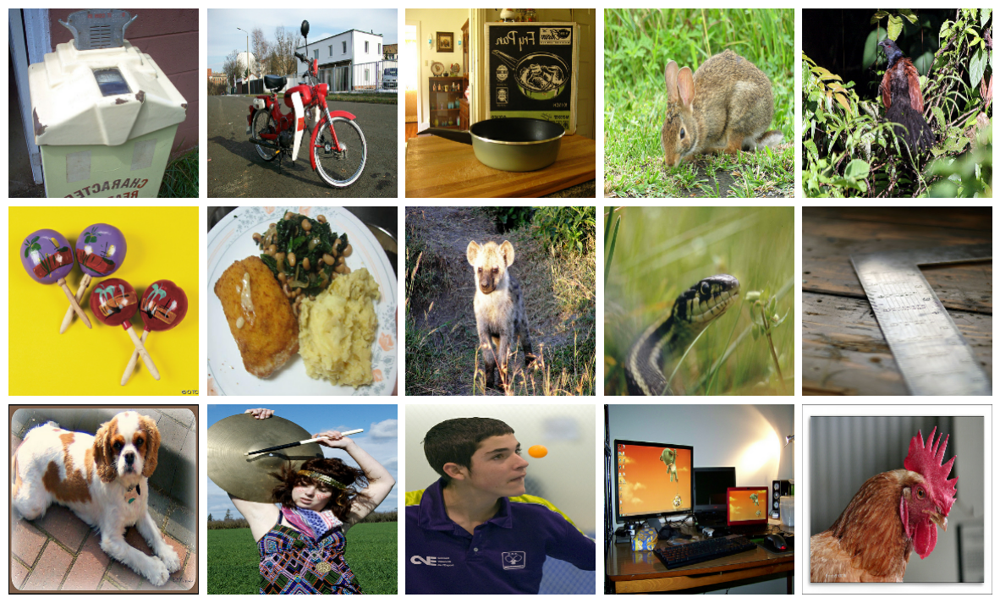

In [25]:
num_cols = 3
num_rows = 5
fig = plt.figure(figsize=(15, 15))
grid = axes_grid1.ImageGrid(fig, 111, nrows_ncols=(num_cols, num_rows), axes_pad=0.1)

for ax, im, label in zip(grid, x, y):
    ax.imshow(tf.cast(im, dtype=tf.uint8))
    ax.axis("off")

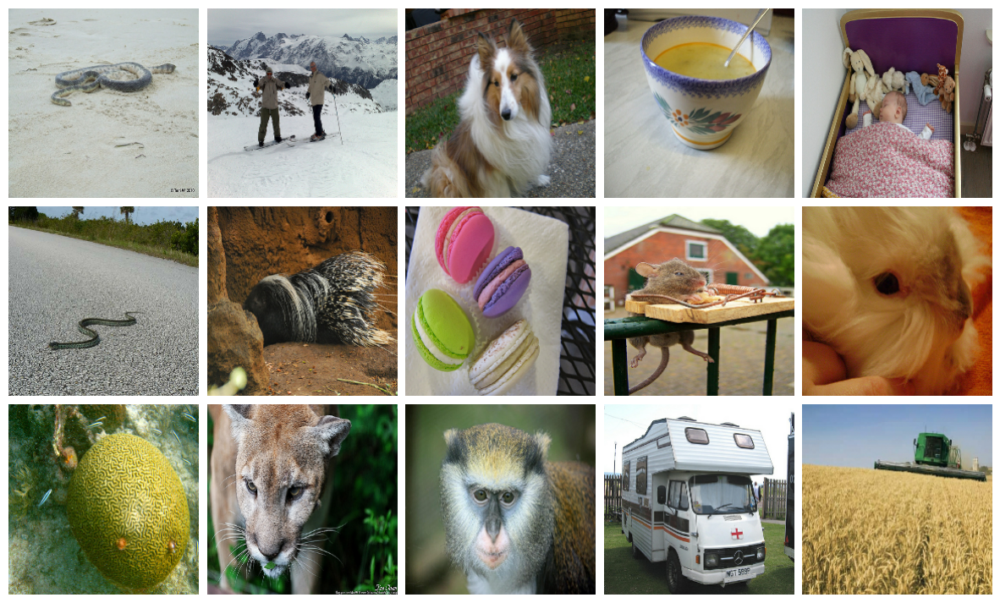

In [26]:
num_cols = 3
num_rows = 5
fig = plt.figure(figsize=(15, 15))
grid = axes_grid1.ImageGrid(fig, 111, nrows_ncols=(num_cols, num_rows), axes_pad=0.1)

for ax, im, label in zip(grid, v, w):
    ax.imshow(tf.cast(im, dtype=tf.uint8))
    ax.axis("off")

# Downstream Model

We will be using previously trained model. But we will first freeze whole model and unfreeze some layer from top for fine tuning the model fro downstream task. Also note, you may want to remove the last fully connected layer but you may not require it in this time. Because if you notice the last layer of the previous model, there is no activation function in the last layer. So, the we can use the model as it is in the following new downstream model.

In [27]:
# checking
for layer in model.layers:
    print(layer.name, layer.output_shape)

efficientnetb0 (None, 1000)


In [28]:
with strategy.scope():
    model.trainable = False
    
    for layer in model.layers[-100:]:
        if not isinstance(layer, keras.layers.BatchNormalization):
            layer.trainable = True
    
    downstream_model = keras.Sequential([
        keras.layers.InputLayer(input_shape=(None, None, 3)),
        model,
        keras.layers.Dense(len(np.unique(df.target)))
    ])
    
downstream_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-4), 
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['acc']
)

In [29]:
downstream_model.summary()

Model: "sequential_1"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 sequential (Sequential)     (None, 1000)              5330571   


 dense (Dense)               (None, 11)                11011     


Total params: 5,341,582


Trainable params: 11,011


Non-trainable params: 5,330,571


_________________________________________________________________


In [30]:
train_step = len(train_df) // batch_size
val_step = len(valid_df) // batch_size 
train_step, val_step

(62, 2)

In [31]:
history = downstream_model.fit(
    training_dataset,
    epochs=10,
    steps_per_epoch=train_step,
    validation_steps=val_step,
    validation_data=validation_dataset,
    verbose=1
)   

Epoch 1/10


 1/62 [..............................] - ETA: 27:57 - loss: 20.2758 - acc: 0.0454

 2/62 [..............................] - ETA: 5s - loss: 19.9134 - acc: 0.0439   

 3/62 [>.............................] - ETA: 19s - loss: 19.5256 - acc: 0.0439

 4/62 [>.............................] - ETA: 16s - loss: 19.1037 - acc: 0.0458

 5/62 [=>............................] - ETA: 19s - loss: 18.6819 - acc: 0.0470

 6/62 [=>............................] - ETA: 18s - loss: 18.2620 - acc: 0.0470

 7/62 [==>...........................] - ETA: 20s - loss: 17.8488 - acc: 0.0470

 8/62 [==>...........................] - ETA: 18s - loss: 17.4438 - acc: 0.0482

 9/62 [===>..........................] - ETA: 19s - loss: 17.0572 - acc: 0.0490

10/62 [===>..........................] - ETA: 18s - loss: 16.6761 - acc: 0.0498

11/62 [====>.........................] - ETA: 18s - loss: 16.3162 - acc: 0.0510

12/62 [====>.........................] - ETA: 18s - loss: 15.9225 - acc: 0.0540

13/62 [=====>........................] - ETA: 18s - loss: 15.5619 - acc: 0.0559

14/62 [=====>........................] - ETA: 17s - loss: 15.2133 - acc: 0.0587

15/62 [======>.......................] - ETA: 17s - loss: 14.8522 - acc: 0.0615

16/62 [======>.......................] - ETA: 17s - loss: 14.5238 - acc: 0.0645

17/62 [=======>......................] - ETA: 17s - loss: 14.1995 - acc: 0.0677

18/62 [=======>......................] - ETA: 16s - loss: 13.8893 - acc: 0.0713

19/62 [========>.....................] - ETA: 16s - loss: 13.5798 - acc: 0.0757

20/62 [========>.....................] - ETA: 16s - loss: 13.2880 - acc: 0.0797

21/62 [=========>....................] - ETA: 15s - loss: 13.0087 - acc: 0.0838

22/62 [=========>....................] - ETA: 15s - loss: 12.7381 - acc: 0.0887

23/62 [==========>...................] - ETA: 14s - loss: 12.4695 - acc: 0.0931

24/62 [==========>...................] - ETA: 14s - loss: 12.2176 - acc: 0.0975

25/62 [===========>..................] - ETA: 14s - loss: 11.9721 - acc: 0.1018

26/62 [===========>..................] - ETA: 13s - loss: 11.7415 - acc: 0.1058

27/62 [============>.................] - ETA: 13s - loss: 11.5189 - acc: 0.1100

28/62 [============>.................] - ETA: 13s - loss: 11.3051 - acc: 0.1137

29/62 [=============>................] - ETA: 13s - loss: 11.0978 - acc: 0.1177

30/62 [=============>................] - ETA: 12s - loss: 10.9047 - acc: 0.1212

31/62 [==============>...............] - ETA: 12s - loss: 10.7134 - acc: 0.1247

32/62 [==============>...............] - ETA: 11s - loss: 10.5343 - acc: 0.1283

33/62 [==============>...............] - ETA: 11s - loss: 10.3607 - acc: 0.1311

34/62 [===============>..............] - ETA: 11s - loss: 10.2000 - acc: 0.1340

35/62 [===============>..............] - ETA: 10s - loss: 10.0408 - acc: 0.1368

36/62 [================>.............] - ETA: 10s - loss: 9.8895 - acc: 0.1397 

37/62 [================>.............] - ETA: 10s - loss: 9.7484 - acc: 0.1426

38/62 [=================>............] - ETA: 9s - loss: 9.6116 - acc: 0.1452 

39/62 [=================>............] - ETA: 9s - loss: 9.4788 - acc: 0.1476

40/62 [==================>...........] - ETA: 8s - loss: 9.3502 - acc: 0.1502

41/62 [==================>...........] - ETA: 8s - loss: 9.2300 - acc: 0.1530

42/62 [===================>..........] - ETA: 8s - loss: 9.1115 - acc: 0.1556

43/62 [===================>..........] - ETA: 7s - loss: 8.9936 - acc: 0.1584

44/62 [====================>.........] - ETA: 7s - loss: 8.8822 - acc: 0.1612

45/62 [====================>.........] - ETA: 6s - loss: 8.7694 - acc: 0.1641

46/62 [=====================>........] - ETA: 6s - loss: 8.6664 - acc: 0.1672

47/62 [=====================>........] - ETA: 6s - loss: 8.5644 - acc: 0.1702

48/62 [======================>.......] - ETA: 5s - loss: 8.4674 - acc: 0.1730

49/62 [======================>.......] - ETA: 5s - loss: 8.3722 - acc: 0.1759

50/62 [=======================>......] - ETA: 4s - loss: 8.2797 - acc: 0.1787

51/62 [=======================>......] - ETA: 4s - loss: 8.1911 - acc: 0.1816

52/62 [========================>.....] - ETA: 4s - loss: 8.1058 - acc: 0.1846

53/62 [========================>.....] - ETA: 3s - loss: 8.0201 - acc: 0.1877

54/62 [=========================>....] - ETA: 3s - loss: 7.9341 - acc: 0.1911

55/62 [=========================>....] - ETA: 2s - loss: 7.8527 - acc: 0.1943

56/62 [==========================>...] - ETA: 2s - loss: 7.7763 - acc: 0.1972

57/62 [==========================>...] - ETA: 2s - loss: 7.6980 - acc: 0.2002

58/62 [===========================>..] - ETA: 1s - loss: 7.6217 - acc: 0.2034

59/62 [===========================>..] - ETA: 1s - loss: 7.5480 - acc: 0.2063

60/62 [============================>.] - ETA: 0s - loss: 7.4753 - acc: 0.2095

61/62 [============================>.] - ETA: 0s - loss: 7.4038 - acc: 0.2126

62/62 [==============================] - ETA: 0s - loss: 7.3326 - acc: 0.2159

62/62 [==============================] - 69s 682ms/step - loss: 7.3326 - acc: 0.2159 - val_loss: 3.0971 - val_acc: 0.3882


Epoch 2/10


 1/62 [..............................] - ETA: 5s - loss: 3.0310 - acc: 0.4248

 2/62 [..............................] - ETA: 36s - loss: 3.0919 - acc: 0.4148

 3/62 [>.............................] - ETA: 23s - loss: 3.0678 - acc: 0.4193

 4/62 [>.............................] - ETA: 27s - loss: 3.0378 - acc: 0.4204

 5/62 [=>............................] - ETA: 23s - loss: 3.0143 - acc: 0.4226

 6/62 [=>............................] - ETA: 24s - loss: 2.9778 - acc: 0.4248

 7/62 [==>...........................] - ETA: 22s - loss: 2.9537 - acc: 0.4277

 8/62 [==>...........................] - ETA: 23s - loss: 2.9350 - acc: 0.4312

 9/62 [===>..........................] - ETA: 21s - loss: 2.9159 - acc: 0.4340

10/62 [===>..........................] - ETA: 22s - loss: 2.9063 - acc: 0.4351

11/62 [====>.........................] - ETA: 20s - loss: 2.8940 - acc: 0.4356

12/62 [====>.........................] - ETA: 21s - loss: 2.8857 - acc: 0.4377

13/62 [=====>........................] - ETA: 19s - loss: 2.8794 - acc: 0.4399

14/62 [=====>........................] - ETA: 20s - loss: 2.8663 - acc: 0.4415

15/62 [======>.......................] - ETA: 18s - loss: 2.8481 - acc: 0.4443

16/62 [======>.......................] - ETA: 19s - loss: 2.8346 - acc: 0.4459

17/62 [=======>......................] - ETA: 18s - loss: 2.8185 - acc: 0.4477

18/62 [=======>......................] - ETA: 18s - loss: 2.8044 - acc: 0.4495

19/62 [========>.....................] - ETA: 17s - loss: 2.7895 - acc: 0.4524

20/62 [========>.....................] - ETA: 17s - loss: 2.7834 - acc: 0.4535

21/62 [=========>....................] - ETA: 16s - loss: 2.7674 - acc: 0.4562

22/62 [=========>....................] - ETA: 16s - loss: 2.7526 - acc: 0.4588

23/62 [==========>...................] - ETA: 15s - loss: 2.7396 - acc: 0.4616

24/62 [==========>...................] - ETA: 15s - loss: 2.7239 - acc: 0.4638

25/62 [===========>..................] - ETA: 14s - loss: 2.7116 - acc: 0.4656

26/62 [===========>..................] - ETA: 14s - loss: 2.6930 - acc: 0.4680

27/62 [============>.................] - ETA: 13s - loss: 2.6779 - acc: 0.4703

28/62 [============>.................] - ETA: 13s - loss: 2.6614 - acc: 0.4732

29/62 [=============>................] - ETA: 13s - loss: 2.6516 - acc: 0.4753

30/62 [=============>................] - ETA: 13s - loss: 2.6415 - acc: 0.4775

31/62 [==============>...............] - ETA: 12s - loss: 2.6285 - acc: 0.4799

32/62 [==============>...............] - ETA: 12s - loss: 2.6161 - acc: 0.4823

33/62 [==============>...............] - ETA: 11s - loss: 2.6081 - acc: 0.4836

34/62 [===============>..............] - ETA: 11s - loss: 2.5980 - acc: 0.4853

35/62 [===============>..............] - ETA: 10s - loss: 2.5871 - acc: 0.4872

36/62 [================>.............] - ETA: 10s - loss: 2.5748 - acc: 0.4891

37/62 [================>.............] - ETA: 9s - loss: 2.5662 - acc: 0.4909 

38/62 [=================>............] - ETA: 9s - loss: 2.5532 - acc: 0.4928

39/62 [=================>............] - ETA: 9s - loss: 2.5443 - acc: 0.4940

40/62 [==================>...........] - ETA: 8s - loss: 2.5357 - acc: 0.4956

41/62 [==================>...........] - ETA: 8s - loss: 2.5239 - acc: 0.4971

42/62 [===================>..........] - ETA: 7s - loss: 2.5148 - acc: 0.4985

43/62 [===================>..........] - ETA: 7s - loss: 2.5048 - acc: 0.5000

44/62 [====================>.........] - ETA: 7s - loss: 2.4930 - acc: 0.5018

45/62 [====================>.........] - ETA: 6s - loss: 2.4847 - acc: 0.5032

46/62 [=====================>........] - ETA: 6s - loss: 2.4767 - acc: 0.5045

47/62 [=====================>........] - ETA: 5s - loss: 2.4689 - acc: 0.5057

48/62 [======================>.......] - ETA: 5s - loss: 2.4605 - acc: 0.5073

49/62 [======================>.......] - ETA: 5s - loss: 2.4506 - acc: 0.5092

50/62 [=======================>......] - ETA: 4s - loss: 2.4439 - acc: 0.5104

51/62 [=======================>......] - ETA: 4s - loss: 2.4337 - acc: 0.5121

52/62 [========================>.....] - ETA: 4s - loss: 2.4250 - acc: 0.5139

53/62 [========================>.....] - ETA: 3s - loss: 2.4159 - acc: 0.5153

54/62 [=========================>....] - ETA: 3s - loss: 2.4067 - acc: 0.5169

55/62 [=========================>....] - ETA: 2s - loss: 2.4000 - acc: 0.5181

56/62 [==========================>...] - ETA: 2s - loss: 2.3936 - acc: 0.5192

57/62 [==========================>...] - ETA: 1s - loss: 2.3857 - acc: 0.5207

58/62 [===========================>..] - ETA: 1s - loss: 2.3768 - acc: 0.5221

59/62 [===========================>..] - ETA: 1s - loss: 2.3687 - acc: 0.5235

60/62 [============================>.] - ETA: 0s - loss: 2.3588 - acc: 0.5252

61/62 [============================>.] - ETA: 0s - loss: 2.3510 - acc: 0.5265

62/62 [==============================] - ETA: 0s - loss: 2.3422 - acc: 0.5277

62/62 [==============================] - 29s 469ms/step - loss: 2.3422 - acc: 0.5277 - val_loss: 1.7302 - val_acc: 0.6296


Epoch 3/10


 1/62 [..............................] - ETA: 5s - loss: 1.8135 - acc: 0.6138

 2/62 [..............................] - ETA: 35s - loss: 1.8655 - acc: 0.6101

 3/62 [>.............................] - ETA: 23s - loss: 1.8657 - acc: 0.6094

 4/62 [>.............................] - ETA: 26s - loss: 1.8495 - acc: 0.6140

 5/62 [=>............................] - ETA: 22s - loss: 1.8177 - acc: 0.6170

 6/62 [=>............................] - ETA: 24s - loss: 1.8178 - acc: 0.6178

 7/62 [==>...........................] - ETA: 21s - loss: 1.8031 - acc: 0.6205

 8/62 [==>...........................] - ETA: 22s - loss: 1.7806 - acc: 0.6240

 9/62 [===>..........................] - ETA: 20s - loss: 1.7665 - acc: 0.6262

10/62 [===>..........................] - ETA: 21s - loss: 1.7709 - acc: 0.6253

11/62 [====>.........................] - ETA: 20s - loss: 1.7683 - acc: 0.6262

12/62 [====>.........................] - ETA: 20s - loss: 1.7619 - acc: 0.6273

13/62 [=====>........................] - ETA: 19s - loss: 1.7594 - acc: 0.6279

14/62 [=====>........................] - ETA: 19s - loss: 1.7556 - acc: 0.6294

15/62 [======>.......................] - ETA: 18s - loss: 1.7479 - acc: 0.6308

16/62 [======>.......................] - ETA: 18s - loss: 1.7460 - acc: 0.6310

17/62 [=======>......................] - ETA: 18s - loss: 1.7501 - acc: 0.6308

18/62 [=======>......................] - ETA: 17s - loss: 1.7497 - acc: 0.6314

19/62 [========>.....................] - ETA: 17s - loss: 1.7484 - acc: 0.6320

20/62 [========>.....................] - ETA: 16s - loss: 1.7516 - acc: 0.6318

21/62 [=========>....................] - ETA: 16s - loss: 1.7558 - acc: 0.6319

22/62 [=========>....................] - ETA: 15s - loss: 1.7493 - acc: 0.6331

23/62 [==========>...................] - ETA: 15s - loss: 1.7474 - acc: 0.6335

24/62 [==========>...................] - ETA: 15s - loss: 1.7447 - acc: 0.6340

25/62 [===========>..................] - ETA: 14s - loss: 1.7395 - acc: 0.6347

26/62 [===========>..................] - ETA: 14s - loss: 1.7377 - acc: 0.6346

27/62 [============>.................] - ETA: 14s - loss: 1.7375 - acc: 0.6344

28/62 [============>.................] - ETA: 13s - loss: 1.7334 - acc: 0.6350

29/62 [=============>................] - ETA: 13s - loss: 1.7298 - acc: 0.6357

30/62 [=============>................] - ETA: 12s - loss: 1.7246 - acc: 0.6368

31/62 [==============>...............] - ETA: 12s - loss: 1.7181 - acc: 0.6375

32/62 [==============>...............] - ETA: 11s - loss: 1.7143 - acc: 0.6381

33/62 [==============>...............] - ETA: 11s - loss: 1.7130 - acc: 0.6380

34/62 [===============>..............] - ETA: 11s - loss: 1.7088 - acc: 0.6390

35/62 [===============>..............] - ETA: 10s - loss: 1.7083 - acc: 0.6392

36/62 [================>.............] - ETA: 10s - loss: 1.7047 - acc: 0.6396

37/62 [================>.............] - ETA: 10s - loss: 1.7005 - acc: 0.6403

38/62 [=================>............] - ETA: 9s - loss: 1.6979 - acc: 0.6408 

39/62 [=================>............] - ETA: 9s - loss: 1.6949 - acc: 0.6411

40/62 [==================>...........] - ETA: 8s - loss: 1.6931 - acc: 0.6413

41/62 [==================>...........] - ETA: 8s - loss: 1.6890 - acc: 0.6419

42/62 [===================>..........] - ETA: 8s - loss: 1.6828 - acc: 0.6428

43/62 [===================>..........] - ETA: 7s - loss: 1.6809 - acc: 0.6431

44/62 [====================>.........] - ETA: 7s - loss: 1.6795 - acc: 0.6433

45/62 [====================>.........] - ETA: 6s - loss: 1.6779 - acc: 0.6436

46/62 [=====================>........] - ETA: 6s - loss: 1.6765 - acc: 0.6437

47/62 [=====================>........] - ETA: 5s - loss: 1.6749 - acc: 0.6438

48/62 [======================>.......] - ETA: 5s - loss: 1.6703 - acc: 0.6444

49/62 [======================>.......] - ETA: 5s - loss: 1.6683 - acc: 0.6447

50/62 [=======================>......] - ETA: 4s - loss: 1.6646 - acc: 0.6452

51/62 [=======================>......] - ETA: 4s - loss: 1.6621 - acc: 0.6457

52/62 [========================>.....] - ETA: 4s - loss: 1.6579 - acc: 0.6461

53/62 [========================>.....] - ETA: 3s - loss: 1.6556 - acc: 0.6468

54/62 [=========================>....] - ETA: 3s - loss: 1.6542 - acc: 0.6474

55/62 [=========================>....] - ETA: 2s - loss: 1.6520 - acc: 0.6478

56/62 [==========================>...] - ETA: 2s - loss: 1.6499 - acc: 0.6484

57/62 [==========================>...] - ETA: 1s - loss: 1.6469 - acc: 0.6489

58/62 [===========================>..] - ETA: 1s - loss: 1.6435 - acc: 0.6494

59/62 [===========================>..] - ETA: 1s - loss: 1.6402 - acc: 0.6497

60/62 [============================>.] - ETA: 0s - loss: 1.6364 - acc: 0.6503

61/62 [============================>.] - ETA: 0s - loss: 1.6334 - acc: 0.6509

62/62 [==============================] - ETA: 0s - loss: 1.6313 - acc: 0.6513

62/62 [==============================] - 29s 471ms/step - loss: 1.6313 - acc: 0.6513 - val_loss: 1.3286 - val_acc: 0.7009


Epoch 4/10


 1/62 [..............................] - ETA: 5s - loss: 1.3790 - acc: 0.6919

 2/62 [..............................] - ETA: 35s - loss: 1.4357 - acc: 0.6855

 3/62 [>.............................] - ETA: 23s - loss: 1.4385 - acc: 0.6844

 4/62 [>.............................] - ETA: 27s - loss: 1.4307 - acc: 0.6842

 5/62 [=>............................] - ETA: 22s - loss: 1.4316 - acc: 0.6840

 6/62 [=>............................] - ETA: 25s - loss: 1.4218 - acc: 0.6827

 7/62 [==>...........................] - ETA: 21s - loss: 1.4274 - acc: 0.6824

 8/62 [==>...........................] - ETA: 22s - loss: 1.4147 - acc: 0.6851

 9/62 [===>..........................] - ETA: 20s - loss: 1.4233 - acc: 0.6850

10/62 [===>..........................] - ETA: 21s - loss: 1.4194 - acc: 0.6845

11/62 [====>.........................] - ETA: 20s - loss: 1.4177 - acc: 0.6853

12/62 [====>.........................] - ETA: 20s - loss: 1.4209 - acc: 0.6850

13/62 [=====>........................] - ETA: 19s - loss: 1.4085 - acc: 0.6869

14/62 [=====>........................] - ETA: 19s - loss: 1.4072 - acc: 0.6869

15/62 [======>.......................] - ETA: 18s - loss: 1.4046 - acc: 0.6872

16/62 [======>.......................] - ETA: 19s - loss: 1.4071 - acc: 0.6866

17/62 [=======>......................] - ETA: 17s - loss: 1.4006 - acc: 0.6866

18/62 [=======>......................] - ETA: 17s - loss: 1.3984 - acc: 0.6871

19/62 [========>.....................] - ETA: 17s - loss: 1.3985 - acc: 0.6869

20/62 [========>.....................] - ETA: 16s - loss: 1.3994 - acc: 0.6869

21/62 [=========>....................] - ETA: 16s - loss: 1.4022 - acc: 0.6866

22/62 [=========>....................] - ETA: 16s - loss: 1.4026 - acc: 0.6868

23/62 [==========>...................] - ETA: 15s - loss: 1.4031 - acc: 0.6876

24/62 [==========>...................] - ETA: 15s - loss: 1.3991 - acc: 0.6885

25/62 [===========>..................] - ETA: 15s - loss: 1.3986 - acc: 0.6887

26/62 [===========>..................] - ETA: 14s - loss: 1.3920 - acc: 0.6897

27/62 [============>.................] - ETA: 14s - loss: 1.3884 - acc: 0.6906

28/62 [============>.................] - ETA: 13s - loss: 1.3838 - acc: 0.6913

29/62 [=============>................] - ETA: 13s - loss: 1.3802 - acc: 0.6919

30/62 [=============>................] - ETA: 12s - loss: 1.3756 - acc: 0.6927

31/62 [==============>...............] - ETA: 12s - loss: 1.3728 - acc: 0.6928

32/62 [==============>...............] - ETA: 11s - loss: 1.3703 - acc: 0.6931

33/62 [==============>...............] - ETA: 11s - loss: 1.3686 - acc: 0.6935

34/62 [===============>..............] - ETA: 11s - loss: 1.3695 - acc: 0.6934

35/62 [===============>..............] - ETA: 10s - loss: 1.3664 - acc: 0.6940

36/62 [================>.............] - ETA: 10s - loss: 1.3657 - acc: 0.6939

37/62 [================>.............] - ETA: 9s - loss: 1.3627 - acc: 0.6943 

38/62 [=================>............] - ETA: 9s - loss: 1.3628 - acc: 0.6943

39/62 [=================>............] - ETA: 9s - loss: 1.3604 - acc: 0.6948

40/62 [==================>...........] - ETA: 8s - loss: 1.3590 - acc: 0.6947

41/62 [==================>...........] - ETA: 8s - loss: 1.3587 - acc: 0.6948

42/62 [===================>..........] - ETA: 7s - loss: 1.3602 - acc: 0.6946

43/62 [===================>..........] - ETA: 7s - loss: 1.3600 - acc: 0.6944

44/62 [====================>.........] - ETA: 7s - loss: 1.3587 - acc: 0.6947

45/62 [====================>.........] - ETA: 6s - loss: 1.3572 - acc: 0.6950

46/62 [=====================>........] - ETA: 6s - loss: 1.3557 - acc: 0.6952

47/62 [=====================>........] - ETA: 6s - loss: 1.3566 - acc: 0.6951

48/62 [======================>.......] - ETA: 5s - loss: 1.3553 - acc: 0.6950

49/62 [======================>.......] - ETA: 5s - loss: 1.3531 - acc: 0.6956

50/62 [=======================>......] - ETA: 4s - loss: 1.3515 - acc: 0.6958

51/62 [=======================>......] - ETA: 4s - loss: 1.3503 - acc: 0.6958

52/62 [========================>.....] - ETA: 3s - loss: 1.3484 - acc: 0.6962

53/62 [========================>.....] - ETA: 3s - loss: 1.3460 - acc: 0.6964

54/62 [=========================>....] - ETA: 3s - loss: 1.3448 - acc: 0.6966

55/62 [=========================>....] - ETA: 2s - loss: 1.3424 - acc: 0.6970

56/62 [==========================>...] - ETA: 2s - loss: 1.3412 - acc: 0.6972

57/62 [==========================>...] - ETA: 2s - loss: 1.3387 - acc: 0.6976

58/62 [===========================>..] - ETA: 1s - loss: 1.3373 - acc: 0.6979

59/62 [===========================>..] - ETA: 1s - loss: 1.3369 - acc: 0.6979

60/62 [============================>.] - ETA: 0s - loss: 1.3349 - acc: 0.6982

61/62 [============================>.] - ETA: 0s - loss: 1.3345 - acc: 0.6983

62/62 [==============================] - ETA: 0s - loss: 1.3336 - acc: 0.6984

62/62 [==============================] - 29s 468ms/step - loss: 1.3336 - acc: 0.6984 - val_loss: 1.1160 - val_acc: 0.7314


Epoch 5/10


 1/62 [..............................] - ETA: 5s - loss: 1.2546 - acc: 0.7197

 2/62 [..............................] - ETA: 30s - loss: 1.2229 - acc: 0.7227

 3/62 [>.............................] - ETA: 24s - loss: 1.2188 - acc: 0.7225

 4/62 [>.............................] - ETA: 26s - loss: 1.1895 - acc: 0.7277

 5/62 [=>............................] - ETA: 23s - loss: 1.1911 - acc: 0.7251

 6/62 [=>............................] - ETA: 24s - loss: 1.1853 - acc: 0.7249

 7/62 [==>...........................] - ETA: 23s - loss: 1.1759 - acc: 0.7265

 8/62 [==>...........................] - ETA: 21s - loss: 1.1805 - acc: 0.7260

 9/62 [===>..........................] - ETA: 22s - loss: 1.1835 - acc: 0.7255

10/62 [===>..........................] - ETA: 20s - loss: 1.1858 - acc: 0.7250

11/62 [====>.........................] - ETA: 21s - loss: 1.1872 - acc: 0.7245

12/62 [====>.........................] - ETA: 19s - loss: 1.1896 - acc: 0.7244

13/62 [=====>........................] - ETA: 20s - loss: 1.1910 - acc: 0.7243

14/62 [=====>........................] - ETA: 19s - loss: 1.1936 - acc: 0.7238

15/62 [======>.......................] - ETA: 19s - loss: 1.1928 - acc: 0.7243

16/62 [======>.......................] - ETA: 18s - loss: 1.1875 - acc: 0.7246

17/62 [=======>......................] - ETA: 18s - loss: 1.1813 - acc: 0.7249

18/62 [=======>......................] - ETA: 17s - loss: 1.1780 - acc: 0.7249

19/62 [========>.....................] - ETA: 17s - loss: 1.1785 - acc: 0.7247

20/62 [========>.....................] - ETA: 16s - loss: 1.1789 - acc: 0.7248

21/62 [=========>....................] - ETA: 16s - loss: 1.1826 - acc: 0.7240

22/62 [=========>....................] - ETA: 15s - loss: 1.1830 - acc: 0.7236

23/62 [==========>...................] - ETA: 15s - loss: 1.1808 - acc: 0.7244

24/62 [==========>...................] - ETA: 15s - loss: 1.1825 - acc: 0.7241

25/62 [===========>..................] - ETA: 15s - loss: 1.1792 - acc: 0.7247

26/62 [===========>..................] - ETA: 14s - loss: 1.1765 - acc: 0.7249

27/62 [============>.................] - ETA: 14s - loss: 1.1739 - acc: 0.7253

28/62 [============>.................] - ETA: 13s - loss: 1.1723 - acc: 0.7256

29/62 [=============>................] - ETA: 13s - loss: 1.1706 - acc: 0.7259

30/62 [=============>................] - ETA: 12s - loss: 1.1692 - acc: 0.7259

31/62 [==============>...............] - ETA: 12s - loss: 1.1664 - acc: 0.7262

32/62 [==============>...............] - ETA: 12s - loss: 1.1662 - acc: 0.7259

33/62 [==============>...............] - ETA: 11s - loss: 1.1675 - acc: 0.7262

34/62 [===============>..............] - ETA: 11s - loss: 1.1631 - acc: 0.7268

35/62 [===============>..............] - ETA: 10s - loss: 1.1662 - acc: 0.7263

36/62 [================>.............] - ETA: 10s - loss: 1.1659 - acc: 0.7265

37/62 [================>.............] - ETA: 10s - loss: 1.1638 - acc: 0.7266

38/62 [=================>............] - ETA: 9s - loss: 1.1634 - acc: 0.7267 

39/62 [=================>............] - ETA: 9s - loss: 1.1628 - acc: 0.7268

40/62 [==================>...........] - ETA: 8s - loss: 1.1627 - acc: 0.7269

41/62 [==================>...........] - ETA: 8s - loss: 1.1613 - acc: 0.7271

42/62 [===================>..........] - ETA: 7s - loss: 1.1633 - acc: 0.7270

43/62 [===================>..........] - ETA: 7s - loss: 1.1645 - acc: 0.7267

44/62 [====================>.........] - ETA: 7s - loss: 1.1640 - acc: 0.7270

45/62 [====================>.........] - ETA: 6s - loss: 1.1629 - acc: 0.7270

46/62 [=====================>........] - ETA: 6s - loss: 1.1616 - acc: 0.7273

47/62 [=====================>........] - ETA: 5s - loss: 1.1610 - acc: 0.7272

48/62 [======================>.......] - ETA: 5s - loss: 1.1595 - acc: 0.7272

49/62 [======================>.......] - ETA: 5s - loss: 1.1602 - acc: 0.7268

50/62 [=======================>......] - ETA: 4s - loss: 1.1593 - acc: 0.7270

51/62 [=======================>......] - ETA: 4s - loss: 1.1589 - acc: 0.7272

52/62 [========================>.....] - ETA: 3s - loss: 1.1582 - acc: 0.7274

53/62 [========================>.....] - ETA: 3s - loss: 1.1583 - acc: 0.7274

54/62 [=========================>....] - ETA: 3s - loss: 1.1561 - acc: 0.7279

55/62 [=========================>....] - ETA: 2s - loss: 1.1559 - acc: 0.7279

56/62 [==========================>...] - ETA: 2s - loss: 1.1549 - acc: 0.7280

57/62 [==========================>...] - ETA: 1s - loss: 1.1533 - acc: 0.7283

58/62 [===========================>..] - ETA: 1s - loss: 1.1536 - acc: 0.7283

59/62 [===========================>..] - ETA: 1s - loss: 1.1534 - acc: 0.7283

60/62 [============================>.] - ETA: 0s - loss: 1.1504 - acc: 0.7286

61/62 [============================>.] - ETA: 0s - loss: 1.1492 - acc: 0.7288

62/62 [==============================] - ETA: 0s - loss: 1.1494 - acc: 0.7289

62/62 [==============================] - 28s 461ms/step - loss: 1.1494 - acc: 0.7289 - val_loss: 0.9793 - val_acc: 0.7512


Epoch 6/10


 1/62 [..............................] - ETA: 5s - loss: 1.0726 - acc: 0.7476

 2/62 [..............................] - ETA: 36s - loss: 1.0789 - acc: 0.7424

 3/62 [>.............................] - ETA: 24s - loss: 1.0610 - acc: 0.7441

 4/62 [>.............................] - ETA: 27s - loss: 1.0767 - acc: 0.7422

 5/62 [=>............................] - ETA: 23s - loss: 1.0775 - acc: 0.7430

 6/62 [=>............................] - ETA: 25s - loss: 1.0918 - acc: 0.7403

 7/62 [==>...........................] - ETA: 22s - loss: 1.0926 - acc: 0.7396

 8/62 [==>...........................] - ETA: 23s - loss: 1.0781 - acc: 0.7432

 9/62 [===>..........................] - ETA: 21s - loss: 1.0758 - acc: 0.7430

10/62 [===>..........................] - ETA: 21s - loss: 1.0735 - acc: 0.7429

11/62 [====>.........................] - ETA: 20s - loss: 1.0723 - acc: 0.7432

12/62 [====>.........................] - ETA: 20s - loss: 1.0698 - acc: 0.7438

13/62 [=====>........................] - ETA: 19s - loss: 1.0657 - acc: 0.7440

14/62 [=====>........................] - ETA: 19s - loss: 1.0630 - acc: 0.7442

15/62 [======>.......................] - ETA: 18s - loss: 1.0611 - acc: 0.7446

16/62 [======>.......................] - ETA: 18s - loss: 1.0548 - acc: 0.7454

17/62 [=======>......................] - ETA: 17s - loss: 1.0578 - acc: 0.7447

18/62 [=======>......................] - ETA: 17s - loss: 1.0571 - acc: 0.7442

19/62 [========>.....................] - ETA: 17s - loss: 1.0554 - acc: 0.7443

20/62 [========>.....................] - ETA: 17s - loss: 1.0520 - acc: 0.7446

21/62 [=========>....................] - ETA: 16s - loss: 1.0519 - acc: 0.7447

22/62 [=========>....................] - ETA: 16s - loss: 1.0556 - acc: 0.7446

23/62 [==========>...................] - ETA: 15s - loss: 1.0587 - acc: 0.7439

24/62 [==========>...................] - ETA: 15s - loss: 1.0572 - acc: 0.7443

25/62 [===========>..................] - ETA: 14s - loss: 1.0572 - acc: 0.7442

26/62 [===========>..................] - ETA: 14s - loss: 1.0557 - acc: 0.7448

27/62 [============>.................] - ETA: 13s - loss: 1.0559 - acc: 0.7449

28/62 [============>.................] - ETA: 13s - loss: 1.0538 - acc: 0.7449

29/62 [=============>................] - ETA: 13s - loss: 1.0529 - acc: 0.7449

30/62 [=============>................] - ETA: 12s - loss: 1.0483 - acc: 0.7458

31/62 [==============>...............] - ETA: 12s - loss: 1.0481 - acc: 0.7457

32/62 [==============>...............] - ETA: 12s - loss: 1.0460 - acc: 0.7460

33/62 [==============>...............] - ETA: 11s - loss: 1.0445 - acc: 0.7462

34/62 [===============>..............] - ETA: 11s - loss: 1.0444 - acc: 0.7464

35/62 [===============>..............] - ETA: 10s - loss: 1.0416 - acc: 0.7471

36/62 [================>.............] - ETA: 10s - loss: 1.0396 - acc: 0.7472

37/62 [================>.............] - ETA: 9s - loss: 1.0397 - acc: 0.7470 

38/62 [=================>............] - ETA: 9s - loss: 1.0408 - acc: 0.7468

39/62 [=================>............] - ETA: 9s - loss: 1.0397 - acc: 0.7472

40/62 [==================>...........] - ETA: 8s - loss: 1.0416 - acc: 0.7468

41/62 [==================>...........] - ETA: 8s - loss: 1.0422 - acc: 0.7465

42/62 [===================>..........] - ETA: 8s - loss: 1.0413 - acc: 0.7465

43/62 [===================>..........] - ETA: 7s - loss: 1.0396 - acc: 0.7467

44/62 [====================>.........] - ETA: 7s - loss: 1.0405 - acc: 0.7464

45/62 [====================>.........] - ETA: 6s - loss: 1.0402 - acc: 0.7461

46/62 [=====================>........] - ETA: 6s - loss: 1.0393 - acc: 0.7463

47/62 [=====================>........] - ETA: 5s - loss: 1.0400 - acc: 0.7462

48/62 [======================>.......] - ETA: 5s - loss: 1.0401 - acc: 0.7462

49/62 [======================>.......] - ETA: 5s - loss: 1.0405 - acc: 0.7459

50/62 [=======================>......] - ETA: 4s - loss: 1.0408 - acc: 0.7459

51/62 [=======================>......] - ETA: 4s - loss: 1.0396 - acc: 0.7462

52/62 [========================>.....] - ETA: 4s - loss: 1.0388 - acc: 0.7463

53/62 [========================>.....] - ETA: 3s - loss: 1.0383 - acc: 0.7463

54/62 [=========================>....] - ETA: 3s - loss: 1.0379 - acc: 0.7462

55/62 [=========================>....] - ETA: 2s - loss: 1.0372 - acc: 0.7465

56/62 [==========================>...] - ETA: 2s - loss: 1.0356 - acc: 0.7467

57/62 [==========================>...] - ETA: 1s - loss: 1.0367 - acc: 0.7466

58/62 [===========================>..] - ETA: 1s - loss: 1.0343 - acc: 0.7468

59/62 [===========================>..] - ETA: 1s - loss: 1.0331 - acc: 0.7469

60/62 [============================>.] - ETA: 0s - loss: 1.0321 - acc: 0.7471

61/62 [============================>.] - ETA: 0s - loss: 1.0327 - acc: 0.7471

62/62 [==============================] - ETA: 0s - loss: 1.0327 - acc: 0.7471

62/62 [==============================] - 29s 466ms/step - loss: 1.0327 - acc: 0.7471 - val_loss: 0.8895 - val_acc: 0.7673


Epoch 7/10


 1/62 [..............................] - ETA: 5s - loss: 0.9910 - acc: 0.7524

 2/62 [..............................] - ETA: 35s - loss: 0.9793 - acc: 0.7539

 3/62 [>.............................] - ETA: 23s - loss: 0.9768 - acc: 0.7552

 4/62 [>.............................] - ETA: 27s - loss: 0.9900 - acc: 0.7576

 5/62 [=>............................] - ETA: 23s - loss: 0.9814 - acc: 0.7602

 6/62 [=>............................] - ETA: 24s - loss: 0.9736 - acc: 0.7607

 7/62 [==>...........................] - ETA: 23s - loss: 0.9672 - acc: 0.7623

 8/62 [==>...........................] - ETA: 21s - loss: 0.9655 - acc: 0.7617

 9/62 [===>..........................] - ETA: 22s - loss: 0.9622 - acc: 0.7618

10/62 [===>..........................] - ETA: 20s - loss: 0.9584 - acc: 0.7624

11/62 [====>.........................] - ETA: 21s - loss: 0.9592 - acc: 0.7618

12/62 [====>.........................] - ETA: 20s - loss: 0.9606 - acc: 0.7625

13/62 [=====>........................] - ETA: 20s - loss: 0.9623 - acc: 0.7614

14/62 [=====>........................] - ETA: 19s - loss: 0.9622 - acc: 0.7613

15/62 [======>.......................] - ETA: 19s - loss: 0.9592 - acc: 0.7614

16/62 [======>.......................] - ETA: 18s - loss: 0.9559 - acc: 0.7613

17/62 [=======>......................] - ETA: 18s - loss: 0.9565 - acc: 0.7615

18/62 [=======>......................] - ETA: 17s - loss: 0.9531 - acc: 0.7621

19/62 [========>.....................] - ETA: 17s - loss: 0.9520 - acc: 0.7621

20/62 [========>.....................] - ETA: 16s - loss: 0.9532 - acc: 0.7618

21/62 [=========>....................] - ETA: 16s - loss: 0.9551 - acc: 0.7614

22/62 [=========>....................] - ETA: 15s - loss: 0.9571 - acc: 0.7610

23/62 [==========>...................] - ETA: 15s - loss: 0.9580 - acc: 0.7610

24/62 [==========>...................] - ETA: 15s - loss: 0.9606 - acc: 0.7607

25/62 [===========>..................] - ETA: 14s - loss: 0.9560 - acc: 0.7615

26/62 [===========>..................] - ETA: 14s - loss: 0.9571 - acc: 0.7611

27/62 [============>.................] - ETA: 14s - loss: 0.9566 - acc: 0.7611

28/62 [============>.................] - ETA: 13s - loss: 0.9589 - acc: 0.7608

29/62 [=============>................] - ETA: 13s - loss: 0.9569 - acc: 0.7612

30/62 [=============>................] - ETA: 12s - loss: 0.9558 - acc: 0.7614

31/62 [==============>...............] - ETA: 12s - loss: 0.9534 - acc: 0.7619

32/62 [==============>...............] - ETA: 12s - loss: 0.9539 - acc: 0.7618

33/62 [==============>...............] - ETA: 11s - loss: 0.9520 - acc: 0.7623

34/62 [===============>..............] - ETA: 11s - loss: 0.9493 - acc: 0.7625

35/62 [===============>..............] - ETA: 10s - loss: 0.9499 - acc: 0.7625

36/62 [================>.............] - ETA: 10s - loss: 0.9505 - acc: 0.7625

37/62 [================>.............] - ETA: 9s - loss: 0.9496 - acc: 0.7625 

38/62 [=================>............] - ETA: 9s - loss: 0.9502 - acc: 0.7621

39/62 [=================>............] - ETA: 9s - loss: 0.9508 - acc: 0.7617

40/62 [==================>...........] - ETA: 8s - loss: 0.9527 - acc: 0.7615

41/62 [==================>...........] - ETA: 8s - loss: 0.9523 - acc: 0.7613

42/62 [===================>..........] - ETA: 8s - loss: 0.9526 - acc: 0.7614

43/62 [===================>..........] - ETA: 7s - loss: 0.9526 - acc: 0.7613

44/62 [====================>.........] - ETA: 7s - loss: 0.9516 - acc: 0.7614

45/62 [====================>.........] - ETA: 6s - loss: 0.9506 - acc: 0.7616

46/62 [=====================>........] - ETA: 6s - loss: 0.9510 - acc: 0.7613

47/62 [=====================>........] - ETA: 6s - loss: 0.9512 - acc: 0.7613

48/62 [======================>.......] - ETA: 5s - loss: 0.9509 - acc: 0.7614

49/62 [======================>.......] - ETA: 5s - loss: 0.9495 - acc: 0.7617

50/62 [=======================>......] - ETA: 4s - loss: 0.9484 - acc: 0.7619

51/62 [=======================>......] - ETA: 4s - loss: 0.9490 - acc: 0.7617

52/62 [========================>.....] - ETA: 3s - loss: 0.9484 - acc: 0.7617

53/62 [========================>.....] - ETA: 3s - loss: 0.9476 - acc: 0.7618

54/62 [=========================>....] - ETA: 3s - loss: 0.9476 - acc: 0.7618

55/62 [=========================>....] - ETA: 2s - loss: 0.9475 - acc: 0.7617

56/62 [==========================>...] - ETA: 2s - loss: 0.9478 - acc: 0.7616

57/62 [==========================>...] - ETA: 2s - loss: 0.9472 - acc: 0.7615

58/62 [===========================>..] - ETA: 1s - loss: 0.9470 - acc: 0.7617

59/62 [===========================>..] - ETA: 1s - loss: 0.9462 - acc: 0.7619

60/62 [============================>.] - ETA: 0s - loss: 0.9455 - acc: 0.7618

61/62 [============================>.] - ETA: 0s - loss: 0.9448 - acc: 0.7620

62/62 [==============================] - ETA: 0s - loss: 0.9440 - acc: 0.7622

62/62 [==============================] - 28s 466ms/step - loss: 0.9440 - acc: 0.7622 - val_loss: 0.8257 - val_acc: 0.7776


Epoch 8/10


 1/62 [..............................] - ETA: 5s - loss: 0.8722 - acc: 0.7769

 2/62 [..............................] - ETA: 32s - loss: 0.9121 - acc: 0.7742

 3/62 [>.............................] - ETA: 22s - loss: 0.9204 - acc: 0.7725

 4/62 [>.............................] - ETA: 26s - loss: 0.9214 - acc: 0.7704

 5/62 [=>............................] - ETA: 22s - loss: 0.9278 - acc: 0.7686

 6/62 [=>............................] - ETA: 24s - loss: 0.9161 - acc: 0.7708

 7/62 [==>...........................] - ETA: 22s - loss: 0.9222 - acc: 0.7698

 8/62 [==>...........................] - ETA: 23s - loss: 0.9150 - acc: 0.7704

 9/62 [===>..........................] - ETA: 21s - loss: 0.9047 - acc: 0.7719

10/62 [===>..........................] - ETA: 22s - loss: 0.9029 - acc: 0.7721

11/62 [====>.........................] - ETA: 20s - loss: 0.9052 - acc: 0.7725

12/62 [====>.........................] - ETA: 21s - loss: 0.9062 - acc: 0.7726

13/62 [=====>........................] - ETA: 19s - loss: 0.9050 - acc: 0.7727

14/62 [=====>........................] - ETA: 20s - loss: 0.9032 - acc: 0.7723

15/62 [======>.......................] - ETA: 18s - loss: 0.9029 - acc: 0.7715

16/62 [======>.......................] - ETA: 19s - loss: 0.9043 - acc: 0.7711

17/62 [=======>......................] - ETA: 18s - loss: 0.9018 - acc: 0.7719

18/62 [=======>......................] - ETA: 17s - loss: 0.8986 - acc: 0.7719

19/62 [========>.....................] - ETA: 17s - loss: 0.8952 - acc: 0.7727

20/62 [========>.....................] - ETA: 17s - loss: 0.8967 - acc: 0.7722

21/62 [=========>....................] - ETA: 16s - loss: 0.8985 - acc: 0.7712

22/62 [=========>....................] - ETA: 16s - loss: 0.9016 - acc: 0.7709

23/62 [==========>...................] - ETA: 15s - loss: 0.9017 - acc: 0.7707

24/62 [==========>...................] - ETA: 15s - loss: 0.9040 - acc: 0.7711

25/62 [===========>..................] - ETA: 14s - loss: 0.9029 - acc: 0.7712

26/62 [===========>..................] - ETA: 14s - loss: 0.9009 - acc: 0.7714

27/62 [============>.................] - ETA: 13s - loss: 0.9003 - acc: 0.7713

28/62 [============>.................] - ETA: 13s - loss: 0.8962 - acc: 0.7719

29/62 [=============>................] - ETA: 13s - loss: 0.8947 - acc: 0.7722

30/62 [=============>................] - ETA: 12s - loss: 0.8956 - acc: 0.7717

31/62 [==============>...............] - ETA: 12s - loss: 0.8960 - acc: 0.7717

32/62 [==============>...............] - ETA: 12s - loss: 0.8953 - acc: 0.7717

33/62 [==============>...............] - ETA: 11s - loss: 0.8956 - acc: 0.7715

34/62 [===============>..............] - ETA: 11s - loss: 0.8949 - acc: 0.7714

35/62 [===============>..............] - ETA: 10s - loss: 0.8943 - acc: 0.7716

36/62 [================>.............] - ETA: 10s - loss: 0.8935 - acc: 0.7717

37/62 [================>.............] - ETA: 9s - loss: 0.8930 - acc: 0.7716 

38/62 [=================>............] - ETA: 9s - loss: 0.8914 - acc: 0.7717

39/62 [=================>............] - ETA: 9s - loss: 0.8925 - acc: 0.7718

40/62 [==================>...........] - ETA: 8s - loss: 0.8924 - acc: 0.7718

41/62 [==================>...........] - ETA: 8s - loss: 0.8922 - acc: 0.7719

42/62 [===================>..........] - ETA: 7s - loss: 0.8917 - acc: 0.7721

43/62 [===================>..........] - ETA: 7s - loss: 0.8901 - acc: 0.7724

44/62 [====================>.........] - ETA: 7s - loss: 0.8908 - acc: 0.7722

45/62 [====================>.........] - ETA: 6s - loss: 0.8910 - acc: 0.7720

46/62 [=====================>........] - ETA: 6s - loss: 0.8910 - acc: 0.7720

47/62 [=====================>........] - ETA: 5s - loss: 0.8919 - acc: 0.7717

48/62 [======================>.......] - ETA: 5s - loss: 0.8912 - acc: 0.7717

49/62 [======================>.......] - ETA: 5s - loss: 0.8907 - acc: 0.7716

50/62 [=======================>......] - ETA: 4s - loss: 0.8901 - acc: 0.7716

51/62 [=======================>......] - ETA: 4s - loss: 0.8896 - acc: 0.7716

52/62 [========================>.....] - ETA: 3s - loss: 0.8903 - acc: 0.7714

53/62 [========================>.....] - ETA: 3s - loss: 0.8895 - acc: 0.7716

54/62 [=========================>....] - ETA: 3s - loss: 0.8885 - acc: 0.7716

55/62 [=========================>....] - ETA: 2s - loss: 0.8877 - acc: 0.7719

56/62 [==========================>...] - ETA: 2s - loss: 0.8883 - acc: 0.7718

57/62 [==========================>...] - ETA: 1s - loss: 0.8889 - acc: 0.7719

58/62 [===========================>..] - ETA: 1s - loss: 0.8880 - acc: 0.7719

59/62 [===========================>..] - ETA: 1s - loss: 0.8876 - acc: 0.7719

60/62 [============================>.] - ETA: 0s - loss: 0.8866 - acc: 0.7720

61/62 [============================>.] - ETA: 0s - loss: 0.8860 - acc: 0.7721

62/62 [==============================] - ETA: 0s - loss: 0.8853 - acc: 0.7722

62/62 [==============================] - 29s 466ms/step - loss: 0.8853 - acc: 0.7722 - val_loss: 0.7751 - val_acc: 0.7871


Epoch 9/10


 1/62 [..............................] - ETA: 5s - loss: 0.8357 - acc: 0.7812

 2/62 [..............................] - ETA: 35s - loss: 0.8073 - acc: 0.7893

 3/62 [>.............................] - ETA: 23s - loss: 0.8172 - acc: 0.7852

 4/62 [>.............................] - ETA: 27s - loss: 0.8353 - acc: 0.7830

 5/62 [=>............................] - ETA: 22s - loss: 0.8371 - acc: 0.7829

 6/62 [=>............................] - ETA: 24s - loss: 0.8472 - acc: 0.7811

 7/62 [==>...........................] - ETA: 21s - loss: 0.8473 - acc: 0.7810

 8/62 [==>...........................] - ETA: 23s - loss: 0.8508 - acc: 0.7803

 9/62 [===>..........................] - ETA: 21s - loss: 0.8482 - acc: 0.7797

10/62 [===>..........................] - ETA: 21s - loss: 0.8523 - acc: 0.7795

11/62 [====>.........................] - ETA: 20s - loss: 0.8533 - acc: 0.7785

12/62 [====>.........................] - ETA: 20s - loss: 0.8515 - acc: 0.7788

13/62 [=====>........................] - ETA: 19s - loss: 0.8482 - acc: 0.7790

14/62 [=====>........................] - ETA: 19s - loss: 0.8483 - acc: 0.7786

15/62 [======>.......................] - ETA: 19s - loss: 0.8469 - acc: 0.7790

16/62 [======>.......................] - ETA: 18s - loss: 0.8490 - acc: 0.7787

17/62 [=======>......................] - ETA: 18s - loss: 0.8451 - acc: 0.7792

18/62 [=======>......................] - ETA: 17s - loss: 0.8395 - acc: 0.7795

19/62 [========>.....................] - ETA: 17s - loss: 0.8361 - acc: 0.7802

20/62 [========>.....................] - ETA: 16s - loss: 0.8386 - acc: 0.7802

21/62 [=========>....................] - ETA: 16s - loss: 0.8388 - acc: 0.7805

22/62 [=========>....................] - ETA: 15s - loss: 0.8380 - acc: 0.7806

23/62 [==========>...................] - ETA: 15s - loss: 0.8393 - acc: 0.7808

24/62 [==========>...................] - ETA: 15s - loss: 0.8392 - acc: 0.7810

25/62 [===========>..................] - ETA: 14s - loss: 0.8409 - acc: 0.7804

26/62 [===========>..................] - ETA: 14s - loss: 0.8422 - acc: 0.7805

27/62 [============>.................] - ETA: 13s - loss: 0.8420 - acc: 0.7803

28/62 [============>.................] - ETA: 13s - loss: 0.8409 - acc: 0.7807

29/62 [=============>................] - ETA: 13s - loss: 0.8417 - acc: 0.7801

30/62 [=============>................] - ETA: 12s - loss: 0.8394 - acc: 0.7808

31/62 [==============>...............] - ETA: 12s - loss: 0.8389 - acc: 0.7809

32/62 [==============>...............] - ETA: 12s - loss: 0.8390 - acc: 0.7807

33/62 [==============>...............] - ETA: 11s - loss: 0.8376 - acc: 0.7808

34/62 [===============>..............] - ETA: 11s - loss: 0.8361 - acc: 0.7812

35/62 [===============>..............] - ETA: 10s - loss: 0.8343 - acc: 0.7812

36/62 [================>.............] - ETA: 10s - loss: 0.8340 - acc: 0.7814

37/62 [================>.............] - ETA: 9s - loss: 0.8340 - acc: 0.7812 

38/62 [=================>............] - ETA: 9s - loss: 0.8331 - acc: 0.7815

39/62 [=================>............] - ETA: 9s - loss: 0.8322 - acc: 0.7816

40/62 [==================>...........] - ETA: 8s - loss: 0.8316 - acc: 0.7818

41/62 [==================>...........] - ETA: 8s - loss: 0.8310 - acc: 0.7820

42/62 [===================>..........] - ETA: 7s - loss: 0.8325 - acc: 0.7816

43/62 [===================>..........] - ETA: 7s - loss: 0.8332 - acc: 0.7814

44/62 [====================>.........] - ETA: 7s - loss: 0.8325 - acc: 0.7812

45/62 [====================>.........] - ETA: 6s - loss: 0.8330 - acc: 0.7811

46/62 [=====================>........] - ETA: 6s - loss: 0.8331 - acc: 0.7811

47/62 [=====================>........] - ETA: 5s - loss: 0.8334 - acc: 0.7807

48/62 [======================>.......] - ETA: 5s - loss: 0.8340 - acc: 0.7804

49/62 [======================>.......] - ETA: 5s - loss: 0.8343 - acc: 0.7804

50/62 [=======================>......] - ETA: 4s - loss: 0.8340 - acc: 0.7802

51/62 [=======================>......] - ETA: 4s - loss: 0.8351 - acc: 0.7801

52/62 [========================>.....] - ETA: 3s - loss: 0.8344 - acc: 0.7803

53/62 [========================>.....] - ETA: 3s - loss: 0.8329 - acc: 0.7806

54/62 [=========================>....] - ETA: 3s - loss: 0.8324 - acc: 0.7807

55/62 [=========================>....] - ETA: 2s - loss: 0.8322 - acc: 0.7807

56/62 [==========================>...] - ETA: 2s - loss: 0.8334 - acc: 0.7803

57/62 [==========================>...] - ETA: 2s - loss: 0.8330 - acc: 0.7805

58/62 [===========================>..] - ETA: 1s - loss: 0.8325 - acc: 0.7806

59/62 [===========================>..] - ETA: 1s - loss: 0.8316 - acc: 0.7808

60/62 [============================>.] - ETA: 0s - loss: 0.8309 - acc: 0.7809

61/62 [============================>.] - ETA: 0s - loss: 0.8308 - acc: 0.7810

62/62 [==============================] - ETA: 0s - loss: 0.8301 - acc: 0.7811

62/62 [==============================] - 28s 464ms/step - loss: 0.8301 - acc: 0.7811 - val_loss: 0.7316 - val_acc: 0.7942


Epoch 10/10


 1/62 [..............................] - ETA: 5s - loss: 0.8249 - acc: 0.7837

 2/62 [..............................] - ETA: 34s - loss: 0.8023 - acc: 0.7900

 3/62 [>.............................] - ETA: 23s - loss: 0.7909 - acc: 0.7896

 4/62 [>.............................] - ETA: 26s - loss: 0.8045 - acc: 0.7881

 5/62 [=>............................] - ETA: 22s - loss: 0.8019 - acc: 0.7860

 6/62 [=>............................] - ETA: 24s - loss: 0.8062 - acc: 0.7855

 7/62 [==>...........................] - ETA: 21s - loss: 0.8084 - acc: 0.7862

 8/62 [==>...........................] - ETA: 22s - loss: 0.8032 - acc: 0.7868

 9/62 [===>..........................] - ETA: 21s - loss: 0.8086 - acc: 0.7857

10/62 [===>..........................] - ETA: 21s - loss: 0.7982 - acc: 0.7875

11/62 [====>.........................] - ETA: 20s - loss: 0.7964 - acc: 0.7879

12/62 [====>.........................] - ETA: 20s - loss: 0.8018 - acc: 0.7869

13/62 [=====>........................] - ETA: 20s - loss: 0.8019 - acc: 0.7865

14/62 [=====>........................] - ETA: 19s - loss: 0.8015 - acc: 0.7862

15/62 [======>.......................] - ETA: 19s - loss: 0.8035 - acc: 0.7852

16/62 [======>.......................] - ETA: 18s - loss: 0.8019 - acc: 0.7858

17/62 [=======>......................] - ETA: 18s - loss: 0.8017 - acc: 0.7861

18/62 [=======>......................] - ETA: 17s - loss: 0.7997 - acc: 0.7867

19/62 [========>.....................] - ETA: 17s - loss: 0.7994 - acc: 0.7874

20/62 [========>.....................] - ETA: 16s - loss: 0.7993 - acc: 0.7875

21/62 [=========>....................] - ETA: 16s - loss: 0.7985 - acc: 0.7872

22/62 [=========>....................] - ETA: 16s - loss: 0.7932 - acc: 0.7878

23/62 [==========>...................] - ETA: 15s - loss: 0.7914 - acc: 0.7879

24/62 [==========>...................] - ETA: 15s - loss: 0.7913 - acc: 0.7885

25/62 [===========>..................] - ETA: 14s - loss: 0.7903 - acc: 0.7886

26/62 [===========>..................] - ETA: 14s - loss: 0.7906 - acc: 0.7889

27/62 [============>.................] - ETA: 14s - loss: 0.7909 - acc: 0.7888

28/62 [============>.................] - ETA: 13s - loss: 0.7908 - acc: 0.7887

29/62 [=============>................] - ETA: 13s - loss: 0.7894 - acc: 0.7890

30/62 [=============>................] - ETA: 13s - loss: 0.7892 - acc: 0.7889

31/62 [==============>...............] - ETA: 12s - loss: 0.7901 - acc: 0.7888

32/62 [==============>...............] - ETA: 12s - loss: 0.7920 - acc: 0.7886

33/62 [==============>...............] - ETA: 11s - loss: 0.7911 - acc: 0.7889

34/62 [===============>..............] - ETA: 11s - loss: 0.7921 - acc: 0.7888

35/62 [===============>..............] - ETA: 10s - loss: 0.7935 - acc: 0.7886

36/62 [================>.............] - ETA: 10s - loss: 0.7929 - acc: 0.7887

37/62 [================>.............] - ETA: 10s - loss: 0.7932 - acc: 0.7886

38/62 [=================>............] - ETA: 9s - loss: 0.7921 - acc: 0.7888 

39/62 [=================>............] - ETA: 9s - loss: 0.7908 - acc: 0.7889

40/62 [==================>...........] - ETA: 8s - loss: 0.7908 - acc: 0.7888

41/62 [==================>...........] - ETA: 8s - loss: 0.7908 - acc: 0.7888

42/62 [===================>..........] - ETA: 8s - loss: 0.7908 - acc: 0.7890

43/62 [===================>..........] - ETA: 7s - loss: 0.7917 - acc: 0.7888

44/62 [====================>.........] - ETA: 7s - loss: 0.7902 - acc: 0.7892

45/62 [====================>.........] - ETA: 6s - loss: 0.7908 - acc: 0.7893

46/62 [=====================>........] - ETA: 6s - loss: 0.7899 - acc: 0.7898

47/62 [=====================>........] - ETA: 5s - loss: 0.7902 - acc: 0.7898

48/62 [======================>.......] - ETA: 5s - loss: 0.7904 - acc: 0.7896

49/62 [======================>.......] - ETA: 5s - loss: 0.7920 - acc: 0.7894

50/62 [=======================>......] - ETA: 4s - loss: 0.7925 - acc: 0.7892

51/62 [=======================>......] - ETA: 4s - loss: 0.7935 - acc: 0.7890

52/62 [========================>.....] - ETA: 4s - loss: 0.7937 - acc: 0.7889

53/62 [========================>.....] - ETA: 3s - loss: 0.7940 - acc: 0.7889

54/62 [=========================>....] - ETA: 3s - loss: 0.7933 - acc: 0.7890

55/62 [=========================>....] - ETA: 2s - loss: 0.7933 - acc: 0.7891

56/62 [==========================>...] - ETA: 2s - loss: 0.7933 - acc: 0.7893

57/62 [==========================>...] - ETA: 1s - loss: 0.7941 - acc: 0.7890

58/62 [===========================>..] - ETA: 1s - loss: 0.7942 - acc: 0.7890

59/62 [===========================>..] - ETA: 1s - loss: 0.7936 - acc: 0.7891

60/62 [============================>.] - ETA: 0s - loss: 0.7934 - acc: 0.7893

61/62 [============================>.] - ETA: 0s - loss: 0.7921 - acc: 0.7894

62/62 [==============================] - ETA: 0s - loss: 0.7920 - acc: 0.7894

62/62 [==============================] - 29s 468ms/step - loss: 0.7920 - acc: 0.7894 - val_loss: 0.6967 - val_acc: 0.8022


---

# Competition Specific Submission

This notebook is initially attached with [Google Universal Image Embedding](https://www.kaggle.com/competitions/google-universal-image-embedding/overview/evaluation) competitoin. In this competition, we need to construct the model into a specific way. Something like as follows:

```python
awesome_model = keras.Sequential(
    ...
    keras.layers.Dense(64, name='embedding')(output)
    keras.layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=-1), name='embedding_norm')
)

image = keras.layers.Input([None, None, 3], dtype=tf.uint8)
output = tf.cast(image, tf.float32)
output = tf.image.resize(output, image_shape)

output = awesome_model(output)
vision_model = keras.Model(inputs=[image], outputs=[output])
```